# Bitcoin Next Day Price Prediction Using ANN Models

This notebook is based off of data and models for predicting bitcoin price found in the journal article: 

**"Time-series forecasting of Bitcoin prices using high-dimensional features: a machine learning approach"**
https://link.springer.com/article/10.1007/s00521-020-05129-6

All data was retrieved from https://bitinfocharts.com using a web scraper found in the notebook, BTC_Data_Scraper. This scraper was originally created by https://github.com/heliphix/btc_data and I made a few small alterations to properly save the data on my machine.

bitinfocharts.com contains numerous metrics about bitcoin's blockchain, which is the freely accessible, open ledger network for bitcoin. The raw features data obtained are: Transactions, Block size, Sent from addresses, Difficulty, Average transaction value, Mining profitability, Sent BTC, Fee-to-reward ratio, Median transaction fee, Average transaction fee, Block time, Hashrate, Median transaction value, Active addresses, Top 100 to total.

From these features, multiple other features were derived by using WMA (weighted moving average), EMA (Exponential Moving Average), SMA (Simple Moving Average), RSI (Relative Strength Index), STD (Standard Deviation), VAR (Variance), TRIX (Triple Moving Exponential, and ROC (Rate of Change). All of these variations were used with different time windows of such as 7-day weighted moving average or 14-day rate of change, etc. 

This notebook accesses the saved CSV file for the raw and transformed data.

This notebook is broken into multiple sections:

    Importing and Scaling the Data
    Feature Selection through Feature Importance, Variance Inflation Factor, and Cross-Correlation Analysis
    Artificial Neural Network Models using features determined from the original journal article
    ANN Models using different Date Range Intervals for the data, along with grid search through hyperparameters
    ANN using the features from the Feature Selection section this notebook, iterating through the top 20 features
    Simple Benchmark Regression using the current price as the prediction for the next day price
    
    
### Importing and Scaling the Data:
As stated above, the data is from bitinfocharts.com and has raw features as well as transformed features. The data date range is from July 17, 2010 to October 10, 2021. The data is scaled using MinMaxScaler, range -1 to 1, for the feature analysis and selection portion.

### Feature Selection
The first analysis of features is using **Random Forest Regression Feature Importance**. This uses Random Forests for predicting regression values and assigns a value to the feature as to its average importance in determining the regression prediction. The higher the value of the feature, the more important. The highest scoring 100 features were kept from the 735 total original features.

The second analysis of features is **Variance Inflation Factor**. This expresses the amount of collinearity a feature has and the higher the VIF score the higher the collinearity of the feature. The 20 lowest VIF score features are selected from the subset of the 100 features analyzed by VIF.

The final analysis of features is a **Correlation Matrix** of features and the target (next_day_price). Using the correlation matrix, which measures how closely two data series follow each other in movement, I removed two highly correlated features from the subset of 20 VIF features. This left 18 features that score high on importance, have low collinearity and are not highly correlated to each other. 

### Artificial Neural Network Models using Journal Article Features
6 Artificial Neural Network Models were created. Each model had a different date range interval. The first three date ranges are from the journal article while the last three use date ranges with more current ending dates.

    ANN Model 1 used data from April 1, 2013 to July 19, 2016 (Interval 1) -from journal article
    ANN Model 2 used data from April 1, 2013 to April 1, 2017 (Interval 2) -from journal article
    ANN Model 3 used data from April 1, 2013 to December 31, 2019 (Interval 3) -from journal article
    ANN Model 4 used data from April 1, 2013 to September 1, 2021 (Interval 4)
    ANN Model 5 used data from April 1, 2015 to September 1, 2021 (Interval 5)
    ANN Model 6 used data from April 1, 2014 to September 1, 2021 (Interval 6)
    
Each of these models was given the same set of 10 features, which were determined from the journal article, and target (next_day_price), just different date ranges which is a parameter that may make a difference in the performance of the model.

Each model had 4 hidden layers, used batch size 64, and had early stopping after 100 epochs of no improvement of validation loss.

Then each model looped through a grid search of hyperparameters for tuning:
    
    Optimizers ['Adam', 'RMSprop']
    Neurons [200, 300, 400, 500, 600]
    Activation ['relu', 'elu']
    Learning Rate [0.01, 0.001, 0.0001]
    
The statistics for each run of the model were the R-squared, Mean Absolute Error, and Mean Absolute Percentage Error. The holdout R-squared was the main statistic for choosing a model, since it shows how close the residuals are to the regression line. Secondarily, the holdout MAPE was used to view how much percentage error there is from the predictions. 

The **holdout dataset** consisted of the final 30 days of data, which is also the most current data from the set.

#### Results from the ANN Models using hyperparameter tuning and different date ranges
The best holdout statistics for each date range interval are below.

**Interval 1:** 

    R-squared: 0.59
    MAPE: 4.00
    Model hyperparameters: Neurons = 200, Optimizer = RMSprop, Activation = relu, Learning Rate = 0.01
    
**Interval 2:**

    R-squared: 0.60
    MAPE: 3.82
    Model hyperparameters: Neurons = 600, Optimizer = Adam, Activation = relu, Learning Rate = 0.001
    
**Interval 3:**

    R-squared: 0.63
    MAPE: 3.76
    Model hyperparameters: Neurons = 300, Optimizer = RMSprop, Activation = relu, Learning Rate = 0.001
    
**Interval 4:**
    
    R-squared: 0.788
    MAPE: 2.82
    Model hyperparameters: Neurons = 300, Optimizer = RMSprop, Activation = relu, Learning Rate = 0.0001
    
**Interval 5:**

    R-squared: 0.753
    MAPE: 2.95
    Model hyperparameters: Neurons = 500, Optimizer = Adam, Activation = relu, Learning Rate = 0.001
    
**Interval 6:**

    R-squared: 0.794
    MAPE: 2.74
    Model hyperparameters: Neurons = 500, Optimizer = Adam, Activation = relu, Learning Rate = 0.001
    

### ANN Model using the Features from Feature Importance, VIF, and Correlation Matrix
Taking the top 20 features from the VIF analysis to iterate through in combination to compare the effect it has on the ANN model performance. Starting with the top 6 features and training an ANN model. Then adding the one more feature to the list of features and training the ANN model. After which, the holdout R-squared scores are compared and if the holdout R-squared score is better, then keep that feature in the list otherwise drop that feature.

**The ANN model consisted of hyperparameters that scored well in previous analysis: 4 hidden layers, 300 neurons per layer, 0.0001 learning rate, RMSprop optimizer, relu activation, and batch size 64.**

The list of features that created the best score:

    median_transaction_fee3momUSD
    fee_to_reward7momUSD
    top100cap30trx
    mining_profitability7rsi
    top100cap14mom
    price3wmaUSD
    price30smaUSD
    price30emaUSD
    hashrate30sma
    difficulty30sma
    price3rsiUSD
    confirmationtime7std
    
**The holdout statistics from these features through the model are:**

    R-squared: 0.893
    MAPE: 2.186


### Benchmark Statistics
A benchmark regression model for comparison was created. The model simply used the current price as the prediction for the next day price. The idea is to see how close would someone be to predicting the next day's price by simply stating the price today.

**Benchmark Stats:**

    R-squared: 0.888
    MAPE: 2.1828
    

### Concluding Analysis
The best model from this notebook is using ANN with 4 hidden layers, 300 neurons per layer, learning rate of 0.0001, optimizer of RMSprop, activation function of relu, 64 batch size, and using Interval 4 date range of April 1, 2013 to September 1, 2021.

The metrics from this model are only slightly better for the R-squared than the benchmark of using the current price as the next day prediction. And slightly worse for the MAPE score.

**ANN Model R-squared: 0.893 - Benchmark R-squared: 0.888**

**ANN Model MAPE: 2.1858 - Benchmark MAPE: 2.1828**

In [1]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import rcParams
import matplotlib.pyplot as plt
%matplotlib inline

import keras
from keras.models import Sequential 
from keras.layers import Dense, Dropout
from keras.wrappers.scikit_learn import KerasRegressor
from keras import losses
from keras.constraints import maxnorm
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, cross_validate
from sklearn.preprocessing import MinMaxScaler, RobustScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from keras.models import load_model
from keras.callbacks import *

import re

In [2]:
path = './785fdd6c-f171-4d7b-8fee-43af010fd31b/Merged_Unconverted_BTC_Data.csv'
full_df = pd.read_csv(path)

In [3]:
full_df.head()

,Unnamed: 0,Date,priceUSD,transactions,size,sentbyaddress,difficulty,hashrate,mining_profitability,sentinusdUSD,...,price3rsiUSD,price7rsiUSD,price14rsiUSD,price30rsiUSD,price90rsiUSD,price3rocUSD,price7rocUSD,price14rocUSD,price30rocUSD,price90rocUSD
0,0,2010/07/17,0.0495,235,649.653,390,181.543,2.775561e+09,154298.0,1193.0,...,0.000,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0
1,1,2010/07/18,0.0726,248,765.285,424,181.543,1.554461e+09,401834.0,2612.0,...,0.000,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0
2,2,2010/07/19,0.0859,354,756.040,553,181.543,1.551287e+09,481473.0,4047.0,...,0.000,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0
3,3,2010/07/20,0.0783,413,984.707,632,181.543,1.640430e+09,431831.0,2341.0,...,82.751,0.0,0.0,0.0,0.0,58.099,0.0,0.0,0.0,0.0
4,4,2010/07/21,0.0767,256,542.483,440,181.543,1.723493e+09,460783.0,2122.0,...,78.603,0.0,0.0,0.0,0.0,5.652,0.0,0.0,0.0,0.0


In [4]:
full_df.drop(columns=['Unnamed: 0'], axis=1, inplace=True)

In [5]:
# insert a column of random values to use as comparison during feature importance
full_df['random'] = np.random.random(size=len(full_df))
full_df.tail()

,Date,priceUSD,transactions,size,sentbyaddress,difficulty,hashrate,mining_profitability,sentinusdUSD,transactionfeesUSD,...,price7rsiUSD,price14rsiUSD,price30rsiUSD,price90rsiUSD,price3rocUSD,price7rocUSD,price14rocUSD,price30rocUSD,price90rocUSD,random
4099,2021/10/06,52731.0,267618,696073.0,488363,1.989305e+13,1.544660e+20,0.286,6.991315e+10,3.550,...,85.161,71.057,62.066,55.349,9.824,25.940,24.000,1.872,60.297,0.948847
4100,2021/10/07,54374.0,325734,854943.0,560697,1.989305e+13,1.258129e+20,0.393,5.696495e+10,4.498,...,87.675,73.867,63.984,56.124,13.039,25.692,23.385,8.755,63.959,0.465452
4101,2021/10/08,54422.0,279908,844820.0,475151,1.989305e+13,1.309637e+20,0.320,4.871631e+10,4.018,...,87.747,73.948,64.040,56.147,8.873,18.333,26.147,17.559,61.467,0.406456
4102,2021/10/09,54742.0,246039,707791.0,369119,1.989305e+13,1.341666e+20,0.389,2.574088e+10,3.268,...,88.270,74.505,64.413,56.298,3.813,14.458,28.594,17.963,61.983,0.167504
4103,2021/10/10,55138.0,211347,518114.0,229335,1.989305e+13,1.547325e+20,0.359,2.514802e+10,3.322,...,88.952,75.212,64.882,56.486,1.406,14.837,28.849,20.052,63.607,0.606035


In [6]:
# create a column of the next day price
full_df['next_day_price'] = full_df['priceUSD'].shift(-1)

# create a new order for the columns
new_columns = ['Date', 'priceUSD', 'next_day_price'] + list(full_df.columns[2:-1])

# reorganize the dataframe
full_df = full_df[new_columns]
full_df.head()

,Date,priceUSD,next_day_price,transactions,size,sentbyaddress,difficulty,hashrate,mining_profitability,sentinusdUSD,...,price7rsiUSD,price14rsiUSD,price30rsiUSD,price90rsiUSD,price3rocUSD,price7rocUSD,price14rocUSD,price30rocUSD,price90rocUSD,random
0,2010/07/17,0.0495,0.0726,235,649.653,390,181.543,2.775561e+09,154298.0,1193.0,...,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.326190
1,2010/07/18,0.0726,0.0859,248,765.285,424,181.543,1.554461e+09,401834.0,2612.0,...,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.193473
2,2010/07/19,0.0859,0.0783,354,756.040,553,181.543,1.551287e+09,481473.0,4047.0,...,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.659898
3,2010/07/20,0.0783,0.0767,413,984.707,632,181.543,1.640430e+09,431831.0,2341.0,...,0.0,0.0,0.0,0.0,58.099,0.0,0.0,0.0,0.0,0.982604
4,2010/07/21,0.0767,0.0649,256,542.483,440,181.543,1.723493e+09,460783.0,2122.0,...,0.0,0.0,0.0,0.0,5.652,0.0,0.0,0.0,0.0,0.680285


In [7]:
# drop the last row since it has a NaN from next_day_price
full_df = full_df.dropna()

# check that no NaNs in the dataframe, should return False
False in full_df.isna()

False

## Scale the Data

In [8]:
from sklearn.preprocessing import MinMaxScaler, RobustScaler
from sklearn.pipeline import Pipeline

estimators = [] # create a list for the scalers
estimators.append(['minmax', MinMaxScaler((-1, 1))])


# add the scalers to the Pipeline
scale = Pipeline(estimators, verbose=True)

In [9]:
scaled_df = scale.fit_transform(full_df.iloc[:, 3:])
scaled_df = pd.DataFrame(scaled_df, columns=full_df.columns[3:])
scaled_df.head()

[Pipeline] ............ (step 1 of 1) Processing minmax, total=   0.1s


,transactions,size,sentbyaddress,difficulty,hashrate,mining_profitability,sentinusdUSD,transactionfeesUSD,median_transaction_feeUSD,confirmationtime,...,price7rsiUSD,price14rsiUSD,price30rsiUSD,price90rsiUSD,price3rocUSD,price7rocUSD,price14rocUSD,price30rocUSD,price90rocUSD,random
0,-0.999417,-0.999345,-0.999551,-1.0,-1.0,-0.359059,-1.0,-1.000000,-1.0,-0.329467,...,-1.0,-1.0,-1.0,-1.0,-0.255509,-0.515601,-0.668476,-0.844407,-0.949709,-0.347508
1,-0.999364,-0.999113,-0.999458,-1.0,-1.0,0.669186,-1.0,-0.999992,-1.0,-0.325600,...,-1.0,-1.0,-1.0,-1.0,-0.255509,-0.515601,-0.668476,-0.844407,-0.949709,-0.613004
2,-0.998931,-0.999132,-0.999104,-1.0,-1.0,1.000000,-1.0,-0.999999,-1.0,-0.333333,...,-1.0,-1.0,-1.0,-1.0,-0.255509,-0.515601,-0.668476,-0.844407,-0.949709,0.320066
3,-0.998691,-0.998674,-0.998888,-1.0,-1.0,0.793791,-1.0,-1.000000,-1.0,-0.359111,...,-1.0,-1.0,-1.0,-1.0,0.565440,-0.515601,-0.668476,-0.844407,-0.949709,0.965629
4,-0.999331,-0.999560,-0.999414,-1.0,-1.0,0.914055,-1.0,-1.000000,-1.0,-0.439584,...,-1.0,-1.0,-1.0,-1.0,-0.175645,-0.515601,-0.668476,-0.844407,-0.949709,0.360849


In [10]:
# rename the dataframe X
X = scaled_df
X.shape

(4103, 736)

In [11]:
# create the target series
y = full_df['next_day_price']
y.shape

(4103,)

## Perform Random Forest Regression to Find Feature Importance

In [137]:
# import the Random Forest Regressor to be used for feature importance
from sklearn.ensemble import RandomForestRegressor

rf = RandomForestRegressor(n_estimators=100, n_jobs=-1, oob_score=True, bootstrap=True, random_state=42)
rf.fit(X, y)

RandomForestRegressor(n_jobs=-1, oob_score=True, random_state=42)

In [138]:
# gather the feature importances from the model
feat_importances = rf.feature_importances_
feat_importances.shape

(736,)

In [142]:
# create a Series for the importances
forest_importance = pd.Series(feat_importances, index=scaled_df.columns)
forest_importance = forest_importance.sort_values(ascending=False)

### Variance Inflation Factor
Check the VIF on the top 100 features based on importance, to find the best scoring in combination with Random Forest Importance

In [143]:
# select the top 100 feature names by importance
top_100 = forest_importance[:100].index

# filter only the top 100 features from X dataframe
X_100 = X[top_100]
X_100.head()

,price3wmaUSD,price90wmaUSD,price30smaUSD,transactionvalue90emaUSD,transactionvalue90wmaUSD,price3emaUSD,transactionvalue90smaUSD,price7smaUSD,price14emaUSD,price90emaUSD,...,fee_to_reward7momUSD,difficulty90mom,difficulty30trx,top100cap90ema,transactionfees90trxUSD,size90var,median_transaction_fee3momUSD,top100cap7std,transactionvalue90stdUSD,price3rocUSD
0,-1.000000,-1.0,-1.0,-1.0,-1.0,-1.000000,-1.0,-1.0,-1.0,-1.0,...,-0.017617,0.312189,-0.397326,0.065666,-0.679925,-0.999998,-0.027404,-0.954131,-1.0,-0.255509
1,-1.000000,-1.0,-1.0,-1.0,-1.0,-1.000000,-1.0,-1.0,-1.0,-1.0,...,-0.017617,0.312189,-0.266771,0.071800,-0.679925,-0.999998,-0.027404,-0.976727,-1.0,-0.255509
2,-0.999998,-1.0,-1.0,-1.0,-1.0,-0.999998,-1.0,-1.0,-1.0,-1.0,...,-0.017617,0.312189,-0.109238,0.077606,-0.679925,-0.999998,-0.027404,-0.982039,-1.0,-0.255509
3,-0.999997,-1.0,-1.0,-1.0,-1.0,-0.999998,-1.0,-1.0,-1.0,-1.0,...,-0.017617,0.312189,0.061303,0.083082,-0.679925,-0.999998,-0.027404,-0.982135,-1.0,0.565440
4,-0.999997,-1.0,-1.0,-1.0,-1.0,-0.999998,-1.0,-1.0,-1.0,-1.0,...,-0.017617,0.312189,0.232326,0.088559,-0.679925,-0.999998,-0.027404,-0.988122,-1.0,-0.175645


In [144]:
# perform VIF on X
vif = [variance_inflation_factor(X_100.values, i) for i in range(X_100.shape[1])]


In [145]:
# convert into a Series
vif = pd.Series(vif, index=X_100.columns)
sorted_vif = vif.sort_values(ascending=True)
sorted_vif

median_transaction_fee3momUSD    1.850018e+00
fee_to_reward7momUSD             2.003183e+00
top100cap30trx                   2.367698e+00
mining_profitability7rsi         2.634687e+00
top100cap14mom                   3.192018e+00
                                     ...     
difficulty30ema                  1.480357e+07
hashrate90ema                    2.185059e+07
difficulty14ema                  7.293285e+07
price14emaUSD                    8.999692e+07
price7emaUSD                     1.285306e+08
Length: 100, dtype: float64

## Correlation Matrix for Top 20 Features from VIF

In [146]:
# filter only the top 20 VIF valued features
top_20_feat = list(sorted_vif[:20].index)
top_20_feat

['median_transaction_fee3momUSD',
 'fee_to_reward7momUSD',
 'top100cap30trx',
 'mining_profitability7rsi',
 'top100cap14mom',
 'price90rsiUSD',
 'sentinusd14momUSD',
 'price3rsiUSD',
 'price7rsiUSD',
 'transactionvalue30trxUSD',
 'confirmationtime7std',
 'top100cap90ema',
 'price3rocUSD',
 'price3trxUSD',
 'transactionfees90trxUSD',
 'mediantransactionvalue14trxUSD',
 'difficulty30trx',
 'activeaddresses30sma',
 'top100cap7trx',
 'fee_to_reward30varUSD']

In [147]:
# filter the scaled_df with the top_20_feat
top_20_df = scaled_df[top_20_feat]
top_20_df.head()


,median_transaction_fee3momUSD,fee_to_reward7momUSD,top100cap30trx,mining_profitability7rsi,top100cap14mom,price90rsiUSD,sentinusd14momUSD,price3rsiUSD,price7rsiUSD,transactionvalue30trxUSD,confirmationtime7std,top100cap90ema,price3rocUSD,price3trxUSD,transactionfees90trxUSD,mediantransactionvalue14trxUSD,difficulty30trx,activeaddresses30sma,top100cap7trx,fee_to_reward30varUSD
0,-0.027404,-0.017617,1.000000,-1.0,-0.002235,-1.0,0.049669,-1.000000,-1.0,-0.537736,0.364204,0.065666,-0.255509,-0.294878,-0.679925,-0.554032,-0.397326,-0.999406,0.381309,-1.0
1,-0.027404,-0.017617,0.978523,-1.0,-0.013720,-1.0,0.049669,-1.000000,-1.0,-0.537736,0.404686,0.071800,-0.255509,-0.294878,-0.679925,-0.554032,-0.266771,-0.999362,0.379810,-1.0
2,-0.027404,-0.017617,0.957047,-1.0,-0.021553,-1.0,0.049669,-1.000000,-1.0,-0.537736,0.525856,0.077606,-0.255509,-0.294878,-0.679925,-0.554032,-0.109238,-0.999322,0.379060,-1.0
3,-0.027404,-0.017617,0.935570,-1.0,-0.023571,-1.0,0.049669,0.655086,-1.0,-0.537736,0.467905,0.083082,0.565440,-0.294878,-0.679925,-0.554032,0.061303,-0.999282,0.377811,-1.0
4,-0.027404,-0.017617,0.914094,-1.0,-0.026791,-1.0,0.049669,0.572123,-1.0,-0.537736,0.282129,0.088559,-0.175645,-0.294878,-0.679925,-0.554032,0.232326,-0.999251,0.377311,-1.0


In [148]:
# add the next_day_price to the df
next_day_price = full_df.loc[:, ('next_day_price')]
top_20_df.loc[:, ['next_day_price']] = next_day_price
top_20_df.head()

C:\Users\dagar\anaconda3\envs\nn37\lib\site-packages\pandas\core\indexing.py:1773: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(ilocs[0], value, pi)


,median_transaction_fee3momUSD,fee_to_reward7momUSD,top100cap30trx,mining_profitability7rsi,top100cap14mom,price90rsiUSD,sentinusd14momUSD,price3rsiUSD,price7rsiUSD,transactionvalue30trxUSD,...,top100cap90ema,price3rocUSD,price3trxUSD,transactionfees90trxUSD,mediantransactionvalue14trxUSD,difficulty30trx,activeaddresses30sma,top100cap7trx,fee_to_reward30varUSD,next_day_price
0,-0.027404,-0.017617,1.000000,-1.0,-0.002235,-1.0,0.049669,-1.000000,-1.0,-0.537736,...,0.065666,-0.255509,-0.294878,-0.679925,-0.554032,-0.397326,-0.999406,0.381309,-1.0,0.0726
1,-0.027404,-0.017617,0.978523,-1.0,-0.013720,-1.0,0.049669,-1.000000,-1.0,-0.537736,...,0.071800,-0.255509,-0.294878,-0.679925,-0.554032,-0.266771,-0.999362,0.379810,-1.0,0.0859
2,-0.027404,-0.017617,0.957047,-1.0,-0.021553,-1.0,0.049669,-1.000000,-1.0,-0.537736,...,0.077606,-0.255509,-0.294878,-0.679925,-0.554032,-0.109238,-0.999322,0.379060,-1.0,0.0783
3,-0.027404,-0.017617,0.935570,-1.0,-0.023571,-1.0,0.049669,0.655086,-1.0,-0.537736,...,0.083082,0.565440,-0.294878,-0.679925,-0.554032,0.061303,-0.999282,0.377811,-1.0,0.0767
4,-0.027404,-0.017617,0.914094,-1.0,-0.026791,-1.0,0.049669,0.572123,-1.0,-0.537736,...,0.088559,-0.175645,-0.294878,-0.679925,-0.554032,0.232326,-0.999251,0.377311,-1.0,0.0649


In [149]:
# reorder the columns for next_day_price to be first
new_cols = ['next_day_price'] + list(top_20_df.columns[:-1])
top_20_df = top_20_df[new_cols]

In [150]:
correlations = top_20_df.corr()
correlations.head()

,next_day_price,median_transaction_fee3momUSD,fee_to_reward7momUSD,top100cap30trx,mining_profitability7rsi,top100cap14mom,price90rsiUSD,sentinusd14momUSD,price3rsiUSD,price7rsiUSD,...,confirmationtime7std,top100cap90ema,price3rocUSD,price3trxUSD,transactionfees90trxUSD,mediantransactionvalue14trxUSD,difficulty30trx,activeaddresses30sma,top100cap7trx,fee_to_reward30varUSD
next_day_price,1.000000,0.007653,-0.019959,0.138163,0.093656,0.029324,0.093348,0.052429,0.004362,0.003273,...,0.046123,-0.521175,-0.010138,-0.005902,0.044823,-0.012469,-0.268987,0.672863,0.046448,0.334208
median_transaction_fee3momUSD,0.007653,1.000000,0.476590,-0.021845,0.155309,0.032329,0.045814,0.063151,0.070232,0.084165,...,0.052904,-0.004591,0.076352,0.087170,-0.026487,0.041145,-0.005798,-0.001719,-0.010007,-0.090340
fee_to_reward7momUSD,-0.019959,0.476590,1.000000,-0.042529,0.120584,0.057462,0.034495,0.067575,0.035468,0.073380,...,0.168273,-0.001430,0.014434,0.036892,-0.054662,0.089688,-0.006419,-0.008864,-0.012274,-0.087830
top100cap30trx,0.138163,-0.021845,-0.042529,1.000000,-0.109492,0.061616,-0.101413,-0.025627,-0.013304,-0.027754,...,0.043330,0.045333,0.008225,-0.004603,0.089238,0.081462,0.328794,0.045303,0.135718,0.080015
mining_profitability7rsi,0.093656,0.155309,0.120584,-0.109492,1.000000,0.018144,0.330631,0.032882,0.511118,0.599956,...,-0.064446,-0.076002,0.505381,0.622962,0.021832,0.240633,-0.203591,0.101933,0.003495,0.035096


### Correlation of Features with Next Day Price

In [151]:
# take just the correlations with the next day price
next_day_price_corr = correlations.iloc[0].sort_values(ascending=False)
next_day_price_corr

next_day_price                    1.000000
activeaddresses30sma              0.672863
fee_to_reward30varUSD             0.334208
top100cap30trx                    0.138163
mining_profitability7rsi          0.093656
price90rsiUSD                     0.093348
transactionvalue30trxUSD          0.075296
sentinusd14momUSD                 0.052429
top100cap7trx                     0.046448
confirmationtime7std              0.046123
transactionfees90trxUSD           0.044823
top100cap14mom                    0.029324
median_transaction_fee3momUSD     0.007653
price3rsiUSD                      0.004362
price7rsiUSD                      0.003273
price3trxUSD                     -0.005902
price3rocUSD                     -0.010138
mediantransactionvalue14trxUSD   -0.012469
fee_to_reward7momUSD             -0.019959
difficulty30trx                  -0.268987
top100cap90ema                   -0.521175
Name: next_day_price, dtype: float64

### Correlation Matrix with all 20 Features

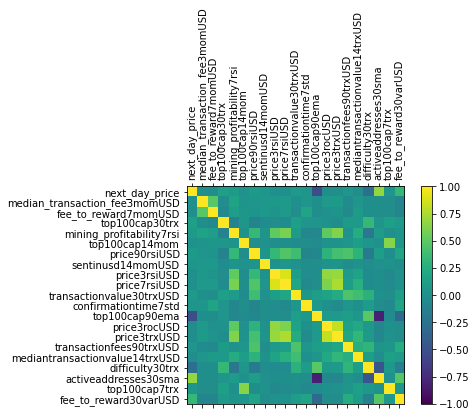

In [152]:
fig = plt.figure()
ax = fig.add_subplot(111)
cax = ax.matshow(correlations, vmin=-1, vmax=1)
fig.colorbar(cax)
ticks = np.arange(0, correlations.shape[0], 1)
ax.set_xticks(ticks)
ax.set_yticks(ticks)
ax.set_xticklabels(correlations.index, rotation='vertical')
ax.set_yticklabels(correlations.index)
plt.rcParams["figure.figsize"] = (10,10)
plt.show()

### Remove high cross-correlated features

In [153]:
# create a correlation function to find highly correlated features
def correlation(dataset, threshold):
    col_corr = dict() # create a dictionary for storing name and count
    corr_matrix = dataset.corr()
    # iterate through each row and column
    for i in range(len(corr_matrix.columns)):
        row_list = list()
        for j in range(i):
            if corr_matrix.iloc[i, j] > threshold:
                colname = corr_matrix.columns[i] # retrieve the column name
                rowname = corr_matrix.columns[j] # retrieve the row name
                row_list.append(rowname) # append the rowname to list 
                col_corr[colname] = row_list # set the list to the column name
                    
    return col_corr

In [154]:
# remove the next_day_price from the features to be cross correlated
feat_df = top_20_df.drop(columns=['next_day_price'])

#sanity check
'next_day_price' in feat_df.columns


False

In [155]:
high_corr = correlation(feat_df, 0.75)
len(high_corr)

2

In [156]:
# which features are cross correlated with each other
for k,v in high_corr.items():
    print(k, v)

price7rsiUSD ['price3rsiUSD']
price3trxUSD ['price7rsiUSD', 'price3rocUSD']


#### This shows that many only price7rsiUSD, price3trxUSD, price3rsiUSD, and price3rocUSD are highly correlated. 

Removing price3trxUSD and price7rsiUSD should remove the most cross-correlation

### Create a DataFrame without the cross-correlated features

In [157]:
# create a list of the features that have high influence and low cross correlation
best_cols = list(top_20_df.drop(columns=['price3trxUSD', 'price7rsiUSD']).columns)

# add date to the list of columns
final_cols = ['Date']
for name in best_cols:
    final_cols.append(name)

# filter only the desired columns for a dataframe with raw data values
final_df = full_df[final_cols]
final_df.head()

,Date,next_day_price,median_transaction_fee3momUSD,fee_to_reward7momUSD,top100cap30trx,mining_profitability7rsi,top100cap14mom,price90rsiUSD,sentinusd14momUSD,price3rsiUSD,...,transactionvalue30trxUSD,confirmationtime7std,top100cap90ema,price3rocUSD,transactionfees90trxUSD,mediantransactionvalue14trxUSD,difficulty30trx,activeaddresses30sma,top100cap7trx,fee_to_reward30varUSD
0,2010/07/17,0.0726,0.0,0.0,0.316,0.0,-0.088,0.0,0.0,0.000,...,0.0,5.263,23.223,0.000,0.0,0.0,1.745,848.133,-0.066,0.0
1,2010/07/18,0.0859,0.0,0.0,0.308,0.0,-0.327,0.0,0.0,0.000,...,0.0,5.409,23.279,0.000,0.0,0.0,2.287,869.567,-0.072,0.0
2,2010/07/19,0.0783,0.0,0.0,0.300,0.0,-0.490,0.0,0.0,0.000,...,0.0,5.846,23.332,0.000,0.0,0.0,2.941,889.333,-0.075,0.0
3,2010/07/20,0.0767,0.0,0.0,0.292,0.0,-0.532,0.0,0.0,82.751,...,0.0,5.637,23.382,58.099,0.0,0.0,3.649,909.267,-0.080,0.0
4,2010/07/21,0.0649,0.0,0.0,0.284,0.0,-0.599,0.0,0.0,78.603,...,0.0,4.967,23.432,5.652,0.0,0.0,4.359,924.700,-0.082,0.0


# Test Data on ANN Model

In [ ]:
# create a 3 hidden layer model function for testing hyperparameters

def interval1_ann_model_nextday(X, y, lr=0.08, neurons=128, activation='relu', opt='Adam', batch_size=64, epochs=5000):
    ''' 
        X is a dataframe of the dates and features using non-standardized values
        The Date column must be the first column in the X dataframe
        y is a dataframe or 1D array of the target values
    '''
    # assign the string values to variables for file naming later in the Checkpoint
    opt_name = opt
    acti = activation
    # remove the . in the learning rate
    learn_rt = re.sub('\.', '-', str(lr))
    
    # create a holdout series of the last 30 days of data
    X_holdout = X.iloc[-30:, 1:] # exclude the first column which is the date column
    y_holdout = y[-30:]
    
    # extract the data from the dates of Interval 2
    date_bool = (X.iloc[:, 0] >= '2013/04/01') & (X.iloc[:, 0] <= '2017/04/01')
    X = X[date_bool]
    # remove the date column
    X = X.iloc[:, 1:]
    # adjust the range of y df
    y = y[X.index]
    
    # create train test split of data
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=15)
    
    # scale the data
    estimators = [] # create a list for the scalers
    estimators.append(['minmax', MinMaxScaler()])
    estimators.append(['robust', RobustScaler()])
    # add the scalers to the Pipeline
    scale = Pipeline(estimators, verbose=True)
    # fit the scaler to the training data
    scale.fit(X_train)
    # transform the training, testing, and holdout data
    X_train = scale.transform(X_train)
    X_test = scale.transform(X_test)
    X_holdout = scale.transform(X_holdout)
    
#     # select an optimizer
#     if opt == 'Adam':
#         opt = tf.keras.optimizers.Adam(learning_rate=lr)
#     elif opt == 'RMSProp':
#         opt = tf.keras.optimizers.RMSprop(learning_rate=lr)
#     elif opt == 'Adagrad':
#         opt = tf.keras.optimizers.Adagrad(learning_rate=lr)
        
    # define the shape of the input number of features
    shape = X_train.shape[1]
    
    # create call backs to save the model after each epoch if it is the best seen so far
    # and for early stopping when model has not improved after 100 epochs
    mcp_save = ModelCheckpoint('trained_models/ANN4_reg_nextday' + str(neurons)+ opt_name + str(learn_rt)+ acti +str(batch_size)+'Int1.hdf5', save_best_only=True, monitor='val_loss', mode='auto')
    earlyStopping = EarlyStopping(monitor='val_loss', patience=100, verbose=1, mode='auto')
        
    # create a special definition for the ANN model to adjust hyperparameters
    def seq_model(initializer='normal', activation=activation, neurons=neurons, NUM_FEATURES=shape, opt=opt, lr=lr):
        # create model
        model = Sequential()
        model.add(Dense(neurons, input_shape=(NUM_FEATURES,), kernel_initializer=initializer, activation=activation))
        model.add(Dense(neurons, activation=activation))
        model.add(Dense(neurons, activation=activation))
        model.add(Dense(1, activation=activation, kernel_initializer=initializer))
        # Compile model
        # select an optimizer
        if opt == 'Adam':
            opt = tf.keras.optimizers.Adam(learning_rate=lr)
        elif opt == 'RMSprop':
            opt = tf.keras.optimizers.RMSprop(learning_rate=lr)
        elif opt == 'Adagrad':
            opt = tf.keras.optimizers.Adagrad(learning_rate=lr)
        
        model.compile(loss='logcosh', optimizer=opt, metrics=['mae'])
        return model
        
    # define the 4 Dense layer model
    ann_model = seq_model(activation=activation, neurons=neurons, NUM_FEATURES=shape)
    

    # create the regressor
    regressor=KerasRegressor(build_fn=seq_model, batch_size=batch_size, epochs=epochs, verbose=0, shuffle=True,
                         validation_split=0.1, validation_freq=1,
                        use_multiprocessing=True, callbacks=[mcp_save,earlyStopping])
    
    # fit the model on training data
    regressor.fit(X_train, y_train)
    
    # use training data for predictions
    y_train_pred = regressor.predict(X_train)
    # calculate R-squared score for train data
    r2 = r2_score(y_train, y_train_pred)
    print('Training R-Squared:', r2)
    
    # use testing data for predictions
    y_test_pred = regressor.predict(X_test)
    # calculate R-squared score for test data
    r2 = r2_score(y_test, y_test_pred)
    print('\nTesting R-Squared:', r2)
    
    # use holdout data for predictions
    y_holdout_pred = regressor.predict(X_holdout)
    # calculate R-squared score for holdout data
    r2 = r2_score(y_holdout, y_holdout_pred)
    print('\n30day Holdout R-Squared:', r2)
    # calculate mean absolute error for holdout data
    mae = mean_absolute_error(y_holdout, y_holdout_pred)
    print('\n30day Holdout MAE:', mae)
    # calculate mean absolute percentage error for holdout data
    mape = mean_absolute_percentage_error(y_holdout, y_holdout_pred)
    print('\n30day Holdout MAPE:', mape)
    # calculate root mean squared error 
    rmse = np.sqrt(mean_squared_error(y_holdout, y_holdout_pred))
    print('\n30day Holdout RMSE:', rmse)
    
    # create a df of the holdout predicted and actual
    holdout_df = pd.DataFrame(zip(y_holdout, y_holdout_pred), columns=['actual', 'predicted'])
    
    plt.plot(holdout_df.index, holdout_df['actual'], color='black', label='Actual')
    plt.plot(holdout_df.index, holdout_df['predicted'], color='red', label='Predicted')
    plt.legend()
    plt.show()
    
    print('---------Model Summary For Above Results----------')
    print('trained_models/ANN4_reg_nextday' + str(neurons)+ opt_name + str(learn_rt)+ acti +str(batch_size)+'Int1.hdf5')
    print('Number of Neurons:', neurons)
    print('Activation:', activation)
    print('Optimizer:', opt_name)
    print('Learning Rate:', lr)
    print('Batch Size:', batch_size, '\n\n\n')

In [ ]:
# create a df with the features and with Date as the first column
x_cols = ['Date'] + list(final_df.columns[2:])
X = final_df[x_cols]

# create a y series from the next_day_price column
y = final_df['next_day_price']

In [ ]:
# test out the top features from the EDA of Feature Importance, VIF, and cross-correlation


In [101]:
import keras
import tensorflow as tf
from keras.models import Sequential 
from keras.layers import Dense, Dropout
from keras.callbacks import *
from keras.wrappers.scikit_learn import KerasRegressor
from keras import losses
from keras.constraints import maxnorm
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, cross_validate
from sklearn.preprocessing import MinMaxScaler, RobustScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
import pickle
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

In [15]:
# create function for MAPE
def mean_absolute_percentage_error(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

## ----------------------New Features from the Paper-------------------------------------------------------
    
#### End of Day Features:
    median_transaction_fee30trxUSD
    median_transaction_fee7trxUSD
    price90emaUSD
    size90trx
    transactions
    price30wmaUSD
    price3wmaUSD
    price7wmaUSD
    median_transaction_fee7rocUSD
    difficulty30rsi
    
#### 7 Day Features:
    size90trx
    price3wmaUSD
    price7wmaUSD
    median_transaction_fee7rocUSD
    difficulty30rsi
    mining_profitability
    price30smaUSD
    sentinusd90emaUSD
    transactionvalueUSD
    top100cap
    
    
#### 30 Day Features:
    median_transaction_fee30trxUSD
    size90trx
    price30wmaUSD
    price3wmaUSD
    difficulty30rsi
    mining_profitability
    price30smaUSD
    sentinusd90emaUSD
    transactionvalueUSD
    difficulty90mom
    hashrate90var
    price90wmaUSD
    sentinusd90smaUSD
    median_transaction_feeUSD

## Date Intervals from the ML paper

Interval 1: April 1, 2013 to July 19, 2016

Interval 2: April 1, 2013 to April 1, 2017

Interval 3: April 1, 2013 to Dec 31, 2019

### Create a Function for Next Day Prediction using Interval I

In [103]:
X.head()

,transactions,size,sentbyaddress,difficulty,hashrate,mining_profitability,sentinusdUSD,transactionfeesUSD,median_transaction_feeUSD,confirmationtime,...,price7rsiUSD,price14rsiUSD,price30rsiUSD,price90rsiUSD,price3rocUSD,price7rocUSD,price14rocUSD,price30rocUSD,price90rocUSD,random
0,-0.999417,-0.999345,-0.999551,-1.0,-1.0,-0.359059,-1.0,-1.000000,-1.0,-0.329467,...,-1.0,-1.0,-1.0,-1.0,-0.255509,-0.515601,-0.668476,-0.844407,-0.949709,-0.571372
1,-0.999364,-0.999113,-0.999458,-1.0,-1.0,0.669186,-1.0,-0.999992,-1.0,-0.325600,...,-1.0,-1.0,-1.0,-1.0,-0.255509,-0.515601,-0.668476,-0.844407,-0.949709,0.992287
2,-0.998931,-0.999132,-0.999104,-1.0,-1.0,1.000000,-1.0,-0.999999,-1.0,-0.333333,...,-1.0,-1.0,-1.0,-1.0,-0.255509,-0.515601,-0.668476,-0.844407,-0.949709,-0.183539
3,-0.998691,-0.998674,-0.998888,-1.0,-1.0,0.793791,-1.0,-1.000000,-1.0,-0.359111,...,-1.0,-1.0,-1.0,-1.0,0.565440,-0.515601,-0.668476,-0.844407,-0.949709,0.220870
4,-0.999331,-0.999560,-0.999414,-1.0,-1.0,0.914055,-1.0,-1.000000,-1.0,-0.439584,...,-1.0,-1.0,-1.0,-1.0,-0.175645,-0.515601,-0.668476,-0.844407,-0.949709,-0.252630


In [33]:
# create a 3 hidden layer model function for testing hyperparameters

def interval1_ann_model_nextday(X, y, lr=0.01, neurons=300, activation='relu', opt='Adam', batch_size=64, epochs=5000):
    ''' 
        X is a dataframe of the dates and features using non-standardized values
        The Date column must be the first column in the X dataframe
        y is a dataframe or 1D array of the target values
    '''
    # assign the string values to variables for file naming later in the Checkpoint
    opt_name = opt
    acti = activation
    # remove the . in the learning rate
    learn_rt = re.sub('\.', '-', str(lr))
    
    # create a holdout series of the last 30 days of data
    X_holdout = X.iloc[-30:, 1:] # exclude the first column which is the date column
    y_holdout = y[-30:]
    
    # extract the data from the dates of Interval 1
    date_bool = (X.iloc[:, 0] >= '2013/04/01') & (X.iloc[:, 0] <= '2016/07/19')
    X = X[date_bool]
    # remove the date column
    X = X.iloc[:, 1:]
    # adjust the range of y df
    y = y[X.index]
    
    # create train test split of data
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=15)
    
    # scale the data
    estimators = [] # create a list for the scalers
    estimators.append(['minmax', MinMaxScaler()])
    estimators.append(['robust', RobustScaler()])
    # add the scalers to the Pipeline
    scale = Pipeline(estimators, verbose=True)
    # fit the scaler to the training data
    scale.fit(X_train)
    # transform the training, testing, and holdout data
    X_train = scale.transform(X_train)
    X_test = scale.transform(X_test)
    X_holdout = scale.transform(X_holdout)
    
#     # select an optimizer
#     if opt == 'Adam':
#         opt = tf.keras.optimizers.Adam(learning_rate=lr)
#     elif opt == 'RMSProp':
#         opt = tf.keras.optimizers.RMSprop(learning_rate=lr)
#     elif opt == 'Adagrad':
#         opt = tf.keras.optimizers.Adagrad(learning_rate=lr)
        
    # define the shape of the input number of features
    shape = X_train.shape[1]
    
    # create call backs to save the model after each epoch if it is the best seen so far
    # and for early stopping when model has not improved after 100 epochs
    mcp_save = ModelCheckpoint('trained_models/ANN4_reg_nextday' + str(neurons)+ opt_name + str(learn_rt)+ acti +str(batch_size)+'Int1.hdf5', save_best_only=True, monitor='val_loss', mode='auto')
    earlyStopping = EarlyStopping(monitor='val_loss', patience=100, verbose=1, mode='auto')
        
    # create a special definition for the ANN model to adjust hyperparameters
    def seq_model(initializer='normal', activation=activation, neurons=neurons, NUM_FEATURES=shape, opt=opt, lr=lr):
        # create model
        model = Sequential()
        model.add(Dense(neurons, input_shape=(NUM_FEATURES,), kernel_initializer=initializer, activation=activation))
        model.add(Dense(neurons, activation=activation))
        model.add(Dense(neurons, activation=activation))
        model.add(Dense(neurons, activation=activation))
        model.add(Dense(neurons, activation=activation))
        model.add(Dense(1, activation=activation, kernel_initializer=initializer))
        # Compile model
        # select an optimizer
        if opt == 'Adam':
            opt = tf.keras.optimizers.Adam(learning_rate=lr)
        elif opt == 'RMSprop':
            opt = tf.keras.optimizers.RMSprop(learning_rate=lr)
        elif opt == 'Adagrad':
            opt = tf.keras.optimizers.Adagrad(learning_rate=lr)
        
        model.compile(loss='logcosh', optimizer=opt, metrics=['mae'])
        return model
        
    # define the 4 Dense layer model
    ann_model = seq_model(activation=activation, neurons=neurons, NUM_FEATURES=shape)
    

    # create the regressor
    regressor=KerasRegressor(build_fn=seq_model, batch_size=batch_size, epochs=epochs, verbose=0, shuffle=True,
                         validation_split=0.1, validation_freq=1,
                        use_multiprocessing=True, callbacks=[mcp_save,earlyStopping])
    
    # fit the model on training data
    regressor.fit(X_train, y_train)
    
    # use training data for predictions
    y_train_pred = regressor.predict(X_train)
    # calculate R-squared score for train data
    r2 = r2_score(y_train, y_train_pred)
    print('Training R-Squared:', r2)
    
    # use testing data for predictions
    y_test_pred = regressor.predict(X_test)
    # calculate R-squared score for test data
    r2 = r2_score(y_test, y_test_pred)
    print('\nTesting R-Squared:', r2)
    
    # use holdout data for predictions
    y_holdout_pred = regressor.predict(X_holdout)
    # calculate R-squared score for holdout data
    r2 = r2_score(y_holdout, y_holdout_pred)
    print('\n30day Holdout R-Squared:', r2)
    # calculate mean absolute error for holdout data
    mae = mean_absolute_error(y_holdout, y_holdout_pred)
    print('\n30day Holdout MAE:', mae)
    # calculate mean absolute percentage error for holdout data
    mape = mean_absolute_percentage_error(y_holdout, y_holdout_pred)
    print('\n30day Holdout MAPE:', mape)
    # calculate root mean squared error 
    rmse = np.sqrt(mean_squared_error(y_holdout, y_holdout_pred))
    print('\n30day Holdout RMSE:', rmse)
    
    # create a df of the holdout predicted and actual
    holdout_df = pd.DataFrame(zip(y_holdout, y_holdout_pred), columns=['actual', 'predicted'])
    
    plt.plot(holdout_df.index, holdout_df['actual'], color='black', label='Actual')
    plt.plot(holdout_df.index, holdout_df['predicted'], color='red', label='Predicted')
    plt.legend()
    plt.show()
    
    print('---------Model Summary For Above Results----------')
    print('trained_models/ANN4_reg_nextday' + str(neurons)+ opt_name + str(learn_rt)+ acti +str(batch_size)+'Int1.hdf5')
    print('Number of Neurons:', neurons)
    print('Activation:', activation)
    print('Optimizer:', opt_name)
    print('Learning Rate:', lr)
    print('Batch Size:', batch_size, '\n\n\n')

## Prepare the data for the model for Next Day Prediction

Select only the relevant features
    
    median_transaction_fee30trxUSD
    median_transaction_fee7trxUSD
    price90emaUSD
    size90trx
    transactions
    price30wmaUSD
    price3wmaUSD
    price7wmaUSD
    median_transaction_fee7rocUSD
    difficulty30rsi
 

Make sure the date column is the first column

Create the next_day_price columns

Separate the features into X df and the next_day_price into y df

In [106]:
# create the next_day_price column
full_df['next_day_price'] = full_df['priceUSD'].shift(-1)

# filter down to the relevant features
selected_feats_date = ['Date', 'median_transaction_fee30trxUSD', 'median_transaction_fee7trxUSD', 'price90emaUSD', 'size90trx', 
                  'transactions', 'price30wmaUSD', 'price3wmaUSD', 'price7wmaUSD', 'median_transaction_fee7rocUSD',
                 'difficulty30rsi']
X = full_df[selected_feats_date]

# create the target df to confirm next_day_price is actually the next day of price
prices = full_df[['priceUSD', 'next_day_price']]
prices.head()

,priceUSD,next_day_price
0,0.0495,0.0726
1,0.0726,0.0859
2,0.0859,0.0783
3,0.0783,0.0767
4,0.0767,0.0649


In [107]:
# create the target df of only next_day_price
y = prices['next_day_price']

# drop the final row from both X and y because there is no next_day_price for the final row
X = X.iloc[:-1, :]
y = y[:-1]

X.shape, y.shape # check that the number of rows is equal for X and y

((4102, 11), (4102,))

In [108]:
# double check that the X df has only feature columns and Date as the first column
X.columns

Index(['Date', 'median_transaction_fee30trxUSD',
       'median_transaction_fee7trxUSD', 'price90emaUSD', 'size90trx',
       'transactions', 'price30wmaUSD', 'price3wmaUSD', 'price7wmaUSD',
       'median_transaction_fee7rocUSD', 'difficulty30rsi'],
      dtype='object')

[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00408: early stopping
Training R-Squared: 0.9898901585663592

Testing R-Squared: 0.9866331087151691

30day Holdout R-Squared: -6.469931644985928

30day Holdout MAE: 9752.513932291668

30day Holdout MAPE: 20.71042525744676

30day Holdout RMSE: 10076.632825765626


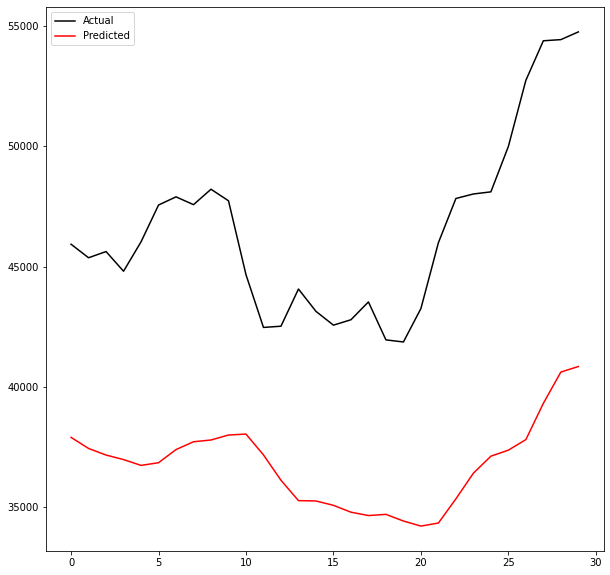

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int1.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 





In [37]:
# test runn of the interval1_ann_model_nextday()
interval1_ann_model_nextday(X, y)

[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00294: early stopping
Training R-Squared: 0.9909864253842013

Testing R-Squared: 0.9886112107668683

30day Holdout R-Squared: -1.3838169366739828

30day Holdout MAE: 5238.016536458334

30day Holdout MAPE: 11.01598913739011

30day Holdout RMSE: 5692.375890867538


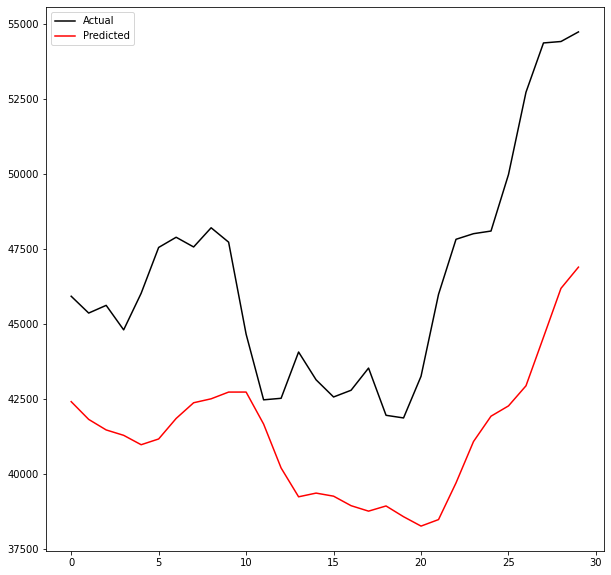

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200Adam0-01relu64Int1.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00246: early stopping
Training R-Squared: 0.9890370869098961

Testing R-Squared: 0.9859061465185844

30day Holdout R-Squared: -21.437240244199987

30day Holdout MAE: 17302.6560546875

30day Holdout MAPE: 37.06341568972518

30day Holdout RMSE: 17463.924257722945


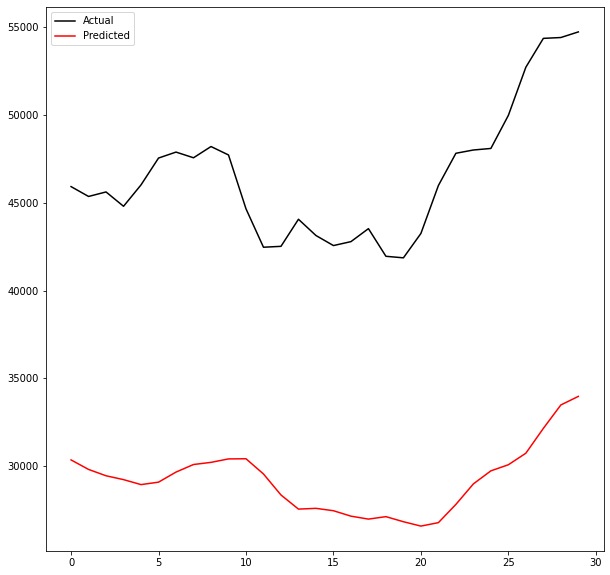

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200Adam0-01elu64Int1.hdf5
Number of Neurons: 200
Activation: elu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00304: early stopping
Training R-Squared: 0.9923404062024762

Testing R-Squared: 0.9890383923376727

30day Holdout R-Squared: -0.6776726531939181

30day Holdout MAE: 4339.241796875

30day Holdout MAPE: 9.126733604690038

30day Holdout RMSE: 4775.410750441519


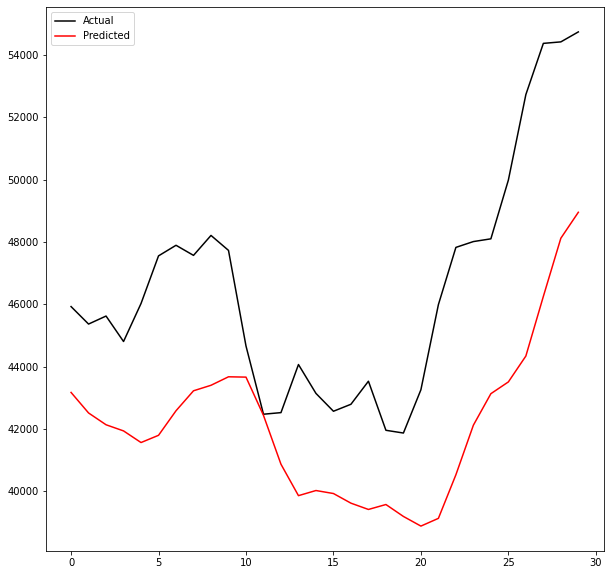

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200Adam0-001relu64Int1.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00195: early stopping
Training R-Squared: 0.9891078630931742

Testing R-Squared: 0.9887329658836491

30day Holdout R-Squared: -25.372553221127014

30day Holdout MAE: 18767.987760416665

30day Holdout MAPE: 40.19660951904926

30day Holdout RMSE: 18933.600480374385


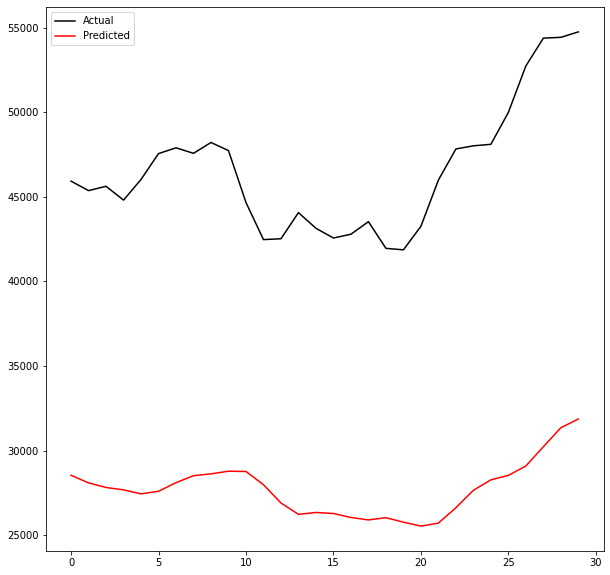

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200Adam0-001elu64Int1.hdf5
Number of Neurons: 200
Activation: elu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00848: early stopping
Training R-Squared: 0.9919478239737809

Testing R-Squared: 0.9902268882616804

30day Holdout R-Squared: -0.6629263681637854

30day Holdout MAE: 4226.138932291667

30day Holdout MAPE: 9.409154574024793

30day Holdout RMSE: 4754.377149531159


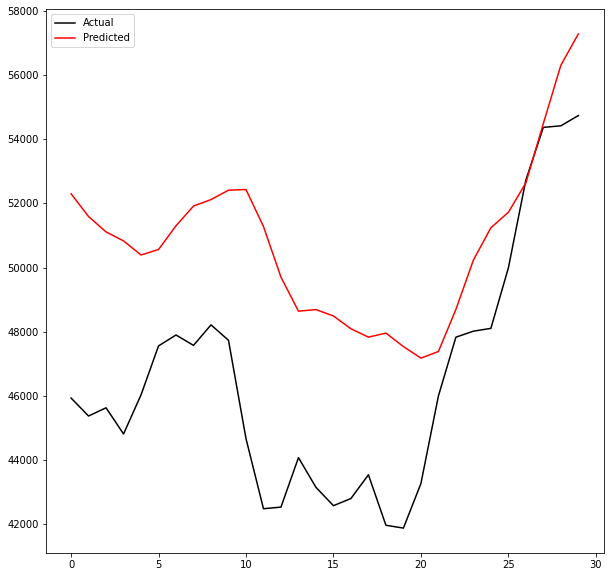

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200Adam0-0001relu64Int1.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00417: early stopping
Training R-Squared: 0.9893056854786426

Testing R-Squared: 0.9901765620386919

30day Holdout R-Squared: -21.383616013011917

30day Holdout MAE: 17254.623828125

30day Holdout MAPE: 36.91428171633957

30day Holdout RMSE: 17443.04268504038


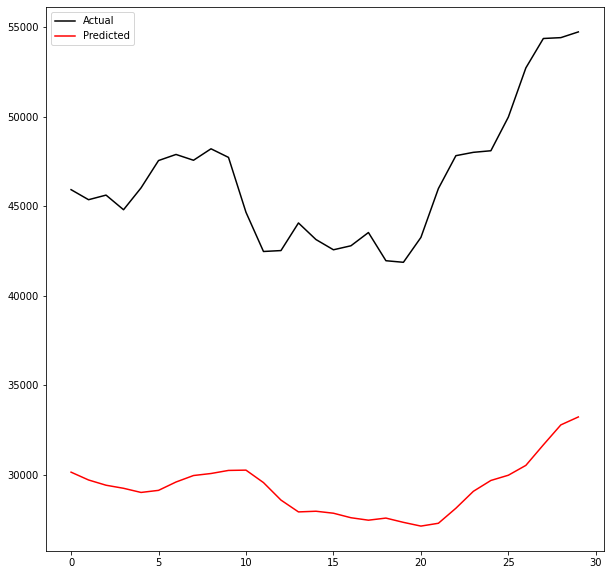

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200Adam0-0001elu64Int1.hdf5
Number of Neurons: 200
Activation: elu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00198: early stopping
Training R-Squared: 0.98391859709655

Testing R-Squared: 0.9834236654681664

30day Holdout R-Squared: 0.19546396305900915

30day Holdout MAE: 2808.788151041667

30day Holdout MAPE: 5.871037161998979

30day Holdout RMSE: 3306.9670751884596


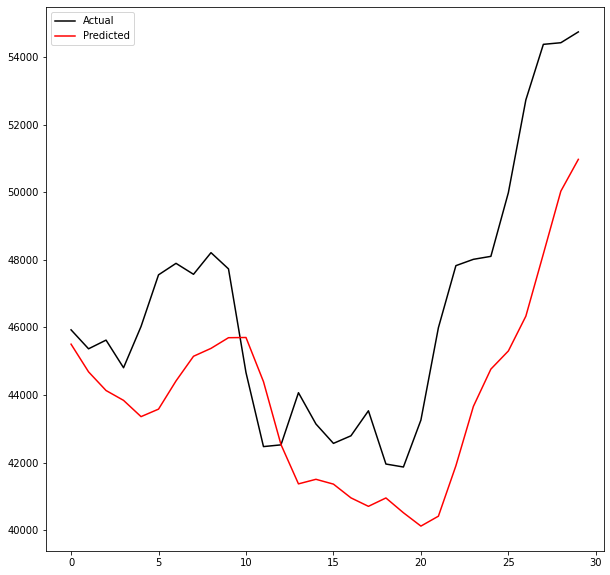

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int1.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00370: early stopping
Training R-Squared: 0.9915152905982182

Testing R-Squared: 0.9887082986495943

30day Holdout R-Squared: -19.50029544036169

30day Holdout MAE: 16542.248307291666

30day Holdout MAPE: 35.44851761938322

30day Holdout RMSE: 16693.107111562604


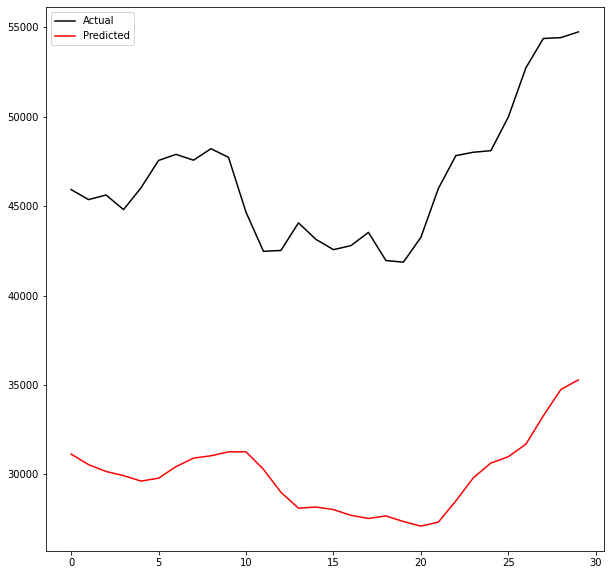

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01elu64Int1.hdf5
Number of Neurons: 300
Activation: elu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00165: early stopping
Training R-Squared: 0.9918596119762322

Testing R-Squared: 0.9898279737894647

30day Holdout R-Squared: 0.5775687738815397

30day Holdout MAE: 2006.415234375

30day Holdout MAPE: 4.440066879379224

30day Holdout RMSE: 2396.266558675504


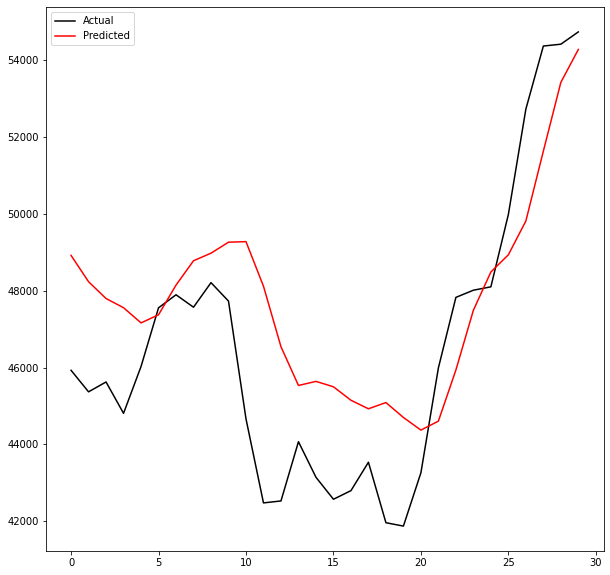

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-001relu64Int1.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00158: early stopping
Training R-Squared: 0.9888119260354127

Testing R-Squared: 0.9895210875839975

30day Holdout R-Squared: -21.398787016269036

30day Holdout MAE: 17283.165690104168

30day Holdout MAPE: 37.00951242521111

30day Holdout RMSE: 17448.952892598885


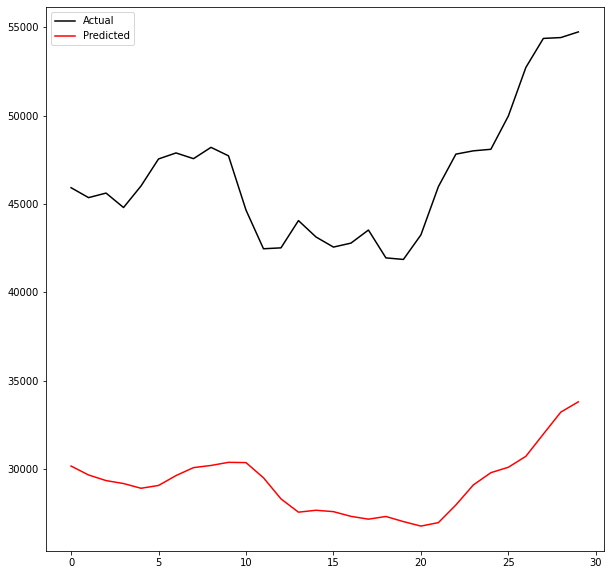

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-001elu64Int1.hdf5
Number of Neurons: 300
Activation: elu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00710: early stopping
Training R-Squared: 0.9928788970344674

Testing R-Squared: 0.9896328976503286

30day Holdout R-Squared: 0.39268020971197537

30day Holdout MAE: 2416.943359375

30day Holdout MAPE: 5.3970799323232646

30day Holdout RMSE: 2873.1998611362533


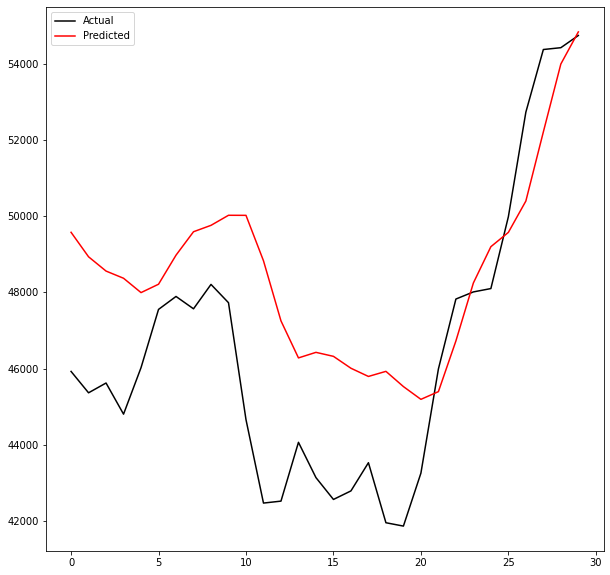

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-0001relu64Int1.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 01071: early stopping
Training R-Squared: 0.9897951845018862

Testing R-Squared: 0.9898907515156242

30day Holdout R-Squared: -34.456690883504585

30day Holdout MAE: 21840.215625

30day Holdout MAPE: 46.88449460304273

30day Holdout RMSE: 21953.62394343127


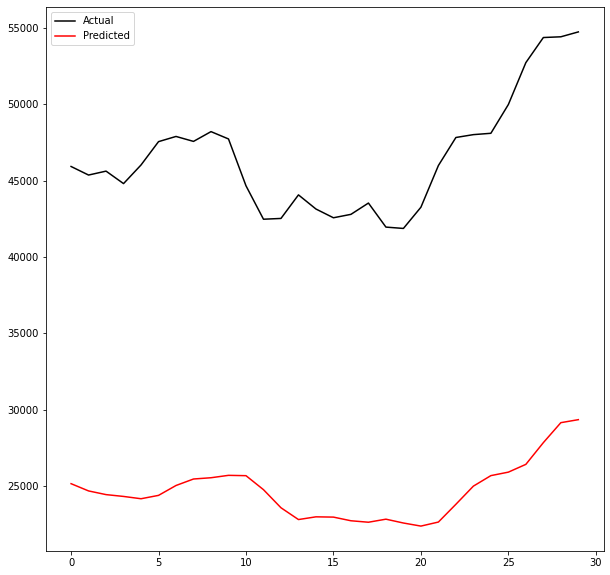

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-0001elu64Int1.hdf5
Number of Neurons: 300
Activation: elu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00216: early stopping
Training R-Squared: 0.9839680377931495

Testing R-Squared: 0.9840664369517079

30day Holdout R-Squared: -0.674735197801186

30day Holdout MAE: 4223.941145833333

30day Holdout MAPE: 8.827205501042682

30day Holdout RMSE: 4771.22825939763


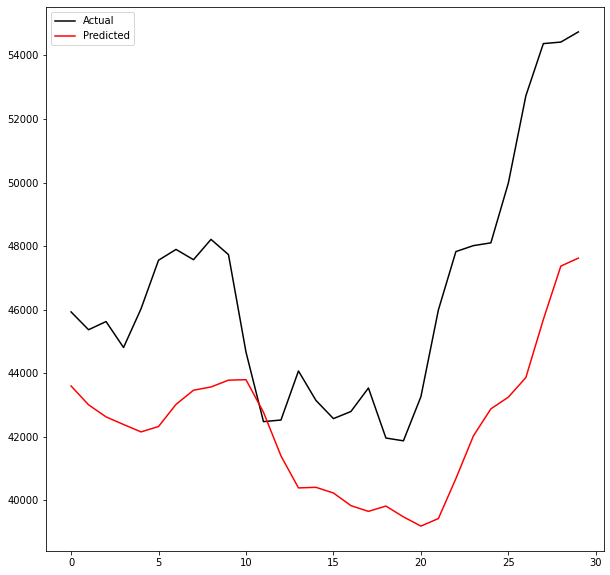

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400Adam0-01relu64Int1.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00294: early stopping
Training R-Squared: 0.9901852080890332

Testing R-Squared: 0.987403409026282

30day Holdout R-Squared: -36.53368948519848

30day Holdout MAE: 22449.970572916667

30day Holdout MAPE: 48.16127628823293

30day Holdout RMSE: 22587.478306470228


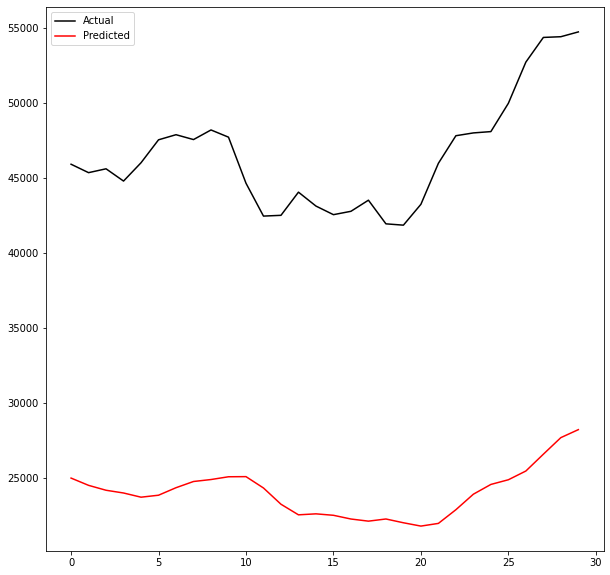

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400Adam0-01elu64Int1.hdf5
Number of Neurons: 400
Activation: elu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00279: early stopping
Training R-Squared: 0.9933440965861318

Testing R-Squared: 0.9892375865680932

30day Holdout R-Squared: 0.4592920332483549

30day Holdout MAE: 2095.645963541667

30day Holdout MAPE: 4.31635815577127

30day Holdout RMSE: 2711.056098570416


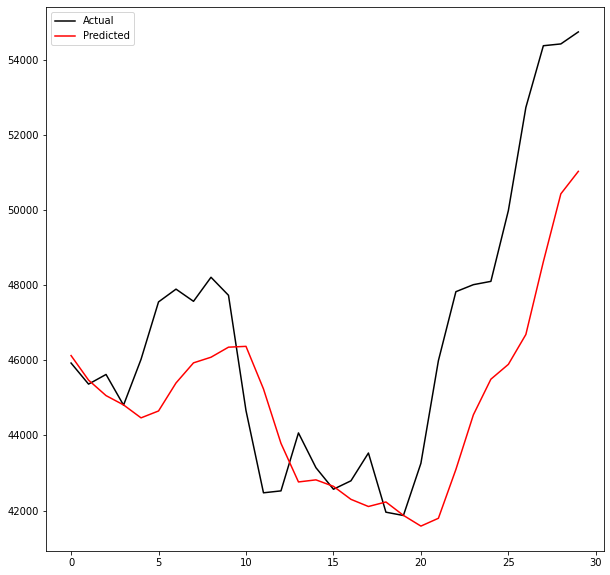

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400Adam0-001relu64Int1.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00142: early stopping
Training R-Squared: 0.9855788431475391

Testing R-Squared: 0.9863701143639422

30day Holdout R-Squared: -29.229150012366944

30day Holdout MAE: 20120.444921875

30day Holdout MAPE: 43.130333588155416

30day Holdout RMSE: 20270.762624088926


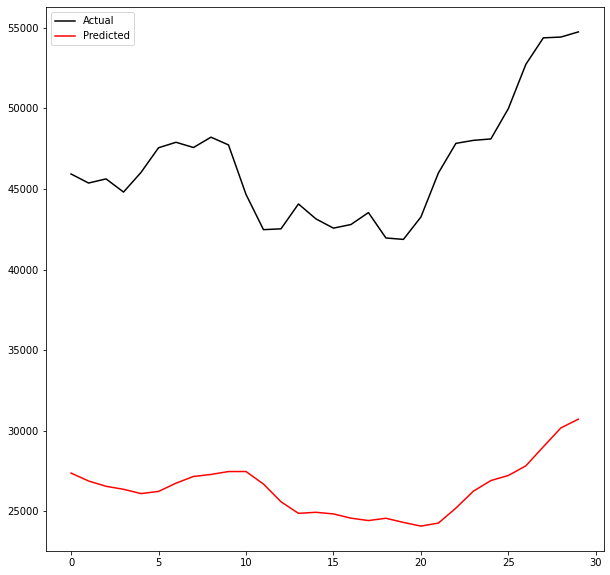

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400Adam0-001elu64Int1.hdf5
Number of Neurons: 400
Activation: elu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00361: early stopping
Training R-Squared: 0.9920484609339266

Testing R-Squared: 0.9898487911880154

30day Holdout R-Squared: -1.5725447057350457

30day Holdout MAE: 5509.299088541667

30day Holdout MAPE: 12.192545168017075

30day Holdout RMSE: 5913.418088334488


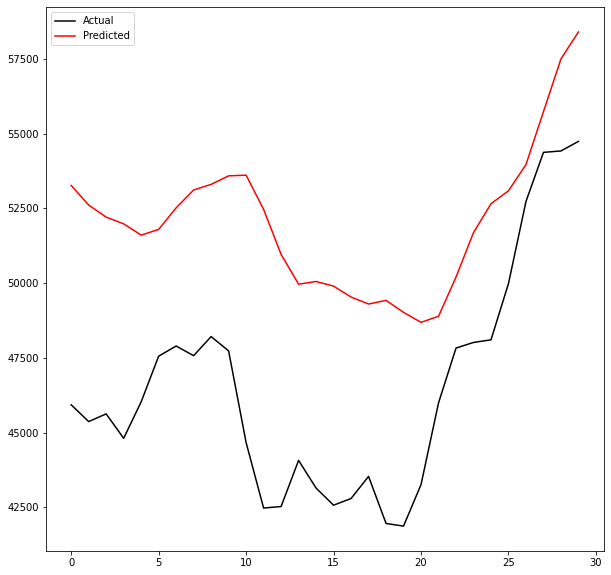

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400Adam0-0001relu64Int1.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00461: early stopping
Training R-Squared: 0.9897070261851485

Testing R-Squared: 0.9896406555060172

30day Holdout R-Squared: -27.02973840788987

30day Holdout MAE: 19364.382161458332

30day Holdout MAPE: 41.49219620895714

30day Holdout RMSE: 19519.40802240474


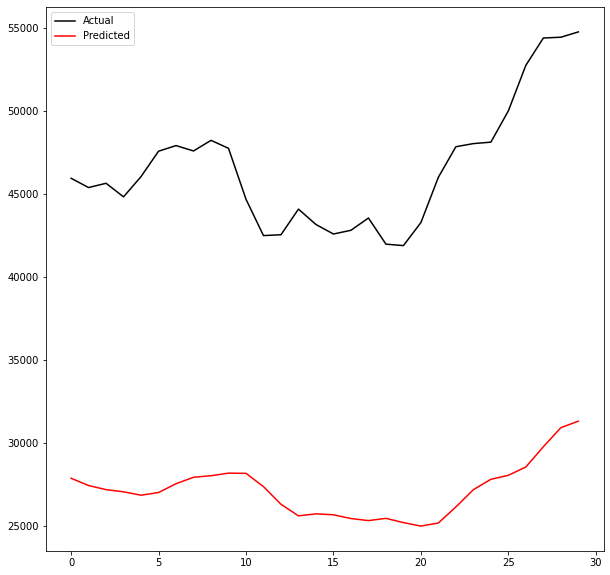

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400Adam0-0001elu64Int1.hdf5
Number of Neurons: 400
Activation: elu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00321: early stopping
Training R-Squared: 0.9860509160718831

Testing R-Squared: 0.9842184567831657

30day Holdout R-Squared: -3.7383260625856094

30day Holdout MAE: 7618.842057291667

30day Holdout MAPE: 16.121822159718988

30day Holdout RMSE: 8025.45366206005


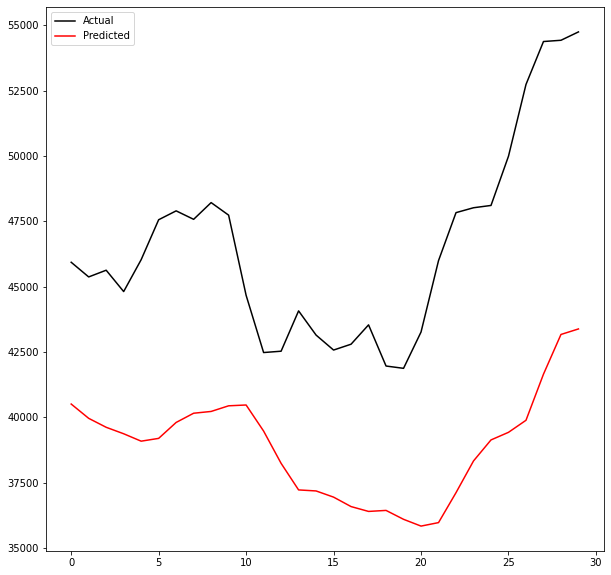

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500Adam0-01relu64Int1.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00630: early stopping
Training R-Squared: 0.9946891494365956

Testing R-Squared: 0.9899312400383821

30day Holdout R-Squared: -39.888617976094864

30day Holdout MAE: 23435.446484375

30day Holdout MAPE: 50.29630852365178

30day Holdout RMSE: 23575.360149045442


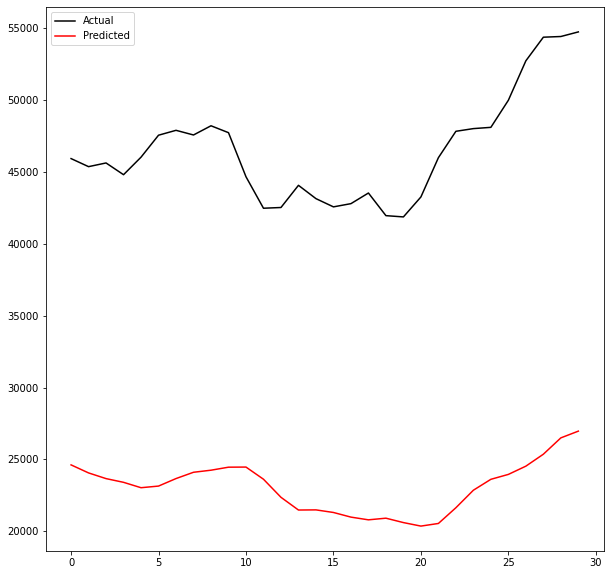

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500Adam0-01elu64Int1.hdf5
Number of Neurons: 500
Activation: elu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00500: early stopping
Training R-Squared: 0.993724913574076

Testing R-Squared: 0.9888556576220514

30day Holdout R-Squared: -0.15714305141098395

30day Holdout MAE: 3237.223697916667

30day Holdout MAPE: 6.681315162211976

30day Holdout RMSE: 3965.98115235347


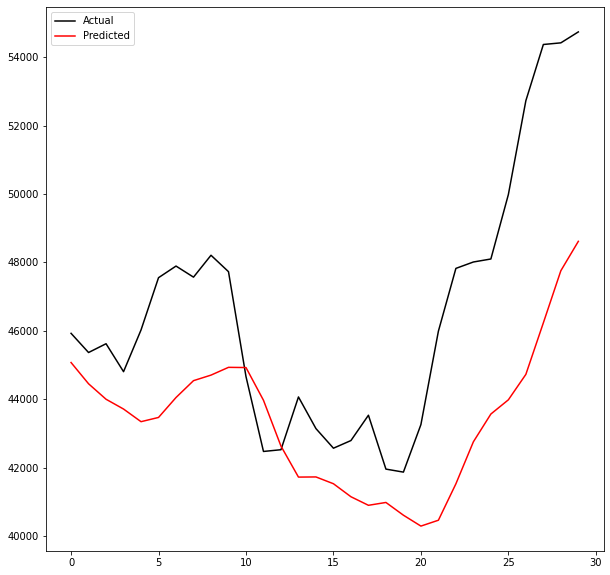

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500Adam0-001relu64Int1.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00244: early stopping
Training R-Squared: 0.9901629640298036

Testing R-Squared: 0.9888533357034206

30day Holdout R-Squared: -35.36037932607341

30day Holdout MAE: 22104.022981770835

30day Holdout MAPE: 47.43130346956087

30day Holdout RMSE: 22231.630862222682


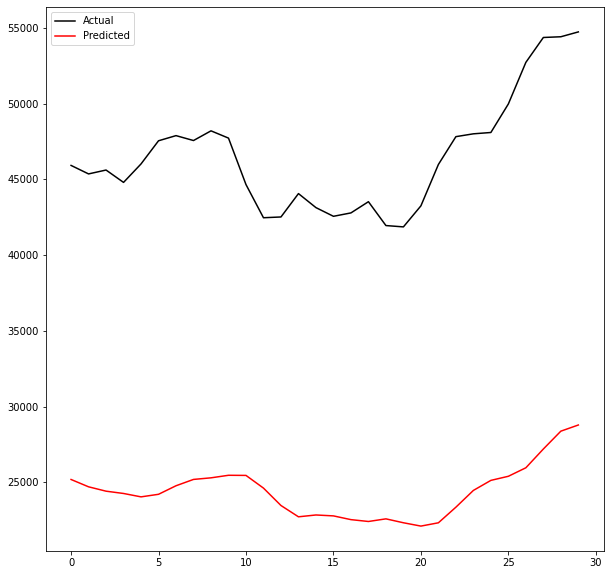

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500Adam0-001elu64Int1.hdf5
Number of Neurons: 500
Activation: elu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00339: early stopping
Training R-Squared: 0.9927464361495809

Testing R-Squared: 0.9892832481605247

30day Holdout R-Squared: -0.8758068869360554

30day Holdout MAE: 4535.670442708333

30day Holdout MAPE: 10.104857558123465

30day Holdout RMSE: 5049.532631575468


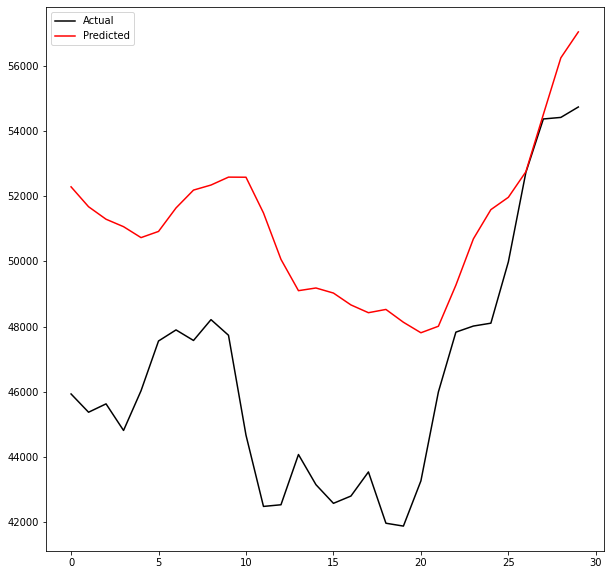

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500Adam0-0001relu64Int1.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00359: early stopping
Training R-Squared: 0.9900303636162731

Testing R-Squared: 0.9896392765955349

30day Holdout R-Squared: -35.210925566318664

30day Holdout MAE: 22040.193424479166

30day Holdout MAPE: 47.26119896930417

30day Holdout RMSE: 22185.893961581616


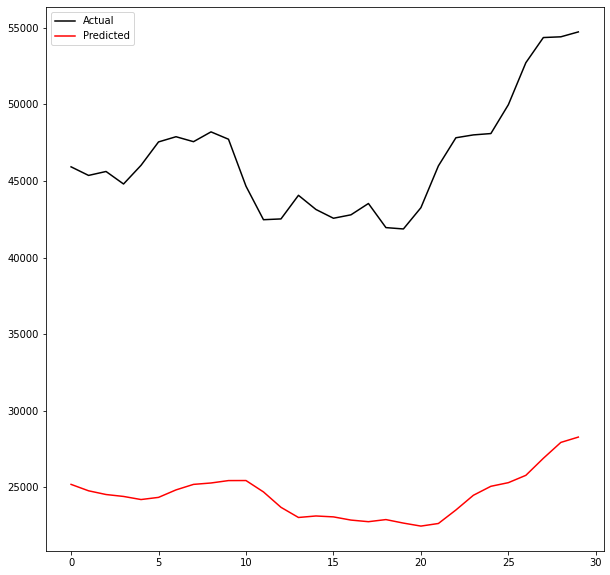

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500Adam0-0001elu64Int1.hdf5
Number of Neurons: 500
Activation: elu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00101: early stopping
Training R-Squared: -3.535381902003283

Testing R-Squared: -3.335405285329344

30day Holdout R-Squared: -159.24484000557823

30day Holdout MAE: 46525.36666666667

30day Holdout MAPE: 100.0

30day Holdout RMSE: 46671.21928733667


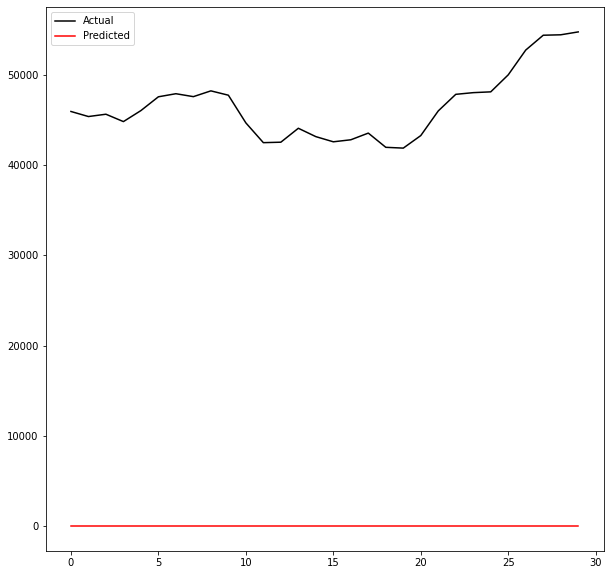

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600Adam0-01relu64Int1.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00359: early stopping
Training R-Squared: 0.9891798116845038

Testing R-Squared: 0.9851186603783169

30day Holdout R-Squared: -28.41246196159522

30day Holdout MAE: 19853.169401041665

30day Holdout MAPE: 42.582723806637816

30day Holdout RMSE: 19995.06449630296


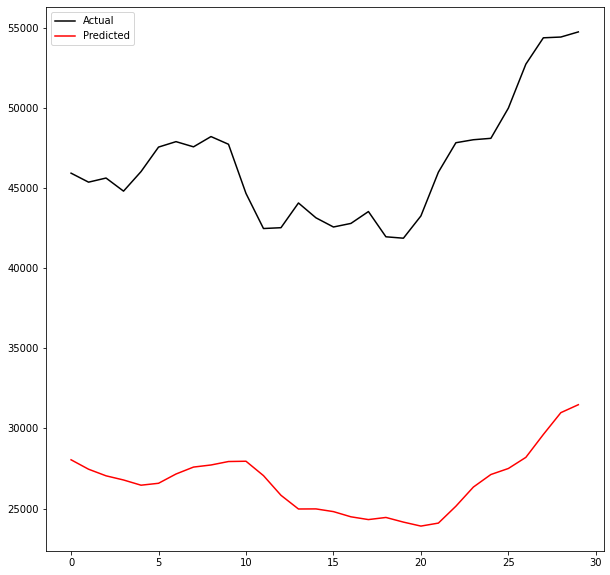

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600Adam0-01elu64Int1.hdf5
Number of Neurons: 600
Activation: elu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00101: early stopping
Training R-Squared: -3.535381902003283

Testing R-Squared: -3.335405285329344

30day Holdout R-Squared: -159.24484000557823

30day Holdout MAE: 46525.36666666667

30day Holdout MAPE: 100.0

30day Holdout RMSE: 46671.21928733667


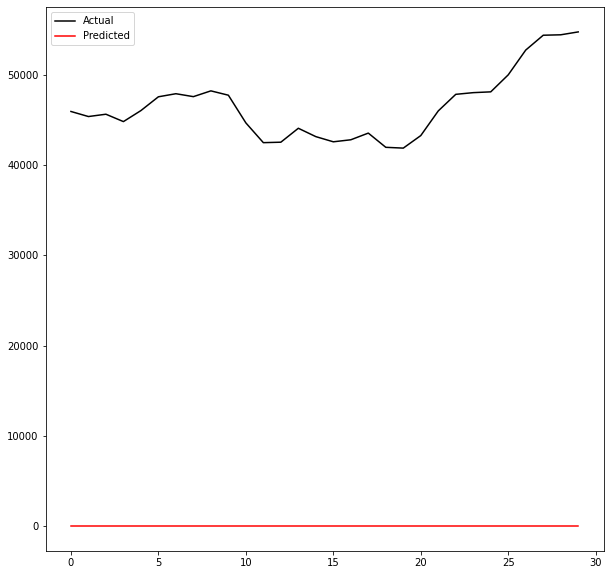

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600Adam0-001relu64Int1.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00392: early stopping
Training R-Squared: 0.9918672691080122

Testing R-Squared: 0.98975024961909

30day Holdout R-Squared: -50.68274631385952

30day Holdout MAE: 26365.2404296875

30day Holdout MAPE: 56.57692452137473

30day Holdout RMSE: 26505.128350534666


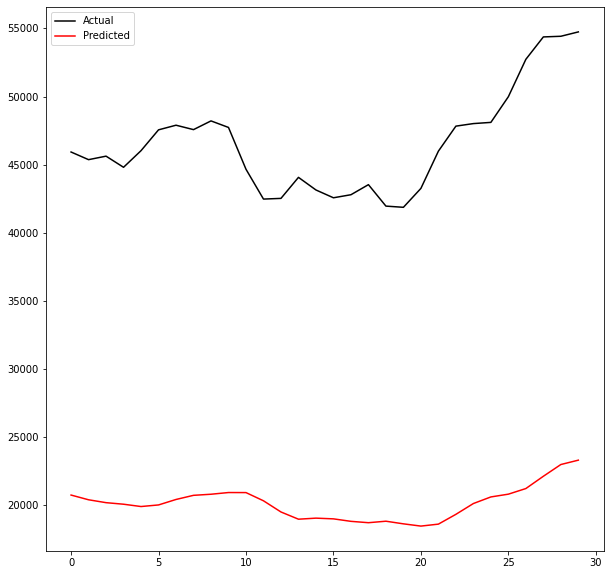

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600Adam0-001elu64Int1.hdf5
Number of Neurons: 600
Activation: elu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00499: early stopping
Training R-Squared: 0.9939362358091813

Testing R-Squared: 0.989620686268064

30day Holdout R-Squared: 0.24905115134819844

30day Holdout MAE: 2710.123567708333

30day Holdout MAPE: 6.055545711548398

30day Holdout RMSE: 3194.9369934183915


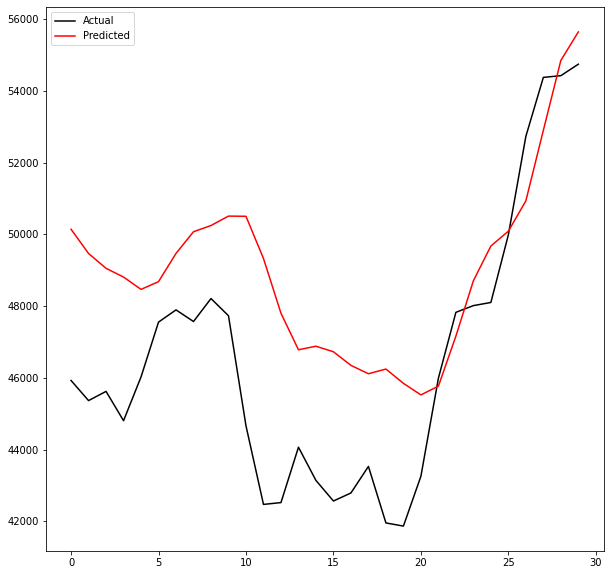

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600Adam0-0001relu64Int1.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00344: early stopping
Training R-Squared: 0.9903152754321563

Testing R-Squared: 0.9895597504708805

30day Holdout R-Squared: -39.19069047271527

30day Holdout MAE: 23223.646223958334

30day Holdout MAPE: 49.80088481566193

30day Holdout RMSE: 23373.290335866135


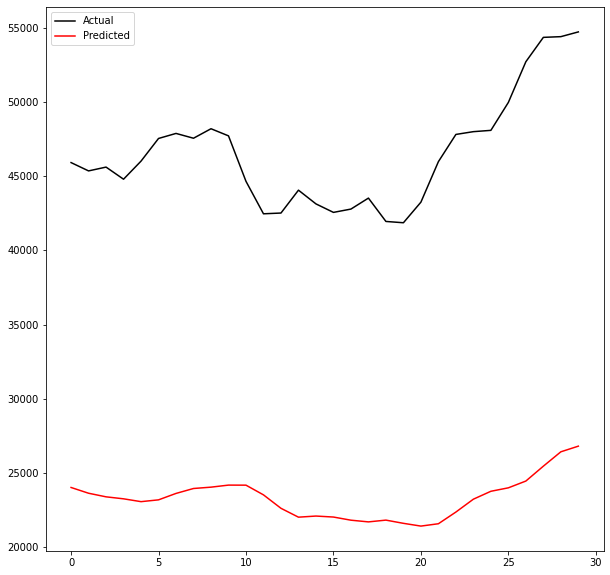

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600Adam0-0001elu64Int1.hdf5
Number of Neurons: 600
Activation: elu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00262: early stopping
Training R-Squared: 0.9556264014173603

Testing R-Squared: 0.9528932537801893

30day Holdout R-Squared: 0.5926674191102895

30day Holdout MAE: 1901.3825520833334

30day Holdout MAPE: 4.00295373030435

30day Holdout RMSE: 2353.052920032456


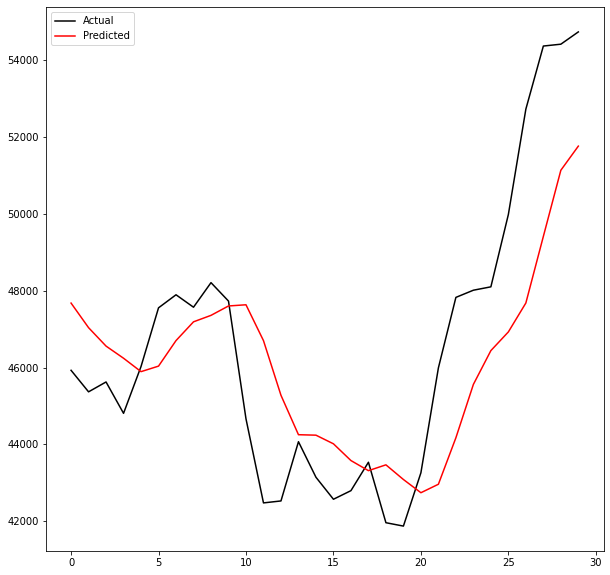

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200RMSprop0-01relu64Int1.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00235: early stopping
Training R-Squared: 0.9702294791305557

Testing R-Squared: 0.9693395908054144

30day Holdout R-Squared: -159.25168558521753

30day Holdout MAE: 46526.36666666667

30day Holdout MAPE: 100.0021621847311

30day Holdout RMSE: 46672.2161622951


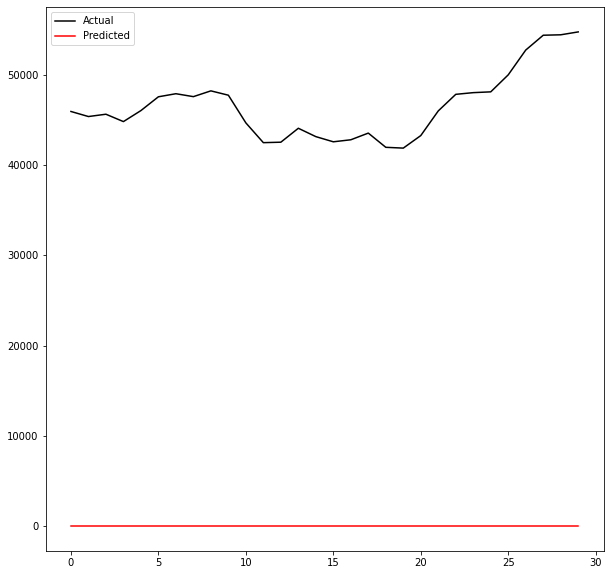

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200RMSprop0-01elu64Int1.hdf5
Number of Neurons: 200
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00450: early stopping
Training R-Squared: 0.9869116626577229

Testing R-Squared: 0.9857576161911827

30day Holdout R-Squared: -0.4600941556462299

30day Holdout MAE: 3753.9430989583334

30day Holdout MAPE: 7.764028301085565

30day Holdout RMSE: 4454.998389551205


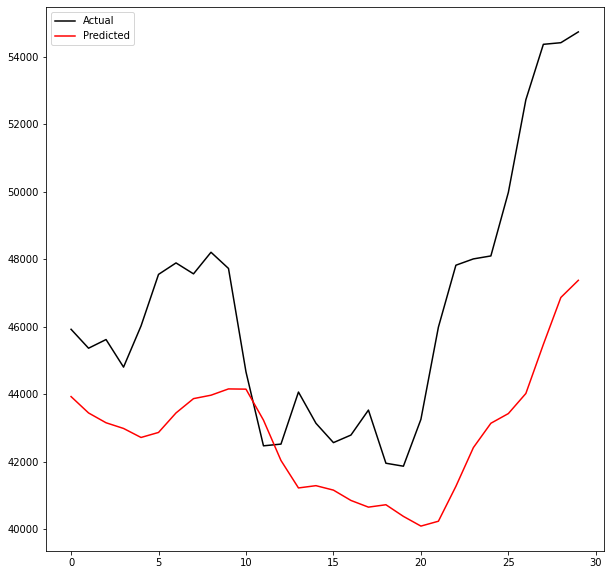

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200RMSprop0-001relu64Int1.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00353: early stopping
Training R-Squared: 0.9901945209437993

Testing R-Squared: 0.989600006122166

30day Holdout R-Squared: -159.25168558521753

30day Holdout MAE: 46526.36666666667

30day Holdout MAPE: 100.0021621847311

30day Holdout RMSE: 46672.2161622951


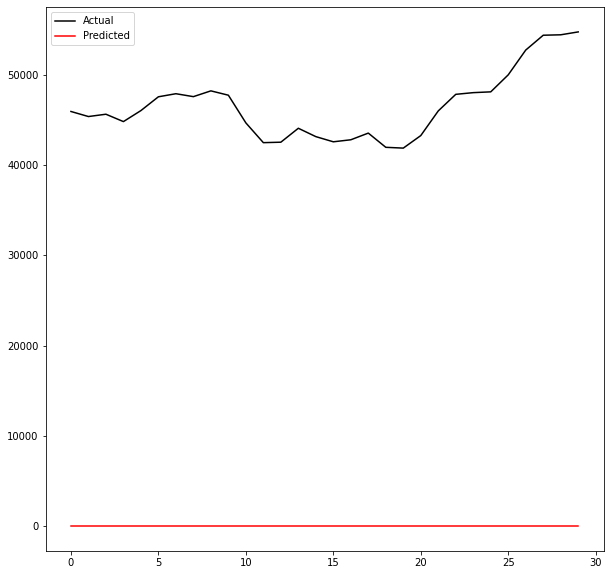

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200RMSprop0-001elu64Int1.hdf5
Number of Neurons: 200
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00683: early stopping
Training R-Squared: 0.9900709223988782

Testing R-Squared: 0.988614760544028

30day Holdout R-Squared: -0.555079931874169

30day Holdout MAE: 4070.144921875

30day Holdout MAPE: 9.072994285236174

30day Holdout RMSE: 4597.624289352492


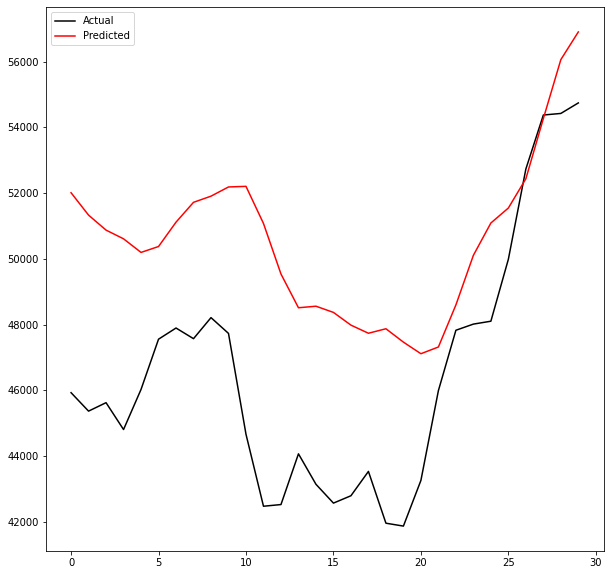

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200RMSprop0-0001relu64Int1.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00505: early stopping
Training R-Squared: 0.9891678134686845

Testing R-Squared: 0.9899336172767241

30day Holdout R-Squared: -25.035542292627646

30day Holdout MAE: 18656.016796875

30day Holdout MAPE: 39.97397359281955

30day Holdout RMSE: 18812.236681399263


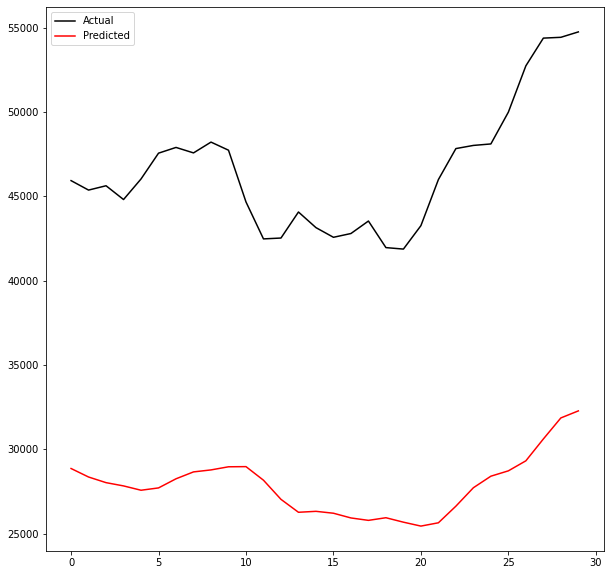

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200RMSprop0-0001elu64Int1.hdf5
Number of Neurons: 200
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00316: early stopping
Training R-Squared: 0.95973897166726

Testing R-Squared: 0.9614940660199429

30day Holdout R-Squared: -4.471545223680804

30day Holdout MAE: 8173.080729166667

30day Holdout MAPE: 17.249505133181664

30day Holdout RMSE: 8624.066896096043


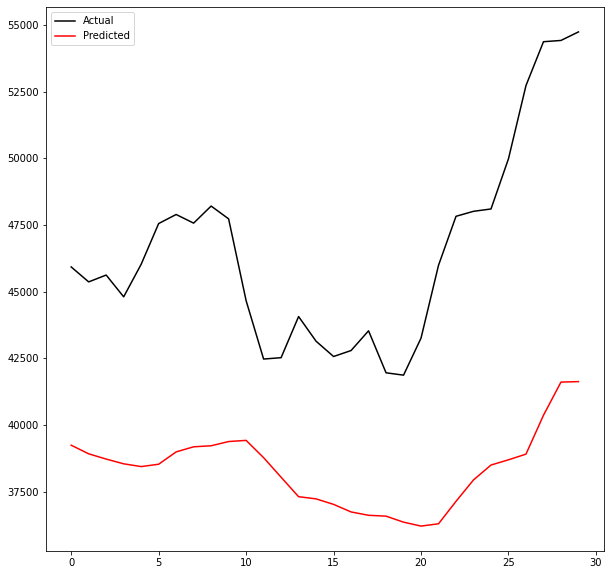

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-01relu64Int1.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00220: early stopping
Training R-Squared: 0.9661242214231285

Testing R-Squared: 0.9651746345756109

30day Holdout R-Squared: -159.25168558521753

30day Holdout MAE: 46526.36666666667

30day Holdout MAPE: 100.0021621847311

30day Holdout RMSE: 46672.2161622951


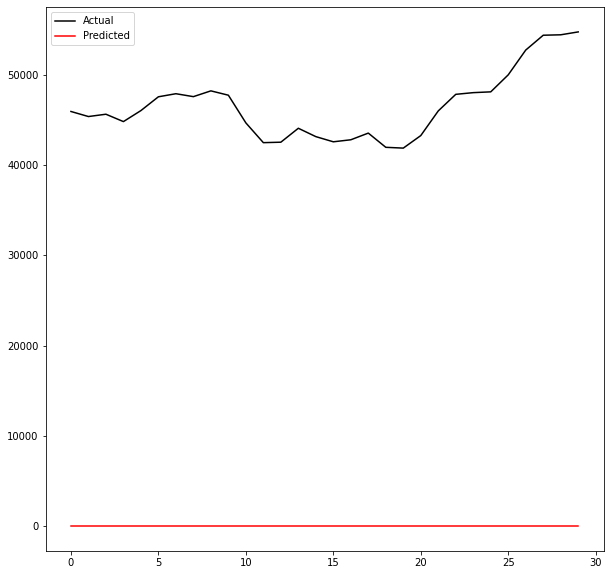

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-01elu64Int1.hdf5
Number of Neurons: 300
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00464: early stopping
Training R-Squared: 0.9779734668931485

Testing R-Squared: 0.9762083142237349

30day Holdout R-Squared: -2.669513802413271

30day Holdout MAE: 6611.404557291667

30day Holdout MAPE: 13.930877490097926

30day Holdout RMSE: 7062.547518389608


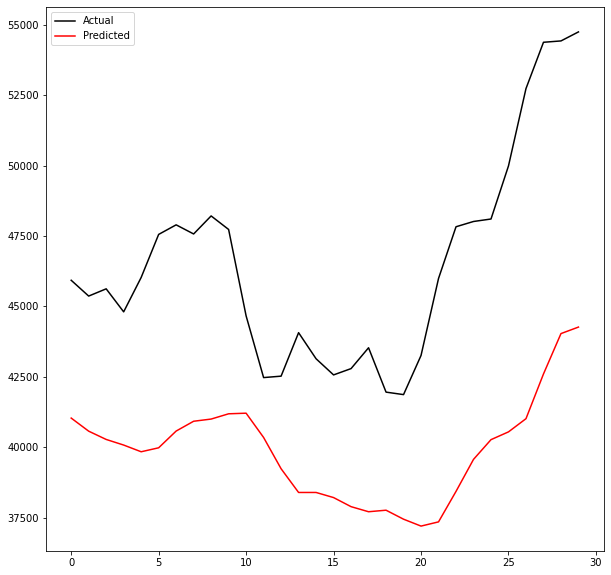

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-001relu64Int1.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00355: early stopping
Training R-Squared: 0.9883410635027636

Testing R-Squared: 0.9874501427456592

30day Holdout R-Squared: -159.25168558521753

30day Holdout MAE: 46526.36666666667

30day Holdout MAPE: 100.0021621847311

30day Holdout RMSE: 46672.2161622951


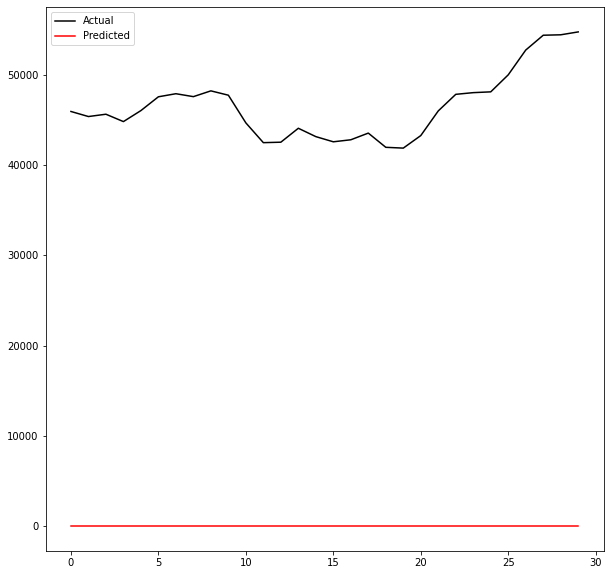

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-001elu64Int1.hdf5
Number of Neurons: 300
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00882: early stopping
Training R-Squared: 0.9912632710373191

Testing R-Squared: 0.988601903926202

30day Holdout R-Squared: 0.20026906024921942

30day Holdout MAE: 2817.6979166666665

30day Holdout MAPE: 6.289236996240484

30day Holdout RMSE: 3297.076843540517


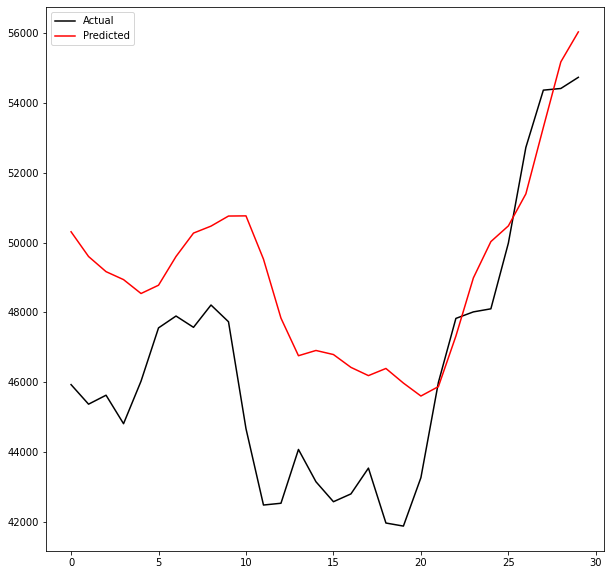

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int1.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00631: early stopping
Training R-Squared: 0.989629132438337

Testing R-Squared: 0.9899076114145821

30day Holdout R-Squared: -48.058423864675795

30day Holdout MAE: 25700.956119791666

30day Holdout MAPE: 55.17656721532435

30day Holdout RMSE: 25823.429328211703


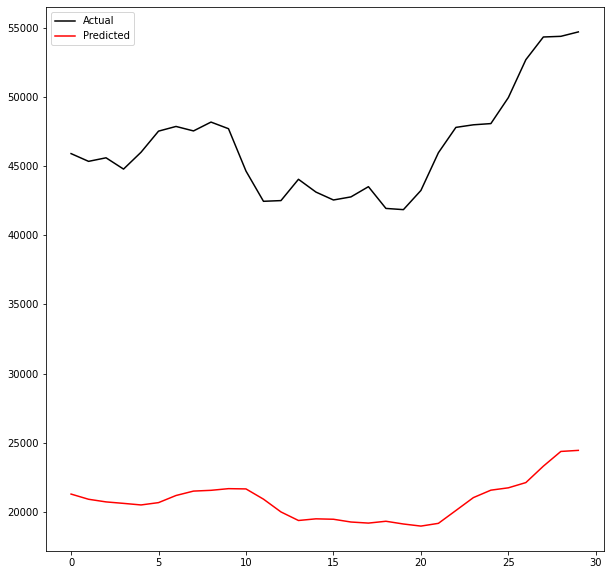

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001elu64Int1.hdf5
Number of Neurons: 300
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00240: early stopping
Training R-Squared: 0.9742372680493101

Testing R-Squared: 0.9774630393766912

30day Holdout R-Squared: -0.0024939078662804537

30day Holdout MAE: 3150.54921875

30day Holdout MAPE: 7.044728869847535

30day Holdout RMSE: 3691.458506399303


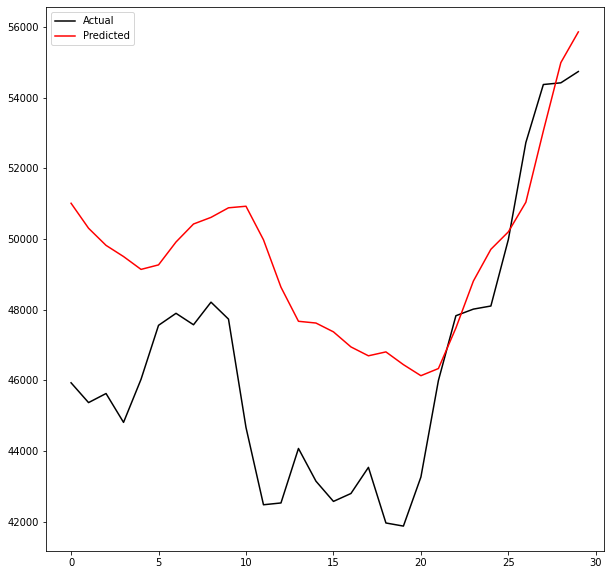

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400RMSprop0-01relu64Int1.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00222: early stopping
Training R-Squared: 0.9897652921385532

Testing R-Squared: 0.9881455540600055

30day Holdout R-Squared: -159.25168558521753

30day Holdout MAE: 46526.36666666667

30day Holdout MAPE: 100.0021621847311

30day Holdout RMSE: 46672.2161622951


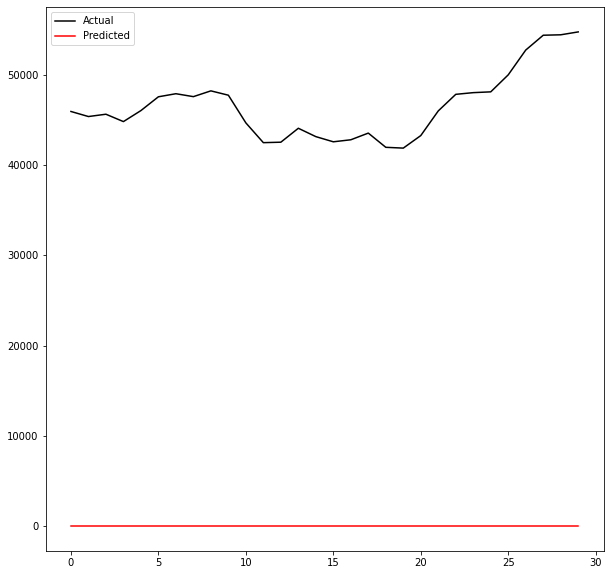

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400RMSprop0-01elu64Int1.hdf5
Number of Neurons: 400
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00271: early stopping
Training R-Squared: 0.9887090815580176

Testing R-Squared: 0.9867899062743484

30day Holdout R-Squared: -0.20740711864375228

30day Holdout MAE: 3294.6341145833335

30day Holdout MAPE: 6.774824910320225

30day Holdout RMSE: 4051.202818023687


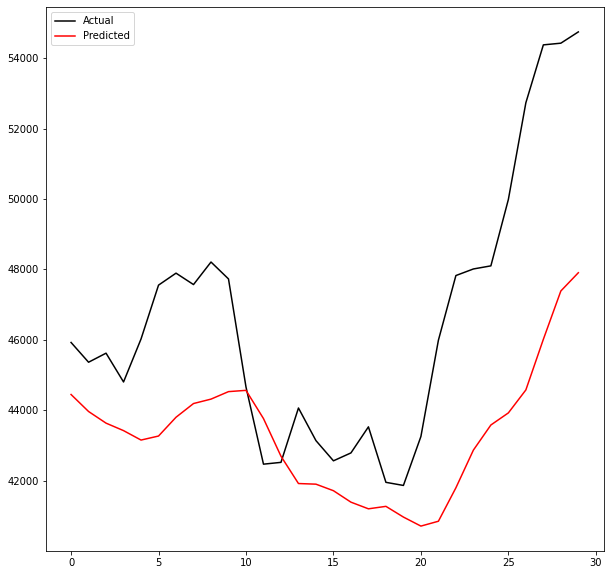

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400RMSprop0-001relu64Int1.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00218: early stopping
Training R-Squared: 0.9898206820692135

Testing R-Squared: 0.989033936248854

30day Holdout R-Squared: -159.25168558521753

30day Holdout MAE: 46526.36666666667

30day Holdout MAPE: 100.0021621847311

30day Holdout RMSE: 46672.2161622951


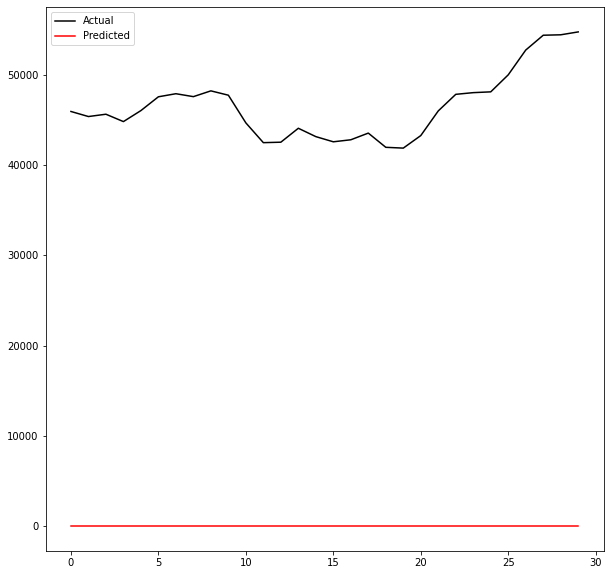

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400RMSprop0-001elu64Int1.hdf5
Number of Neurons: 400
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00690: early stopping
Training R-Squared: 0.9908902028840185

Testing R-Squared: 0.9885351161964457

30day Holdout R-Squared: -0.026497506553266437

30day Holdout MAE: 3233.0837239583334

30day Holdout MAPE: 7.21107950494365

30day Holdout RMSE: 3735.3910119921884


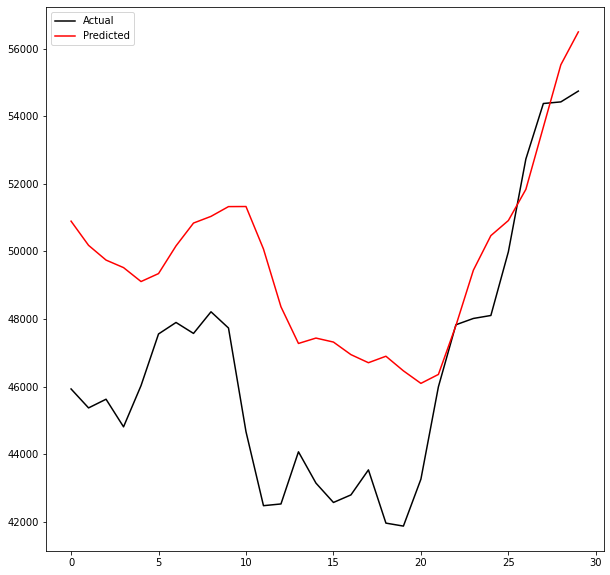

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400RMSprop0-0001relu64Int1.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00250: early stopping
Training R-Squared: 0.9882964665889807

Testing R-Squared: 0.9875924493994553

30day Holdout R-Squared: -50.430554640477794

30day Holdout MAE: 26308.142643229166

30day Holdout MAPE: 56.46825119259342

30day Holdout RMSE: 26440.381917838822


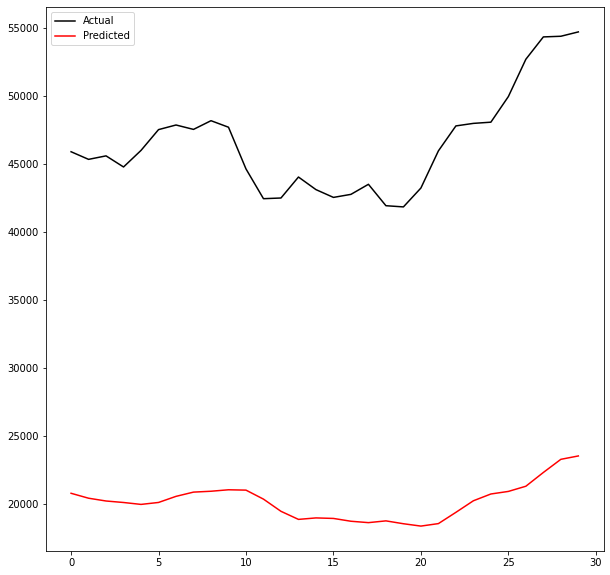

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400RMSprop0-0001elu64Int1.hdf5
Number of Neurons: 400
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00485: early stopping
Training R-Squared: 0.9868156575574258

Testing R-Squared: 0.9778196318715318

30day Holdout R-Squared: -1.216326190765364

30day Holdout MAE: 5015.574479166667

30day Holdout MAPE: 10.545097480386708

30day Holdout RMSE: 5488.756436426959


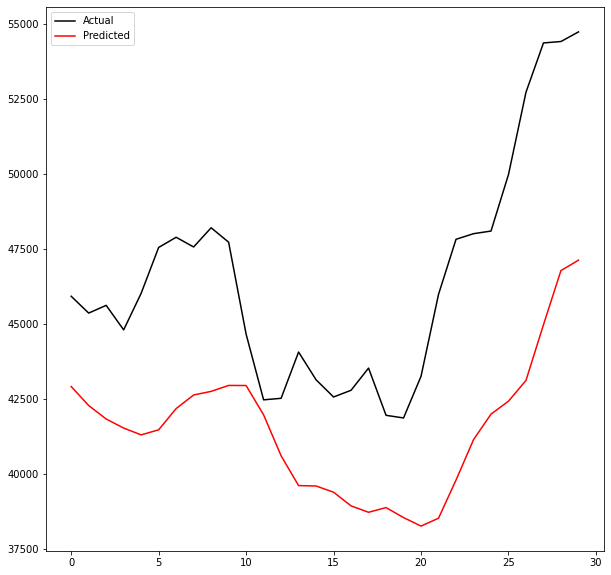

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500RMSprop0-01relu64Int1.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00107: early stopping
Training R-Squared: -3.554380492678127

Testing R-Squared: -3.3528676882032364

30day Holdout R-Squared: -159.25168558521753

30day Holdout MAE: 46526.36666666667

30day Holdout MAPE: 100.0021621847311

30day Holdout RMSE: 46672.2161622951


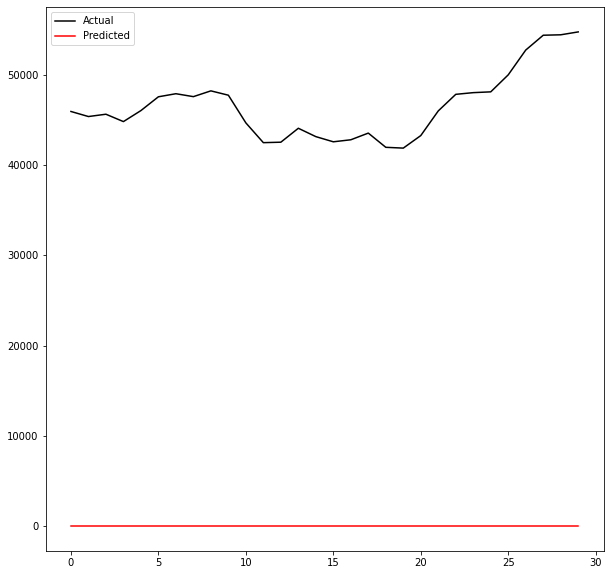

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500RMSprop0-01elu64Int1.hdf5
Number of Neurons: 500
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00912: early stopping
Training R-Squared: 0.9947900067373924

Testing R-Squared: 0.9888106658096726

30day Holdout R-Squared: -1.487943430821828

30day Holdout MAE: 5088.474088541667

30day Holdout MAPE: 10.560838258344958

30day Holdout RMSE: 5815.370255512808


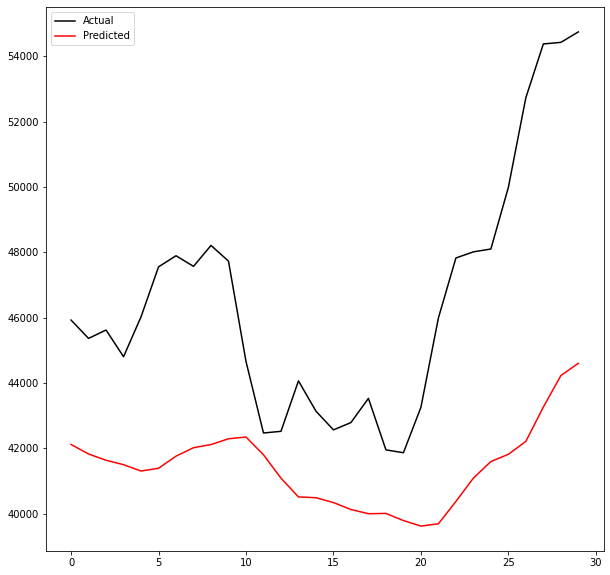

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500RMSprop0-001relu64Int1.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00291: early stopping
Training R-Squared: 0.9858739154949995

Testing R-Squared: 0.9835245865752658

30day Holdout R-Squared: -159.25168558521753

30day Holdout MAE: 46526.36666666667

30day Holdout MAPE: 100.0021621847311

30day Holdout RMSE: 46672.2161622951


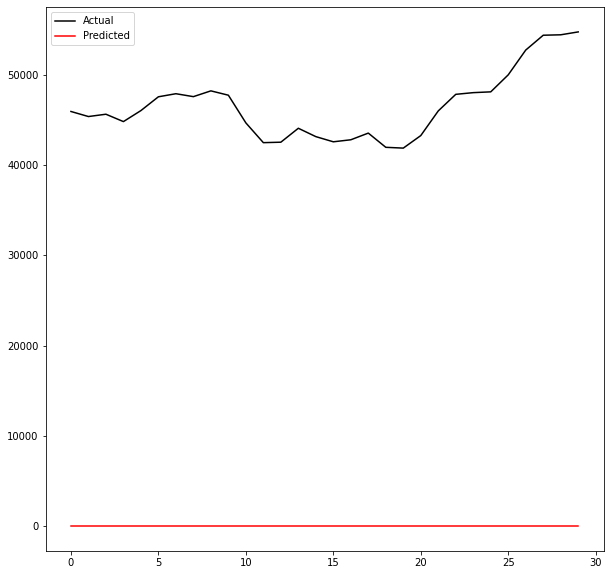

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500RMSprop0-001elu64Int1.hdf5
Number of Neurons: 500
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00608: early stopping
Training R-Squared: 0.9909119489767368

Testing R-Squared: 0.987610807186391

30day Holdout R-Squared: 0.4326189056700461

30day Holdout MAE: 2312.4036458333335

30day Holdout MAPE: 5.166676794260663

30day Holdout RMSE: 2777.11938775663


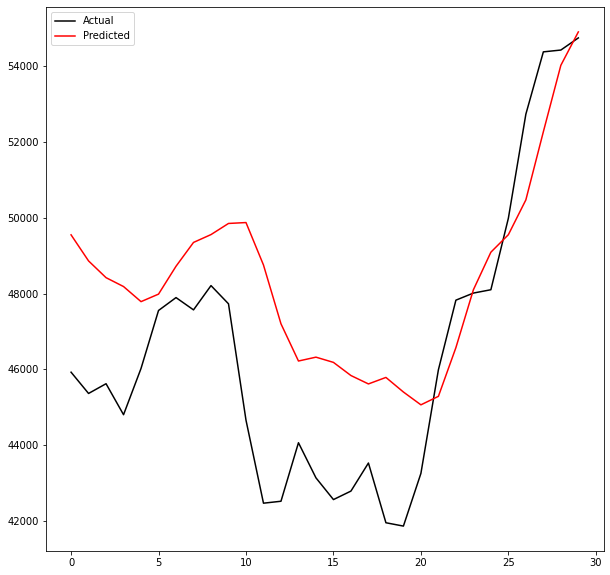

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500RMSprop0-0001relu64Int1.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00438: early stopping
Training R-Squared: 0.9881650825322431

Testing R-Squared: 0.9884183230166167

30day Holdout R-Squared: -156.59598059169042

30day Holdout MAE: 46180.51918714643

30day Holdout MAPE: 99.35127258587394

30day Holdout RMSE: 46283.87249380928


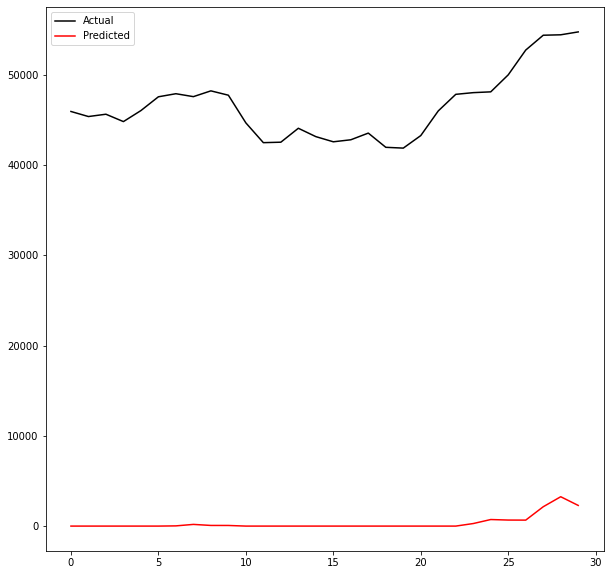

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500RMSprop0-0001elu64Int1.hdf5
Number of Neurons: 500
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00276: early stopping
Training R-Squared: 0.9710723456406648

Testing R-Squared: 0.966358845634816

30day Holdout R-Squared: -13.755644705202052

30day Holdout MAE: 13974.262434895832

30day Holdout MAPE: 29.879997134047816

30day Holdout RMSE: 14162.37907966701


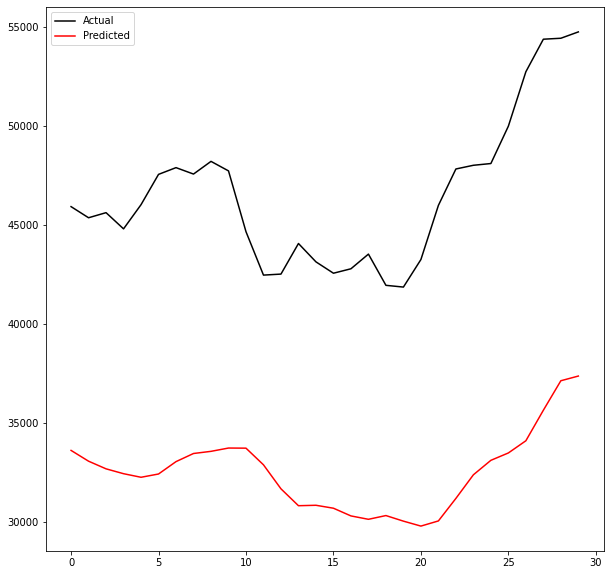

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600RMSprop0-01relu64Int1.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00101: early stopping
Training R-Squared: -3.554380492678127

Testing R-Squared: -3.3528676882032364

30day Holdout R-Squared: -159.25168558521753

30day Holdout MAE: 46526.36666666667

30day Holdout MAPE: 100.0021621847311

30day Holdout RMSE: 46672.2161622951


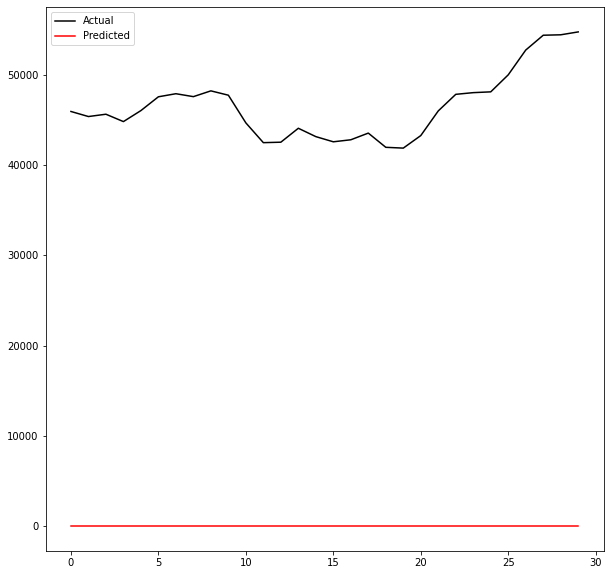

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600RMSprop0-01elu64Int1.hdf5
Number of Neurons: 600
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00389: early stopping
Training R-Squared: 0.9825499460736584

Testing R-Squared: 0.9791173320600411

30day Holdout R-Squared: -0.3362969749001057

30day Holdout MAE: 3484.8825520833334

30day Holdout MAPE: 7.162146687662584

30day Holdout RMSE: 4261.952574246258


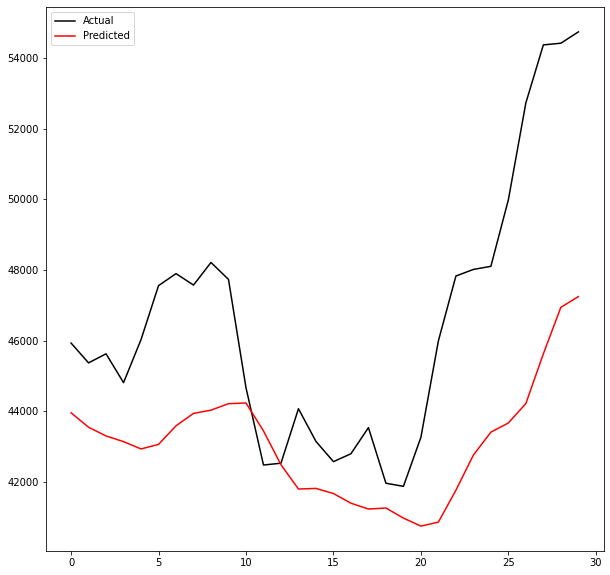

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600RMSprop0-001relu64Int1.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00383: early stopping
Training R-Squared: 0.9880548966936263

Testing R-Squared: 0.9852575257659412

30day Holdout R-Squared: -100.35412447472139

30day Holdout MAE: 37019.77573242188

30day Holdout MAPE: 79.61307080613179

30day Holdout RMSE: 37117.42445588429


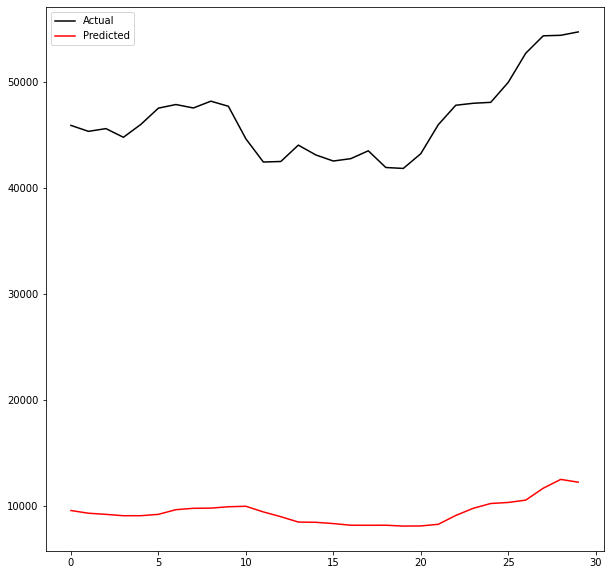

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600RMSprop0-001elu64Int1.hdf5
Number of Neurons: 600
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00394: early stopping
Training R-Squared: 0.9901231990477233

Testing R-Squared: 0.9879555529029461

30day Holdout R-Squared: -3.217144783606545

30day Holdout MAE: 7276.4375

30day Holdout MAPE: 15.994223194627432

30day Holdout RMSE: 7571.228891078306


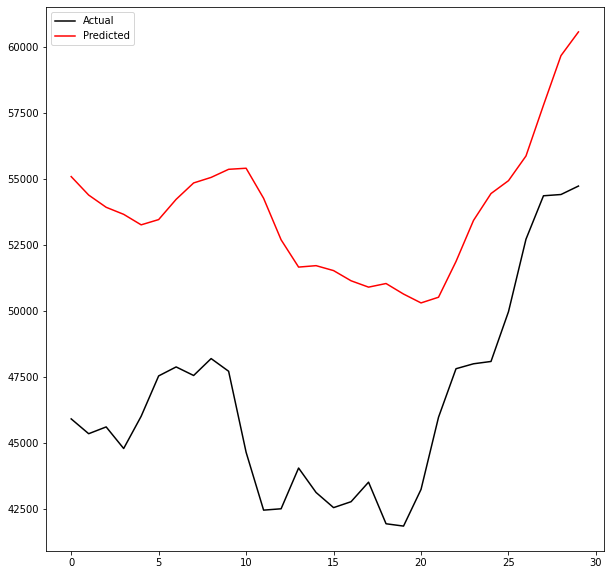

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600RMSprop0-0001relu64Int1.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00263: early stopping
Training R-Squared: 0.9880782238759692

Testing R-Squared: 0.9887276341491027

30day Holdout R-Squared: -79.8883656963503

30day Holdout MAE: 33063.51266276042

30day Holdout MAPE: 71.09445972648828

30day Holdout RMSE: 33158.90270926784


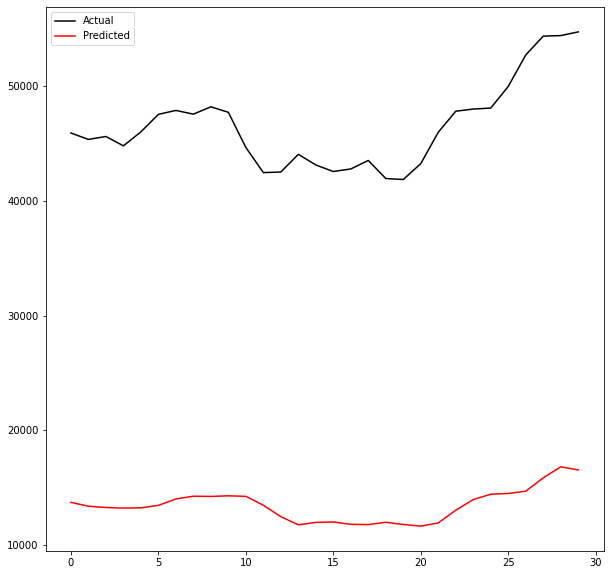

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600RMSprop0-0001elu64Int1.hdf5
Number of Neurons: 600
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 





In [38]:
opt_list = ['Adam', 'RMSprop']
activation_list = ['relu', 'elu']
neuron_list = [200, 300, 400, 500, 600]
lr_list = [0.01, 0.001, 0.0001]

for op in opt_list:
    for neuron in neuron_list:
        for l in lr_list:
            for act in activation_list:
                interval1_ann_model_nextday(X, y, lr=l, activation=act,
                                            neurons=neuron, opt=op, batch_size=64, epochs=5000)

## ANN Model for Interval 2

In [39]:
# double check that the X df has only feature columns and Date as the first column
X.columns

Index(['Date', 'median_transaction_fee30trxUSD',
       'median_transaction_fee7trxUSD', 'price90emaUSD', 'size90trx',
       'transactions', 'price30wmaUSD', 'price3wmaUSD', 'price7wmaUSD',
       'median_transaction_fee7rocUSD', 'difficulty30rsi'],
      dtype='object')

In [40]:
# double check y and X have same number of rows
y.shape, X.shape

((4102,), (4102, 11))

In [41]:
# create a 3 hidden layer model function for testing hyperparameters

def interval2_ann_model_nextday(X, y, lr=0.01, neurons=300, activation='relu', opt='Adam', batch_size=64, epochs=5000):
    ''' 
        X is a dataframe of the dates and features using non-standardized values
        The Date column must be the first column in the X dataframe
        y is a dataframe or 1D array of the target values
    '''
    # assign the string values to variables for file naming later in the Checkpoint
    opt_name = opt
    acti = activation
    # remove the . in the learning rate
    learn_rt = re.sub('\.', '-', str(lr))
    
    # create a holdout series of the last 30 days of data
    X_holdout = X.iloc[-30:, 1:] # exclude the first column which is the date column
    y_holdout = y[-30:]
    
    # extract the data from the dates of Interval 1
    date_bool = (X.iloc[:, 0] >= '2013/04/01') & (X.iloc[:, 0] <= '2017/04/01')
    X = X[date_bool]
    # remove the date column
    X = X.iloc[:, 1:]
    # adjust the range of y df
    y = y[X.index]
    
    # create train test split of data
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=15)
    
    # scale the data
    estimators = [] # create a list for the scalers
    estimators.append(['minmax', MinMaxScaler()])
    estimators.append(['robust', RobustScaler()])
    # add the scalers to the Pipeline
    scale = Pipeline(estimators, verbose=True)
    # fit the scaler to the training data
    scale.fit(X_train)
    # transform the training, testing, and holdout data
    X_train = scale.transform(X_train)
    X_test = scale.transform(X_test)
    X_holdout = scale.transform(X_holdout)
    
#     # select an optimizer
#     if opt == 'Adam':
#         opt = tf.keras.optimizers.Adam(learning_rate=lr)
#     elif opt == 'RMSProp':
#         opt = tf.keras.optimizers.RMSprop(learning_rate=lr)
#     elif opt == 'Adagrad':
#         opt = tf.keras.optimizers.Adagrad(learning_rate=lr)
        
    # define the shape of the input number of features
    shape = X_train.shape[1]
    # create call backs to save the model after each epoch if it is the best seen so far
    # and for early stopping when model has not improved after 100 epochs
    mcp_save = ModelCheckpoint('trained_models/ANN4_reg_nextday' + str(neurons)+ opt_name + str(learn_rt)+ acti +str(batch_size)+'Int2.hdf5', save_best_only=True, monitor='val_loss', mode='auto')
    earlyStopping = EarlyStopping(monitor='val_loss', patience=100, verbose=1, mode='auto')
        
    # create a special definition for the ANN model to adjust hyperparameters
    def seq_model(initializer='normal', activation=activation, neurons=neurons, NUM_FEATURES=shape, opt=opt, lr=lr):
        # create model
        model = Sequential()
        model.add(Dense(neurons, input_shape=(NUM_FEATURES,), kernel_initializer=initializer, activation=activation))
        model.add(Dense(neurons, activation=activation))
        model.add(Dense(neurons, activation=activation))
        model.add(Dense(neurons, activation=activation))
        model.add(Dense(neurons, activation=activation))
        model.add(Dense(1, activation=activation, kernel_initializer=initializer))
        # Compile model
        # select an optimizer
        if opt == 'Adam':
            opt = tf.keras.optimizers.Adam(learning_rate=lr)
        elif opt == 'RMSprop':
            opt = tf.keras.optimizers.RMSprop(learning_rate=lr)
        elif opt == 'Adagrad':
            opt = tf.keras.optimizers.Adagrad(learning_rate=lr)
        
        model.compile(loss='logcosh', optimizer=opt, metrics=['mae'])
        return model
        
    # define the 4 Dense layer model
    ann_model = seq_model(activation=activation, neurons=neurons, NUM_FEATURES=shape)
    

    # create the regressor
    regressor=KerasRegressor(build_fn=seq_model, batch_size=batch_size, epochs=epochs, verbose=0, shuffle=True,
                         validation_split=0.1, validation_freq=1,
                        use_multiprocessing=True, callbacks=[mcp_save,earlyStopping])
    
    # fit the model on training data
    regressor.fit(X_train, y_train)
    
    # use training data for predictions
    y_train_pred = regressor.predict(X_train)
    # calculate R-squared score for train data
    r2 = r2_score(y_train, y_train_pred)
    print('Training R-Squared:', r2)
    
    # use testing data for predictions
    y_test_pred = regressor.predict(X_test)
    # calculate R-squared score for test data
    r2 = r2_score(y_test, y_test_pred)
    print('\nTesting R-Squared:', r2)
    
    # use holdout data for predictions
    y_holdout_pred = regressor.predict(X_holdout)
    # calculate R-squared score for holdout data
    r2 = r2_score(y_holdout, y_holdout_pred)
    print('\n30day Holdout R-Squared:', r2)
    # calculate mean absolute error for holdout data
    mae = mean_absolute_error(y_holdout, y_holdout_pred)
    print('\n30day Holdout MAE:', mae)
    # calculate mean absolute percentage error for holdout data
    mape = mean_absolute_percentage_error(y_holdout, y_holdout_pred)
    print('\n30day Holdout MAPE:', mape)
    # calculate root mean squared error 
    rmse = np.sqrt(mean_squared_error(y_holdout, y_holdout_pred))
    print('\n30day Holdout RMSE:', rmse)
    
    # create a df of the holdout predicted and actual
    holdout_df = pd.DataFrame(zip(y_holdout, y_holdout_pred), columns=['actual', 'predicted'])
    
    plt.plot(holdout_df.index, holdout_df['actual'], color='black', label='Actual')
    plt.plot(holdout_df.index, holdout_df['predicted'], color='red', label='Predicted')
    plt.legend()
    plt.show()
    
    print('---------Model Summary For Above Results----------')
    print('trained_models/ANN4_reg_nextday' + str(neurons)+ opt_name + str(learn_rt)+ acti +str(batch_size)+'Int2.hdf5')
    print('Number of Neurons:', neurons)
    print('Activation:', activation)
    print('Optimizer:', opt_name)
    print('Learning Rate:', lr)
    print('Batch Size:', batch_size, '\n\n\n')

[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00291: early stopping
Training R-Squared: 0.9899996795350992

Testing R-Squared: 0.9892401474780874

30day Holdout R-Squared: 0.3468278827109078

30day Holdout MAE: 2547.4354166666667

30day Holdout MAPE: 5.340914809647095

30day Holdout RMSE: 2979.6890068737926


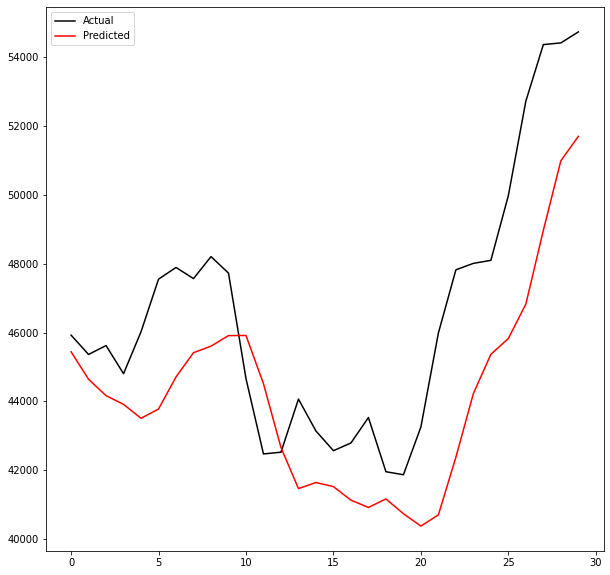

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int2.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 





In [42]:
# test runn of the interval1_ann_model_nextday()
interval2_ann_model_nextday(X, y)

[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00266: early stopping
Training R-Squared: 0.9904381347208153

Testing R-Squared: 0.9898467890546037

30day Holdout R-Squared: -0.8233159355336039

30day Holdout MAE: 4546.376302083333

30day Holdout MAPE: 9.554297726213969

30day Holdout RMSE: 4978.38046596836


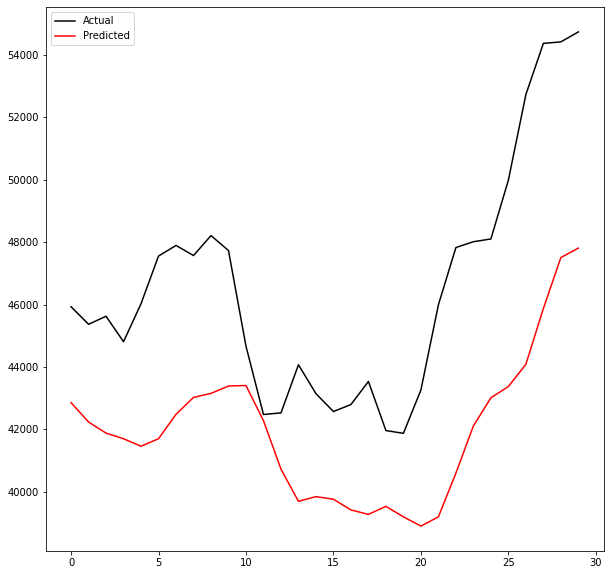

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200Adam0-01relu64Int2.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00187: early stopping
Training R-Squared: 0.9926207012958068

Testing R-Squared: 0.9935036992544694

30day Holdout R-Squared: -9.569325505641322

30day Holdout MAE: 11780.265169270833

30day Holdout MAPE: 25.15183562317136

30day Holdout RMSE: 11986.178932427518


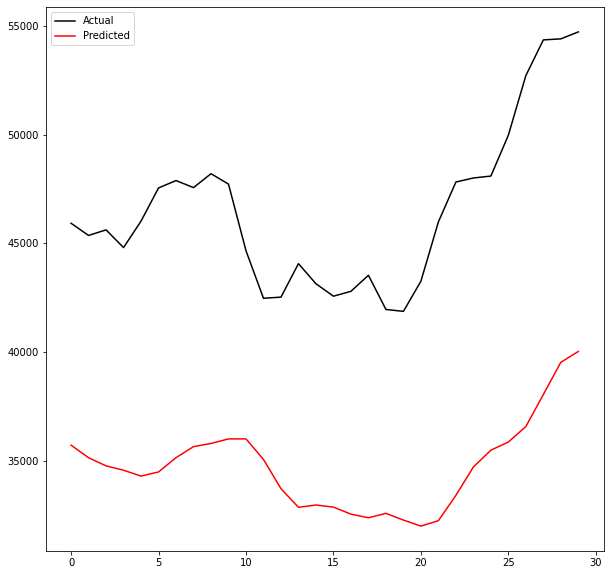

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200Adam0-01elu64Int2.hdf5
Number of Neurons: 200
Activation: elu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00500: early stopping
Training R-Squared: 0.9943290455247444

Testing R-Squared: 0.9928598658380599

30day Holdout R-Squared: 0.3846495250022789

30day Holdout MAE: 2433.5703125

30day Holdout MAPE: 5.07745952811589

30day Holdout RMSE: 2892.1338607763805


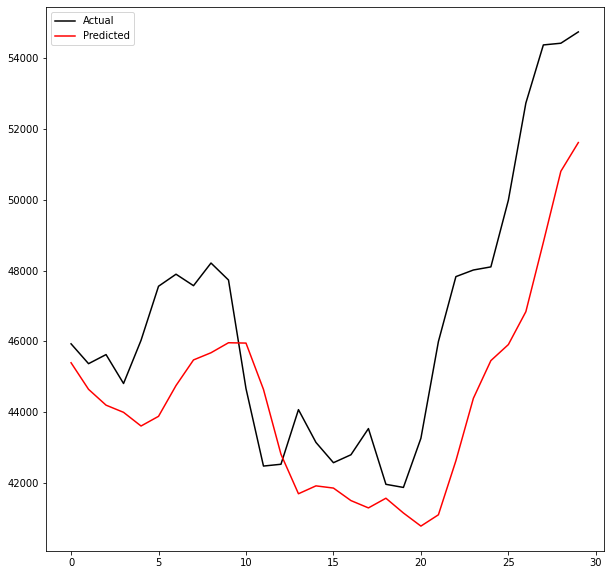

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200Adam0-001relu64Int2.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00467: early stopping
Training R-Squared: 0.9924749501346827

Testing R-Squared: 0.9933907845845323

30day Holdout R-Squared: -5.715520010063279

30day Holdout MAE: 9313.0078125

30day Holdout MAPE: 19.83234901650391

30day Holdout RMSE: 9554.25754186604


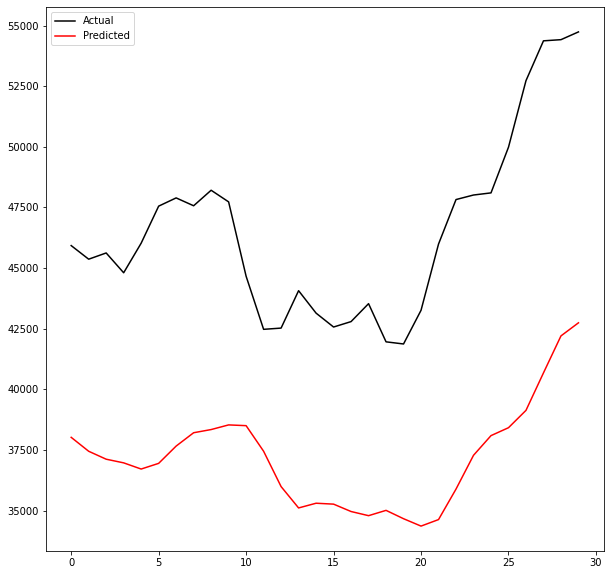

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200Adam0-001elu64Int2.hdf5
Number of Neurons: 200
Activation: elu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00373: early stopping
Training R-Squared: 0.9932498775853846

Testing R-Squared: 0.9936529575782259

30day Holdout R-Squared: -0.9447270450411365

30day Holdout MAE: 4669.16171875

30day Holdout MAPE: 10.362616014032612

30day Holdout RMSE: 5141.459830027065


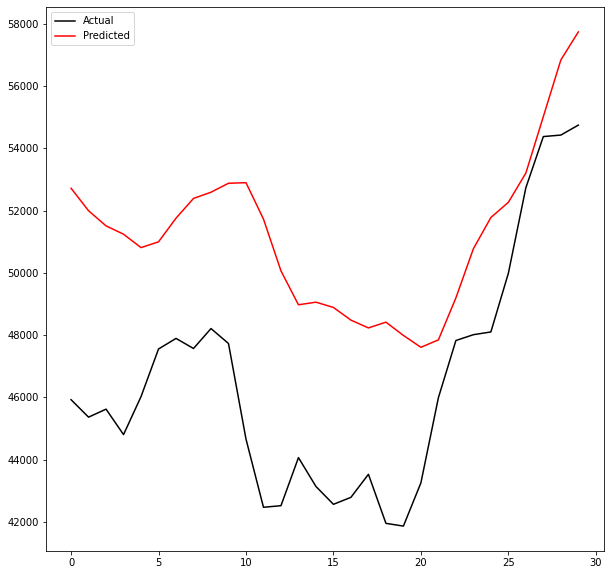

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200Adam0-0001relu64Int2.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00716: early stopping
Training R-Squared: 0.9923179074149506

Testing R-Squared: 0.9940476767885307

30day Holdout R-Squared: -7.704950611137331

30day Holdout MAE: 10632.171875

30day Holdout MAPE: 22.644846699513376

30day Holdout RMSE: 10877.78011777596


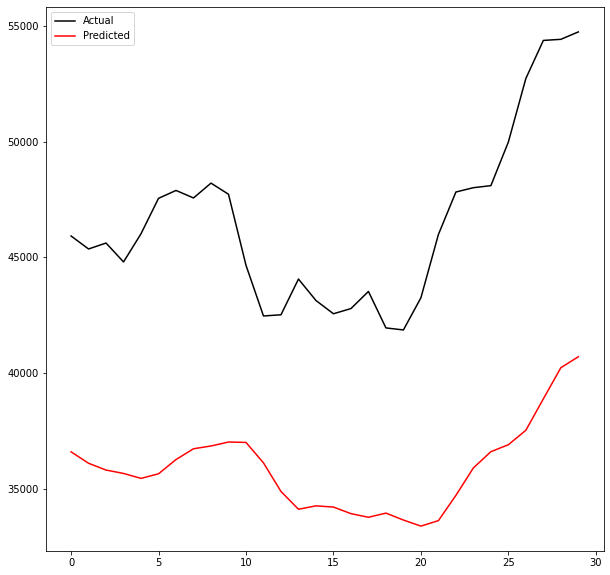

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200Adam0-0001elu64Int2.hdf5
Number of Neurons: 200
Activation: elu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00468: early stopping
Training R-Squared: 0.9942939520423002

Testing R-Squared: 0.9910738199010493

30day Holdout R-Squared: -11.67199690691142

30day Holdout MAE: 12901.028450520833

30day Holdout MAPE: 27.52637881134186

30day Holdout RMSE: 13124.405773034876


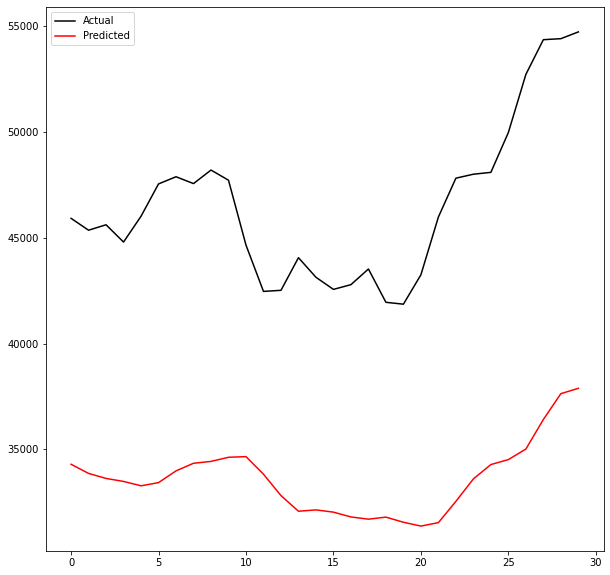

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int2.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00229: early stopping
Training R-Squared: 0.9933228255816111

Testing R-Squared: 0.9937386662777546

30day Holdout R-Squared: -23.906231625175288

30day Holdout MAE: 18248.968880208333

30day Holdout MAPE: 39.09975946929219

30day Holdout RMSE: 18399.716495460692


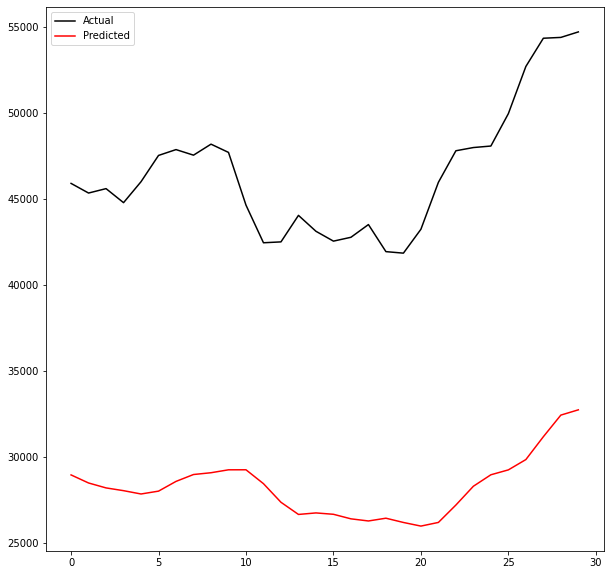

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01elu64Int2.hdf5
Number of Neurons: 300
Activation: elu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00253: early stopping
Training R-Squared: 0.9866552259204828

Testing R-Squared: 0.9848035342286684

30day Holdout R-Squared: 0.5426527936602401

30day Holdout MAE: 2066.475130208333

30day Holdout MAPE: 4.587733622977573

30day Holdout RMSE: 2493.3321404633075


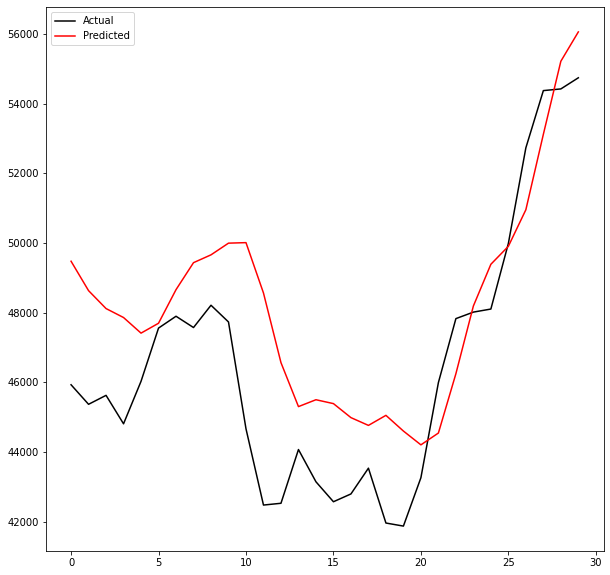

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-001relu64Int2.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00201: early stopping
Training R-Squared: 0.9895373754786002

Testing R-Squared: 0.9906416038534093

30day Holdout R-Squared: -16.673185858889

30day Holdout MAE: 15316.1455078125

30day Holdout MAPE: 32.756606920595274

30day Holdout RMSE: 15499.3877225482


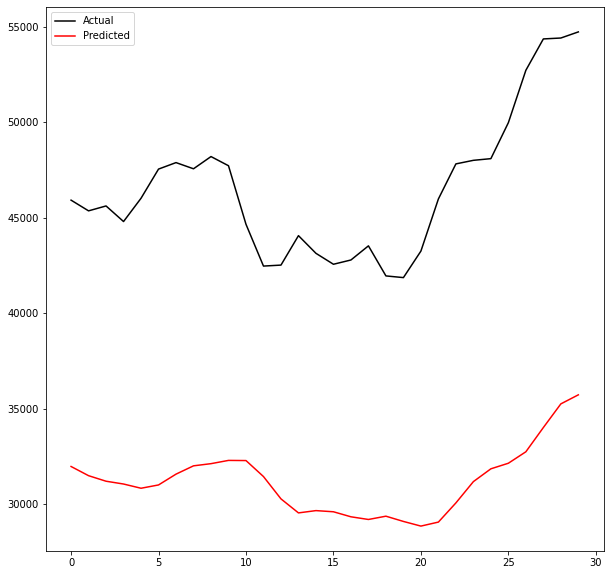

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-001elu64Int2.hdf5
Number of Neurons: 300
Activation: elu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00101: early stopping
Training R-Squared: -3.020664582517832

Testing R-Squared: -3.09049090857292

30day Holdout R-Squared: -159.24484000557823

30day Holdout MAE: 46525.36666666667

30day Holdout MAPE: 100.0

30day Holdout RMSE: 46671.21928733667


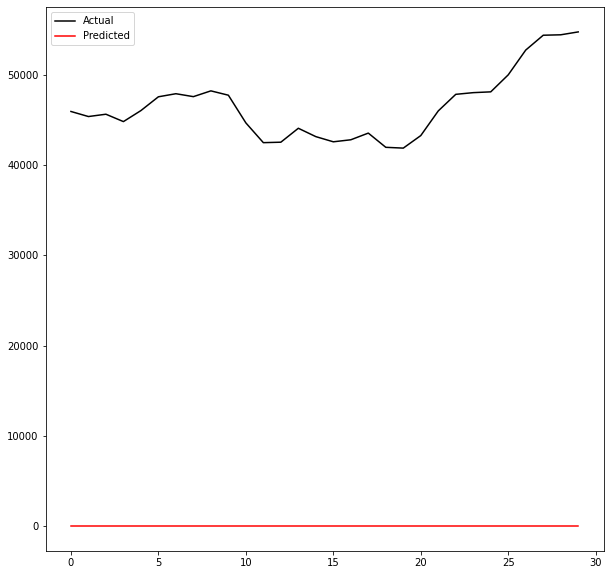

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-0001relu64Int2.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00531: early stopping
Training R-Squared: 0.9924537645693029

Testing R-Squared: 0.9940242091728992

30day Holdout R-Squared: -7.461407590988811

30day Holdout MAE: 10474.866276041666

30day Holdout MAPE: 22.305737707789426

30day Holdout RMSE: 10724.533939779087


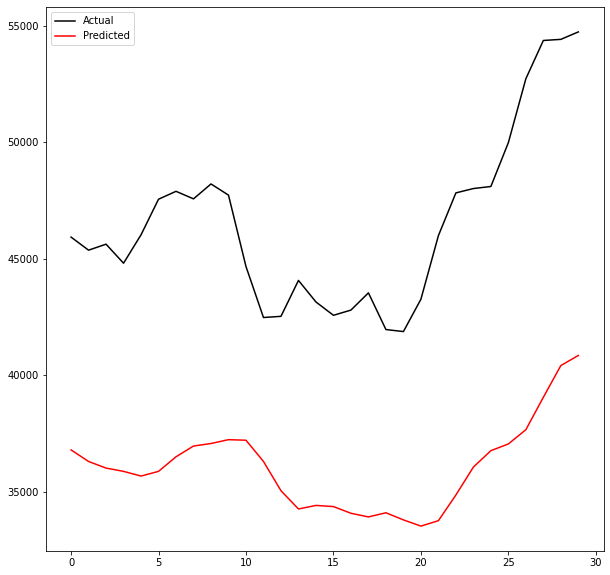

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-0001elu64Int2.hdf5
Number of Neurons: 300
Activation: elu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00101: early stopping
Training R-Squared: -3.020664582517832

Testing R-Squared: -3.09049090857292

30day Holdout R-Squared: -159.24484000557823

30day Holdout MAE: 46525.36666666667

30day Holdout MAPE: 100.0

30day Holdout RMSE: 46671.21928733667


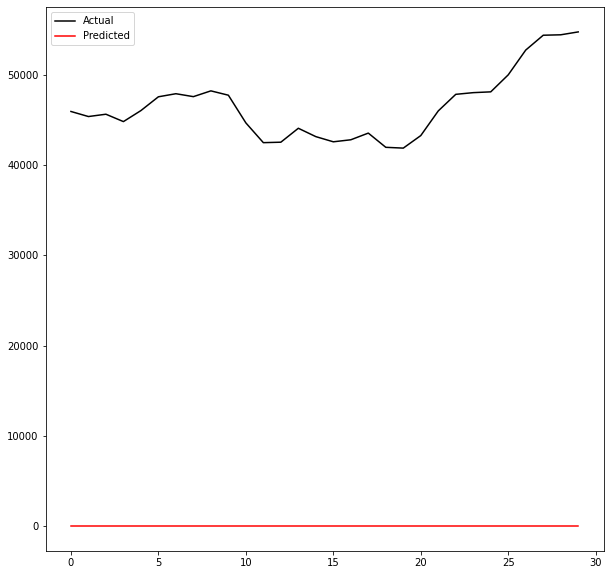

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400Adam0-01relu64Int2.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00312: early stopping
Training R-Squared: 0.9926667073918977

Testing R-Squared: 0.9920923979726083

30day Holdout R-Squared: -19.64336755425401

30day Holdout MAE: 16593.265169270835

30day Holdout MAPE: 35.53269715007308

30day Holdout RMSE: 16751.25665317534


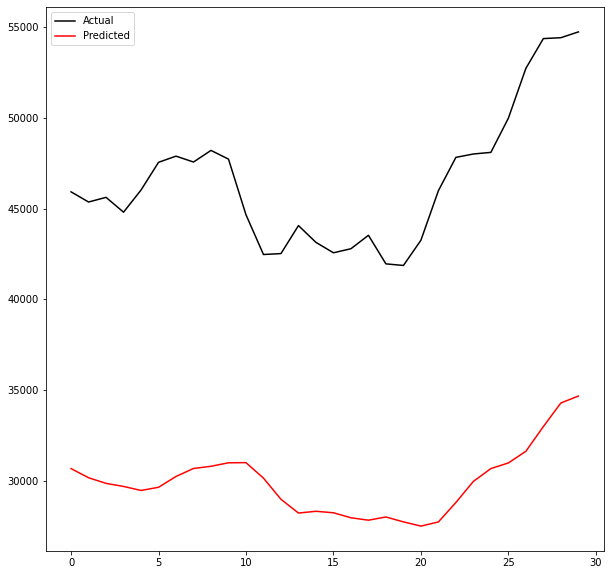

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400Adam0-01elu64Int2.hdf5
Number of Neurons: 400
Activation: elu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00265: early stopping
Training R-Squared: 0.9916853054035413

Testing R-Squared: 0.9902154478718853

30day Holdout R-Squared: 0.5810260061580699

30day Holdout MAE: 1884.2873697916666

30day Holdout MAPE: 3.9155078970740136

30day Holdout RMSE: 2386.440734316324


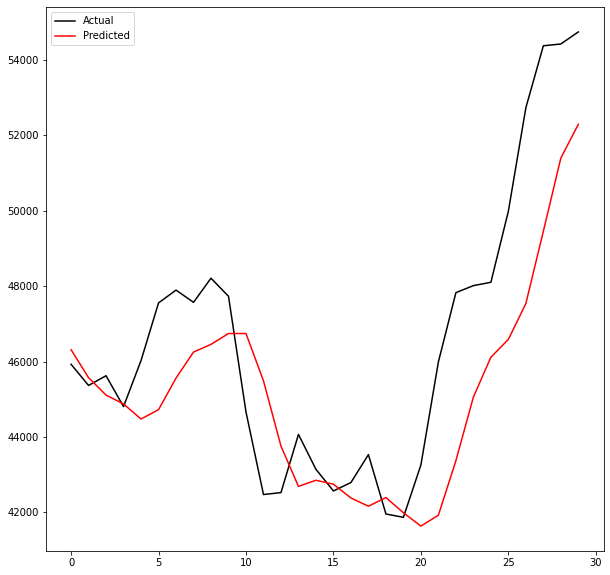

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400Adam0-001relu64Int2.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00220: early stopping
Training R-Squared: 0.9923010408303097

Testing R-Squared: 0.993258442293

30day Holdout R-Squared: -18.05464303846052

30day Holdout MAE: 15913.621549479167

30day Holdout MAPE: 34.04411968314404

30day Holdout RMSE: 16093.760302028597


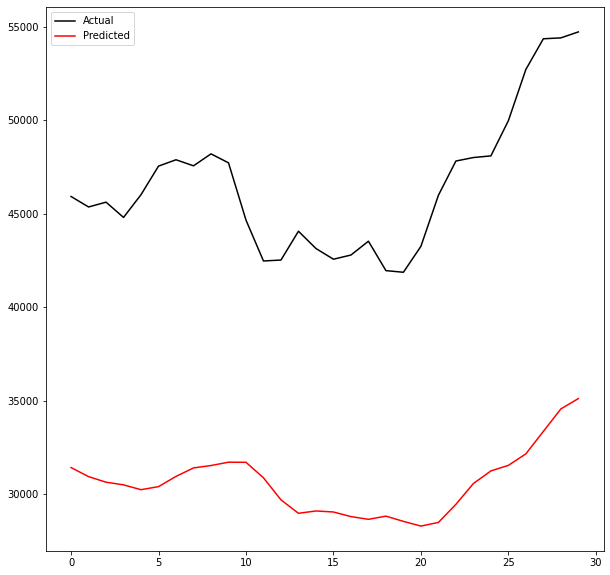

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400Adam0-001elu64Int2.hdf5
Number of Neurons: 400
Activation: elu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00410: early stopping
Training R-Squared: 0.9940309536028373

Testing R-Squared: 0.9930562415770486

30day Holdout R-Squared: -0.119202269435978

30day Holdout MAE: 3410.81796875

30day Holdout MAPE: 7.576565099777167

30day Holdout RMSE: 3900.4203273600156


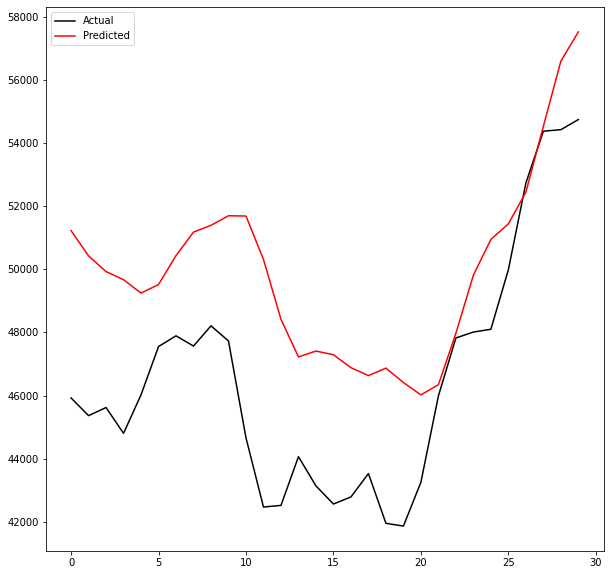

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400Adam0-0001relu64Int2.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00443: early stopping
Training R-Squared: 0.9924961058921102

Testing R-Squared: 0.993865560642583

30day Holdout R-Squared: -11.230309124573267

30day Holdout MAE: 12674.951041666667

30day Holdout MAPE: 27.05079089875293

30day Holdout RMSE: 12893.648814641947


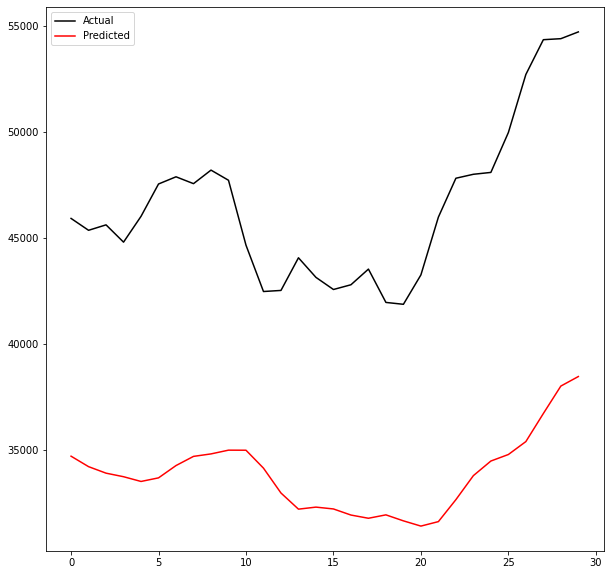

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400Adam0-0001elu64Int2.hdf5
Number of Neurons: 400
Activation: elu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00364: early stopping
Training R-Squared: 0.9930889856061456

Testing R-Squared: 0.9925470247316843

30day Holdout R-Squared: -2.168211230014307

30day Holdout MAE: 6219.30859375

30day Holdout MAPE: 13.159709211403325

30day Holdout RMSE: 6562.422454958671


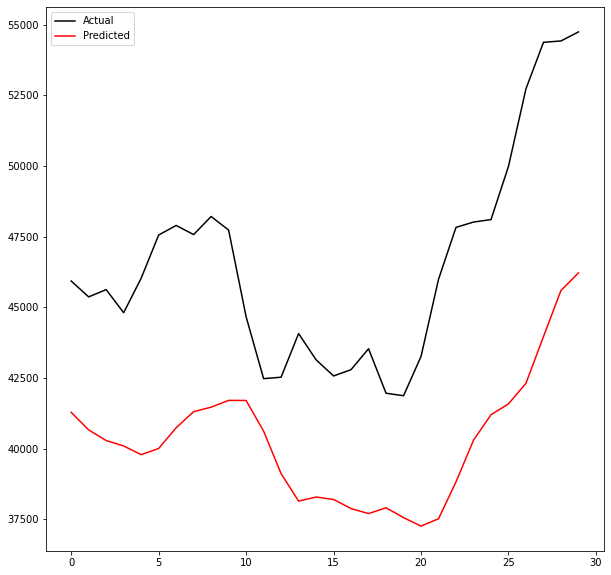

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500Adam0-01relu64Int2.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00336: early stopping
Training R-Squared: 0.9875901834278096

Testing R-Squared: 0.985938960518921

30day Holdout R-Squared: -34.31491526985313

30day Holdout MAE: 21727.370833333334

30day Holdout MAPE: 46.530860613787425

30day Holdout RMSE: 21909.688567189405


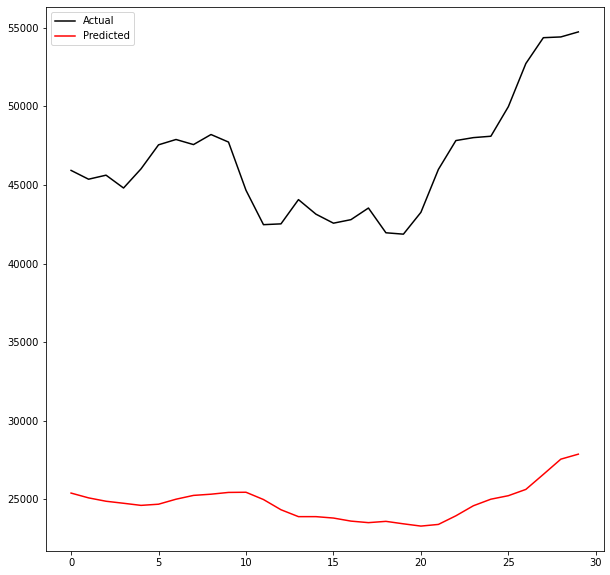

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500Adam0-01elu64Int2.hdf5
Number of Neurons: 500
Activation: elu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00434: early stopping
Training R-Squared: 0.9926373723769458

Testing R-Squared: 0.9900586868195221

30day Holdout R-Squared: 0.4907542626904212

30day Holdout MAE: 2186.327083333333

30day Holdout MAPE: 4.870755023073602

30day Holdout RMSE: 2630.999837533619


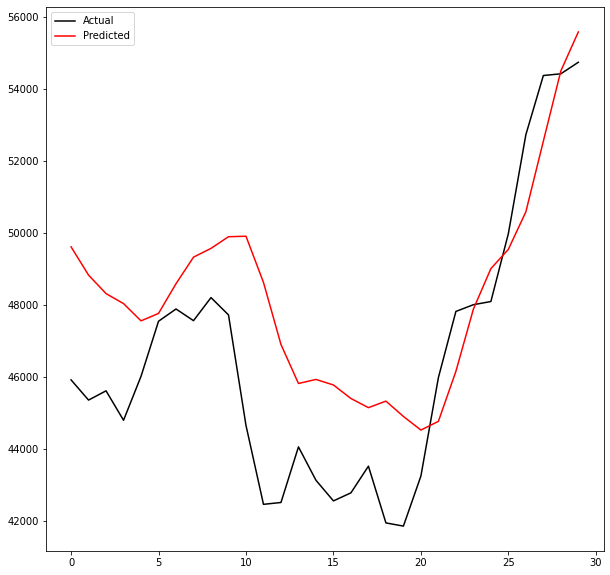

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500Adam0-001relu64Int2.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00468: early stopping
Training R-Squared: 0.9904922207482737

Testing R-Squared: 0.990154098712906

30day Holdout R-Squared: -31.93759050138423

30day Holdout MAE: 21028.916536458335

30day Holdout MAPE: 45.109809328724104

30day Holdout RMSE: 21159.384623658567


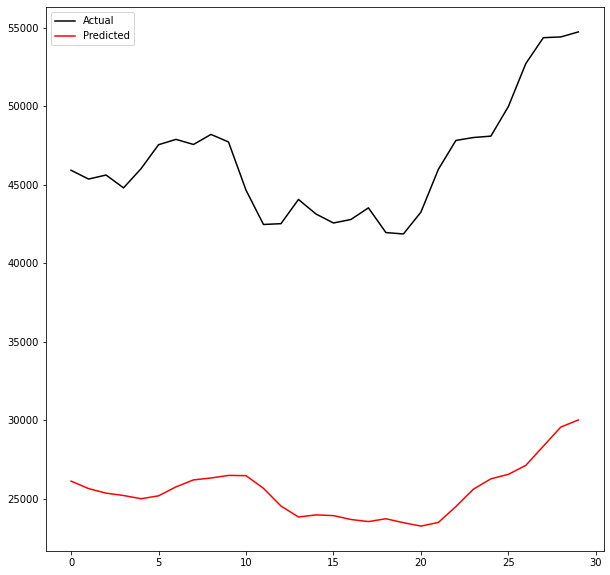

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500Adam0-001elu64Int2.hdf5
Number of Neurons: 500
Activation: elu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00300: early stopping
Training R-Squared: 0.9939661780295713

Testing R-Squared: 0.9929269028069208

30day Holdout R-Squared: -1.338982927873575

30day Holdout MAE: 5292.59453125

30day Holdout MAPE: 11.66448221423239

30day Holdout RMSE: 5638.591678093207


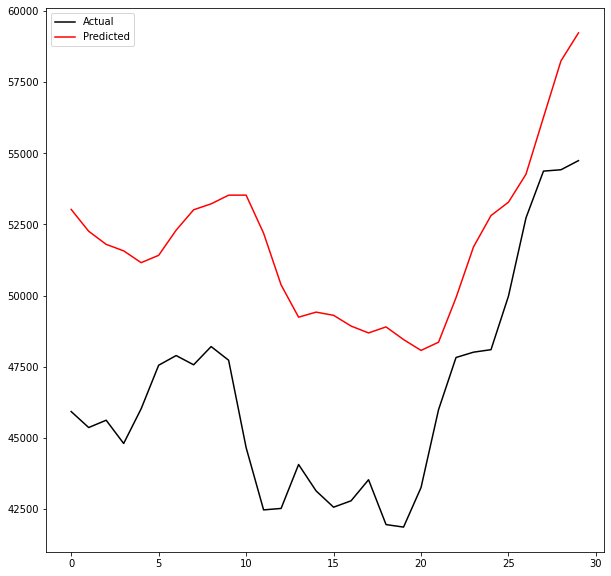

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500Adam0-0001relu64Int2.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00398: early stopping
Training R-Squared: 0.9922648748471444

Testing R-Squared: 0.9936765202773593

30day Holdout R-Squared: -16.412250546185806

30day Holdout MAE: 15204.502669270832

30day Holdout MAPE: 32.516662932798575

30day Holdout RMSE: 15384.542075151712


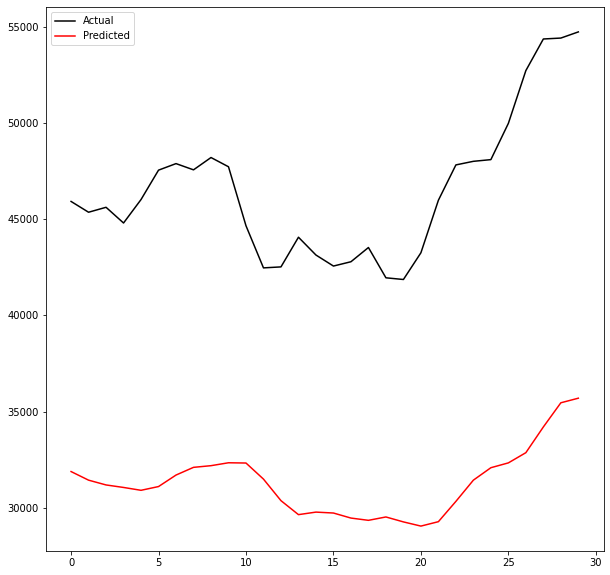

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500Adam0-0001elu64Int2.hdf5
Number of Neurons: 500
Activation: elu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00348: early stopping
Training R-Squared: 0.9895771207417384

Testing R-Squared: 0.9883937241864069

30day Holdout R-Squared: -4.26419318768346

30day Holdout MAE: 8159.808072916667

30day Holdout MAPE: 17.329751992822704

30day Holdout RMSE: 8459.077998873265


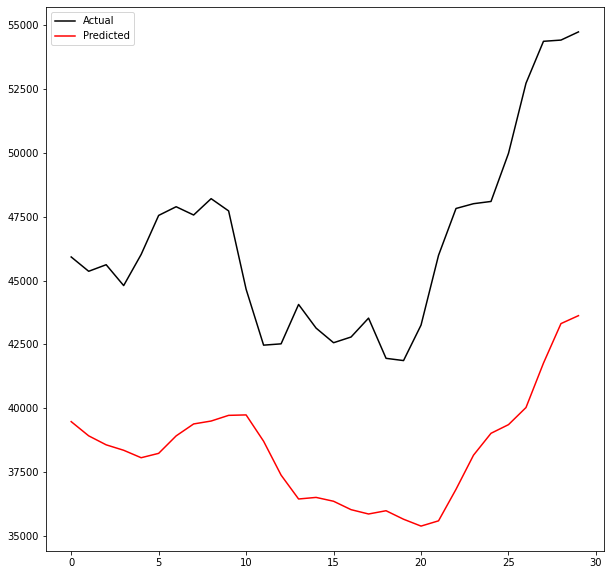

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600Adam0-01relu64Int2.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00263: early stopping
Training R-Squared: 0.9905384063256315

Testing R-Squared: 0.9895102406171681

30day Holdout R-Squared: -36.189609078007486

30day Holdout MAE: 22356.6310546875

30day Holdout MAPE: 47.97027077043305

30day Holdout RMSE: 22483.707498235428


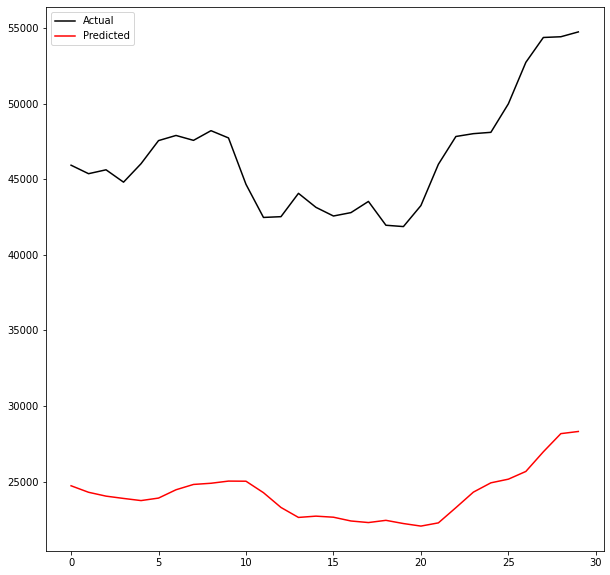

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600Adam0-01elu64Int2.hdf5
Number of Neurons: 600
Activation: elu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00225: early stopping
Training R-Squared: 0.9944521831064016

Testing R-Squared: 0.9930098894493538

30day Holdout R-Squared: 0.6037021526695798

30day Holdout MAE: 1836.7170572916666

30day Holdout MAPE: 3.8249657241184334

30day Holdout RMSE: 2320.96171512686


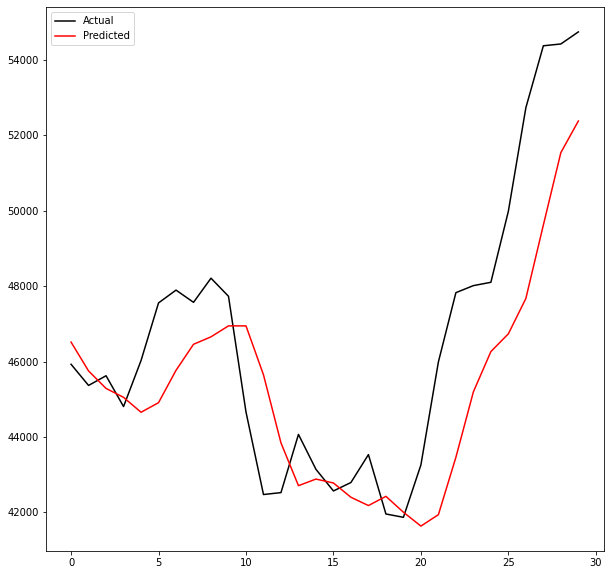

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600Adam0-001relu64Int2.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00219: early stopping
Training R-Squared: 0.991434552734963

Testing R-Squared: 0.9918957855684375

30day Holdout R-Squared: -28.694557088222762

30day Holdout MAE: 19933.691861979165

30day Holdout MAPE: 42.711504058876315

30day Holdout RMSE: 20090.722081613796


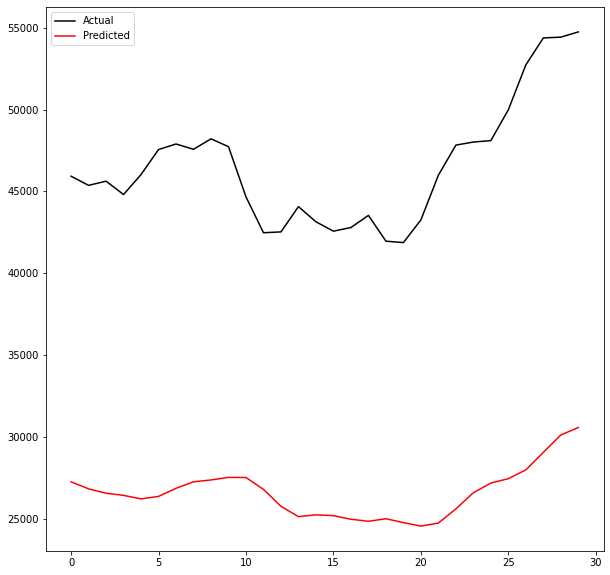

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600Adam0-001elu64Int2.hdf5
Number of Neurons: 600
Activation: elu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00417: early stopping
Training R-Squared: 0.9946342863784147

Testing R-Squared: 0.993033495519669

30day Holdout R-Squared: -0.9208326185261442

30day Holdout MAE: 4710.865625

30day Holdout MAPE: 10.42944071214698

30day Holdout RMSE: 5109.776223028986


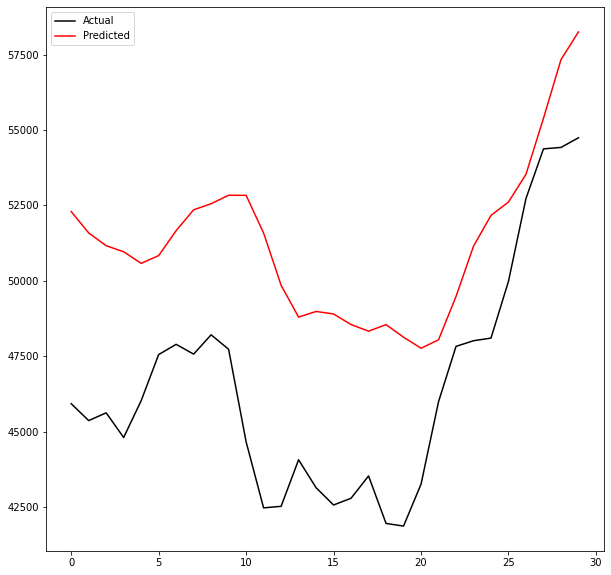

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600Adam0-0001relu64Int2.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00549: early stopping
Training R-Squared: 0.9925398358508752

Testing R-Squared: 0.9936211602497307

30day Holdout R-Squared: -18.80760597298622

30day Holdout MAE: 16226.078645833333

30day Holdout MAPE: 34.710378275164636

30day Holdout RMSE: 16408.659922506526


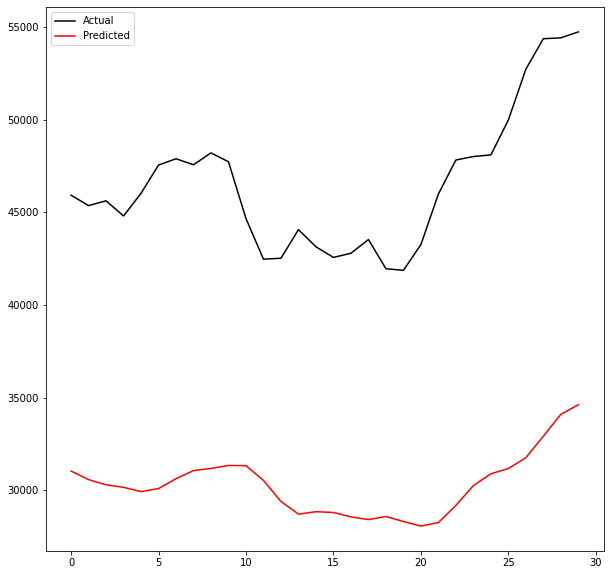

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600Adam0-0001elu64Int2.hdf5
Number of Neurons: 600
Activation: elu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00466: early stopping
Training R-Squared: 0.9878884774338141

Testing R-Squared: 0.9859897144222208

30day Holdout R-Squared: 0.4657747952013793

30day Holdout MAE: 2308.392057291667

30day Holdout MAPE: 5.07830093961575

30day Holdout RMSE: 2694.755128920746


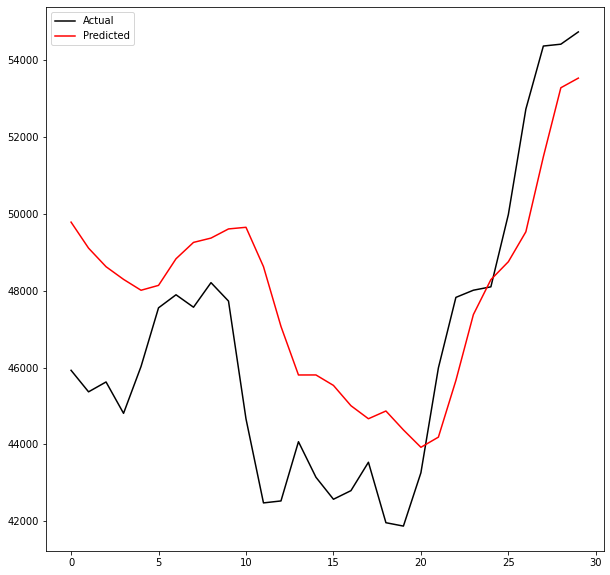

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200RMSprop0-01relu64Int2.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00362: early stopping
Training R-Squared: 0.986364299537418

Testing R-Squared: 0.9831197851995034

30day Holdout R-Squared: -159.25168558521753

30day Holdout MAE: 46526.36666666667

30day Holdout MAPE: 100.0021621847311

30day Holdout RMSE: 46672.2161622951


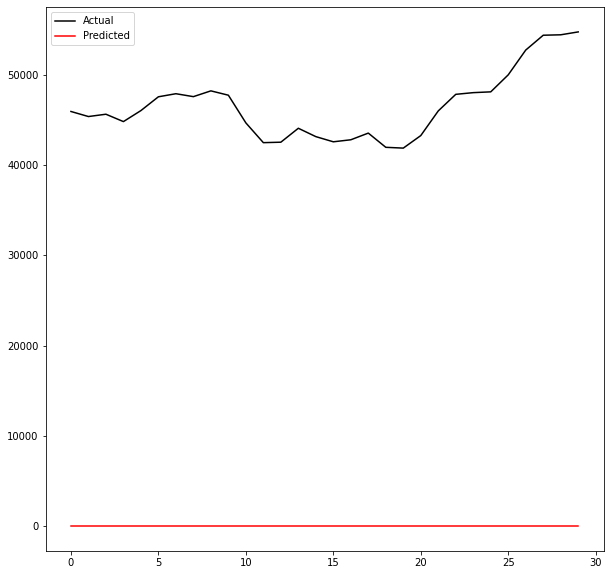

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200RMSprop0-01elu64Int2.hdf5
Number of Neurons: 200
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00401: early stopping
Training R-Squared: 0.9894752484901952

Testing R-Squared: 0.9883307229855491

30day Holdout R-Squared: -1.995794876842246

30day Holdout MAE: 5995.046484375

30day Holdout MAPE: 12.67221964927701

30day Holdout RMSE: 6381.358695395569


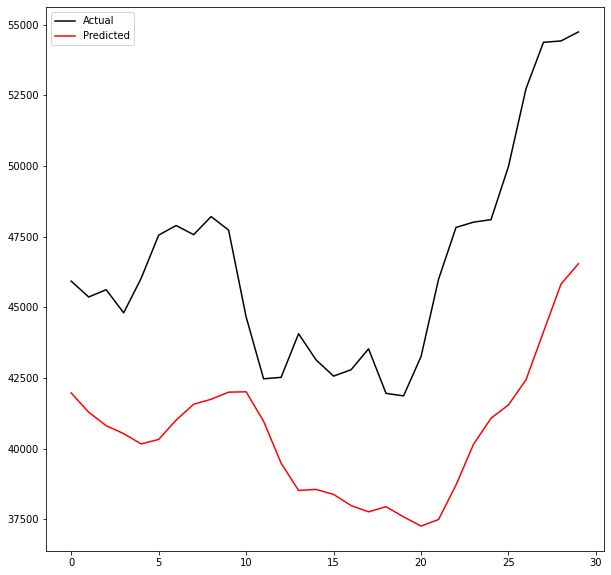

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200RMSprop0-001relu64Int2.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00346: early stopping
Training R-Squared: 0.9903515551846228

Testing R-Squared: 0.9915558753172381

30day Holdout R-Squared: -159.25168558521753

30day Holdout MAE: 46526.36666666667

30day Holdout MAPE: 100.0021621847311

30day Holdout RMSE: 46672.2161622951


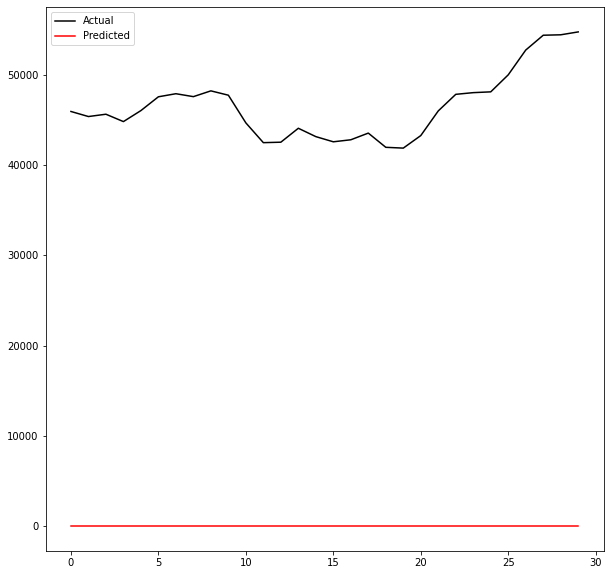

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200RMSprop0-001elu64Int2.hdf5
Number of Neurons: 200
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00531: early stopping
Training R-Squared: 0.9933105366171942

Testing R-Squared: 0.9934231886640131

30day Holdout R-Squared: -0.0230191387497658

30day Holdout MAE: 3218.192317708333

30day Holdout MAPE: 7.177087463287184

30day Holdout RMSE: 3729.0568078461747


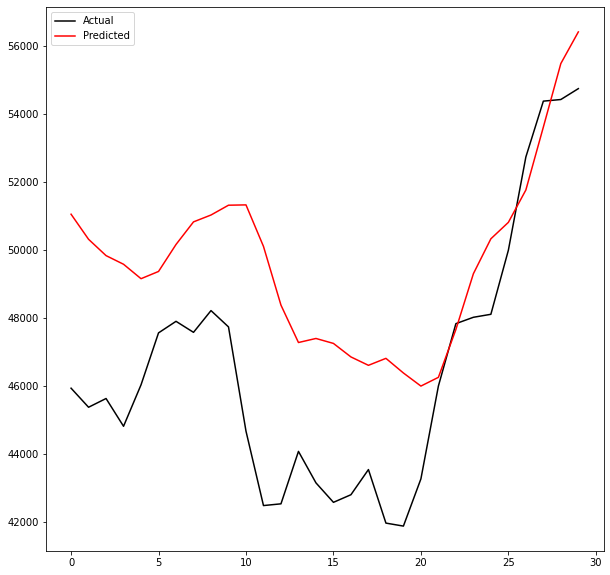

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200RMSprop0-0001relu64Int2.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00921: early stopping
Training R-Squared: 0.9920456022667486

Testing R-Squared: 0.9937204385912966

30day Holdout R-Squared: -5.841443236006699

30day Holdout MAE: 9377.339973958333

30day Holdout MAPE: 19.94513243896579

30day Holdout RMSE: 9643.417824754893


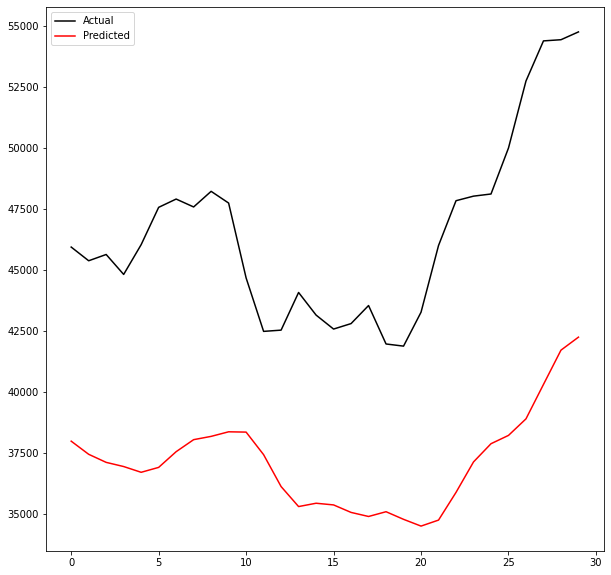

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200RMSprop0-0001elu64Int2.hdf5
Number of Neurons: 200
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00323: early stopping
Training R-Squared: 0.9710354027353743

Testing R-Squared: 0.9657948504029809

30day Holdout R-Squared: -5.653307474695421

30day Holdout MAE: 9208.026041666666

30day Holdout MAPE: 19.56091578589113

30day Holdout RMSE: 9509.899278103863


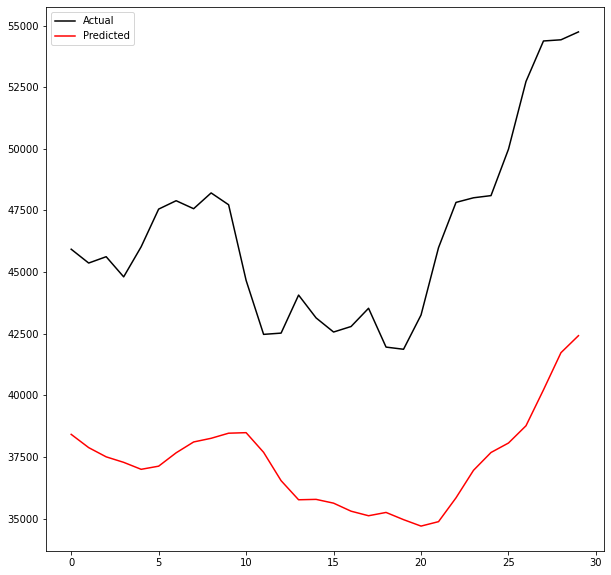

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-01relu64Int2.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00371: early stopping
Training R-Squared: 0.9777512070874058

Testing R-Squared: 0.9782325581928147

30day Holdout R-Squared: -159.25168558521753

30day Holdout MAE: 46526.36666666667

30day Holdout MAPE: 100.0021621847311

30day Holdout RMSE: 46672.2161622951


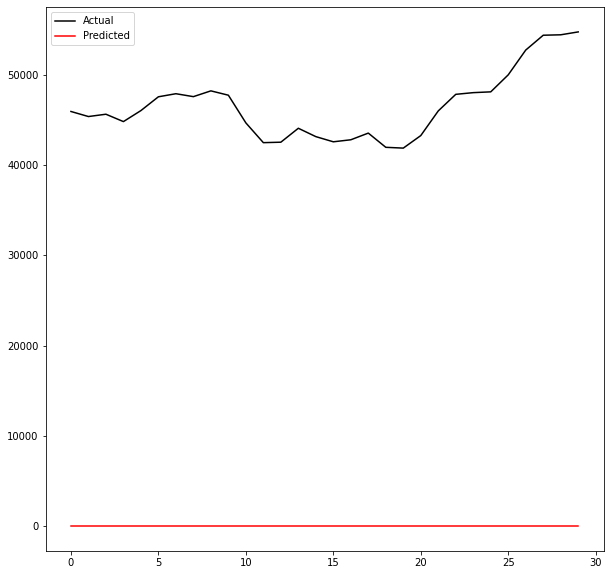

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-01elu64Int2.hdf5
Number of Neurons: 300
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00758: early stopping
Training R-Squared: 0.9917326119705276

Testing R-Squared: 0.989152622134643

30day Holdout R-Squared: -10.627331619231345

30day Holdout MAE: 12259.484375

30day Holdout MAPE: 26.082300094360377

30day Holdout RMSE: 12571.790916421447


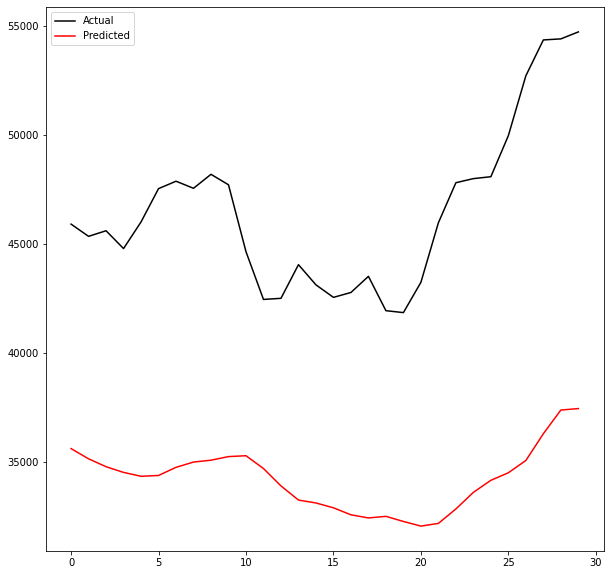

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-001relu64Int2.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00449: early stopping
Training R-Squared: 0.9922690112881486

Testing R-Squared: 0.991907238437511

30day Holdout R-Squared: -159.25168558521753

30day Holdout MAE: 46526.36666666667

30day Holdout MAPE: 100.0021621847311

30day Holdout RMSE: 46672.2161622951


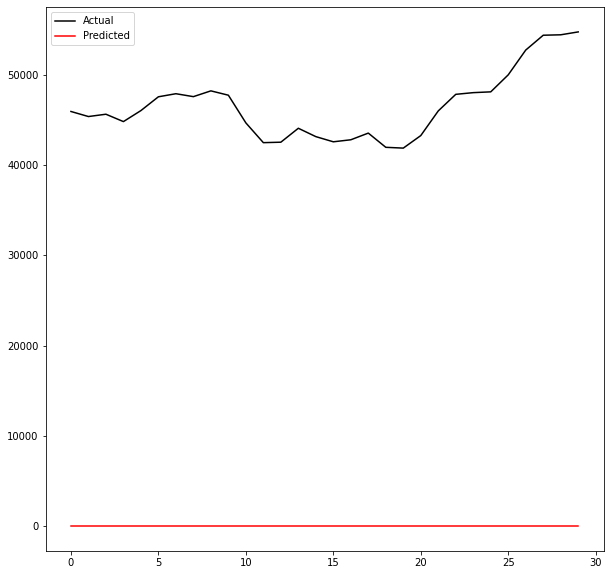

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-001elu64Int2.hdf5
Number of Neurons: 300
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00675: early stopping
Training R-Squared: 0.9924870697626134

Testing R-Squared: 0.9914071680410129

30day Holdout R-Squared: -0.7505123495615915

30day Holdout MAE: 4427.210677083333

30day Holdout MAPE: 9.814370075933285

30day Holdout RMSE: 4877.976565480764


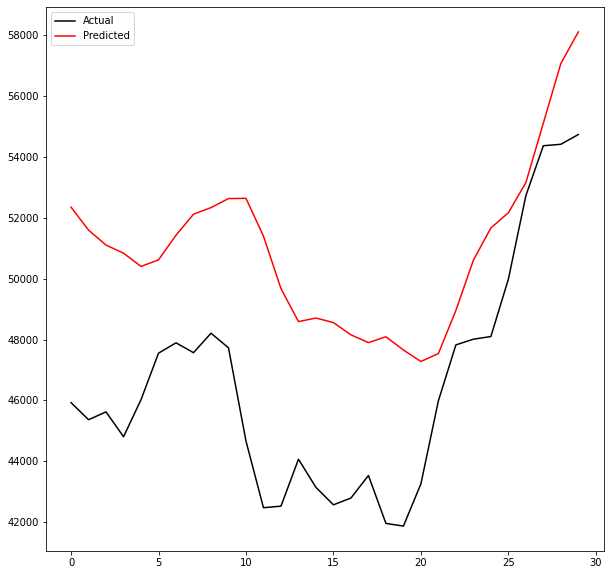

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int2.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00745: early stopping
Training R-Squared: 0.9925762044234847

Testing R-Squared: 0.9939734333757694

30day Holdout R-Squared: -16.939000330437523

30day Holdout MAE: 15437.334635416666

30day Holdout MAPE: 33.02123865597135

30day Holdout RMSE: 15615.512381199467


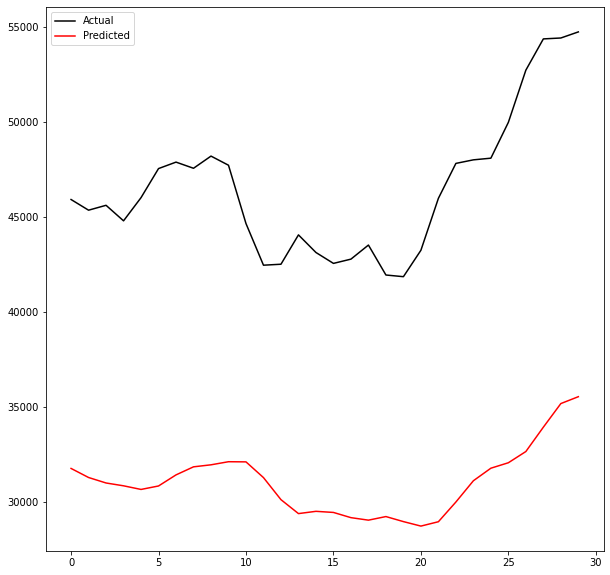

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001elu64Int2.hdf5
Number of Neurons: 300
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00276: early stopping
Training R-Squared: 0.9739055032215626

Testing R-Squared: 0.971017072032233

30day Holdout R-Squared: -0.6374339472312025

30day Holdout MAE: 4077.3977864583335

30day Holdout MAPE: 8.46561833864487

30day Holdout RMSE: 4717.7944488256735


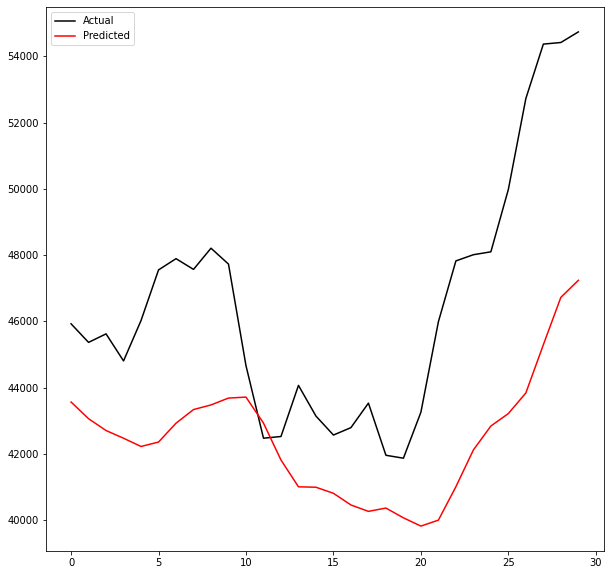

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400RMSprop0-01relu64Int2.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00170: early stopping
Training R-Squared: 0.9806060815114255

Testing R-Squared: 0.9794074222630851

30day Holdout R-Squared: -159.25168558521753

30day Holdout MAE: 46526.36666666667

30day Holdout MAPE: 100.0021621847311

30day Holdout RMSE: 46672.2161622951


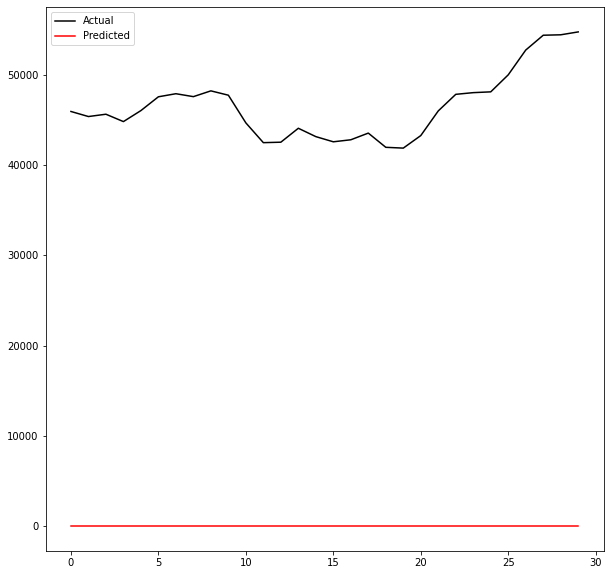

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400RMSprop0-01elu64Int2.hdf5
Number of Neurons: 400
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00723: early stopping
Training R-Squared: 0.9862537194143247

Testing R-Squared: 0.9845017514356159

30day Holdout R-Squared: -7.4877542589724815

30day Holdout MAE: 10387.193880208333

30day Holdout MAPE: 22.039253365934893

30day Holdout RMSE: 10741.21769612103


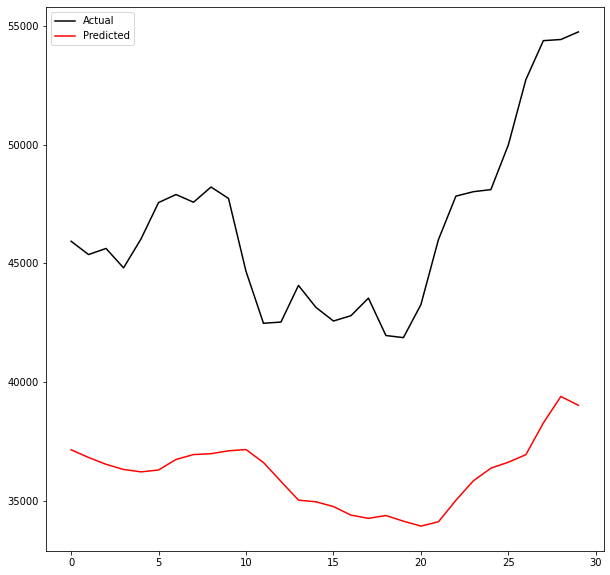

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400RMSprop0-001relu64Int2.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00328: early stopping
Training R-Squared: 0.9879947710100271

Testing R-Squared: 0.9881298694922986

30day Holdout R-Squared: -159.25168558521753

30day Holdout MAE: 46526.36666666667

30day Holdout MAPE: 100.0021621847311

30day Holdout RMSE: 46672.2161622951


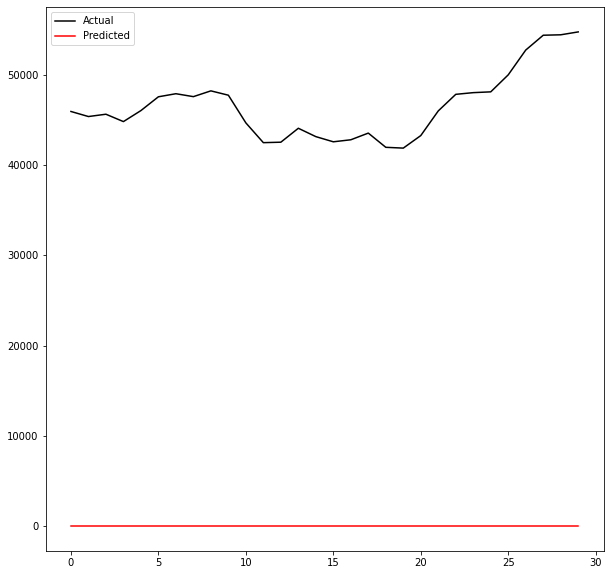

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400RMSprop0-001elu64Int2.hdf5
Number of Neurons: 400
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00417: early stopping
Training R-Squared: 0.9934813393756868

Testing R-Squared: 0.992555210709012

30day Holdout R-Squared: -0.40655063970820615

30day Holdout MAE: 3885.42109375

30day Holdout MAPE: 8.630526533616164

30day Holdout RMSE: 4372.550221922472


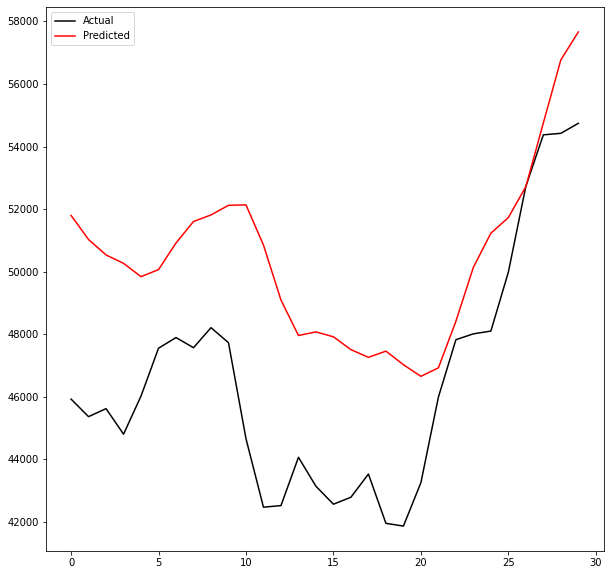

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400RMSprop0-0001relu64Int2.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00505: early stopping
Training R-Squared: 0.9906306332505277

Testing R-Squared: 0.9921129471202121

30day Holdout R-Squared: -19.569854561604092

30day Holdout MAE: 16573.7208984375

30day Holdout MAPE: 35.49883538945856

30day Holdout RMSE: 16721.403644100283


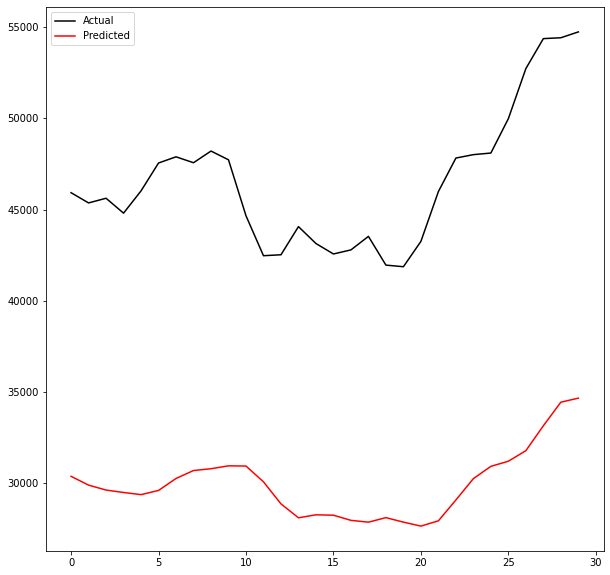

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400RMSprop0-0001elu64Int2.hdf5
Number of Neurons: 400
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00173: early stopping
Training R-Squared: 0.9142662940954787

Testing R-Squared: 0.909361894877342

30day Holdout R-Squared: -15.078014588686173

30day Holdout MAE: 14549.1728515625

30day Holdout MAPE: 31.059970809073672

30day Holdout RMSE: 14783.36600565159


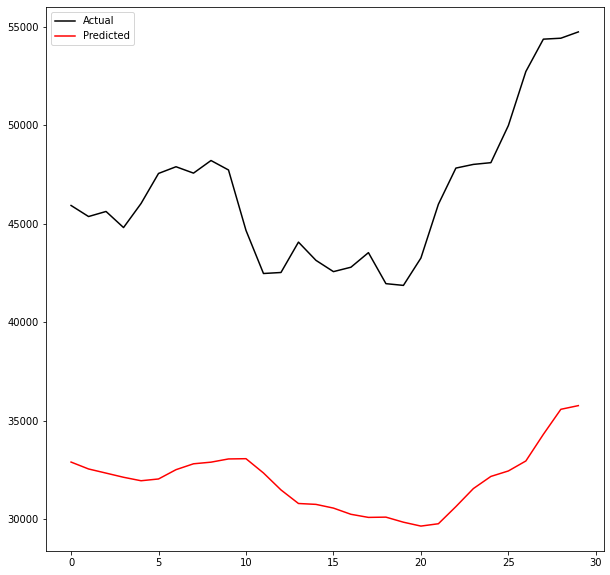

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500RMSprop0-01relu64Int2.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00101: early stopping
Training R-Squared: -3.034261771231619

Testing R-Squared: -3.1037160911206927

30day Holdout R-Squared: -159.25168558521753

30day Holdout MAE: 46526.36666666667

30day Holdout MAPE: 100.0021621847311

30day Holdout RMSE: 46672.2161622951


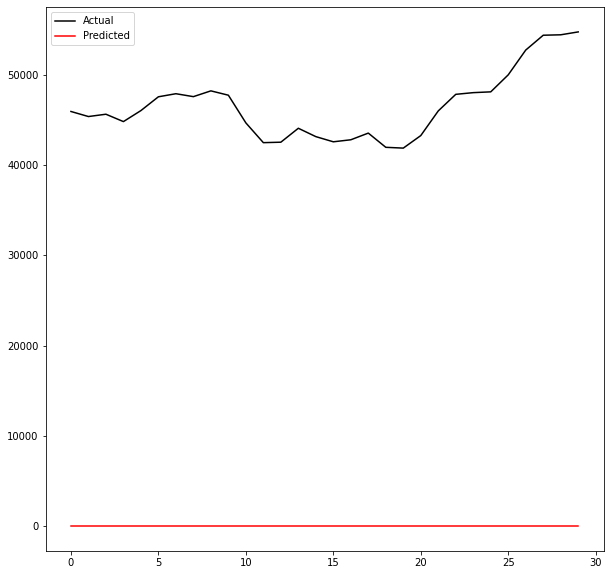

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500RMSprop0-01elu64Int2.hdf5
Number of Neurons: 500
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00301: early stopping
Training R-Squared: 0.9887658187343166

Testing R-Squared: 0.9883109084476074

30day Holdout R-Squared: 0.22095920731049112

30day Holdout MAE: 2560.739713541667

30day Holdout MAPE: 5.2532618023436335

30day Holdout RMSE: 3254.1473907136074


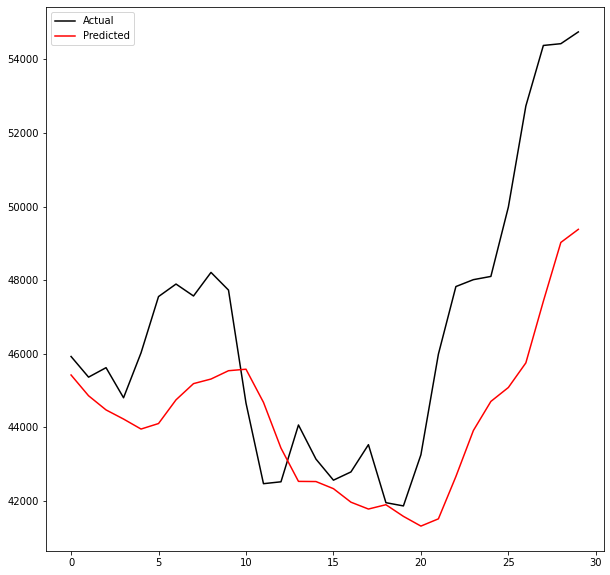

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500RMSprop0-001relu64Int2.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00263: early stopping
Training R-Squared: 0.9902015078766792

Testing R-Squared: 0.9916038894228882

30day Holdout R-Squared: -55.03716440360993

30day Holdout MAE: 27394.047591145834

30day Holdout MAPE: 58.68727578016769

30day Holdout RMSE: 27599.117508057498


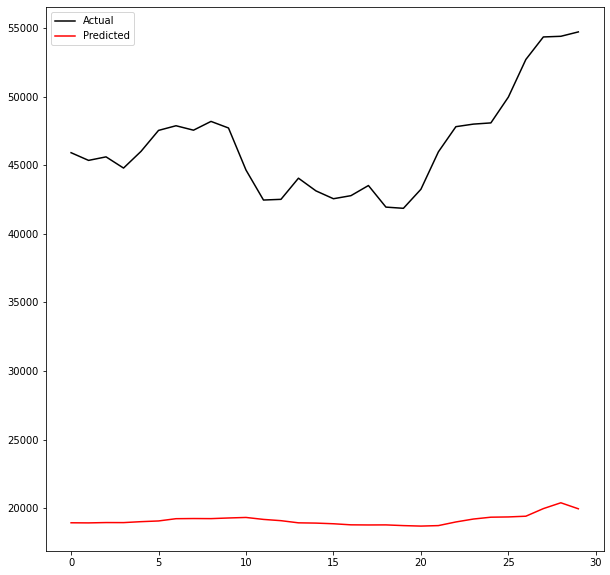

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500RMSprop0-001elu64Int2.hdf5
Number of Neurons: 500
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00542: early stopping
Training R-Squared: 0.9941921684495392

Testing R-Squared: 0.9926339297410066

30day Holdout R-Squared: -0.3014778568711747

30day Holdout MAE: 3697.1529947916665

30day Holdout MAPE: 8.237888296362666

30day Holdout RMSE: 4206.060466422233


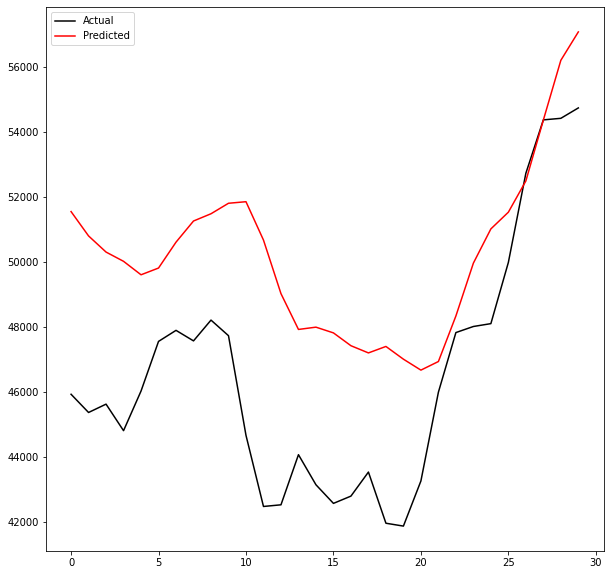

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500RMSprop0-0001relu64Int2.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00325: early stopping
Training R-Squared: 0.9921449948957132

Testing R-Squared: 0.9936489596089821

30day Holdout R-Squared: -43.63870633224996

30day Holdout MAE: 24502.1310546875

30day Holdout MAPE: 52.58079712814497

30day Holdout RMSE: 24632.751182120763


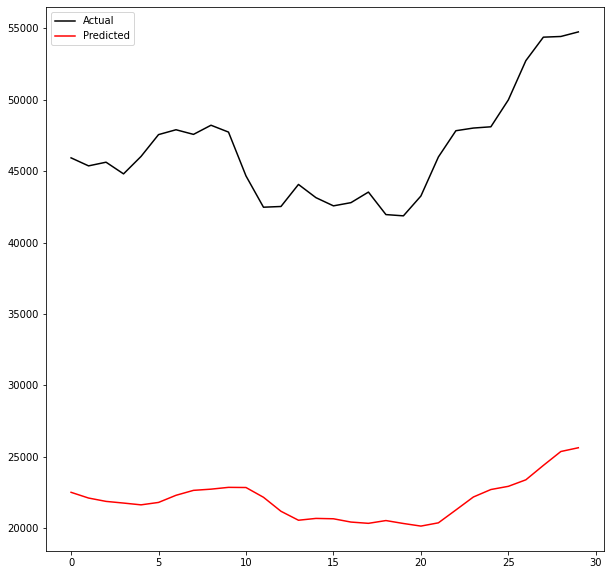

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500RMSprop0-0001elu64Int2.hdf5
Number of Neurons: 500
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00162: early stopping
Training R-Squared: 0.8918155614633986

Testing R-Squared: 0.8808908621932654

30day Holdout R-Squared: -4.2004476392407835

30day Holdout MAE: 7987.825130208334

30day Holdout MAPE: 16.86837631056348

30day Holdout RMSE: 8407.705364684007


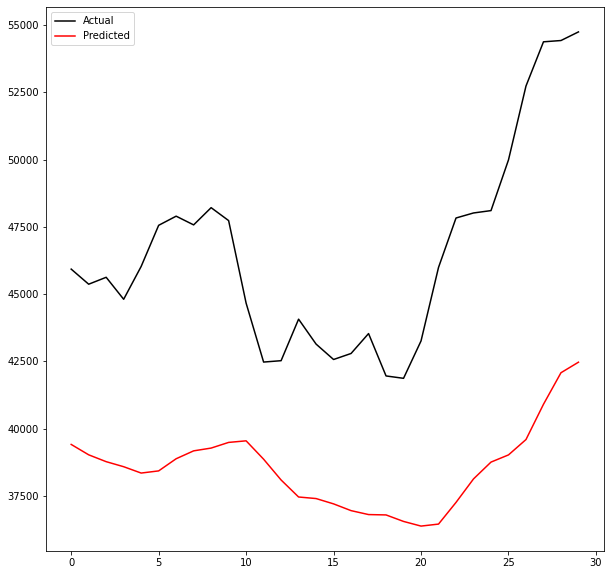

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600RMSprop0-01relu64Int2.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00101: early stopping
Training R-Squared: -3.03426176918897

Testing R-Squared: -3.1037160911206927

30day Holdout R-Squared: -159.25168558521753

30day Holdout MAE: 46526.36666666667

30day Holdout MAPE: 100.0021621847311

30day Holdout RMSE: 46672.2161622951


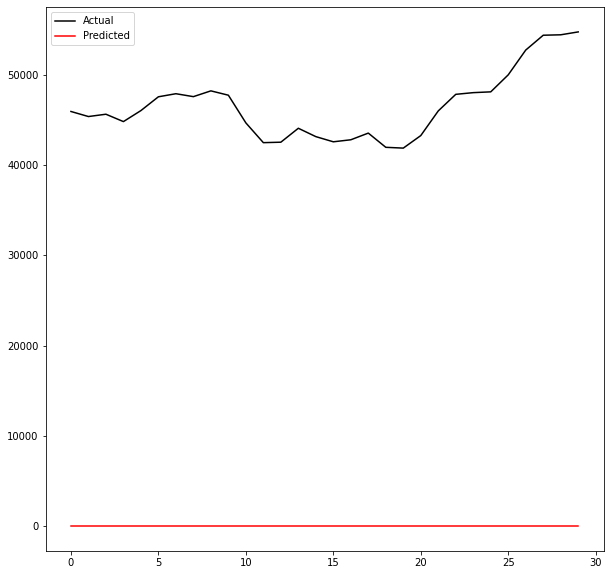

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600RMSprop0-01elu64Int2.hdf5
Number of Neurons: 600
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00383: early stopping
Training R-Squared: 0.9797389822917436

Testing R-Squared: 0.9788755195061987

30day Holdout R-Squared: -1.532657805658391

30day Holdout MAE: 5325.011848958334

30day Holdout MAPE: 11.146389665801697

30day Holdout RMSE: 5867.3956913551


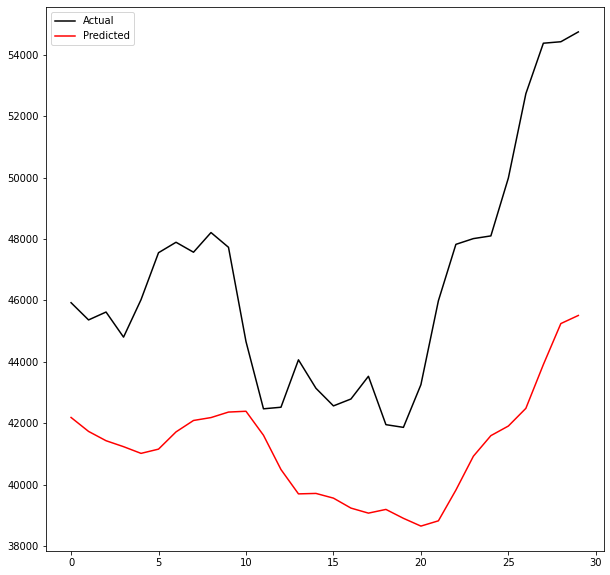

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600RMSprop0-001relu64Int2.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00553: early stopping
Training R-Squared: 0.9934022462956548

Testing R-Squared: 0.991517082540355

30day Holdout R-Squared: -95.99714842228559

30day Holdout MAE: 36144.36819661458

30day Holdout MAPE: 77.58862273941709

30day Holdout RMSE: 36310.86572353311


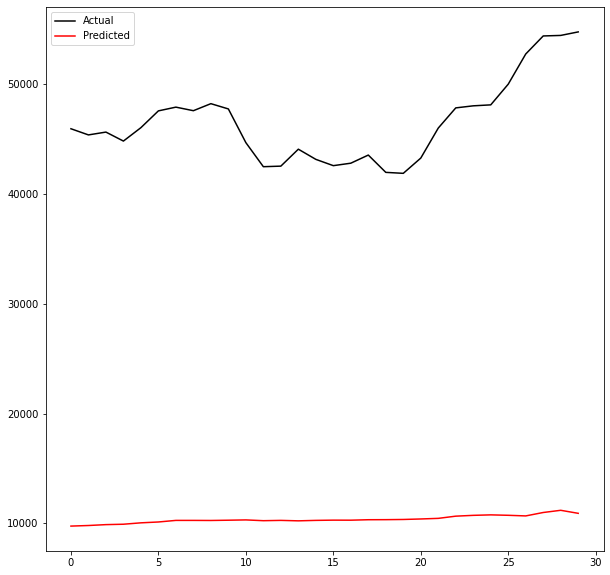

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600RMSprop0-001elu64Int2.hdf5
Number of Neurons: 600
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00626: early stopping
Training R-Squared: 0.9934110823760942

Testing R-Squared: 0.9916085678329807

30day Holdout R-Squared: -0.6682990126866988

30day Holdout MAE: 4302.563411458334

30day Holdout MAPE: 9.5470840446852

30day Holdout RMSE: 4762.051265570321


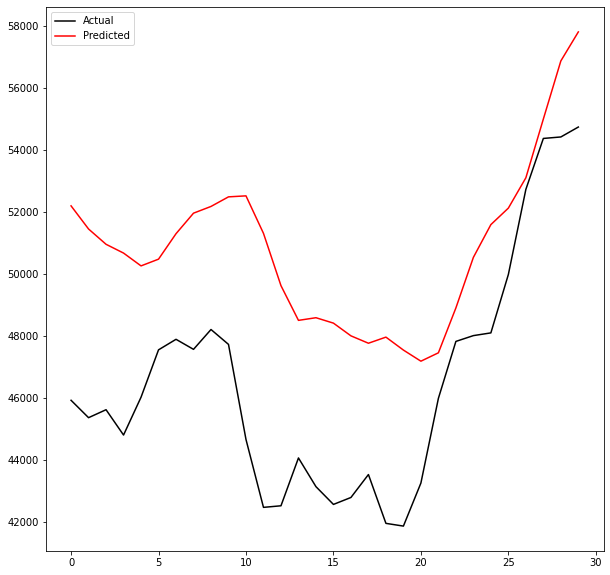

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600RMSprop0-0001relu64Int2.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00487: early stopping
Training R-Squared: 0.9921074169963322

Testing R-Squared: 0.9934667340321416

30day Holdout R-Squared: -29.606570202743256

30day Holdout MAE: 20237.693424479166

30day Holdout MAPE: 43.360872407888735

30day Holdout RMSE: 20396.913425576575


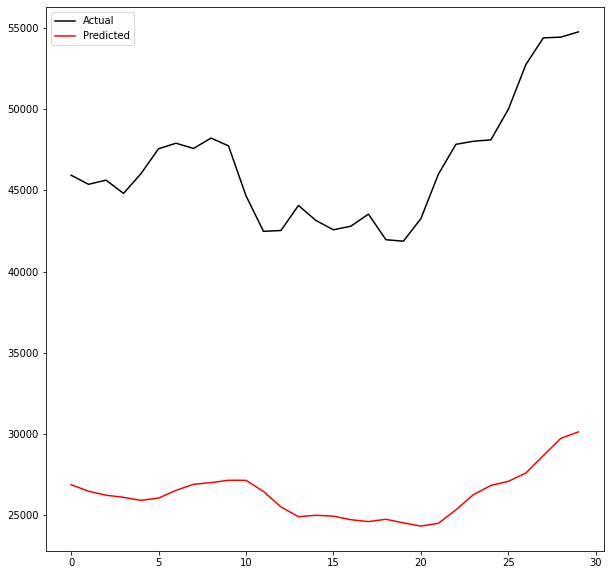

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600RMSprop0-0001elu64Int2.hdf5
Number of Neurons: 600
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 





In [43]:
opt_list = ['Adam', 'RMSprop']
activation_list = ['relu', 'elu']
neuron_list = [200, 300, 400, 500, 600]
lr_list = [0.01, 0.001, 0.0001]

for op in opt_list:
    for neuron in neuron_list:
        for l in lr_list:
            for act in activation_list:
                interval2_ann_model_nextday(X, y, lr=l, activation=act,
                                            neurons=neuron, opt=op, batch_size=64, epochs=5000)

## Interval 3 ANN Model

In [44]:
# double check that the X df has only feature columns and Date as the first column
X.columns

Index(['Date', 'median_transaction_fee30trxUSD',
       'median_transaction_fee7trxUSD', 'price90emaUSD', 'size90trx',
       'transactions', 'price30wmaUSD', 'price3wmaUSD', 'price7wmaUSD',
       'median_transaction_fee7rocUSD', 'difficulty30rsi'],
      dtype='object')

In [45]:
# double check y and X have same number of rows
y.shape, X.shape

((4102,), (4102, 11))

In [46]:
# create a 3 hidden layer model function for testing hyperparameters

def interval3_ann_model_nextday(X, y, lr=0.01, neurons=300, activation='relu', opt='Adam', batch_size=64, epochs=5000):
    ''' 
        X is a dataframe of the dates and features using non-standardized values
        The Date column must be the first column in the X dataframe
        y is a dataframe or 1D array of the target values
    '''
    # assign the string values to variables for file naming later in the Checkpoint
    opt_name = opt
    acti = activation
    # remove the . in the learning rate
    learn_rt = re.sub('\.', '-', str(lr))
    
    # create a holdout series of the last 30 days of data
    X_holdout = X.iloc[-30:, 1:] # exclude the first column which is the date column
    y_holdout = y[-30:]
    
    # extract the data from the dates of Interval 1
    date_bool = (X.iloc[:, 0] >= '2013/04/01') & (X.iloc[:, 0] <= '2019/12/31')
    X = X[date_bool]
    # remove the date column
    X = X.iloc[:, 1:]
    # adjust the range of y df
    y = y[X.index]
    
    # create train test split of data
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=15)
    
    # scale the data
    estimators = [] # create a list for the scalers
    estimators.append(['minmax', MinMaxScaler()])
    estimators.append(['robust', RobustScaler()])
    # add the scalers to the Pipeline
    scale = Pipeline(estimators, verbose=True)
    # fit the scaler to the training data
    scale.fit(X_train)
    # transform the training, testing, and holdout data
    X_train = scale.transform(X_train)
    X_test = scale.transform(X_test)
    X_holdout = scale.transform(X_holdout)
    
#     # select an optimizer
#     if opt == 'Adam':
#         opt = tf.keras.optimizers.Adam(learning_rate=lr)
#     elif opt == 'RMSProp':
#         opt = tf.keras.optimizers.RMSprop(learning_rate=lr)
#     elif opt == 'Adagrad':
#         opt = tf.keras.optimizers.Adagrad(learning_rate=lr)
        
    # define the shape of the input number of features
    shape = X_train.shape[1]
    
    # create call backs to save the model after each epoch if it is the best seen so far
    # and for early stopping when model has not improved after 100 epochs
    mcp_save = ModelCheckpoint('trained_models/ANN4_reg_nextday' + str(neurons)+ opt_name + str(learn_rt)+ acti +str(batch_size)+'Int3.hdf5', save_best_only=True, monitor='val_loss', mode='auto')
    earlyStopping = EarlyStopping(monitor='val_loss', patience=100, verbose=1, mode='auto')
        
    # create a special definition for the ANN model to adjust hyperparameters
    def seq_model(initializer='normal', activation=activation, neurons=neurons, NUM_FEATURES=shape, opt=opt, lr=lr):
        # create model
        model = Sequential()
        model.add(Dense(neurons, input_shape=(NUM_FEATURES,), kernel_initializer=initializer, activation=activation))
        model.add(Dense(neurons, activation=activation))
        model.add(Dense(neurons, activation=activation))
        model.add(Dense(neurons, activation=activation))
        model.add(Dense(neurons, activation=activation))
        model.add(Dense(1, activation=activation, kernel_initializer=initializer))
        # Compile model
        # select an optimizer
        if opt == 'Adam':
            opt = tf.keras.optimizers.Adam(learning_rate=lr)
        elif opt == 'RMSprop':
            opt = tf.keras.optimizers.RMSprop(learning_rate=lr)
        elif opt == 'Adagrad':
            opt = tf.keras.optimizers.Adagrad(learning_rate=lr)
        
        model.compile(loss='logcosh', optimizer=opt, metrics=['mae'])
        return model
        
    # define the 4 Dense layer model
    ann_model = seq_model(activation=activation, neurons=neurons, NUM_FEATURES=shape)
    

    # create the regressor
    regressor=KerasRegressor(build_fn=seq_model, batch_size=batch_size, epochs=epochs, verbose=0, shuffle=True,
                         validation_split=0.1, validation_freq=1,
                        use_multiprocessing=True, callbacks=[mcp_save,earlyStopping])
    
    # fit the model on training data
    regressor.fit(X_train, y_train)
    
    # use training data for predictions
    y_train_pred = regressor.predict(X_train)
    # calculate R-squared score for train data
    r2 = r2_score(y_train, y_train_pred)
    print('Training R-Squared:', r2)
    
    # use testing data for predictions
    y_test_pred = regressor.predict(X_test)
    # calculate R-squared score for test data
    r2 = r2_score(y_test, y_test_pred)
    print('\nTesting R-Squared:', r2)
    
    # use holdout data for predictions
    y_holdout_pred = regressor.predict(X_holdout)
    # calculate R-squared score for holdout data
    r2 = r2_score(y_holdout, y_holdout_pred)
    print('\n30day Holdout R-Squared:', r2)
    # calculate mean absolute error for holdout data
    mae = mean_absolute_error(y_holdout, y_holdout_pred)
    print('\n30day Holdout MAE:', mae)
    # calculate mean absolute percentage error for holdout data
    mape = mean_absolute_percentage_error(y_holdout, y_holdout_pred)
    print('\n30day Holdout MAPE:', mape)
    # calculate root mean squared error 
    rmse = np.sqrt(mean_squared_error(y_holdout, y_holdout_pred))
    print('\n30day Holdout RMSE:', rmse)
    
    # create a df of the holdout predicted and actual
    holdout_df = pd.DataFrame(zip(y_holdout, y_holdout_pred), columns=['actual', 'predicted'])
    
    plt.plot(holdout_df.index, holdout_df['actual'], color='black', label='Actual')
    plt.plot(holdout_df.index, holdout_df['predicted'], color='red', label='Predicted')
    plt.legend()
    plt.show()
    
    print('---------Model Summary For Above Results----------')
    print('trained_models/ANN4_reg_nextday' + str(neurons)+ opt_name + str(learn_rt)+ acti +str(batch_size)+'Int3.hdf5')
    print('Number of Neurons:', neurons)
    print('Activation:', activation)
    print('Optimizer:', opt_name)
    print('Learning Rate:', lr)
    print('Batch Size:', batch_size, '\n\n\n')

[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00343: early stopping
Training R-Squared: 0.9944601228650816

Testing R-Squared: 0.9931910713278607

30day Holdout R-Squared: 0.3807549095415804

30day Holdout MAE: 2214.933203125

30day Holdout MAPE: 4.544341730153771

30day Holdout RMSE: 2901.271728975709


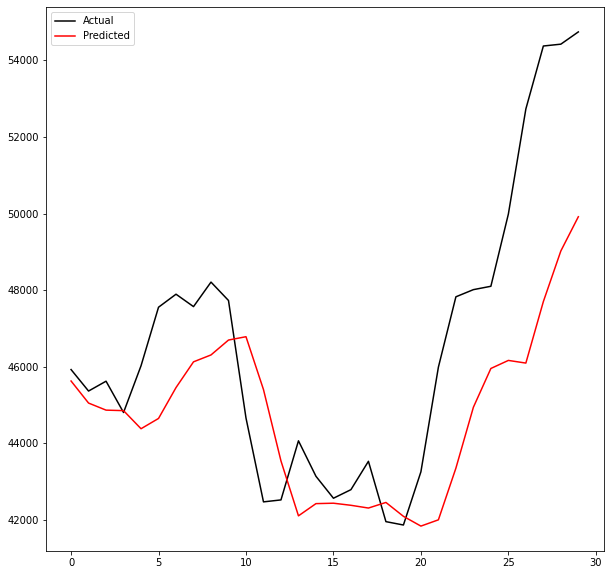

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int3.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 





In [47]:
# test runn of the interval1_ann_model_nextday()
interval3_ann_model_nextday(X, y)

[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00299: early stopping
Training R-Squared: 0.9915576393708742

Testing R-Squared: 0.9921559110954198

30day Holdout R-Squared: -1.8332582858771835

30day Holdout MAE: 5677.328515625

30day Holdout MAPE: 11.932231799999306

30day Holdout RMSE: 6205.834705821309


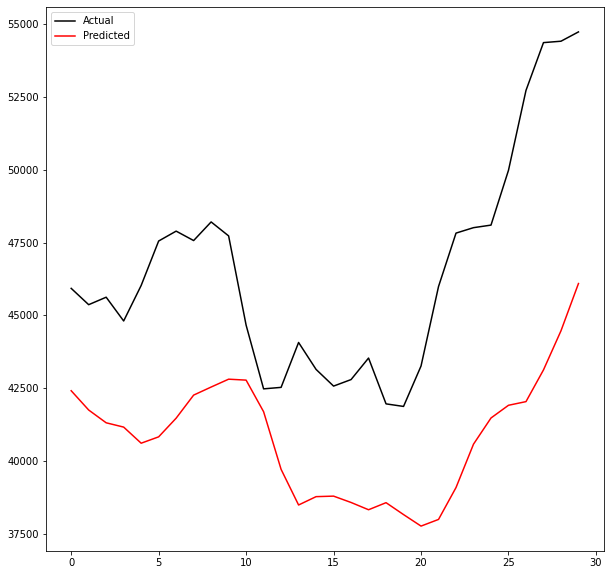

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200Adam0-01relu64Int3.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00365: early stopping
Training R-Squared: 0.99593432071722

Testing R-Squared: 0.9960610206202187

30day Holdout R-Squared: 0.10799015272843704

30day Holdout MAE: 3047.60703125

30day Holdout MAPE: 6.394558490000011

30day Holdout RMSE: 3482.105654950662


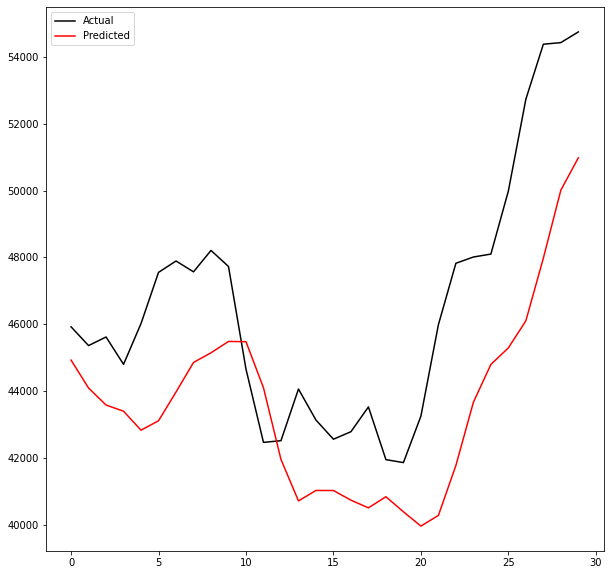

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200Adam0-01elu64Int3.hdf5
Number of Neurons: 200
Activation: elu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00388: early stopping
Training R-Squared: 0.9967601649451818

Testing R-Squared: 0.9961915596086636

30day Holdout R-Squared: 0.4155484444800125

30day Holdout MAE: 2306.989192708333

30day Holdout MAPE: 4.781247823560976

30day Holdout RMSE: 2818.586577970664


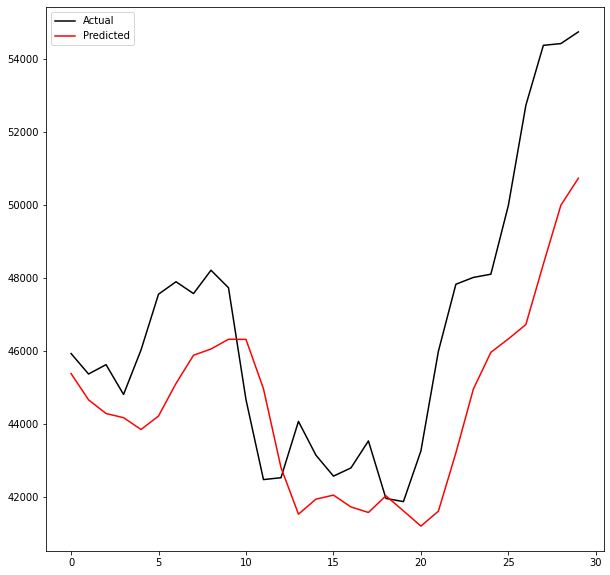

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200Adam0-001relu64Int3.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00600: early stopping
Training R-Squared: 0.9963921629157454

Testing R-Squared: 0.9967183110042902

30day Holdout R-Squared: -2.512818793994225

30day Holdout MAE: 6562.640494791666

30day Holdout MAPE: 13.881951329943732

30day Holdout RMSE: 6910.110525951593


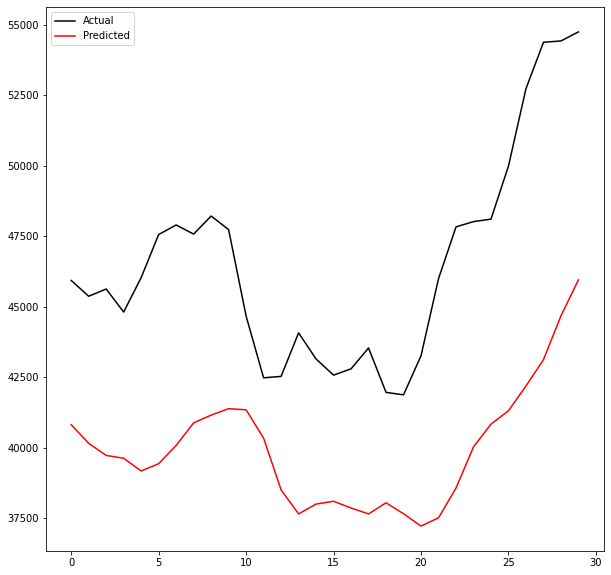

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200Adam0-001elu64Int3.hdf5
Number of Neurons: 200
Activation: elu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 01348: early stopping
Training R-Squared: 0.9963243501265753

Testing R-Squared: 0.9968445526183953

30day Holdout R-Squared: 0.48245887985613933

30day Holdout MAE: 2202.1447916666666

30day Holdout MAPE: 4.585918365493334

30day Holdout RMSE: 2652.342173326191


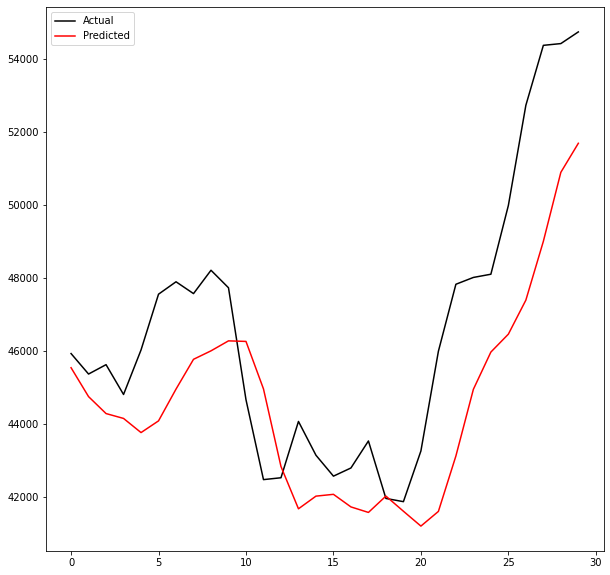

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200Adam0-0001relu64Int3.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 01115: early stopping
Training R-Squared: 0.9955173618793887

Testing R-Squared: 0.9965444352476063

30day Holdout R-Squared: -0.8552513974653304

30day Holdout MAE: 4633.544921875

30day Holdout MAPE: 9.758438262348294

30day Holdout RMSE: 5021.789493966543


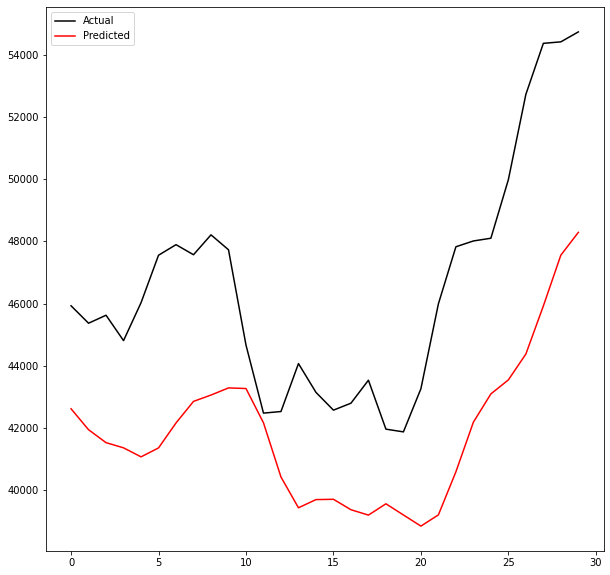

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200Adam0-0001elu64Int3.hdf5
Number of Neurons: 200
Activation: elu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00353: early stopping
Training R-Squared: 0.9969054392589308

Testing R-Squared: 0.996456683863182

30day Holdout R-Squared: -1.574451573022241

30day Holdout MAE: 5569.02421875

30day Holdout MAPE: 11.778573607981986

30day Holdout RMSE: 5915.609306758925


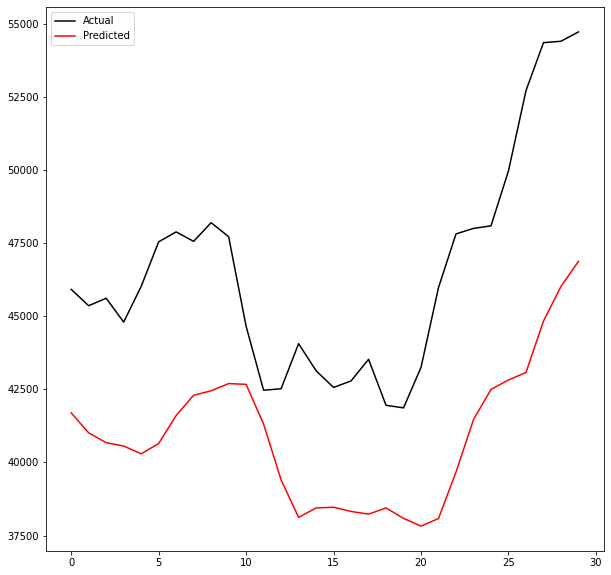

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int3.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00370: early stopping
Training R-Squared: 0.9943693115556267

Testing R-Squared: 0.9957306629349212

30day Holdout R-Squared: -0.6911896754036708

30day Holdout MAE: 4399.92265625

30day Holdout MAPE: 9.275799578666408

30day Holdout RMSE: 4794.609917687875


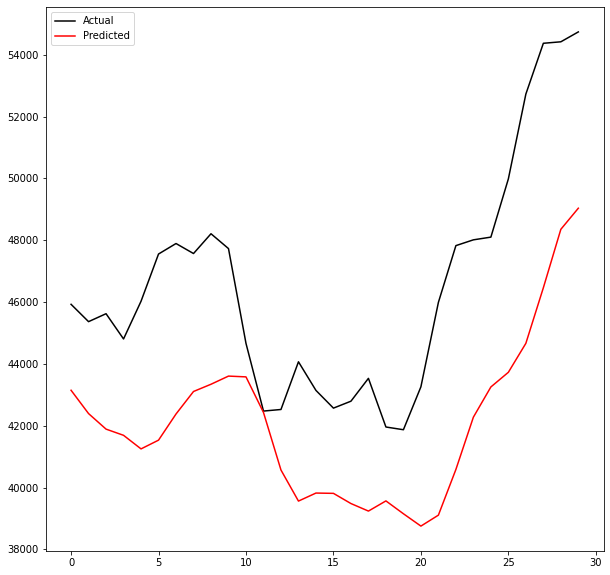

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01elu64Int3.hdf5
Number of Neurons: 300
Activation: elu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00953: early stopping
Training R-Squared: 0.9989510771224911

Testing R-Squared: 0.9963059656471714

30day Holdout R-Squared: -1.665211457520594

30day Holdout MAE: 5630.390494791666

30day Holdout MAPE: 11.890486044485327

30day Holdout RMSE: 6018.980770985231


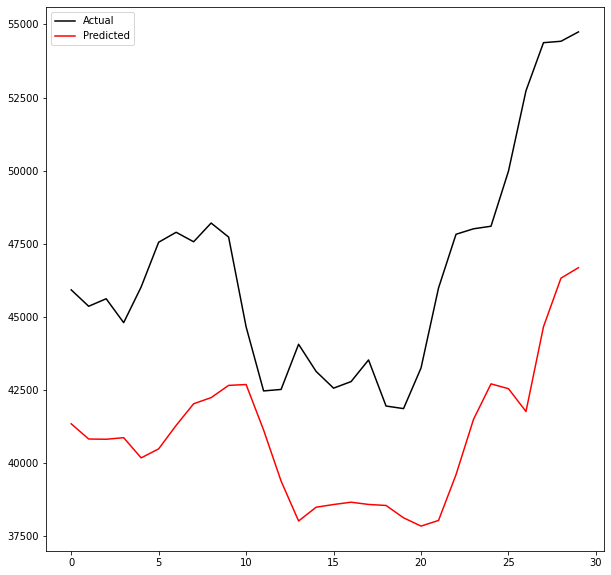

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-001relu64Int3.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00596: early stopping
Training R-Squared: 0.994178393714813

Testing R-Squared: 0.9952801246236634

30day Holdout R-Squared: -5.2014647044734765

30day Holdout MAE: 8959.890364583332

30day Holdout MAPE: 19.091999635425992

30day Holdout RMSE: 9181.301690482505


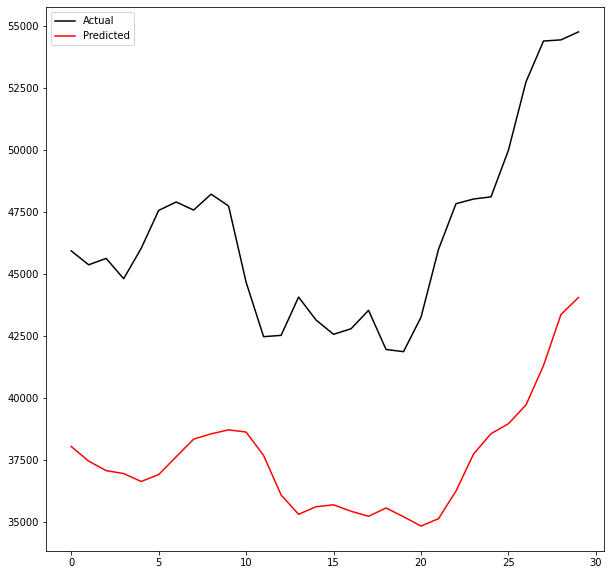

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-001elu64Int3.hdf5
Number of Neurons: 300
Activation: elu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 01156: early stopping
Training R-Squared: 0.9967662514581082

Testing R-Squared: 0.9966951971770454

30day Holdout R-Squared: 0.22922954934094797

30day Holdout MAE: 2898.2165364583334

30day Holdout MAPE: 6.1163733225149

30day Holdout RMSE: 3236.828194388435


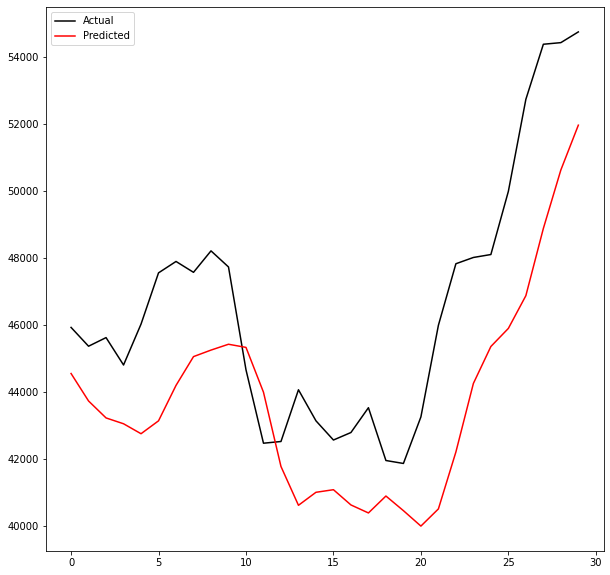

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-0001relu64Int3.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 01594: early stopping
Training R-Squared: 0.9961793890471751

Testing R-Squared: 0.9968498261971034

30day Holdout R-Squared: -0.851103092787147

30day Holdout MAE: 4641.323307291666

30day Holdout MAPE: 9.787433108528507

30day Holdout RMSE: 5016.172042107874


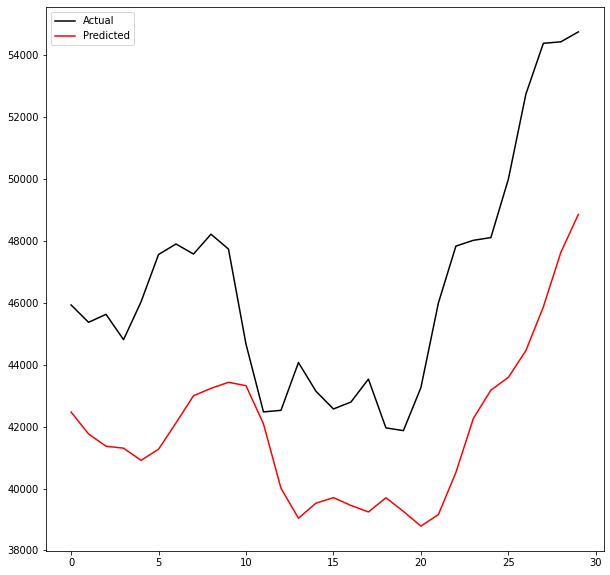

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-0001elu64Int3.hdf5
Number of Neurons: 300
Activation: elu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00101: early stopping
Training R-Squared: -0.6542952438667127

Testing R-Squared: -0.6499885175350233

30day Holdout R-Squared: -159.24484000557823

30day Holdout MAE: 46525.36666666667

30day Holdout MAPE: 100.0

30day Holdout RMSE: 46671.21928733667


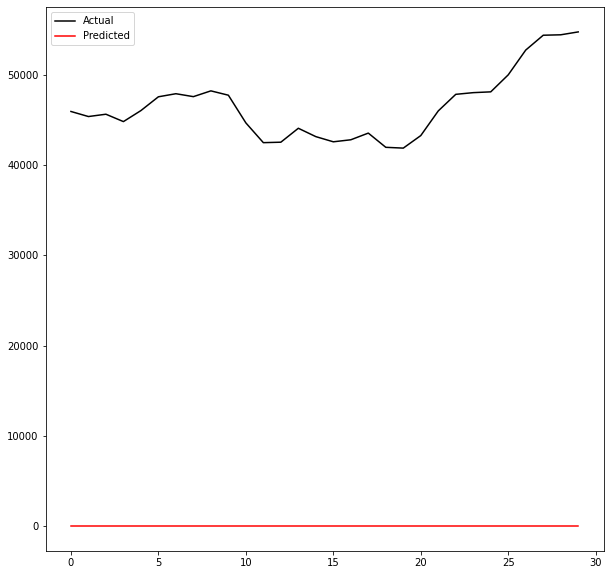

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400Adam0-01relu64Int3.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00362: early stopping
Training R-Squared: 0.9957246962895236

Testing R-Squared: 0.9953788211946025

30day Holdout R-Squared: -0.05897818109667985

30day Holdout MAE: 3349.909244791667

30day Holdout MAPE: 7.023684767173786

30day Holdout RMSE: 3794.02882526027


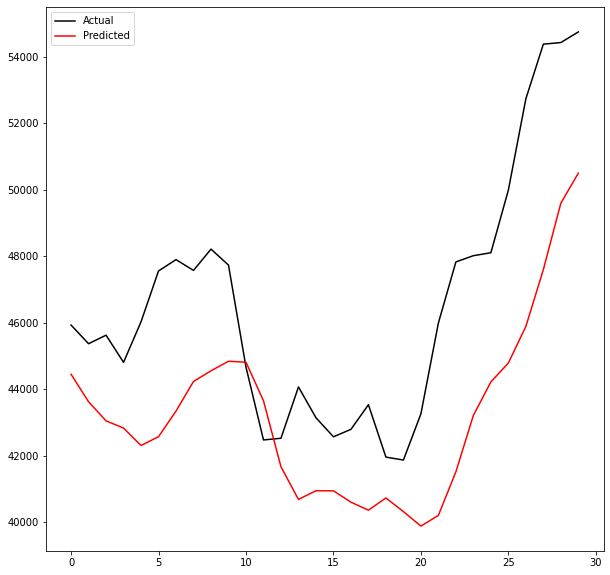

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400Adam0-01elu64Int3.hdf5
Number of Neurons: 400
Activation: elu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00609: early stopping
Training R-Squared: 0.9975940959372366

Testing R-Squared: 0.9952357973844826

30day Holdout R-Squared: -1.2525896434564419

30day Holdout MAE: 5012.549348958333

30day Holdout MAPE: 10.523431762888965

30day Holdout RMSE: 5533.47766858506


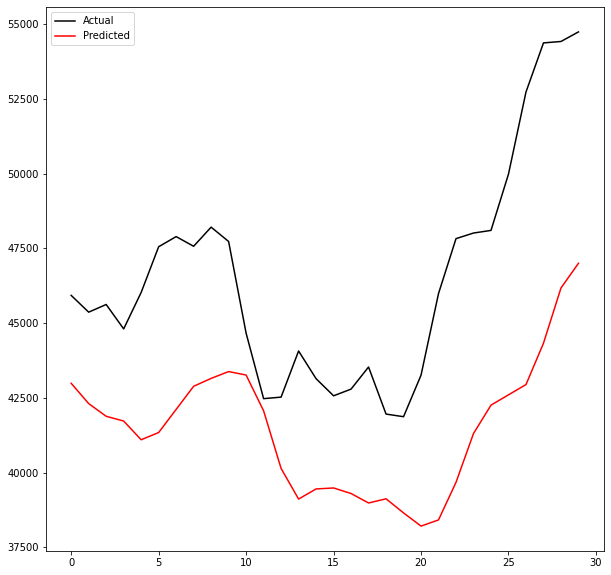

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400Adam0-001relu64Int3.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00672: early stopping
Training R-Squared: 0.9949417843988675

Testing R-Squared: 0.9957728219817767

30day Holdout R-Squared: -5.482564401215397

30day Holdout MAE: 9107.543880208334

30day Holdout MAPE: 19.35096583121331

30day Holdout RMSE: 9387.080453266484


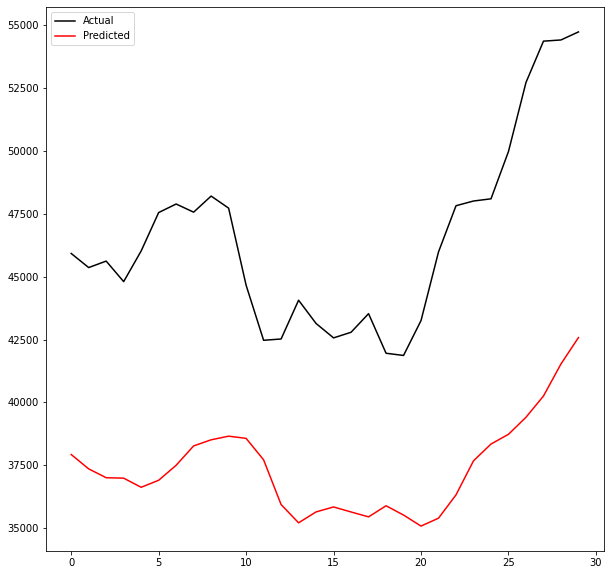

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400Adam0-001elu64Int3.hdf5
Number of Neurons: 400
Activation: elu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00872: early stopping
Training R-Squared: 0.9970167116810114

Testing R-Squared: 0.9963523880571175

30day Holdout R-Squared: 0.3895022305961999

30day Holdout MAE: 2417.5481770833335

30day Holdout MAPE: 5.04647852308611

30day Holdout RMSE: 2880.7074834235937


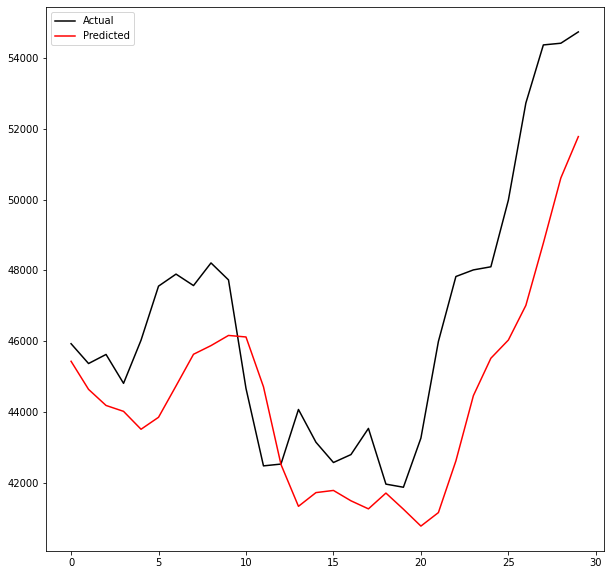

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400Adam0-0001relu64Int3.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 01111: early stopping
Training R-Squared: 0.9960010779172039

Testing R-Squared: 0.996577294005173

30day Holdout R-Squared: -0.9718940671065834

30day Holdout MAE: 4863.43203125

30day Holdout MAPE: 10.29607666077224

30day Holdout RMSE: 5177.247299401365


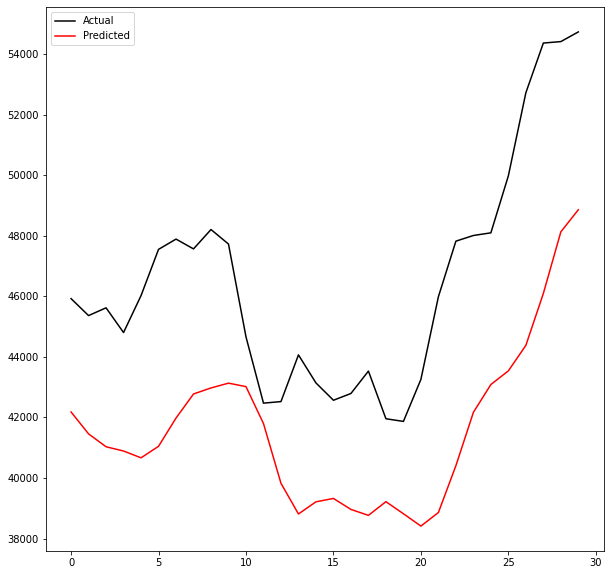

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400Adam0-0001elu64Int3.hdf5
Number of Neurons: 400
Activation: elu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00273: early stopping
Training R-Squared: 0.9942905633741879

Testing R-Squared: 0.9942371187178861

30day Holdout R-Squared: -1.6673671723116428

30day Holdout MAE: 5502.731510416666

30day Holdout MAPE: 11.556141807947142

30day Holdout RMSE: 6021.414458413796


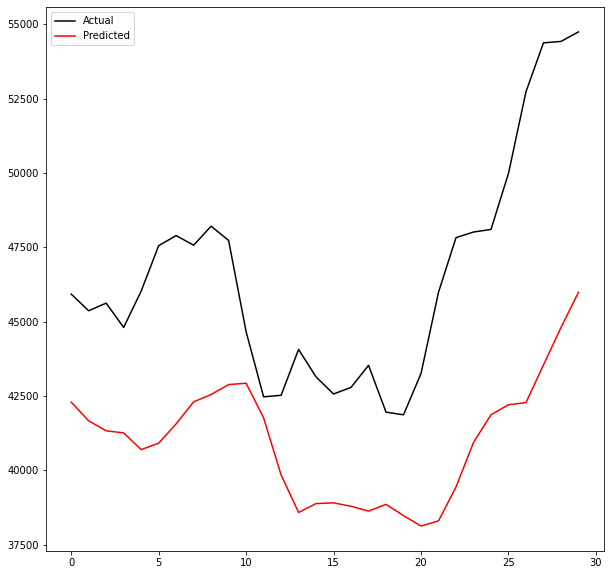

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500Adam0-01relu64Int3.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00299: early stopping
Training R-Squared: 0.994108408927083

Testing R-Squared: 0.9958256044158136

30day Holdout R-Squared: -0.5888759147318017

30day Holdout MAE: 4250.368229166666

30day Holdout MAPE: 8.960701168510589

30day Holdout RMSE: 4647.315005685071


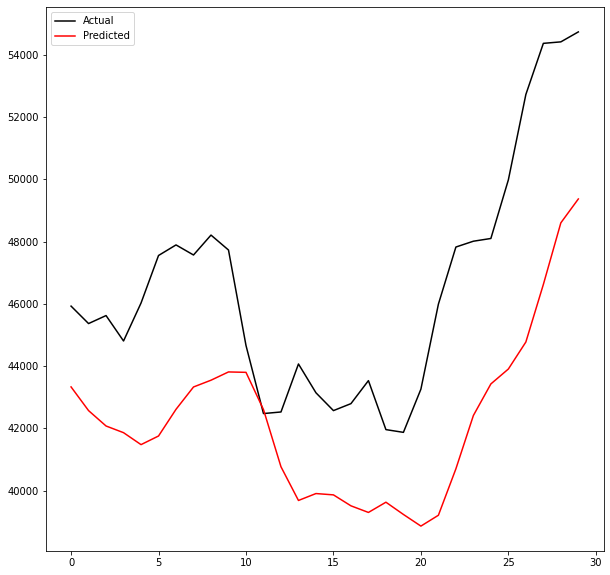

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500Adam0-01elu64Int3.hdf5
Number of Neurons: 500
Activation: elu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00440: early stopping
Training R-Squared: 0.9974606198011862

Testing R-Squared: 0.9954256867421772

30day Holdout R-Squared: -0.5125516947128499

30day Holdout MAE: 4064.80546875

30day Holdout MAPE: 8.530311207289316

30day Holdout RMSE: 4534.320700122461


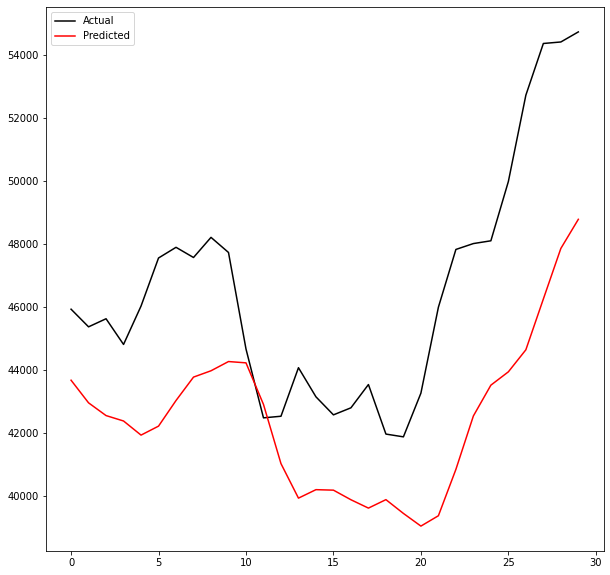

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500Adam0-001relu64Int3.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00303: early stopping
Training R-Squared: 0.9949991268848787

Testing R-Squared: 0.996428113126276

30day Holdout R-Squared: -3.138877346832083

30day Holdout MAE: 7243.004296875

30day Holdout MAPE: 15.397997256695259

30day Holdout RMSE: 7500.641325295002


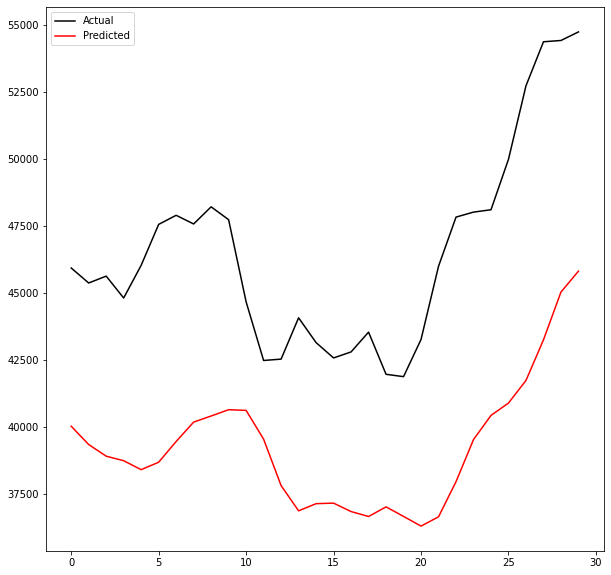

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500Adam0-001elu64Int3.hdf5
Number of Neurons: 500
Activation: elu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00101: early stopping
Training R-Squared: -0.6542952438667127

Testing R-Squared: -0.6499885175350233

30day Holdout R-Squared: -159.24484000557823

30day Holdout MAE: 46525.36666666667

30day Holdout MAPE: 100.0

30day Holdout RMSE: 46671.21928733667


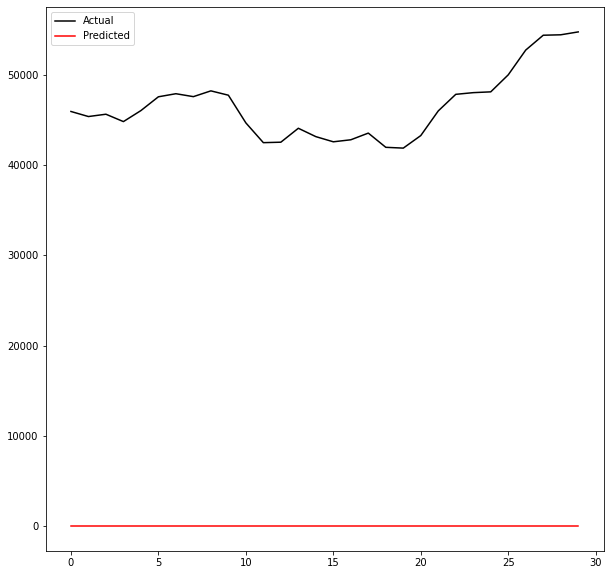

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500Adam0-0001relu64Int3.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00734: early stopping
Training R-Squared: 0.9949356530223958

Testing R-Squared: 0.9964326602989947

30day Holdout R-Squared: -2.2579756298918467

30day Holdout MAE: 6387.398046875

30day Holdout MAPE: 13.564521346228329

30day Holdout RMSE: 6654.739133859506


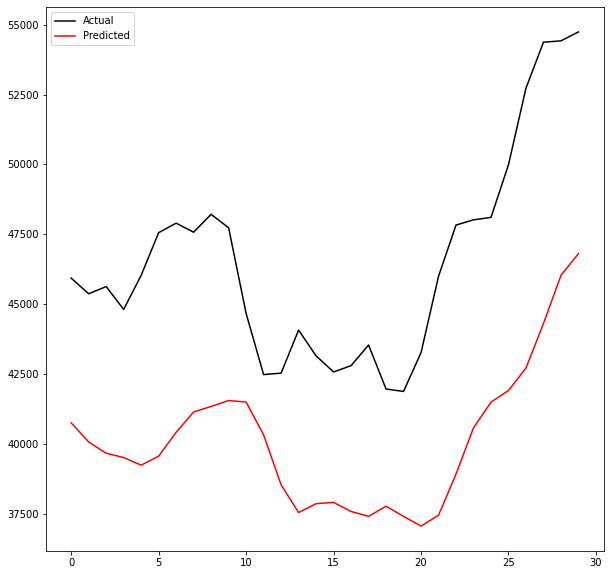

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500Adam0-0001elu64Int3.hdf5
Number of Neurons: 500
Activation: elu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00350: early stopping
Training R-Squared: 0.9970314319849578

Testing R-Squared: 0.9964645343981723

30day Holdout R-Squared: -0.1676208401977597

30day Holdout MAE: 3348.678125

30day Holdout MAPE: 6.935177189961116

30day Holdout RMSE: 3983.8964256978966


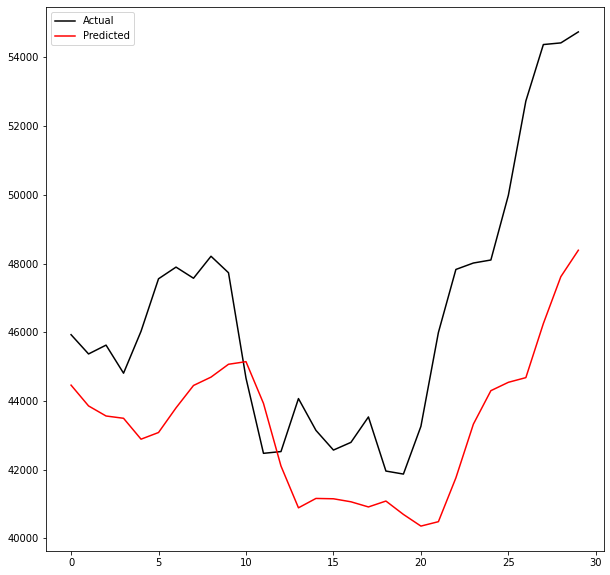

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600Adam0-01relu64Int3.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00472: early stopping
Training R-Squared: 0.9962185301210851

Testing R-Squared: 0.9963284400785178

30day Holdout R-Squared: -0.8722000323610901

30day Holdout MAE: 4255.849088541667

30day Holdout MAPE: 8.795091158197806

30day Holdout RMSE: 5044.675603511388


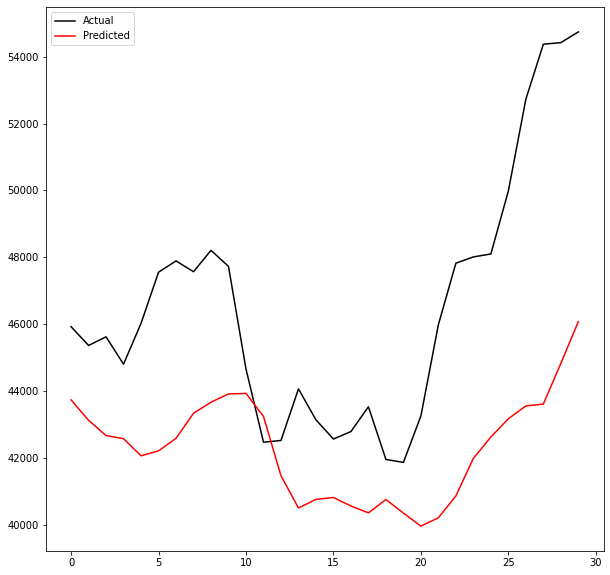

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600Adam0-01elu64Int3.hdf5
Number of Neurons: 600
Activation: elu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00258: early stopping
Training R-Squared: 0.9972913253032613

Testing R-Squared: 0.9963143381576804

30day Holdout R-Squared: -0.3804610768464567

30day Holdout MAE: 3910.8809895833333

30day Holdout MAPE: 8.218391104416366

30day Holdout RMSE: 4331.808039895322


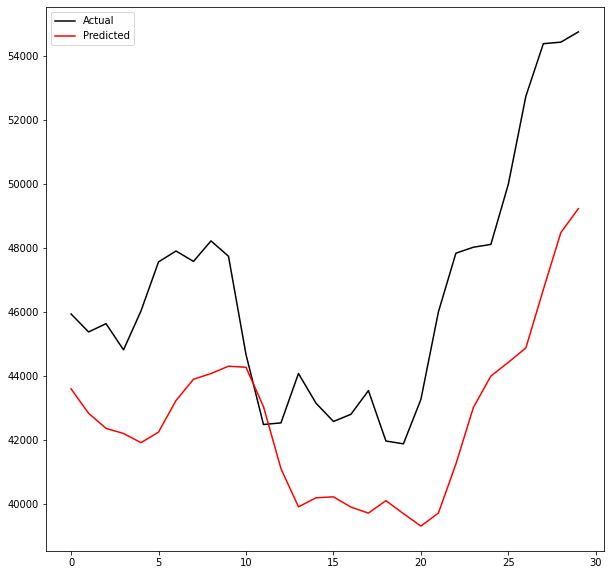

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600Adam0-001relu64Int3.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00500: early stopping
Training R-Squared: 0.9953326462225514

Testing R-Squared: 0.9959550442787568

30day Holdout R-Squared: -6.102380267257618

30day Holdout MAE: 9557.479817708334

30day Holdout MAPE: 20.32719015134931

30day Holdout RMSE: 9825.600012962377


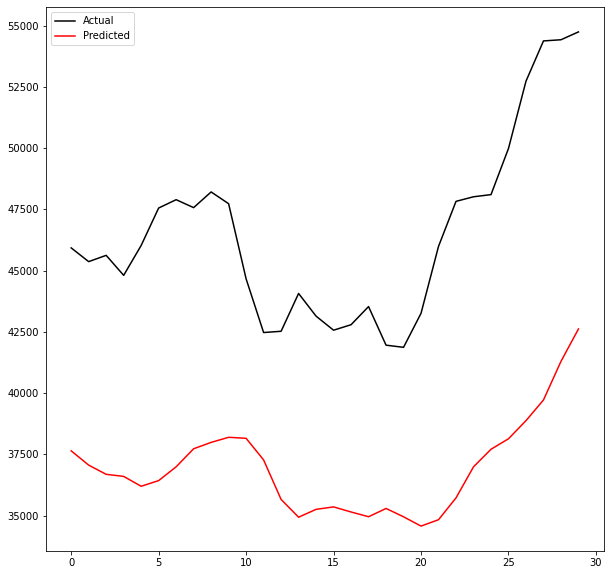

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600Adam0-001elu64Int3.hdf5
Number of Neurons: 600
Activation: elu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 01077: early stopping
Training R-Squared: 0.9978049490054641

Testing R-Squared: 0.9963244316151082

30day Holdout R-Squared: 0.5083678282577592

30day Holdout MAE: 2007.052734375

30day Holdout MAPE: 4.148751675586289

30day Holdout RMSE: 2585.0995226377327


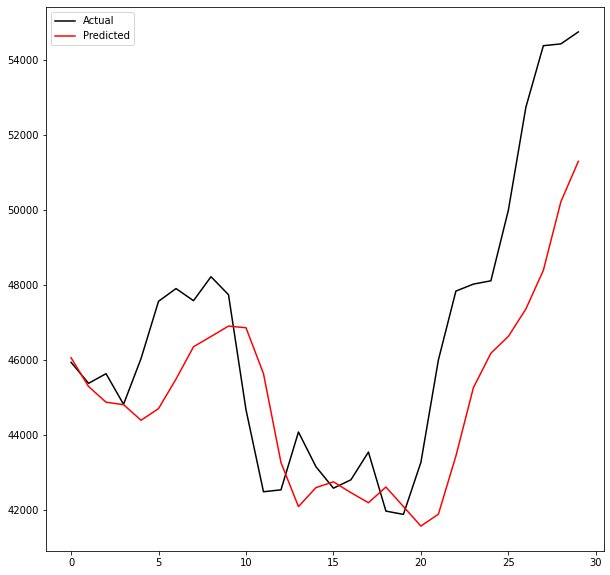

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600Adam0-0001relu64Int3.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 01302: early stopping
Training R-Squared: 0.9965219804042491

Testing R-Squared: 0.9966427772385528

30day Holdout R-Squared: -2.267867302073182

30day Holdout MAE: 6381.506380208333

30day Holdout MAPE: 13.55202675474545

30day Holdout RMSE: 6664.8338393632675


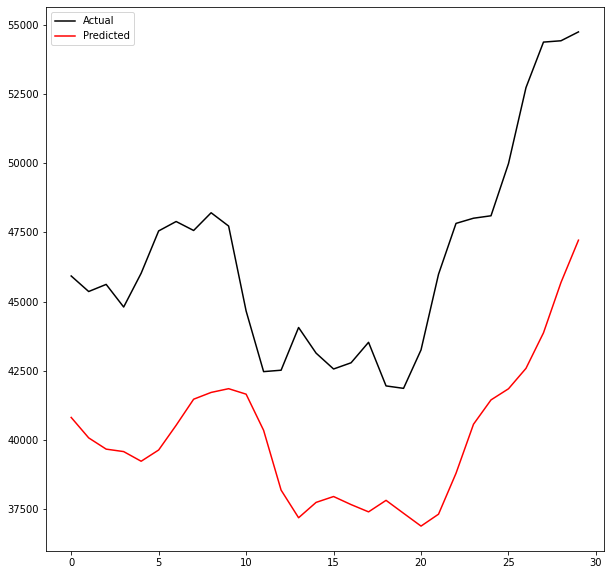

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600Adam0-0001elu64Int3.hdf5
Number of Neurons: 600
Activation: elu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00385: early stopping
Training R-Squared: 0.9931775901853412

Testing R-Squared: 0.9918568704245198

30day Holdout R-Squared: 0.6320284297339125

30day Holdout MAE: 1816.105078125

30day Holdout MAPE: 3.8499689825781322

30day Holdout RMSE: 2236.476057009364


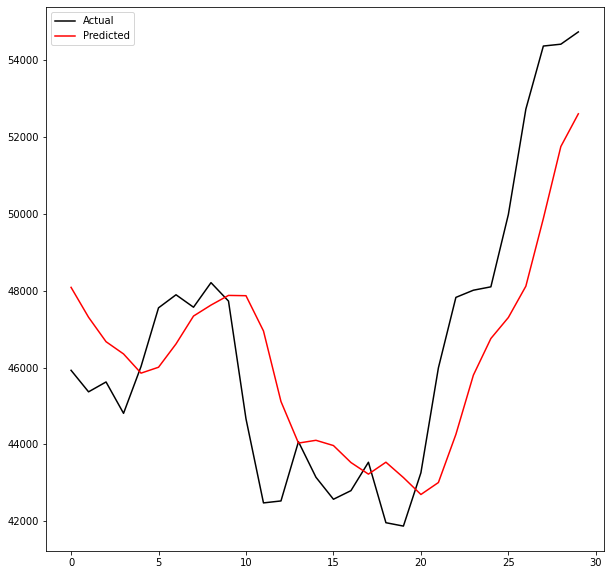

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200RMSprop0-01relu64Int3.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00654: early stopping
Training R-Squared: 0.9761303718849355

Testing R-Squared: 0.9921716139143958

30day Holdout R-Squared: -7.111109495650526

30day Holdout MAE: 10227.709244791668

30day Holdout MAPE: 21.784263854480646

30day Holdout RMSE: 10500.192284952464


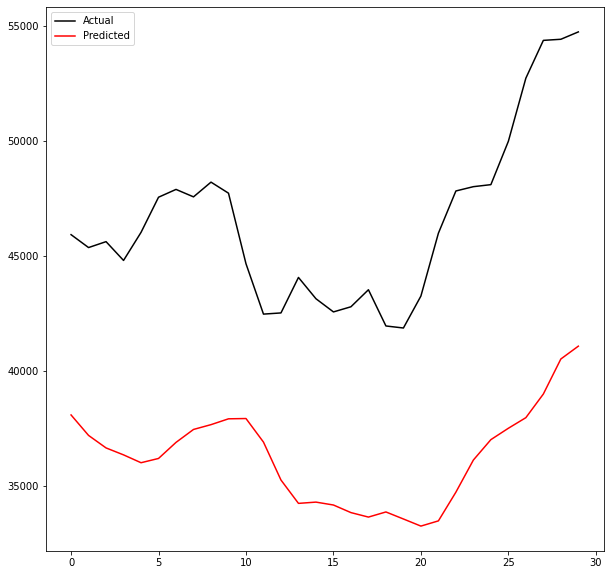

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200RMSprop0-01elu64Int3.hdf5
Number of Neurons: 200
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00500: early stopping
Training R-Squared: 0.993688793180177

Testing R-Squared: 0.9945016219616907

30day Holdout R-Squared: -0.911327187344102

30day Holdout MAE: 4519.519270833333

30day Holdout MAPE: 9.451215915948573

30day Holdout RMSE: 5097.117424948974


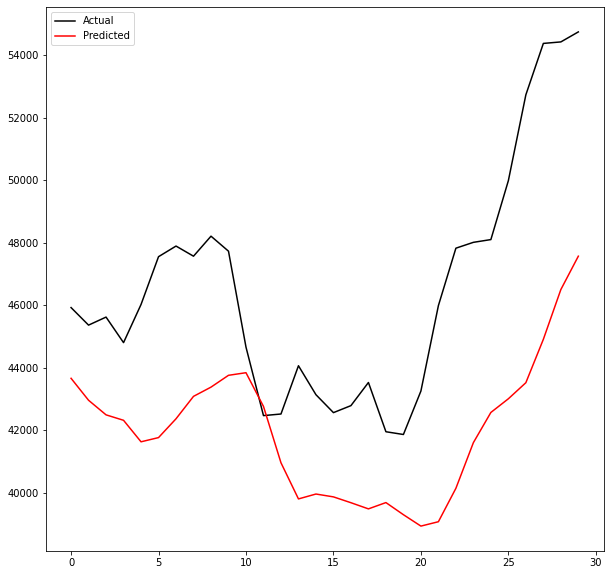

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200RMSprop0-001relu64Int3.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00608: early stopping
Training R-Squared: 0.9939105351312827

Testing R-Squared: 0.9956785532211346

30day Holdout R-Squared: -3.722583255022478

30day Holdout MAE: 7745.683333333333

30day Holdout MAPE: 16.470720116618757

30day Holdout RMSE: 8012.110522778473


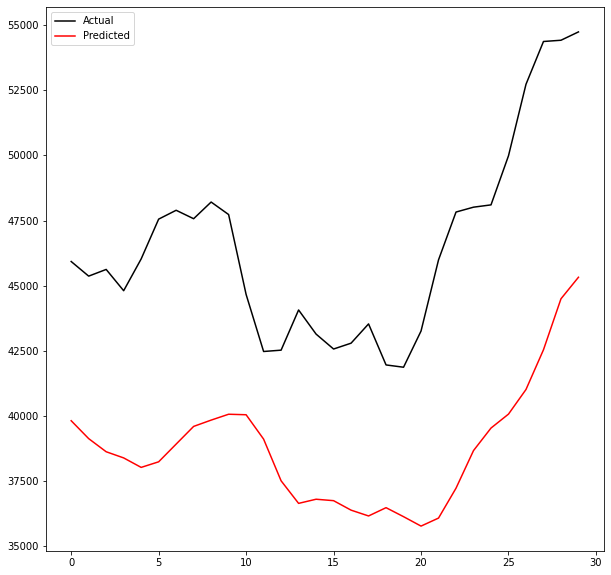

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200RMSprop0-001elu64Int3.hdf5
Number of Neurons: 200
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 01478: early stopping
Training R-Squared: 0.9962543378008293

Testing R-Squared: 0.9958596342738902

30day Holdout R-Squared: 0.628324585280705

30day Holdout MAE: 1799.2399739583334

30day Holdout MAPE: 3.7632413285973545

30day Holdout RMSE: 2247.7035806362296


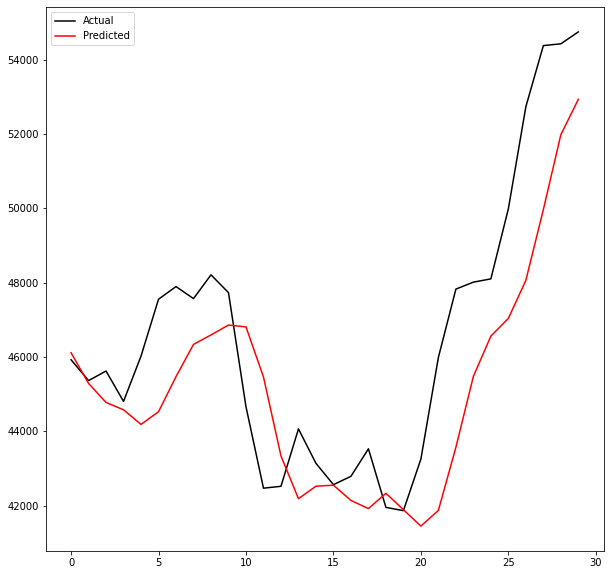

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200RMSprop0-0001relu64Int3.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 01082: early stopping
Training R-Squared: 0.9953085460531149

Testing R-Squared: 0.9964157454366893

30day Holdout R-Squared: -0.9882475159546145

30day Holdout MAE: 4834.390885416667

30day Holdout MAPE: 10.2063055537229

30day Holdout RMSE: 5198.671126184135


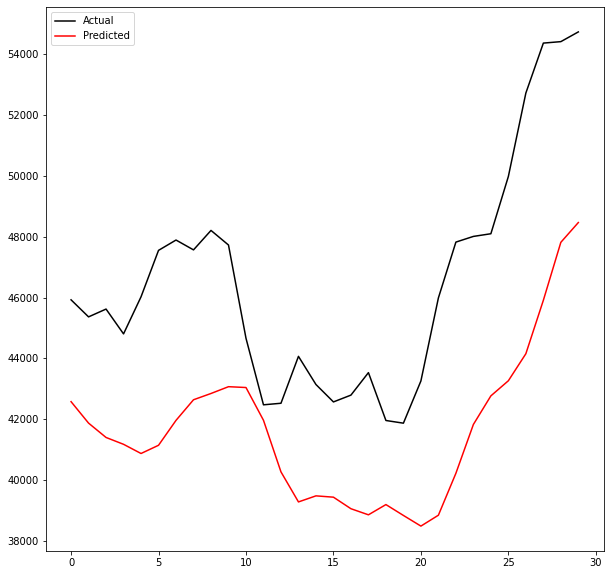

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200RMSprop0-0001elu64Int3.hdf5
Number of Neurons: 200
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00418: early stopping
Training R-Squared: 0.9857731056150111

Testing R-Squared: 0.9881608176816298

30day Holdout R-Squared: -1.411863103657311

30day Holdout MAE: 5337.740494791667

30day Holdout MAPE: 11.268312701907162

30day Holdout RMSE: 5725.764043823967


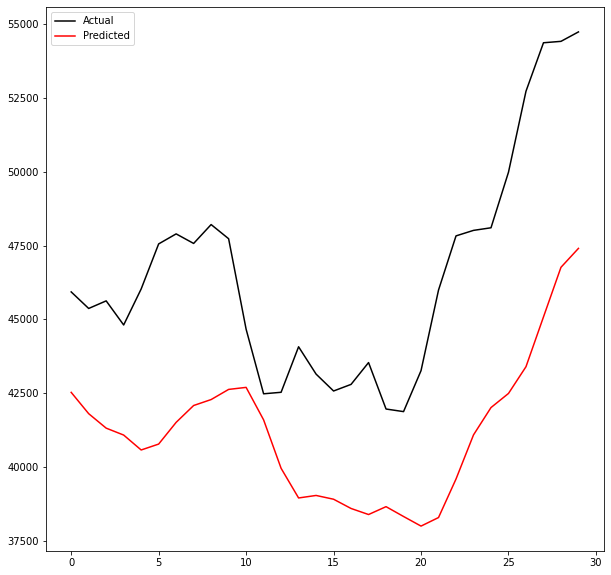

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-01relu64Int3.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00553: early stopping
Training R-Squared: 0.9943145719427706

Testing R-Squared: 0.9719750805174316

30day Holdout R-Squared: -159.25168558521753

30day Holdout MAE: 46526.36666666667

30day Holdout MAPE: 100.0021621847311

30day Holdout RMSE: 46672.2161622951


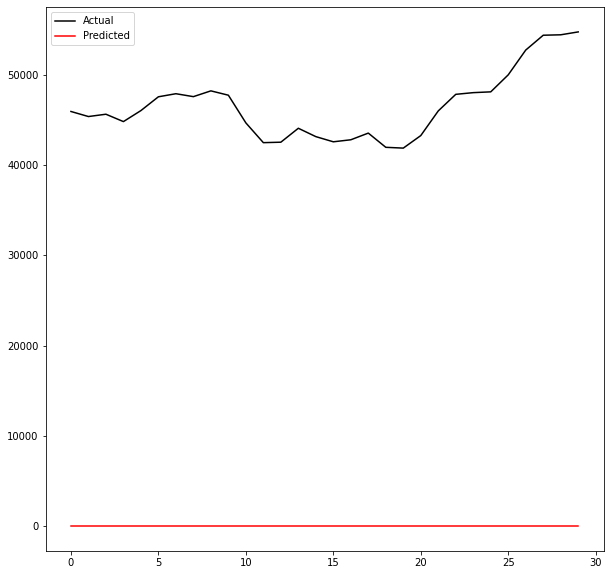

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-01elu64Int3.hdf5
Number of Neurons: 300
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00297: early stopping
Training R-Squared: 0.9929793571789316

Testing R-Squared: 0.9890777728923925

30day Holdout R-Squared: 0.6338740489447039

30day Holdout MAE: 1785.381640625

30day Holdout MAPE: 3.7607418941888793

30day Holdout RMSE: 2230.860308007492


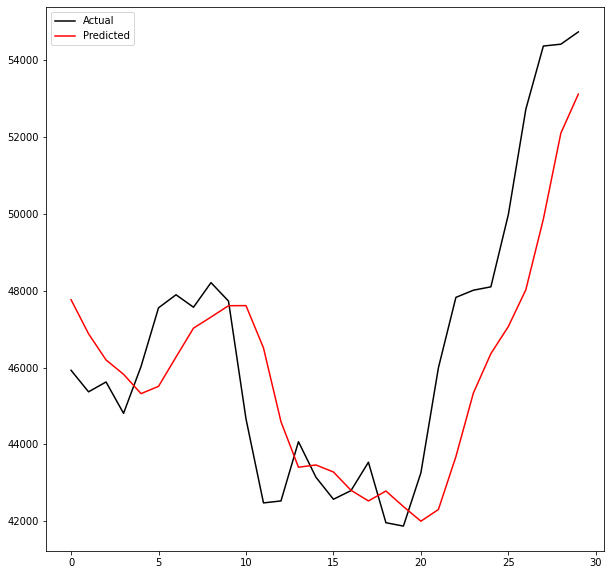

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-001relu64Int3.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00543: early stopping
Training R-Squared: 0.992751846025922

Testing R-Squared: 0.9946752304599147

30day Holdout R-Squared: -4.341860221177837

30day Holdout MAE: 8244.982421875

30day Holdout MAPE: 17.519086637840616

30day Holdout RMSE: 8521.251431558952


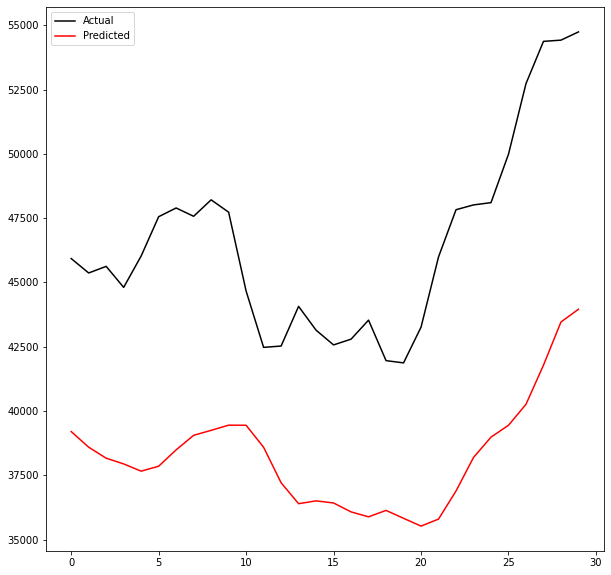

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-001elu64Int3.hdf5
Number of Neurons: 300
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00964: early stopping
Training R-Squared: 0.9963770102883097

Testing R-Squared: 0.9962586772327541

30day Holdout R-Squared: 0.5461550440464209

30day Holdout MAE: 2032.6768229166667

30day Holdout MAPE: 4.249161781540709

30day Holdout RMSE: 2483.767137071773


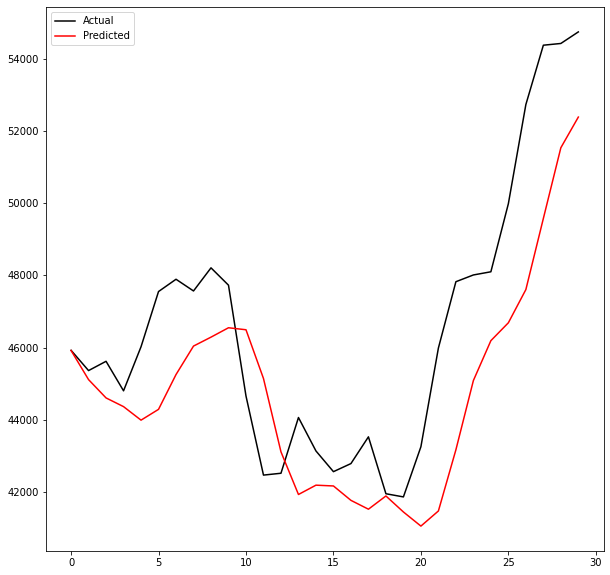

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int3.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 01189: early stopping
Training R-Squared: 0.9955423906204004

Testing R-Squared: 0.9965521276995711

30day Holdout R-Squared: -1.2658080158188758

30day Holdout MAE: 5205.94453125

30day Holdout MAPE: 11.00220153426304

30day Holdout RMSE: 5549.689360565894


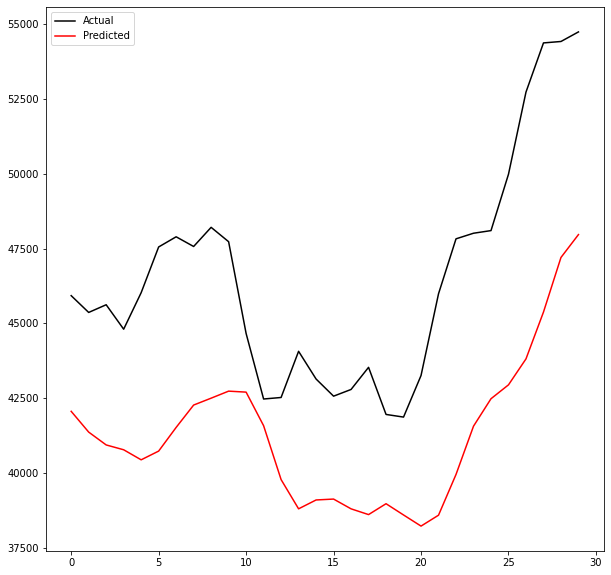

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001elu64Int3.hdf5
Number of Neurons: 300
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00550: early stopping
Training R-Squared: 0.9902227950910129

Testing R-Squared: 0.992141265550895

30day Holdout R-Squared: -1.6363905976453466

30day Holdout MAE: 5457.152604166667

30day Holdout MAPE: 11.482930151894728

30day Holdout RMSE: 5986.348515121779


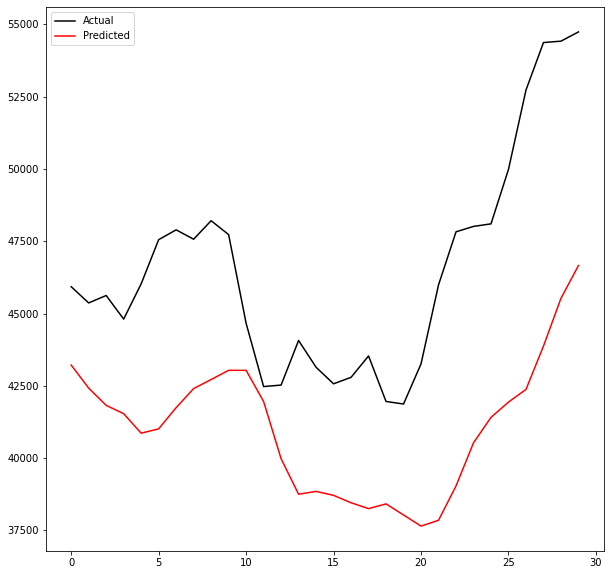

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400RMSprop0-01relu64Int3.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00547: early stopping
Training R-Squared: 0.9761167045328896

Testing R-Squared: 0.9726236261752363

30day Holdout R-Squared: -159.25168558521753

30day Holdout MAE: 46526.36666666667

30day Holdout MAPE: 100.0021621847311

30day Holdout RMSE: 46672.2161622951


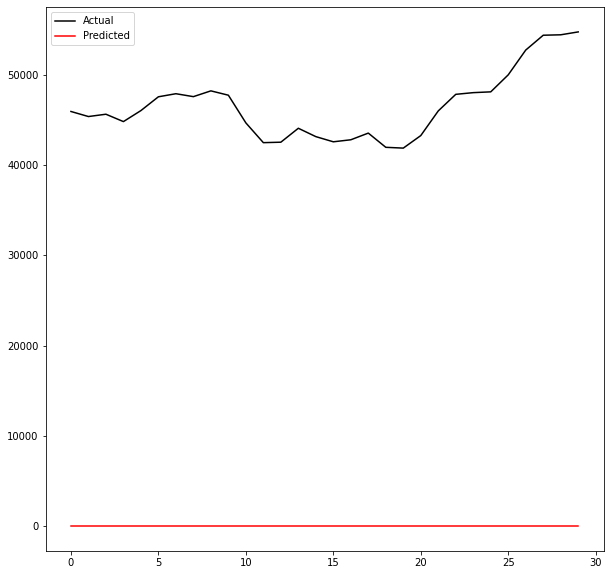

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400RMSprop0-01elu64Int3.hdf5
Number of Neurons: 400
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00500: early stopping
Training R-Squared: 0.9945833091850854

Testing R-Squared: 0.9906120915950479

30day Holdout R-Squared: 0.6272009966053178

30day Holdout MAE: 1797.70859375

30day Holdout MAPE: 3.7705020646374514

30day Holdout RMSE: 2251.0984628405927


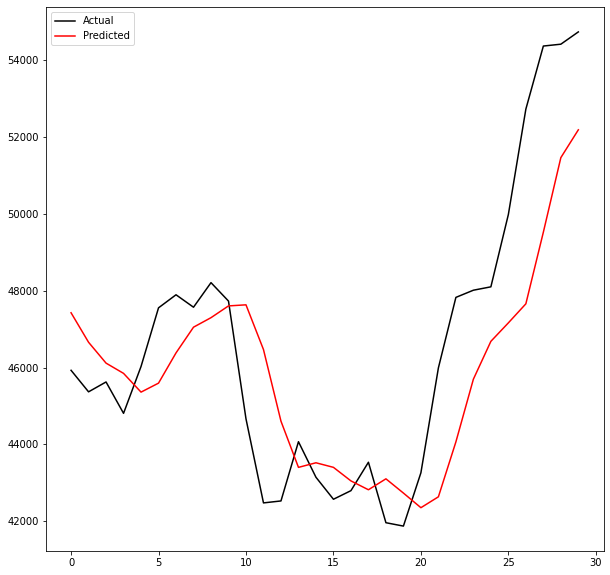

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400RMSprop0-001relu64Int3.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00332: early stopping
Training R-Squared: 0.9870023267300182

Testing R-Squared: 0.9830062331418322

30day Holdout R-Squared: -113.11121040780783

30day Holdout MAE: 38616.74352213542

30day Holdout MAPE: 84.22776728736429

30day Holdout RMSE: 39384.131796940135


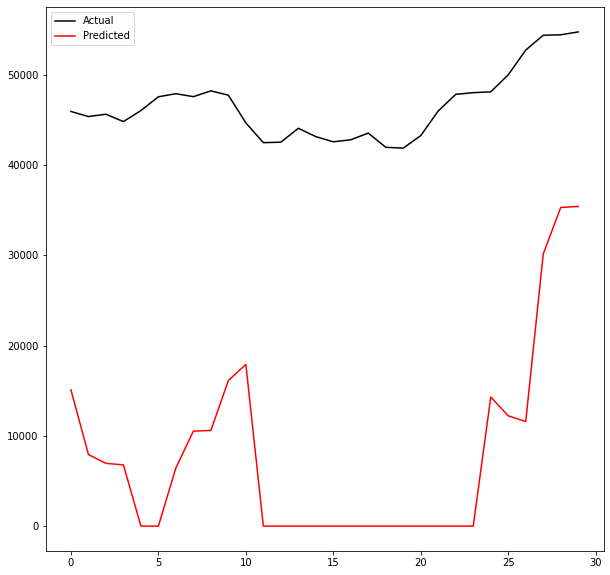

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400RMSprop0-001elu64Int3.hdf5
Number of Neurons: 400
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00874: early stopping
Training R-Squared: 0.9962202576741173

Testing R-Squared: 0.9960337768710678

30day Holdout R-Squared: 0.05349300051276373

30day Holdout MAE: 3191.4173177083335

30day Holdout MAPE: 6.718718749388494

30day Holdout RMSE: 3586.8980673685783


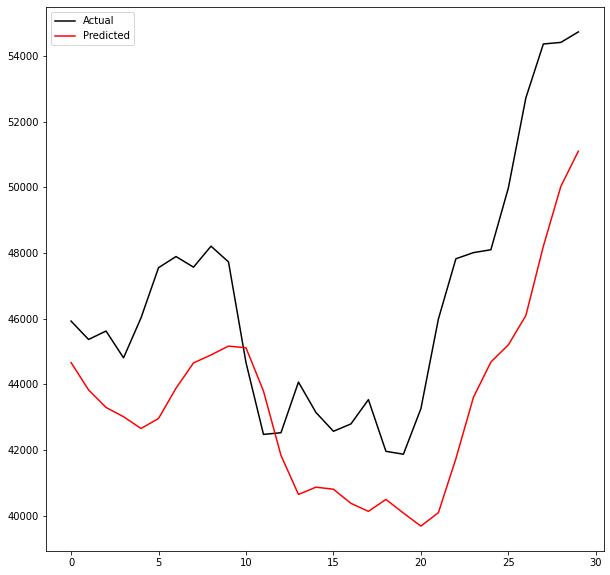

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400RMSprop0-0001relu64Int3.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00988: early stopping
Training R-Squared: 0.9951743974572954

Testing R-Squared: 0.9954745738490558

30day Holdout R-Squared: -1.0733167063733675

30day Holdout MAE: 4965.827604166667

30day Holdout MAPE: 10.491437495660394

30day Holdout RMSE: 5308.7215143249405


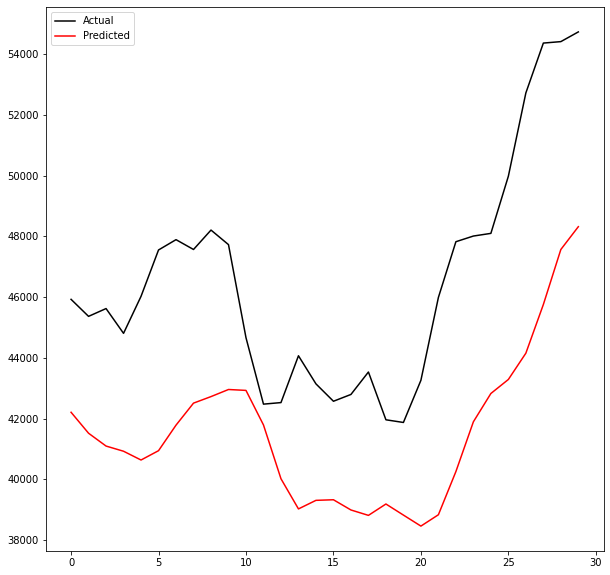

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400RMSprop0-0001elu64Int3.hdf5
Number of Neurons: 400
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00418: early stopping
Training R-Squared: 0.992763857169141

Testing R-Squared: 0.9892511527982317

30day Holdout R-Squared: 0.42165536441239226

30day Holdout MAE: 2301.1326822916667

30day Holdout MAPE: 4.797814582552763

30day Holdout RMSE: 2803.8222377115007


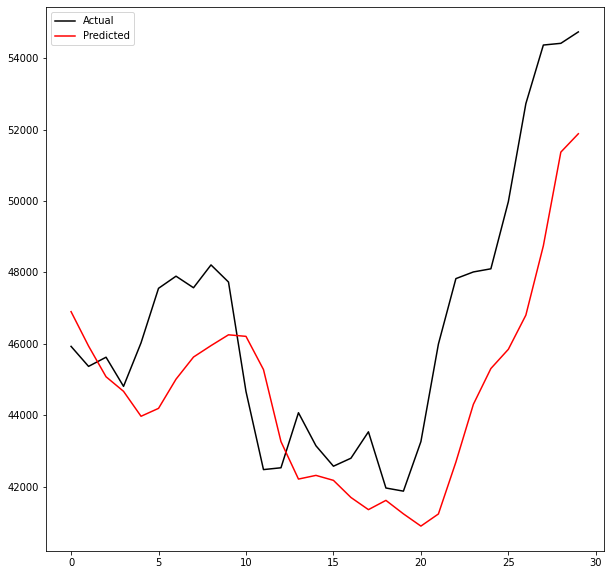

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500RMSprop0-01relu64Int3.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00101: early stopping
Training R-Squared: -0.6547268662661512

Testing R-Squared: -0.650419389893355

30day Holdout R-Squared: -159.25168558521753

30day Holdout MAE: 46526.36666666667

30day Holdout MAPE: 100.0021621847311

30day Holdout RMSE: 46672.2161622951


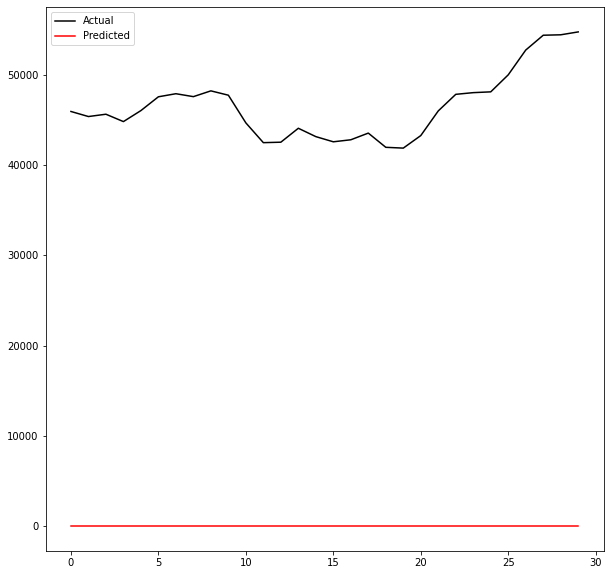

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500RMSprop0-01elu64Int3.hdf5
Number of Neurons: 500
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00379: early stopping
Training R-Squared: 0.9910255756130567

Testing R-Squared: 0.9921840331070374

30day Holdout R-Squared: -0.8156200711882517

30day Holdout MAE: 4416.547005208334

30day Holdout MAPE: 9.24367861806623

30day Holdout RMSE: 4967.862965023104


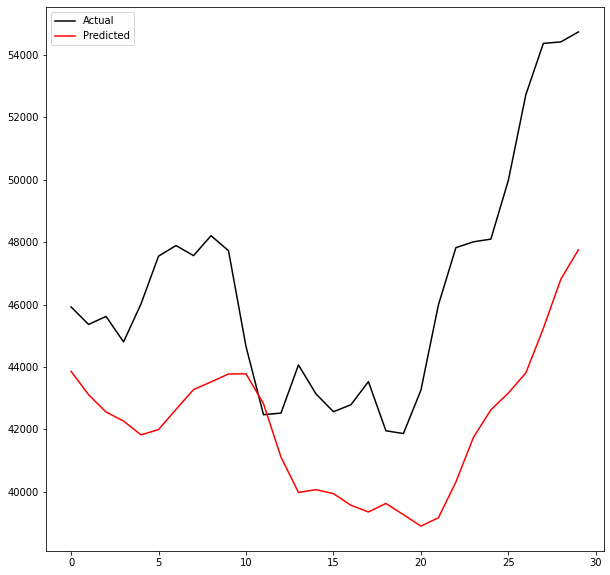

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500RMSprop0-001relu64Int3.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00375: early stopping
Training R-Squared: 0.9953711234582433

Testing R-Squared: 0.9951208667570134

30day Holdout R-Squared: -4.394123847650609

30day Holdout MAE: 8296.827864583332

30day Holdout MAPE: 17.6389707514243

30day Holdout RMSE: 8562.835025454338


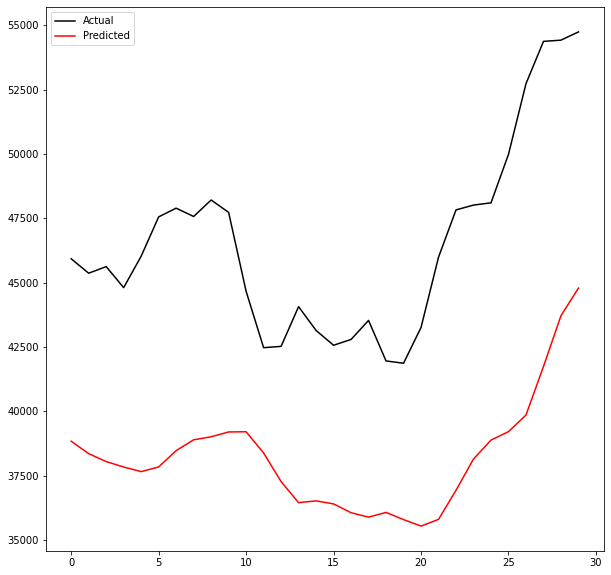

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500RMSprop0-001elu64Int3.hdf5
Number of Neurons: 500
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00920: early stopping
Training R-Squared: 0.9968761825433176

Testing R-Squared: 0.9962238211820239

30day Holdout R-Squared: 0.52404670266901

30day Holdout MAE: 2088.085546875

30day Holdout MAPE: 4.358865486428711

30day Holdout RMSE: 2543.544206508939


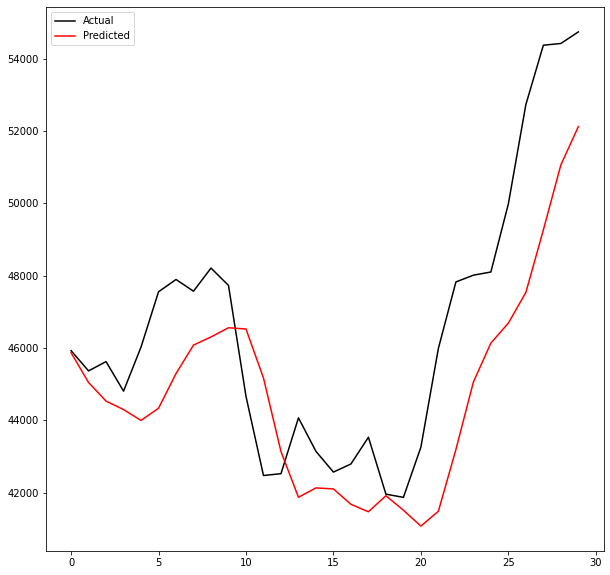

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500RMSprop0-0001relu64Int3.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00974: early stopping
Training R-Squared: 0.995597845636682

Testing R-Squared: 0.9965950750280115

30day Holdout R-Squared: -1.901323117801152

30day Holdout MAE: 5989.773177083333

30day Holdout MAPE: 12.703736623659898

30day Holdout RMSE: 6279.935299225486


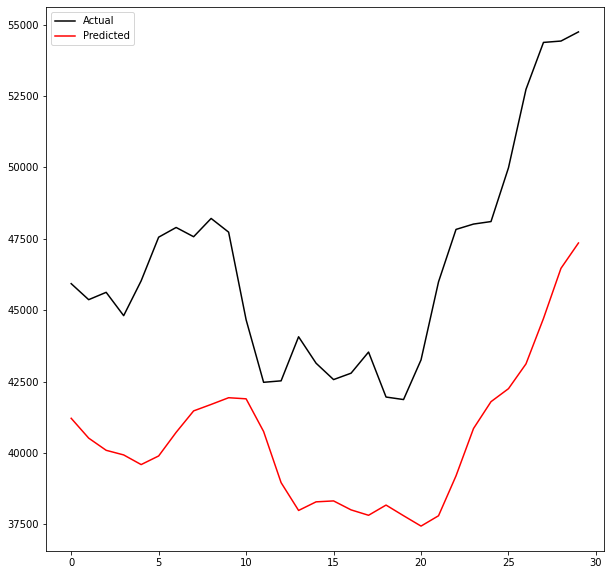

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500RMSprop0-0001elu64Int3.hdf5
Number of Neurons: 500
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00423: early stopping
Training R-Squared: 0.990776505612482

Testing R-Squared: 0.9921706400470302

30day Holdout R-Squared: -1.1058798374401655

30day Holdout MAE: 4767.122395833333

30day Holdout MAPE: 9.986047545507283

30day Holdout RMSE: 5350.247999843912


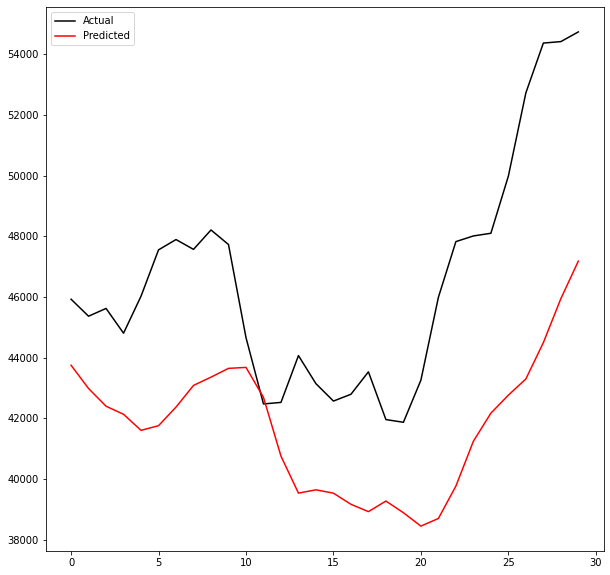

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600RMSprop0-01relu64Int3.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00101: early stopping
Training R-Squared: -0.6547268662661512

Testing R-Squared: -0.650419389893355

30day Holdout R-Squared: -159.25168558521753

30day Holdout MAE: 46526.36666666667

30day Holdout MAPE: 100.0021621847311

30day Holdout RMSE: 46672.2161622951


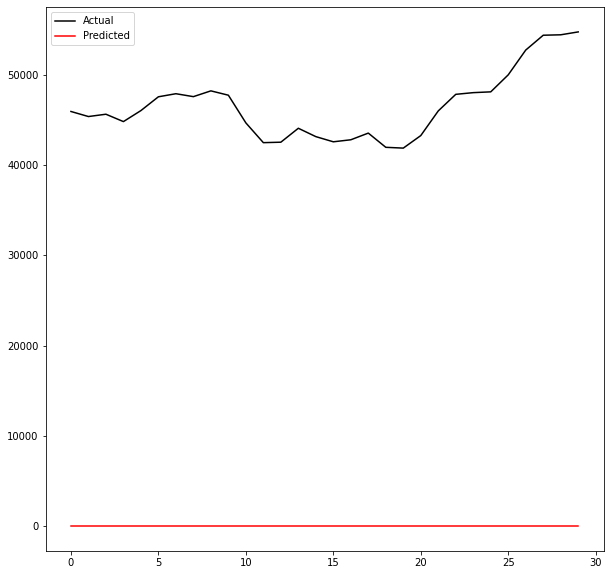

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600RMSprop0-01elu64Int3.hdf5
Number of Neurons: 600
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00511: early stopping
Training R-Squared: 0.9845888975688304

Testing R-Squared: 0.9864591384992599

30day Holdout R-Squared: -2.297334916407377

30day Holdout MAE: 6287.20859375

30day Holdout MAPE: 13.278360155381778

30day Holdout RMSE: 6694.816083722919


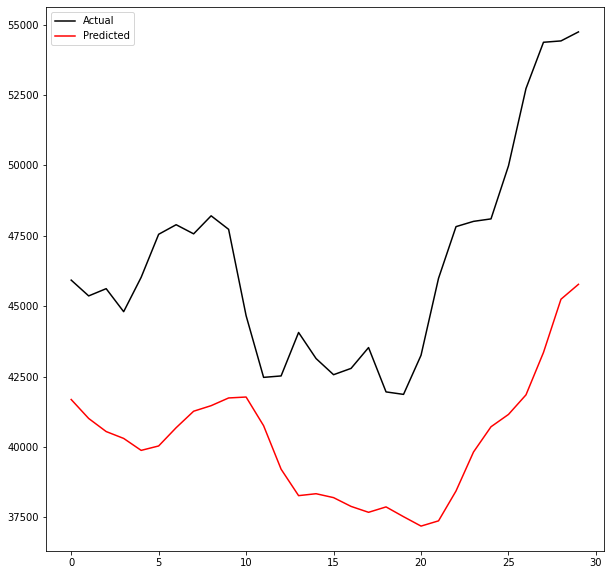

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600RMSprop0-001relu64Int3.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00478: early stopping
Training R-Squared: 0.99140780096752

Testing R-Squared: 0.993346356845459

30day Holdout R-Squared: -45.78270611603555

30day Holdout MAE: 24640.478645833333

30day Holdout MAPE: 53.451276173368235

30day Holdout RMSE: 25217.36995814778


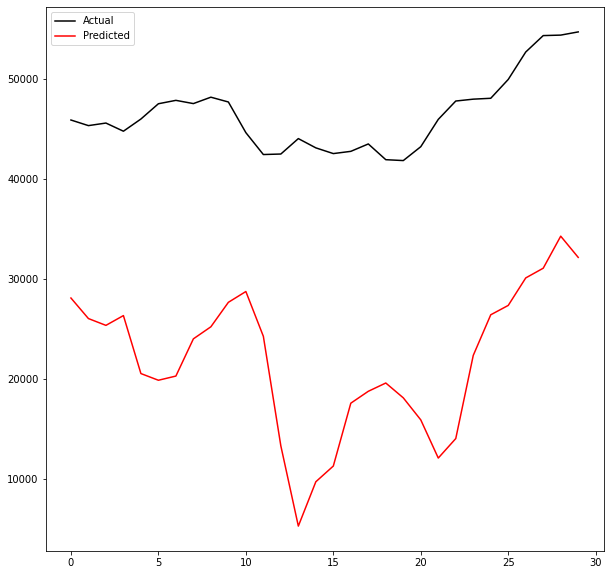

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600RMSprop0-001elu64Int3.hdf5
Number of Neurons: 600
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00602: early stopping
Training R-Squared: 0.9967684280966228

Testing R-Squared: 0.9963650286390238

30day Holdout R-Squared: 0.07614619419702595

30day Holdout MAE: 3103.1680989583333

30day Holdout MAPE: 6.507548857910904

30day Holdout RMSE: 3543.7146678845443


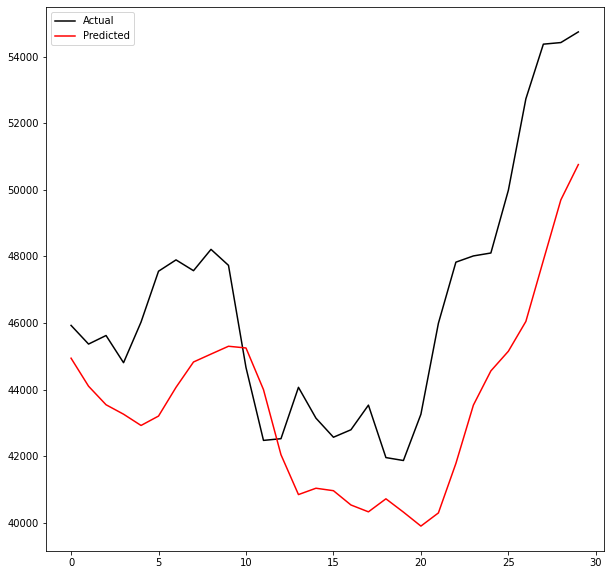

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600RMSprop0-0001relu64Int3.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00618: early stopping
Training R-Squared: 0.9946319080907864

Testing R-Squared: 0.9944768081315978

30day Holdout R-Squared: -1.1087585562946294

30day Holdout MAE: 5027.608723958333

30day Holdout MAPE: 10.637468637199483

30day Holdout RMSE: 5353.903621490256


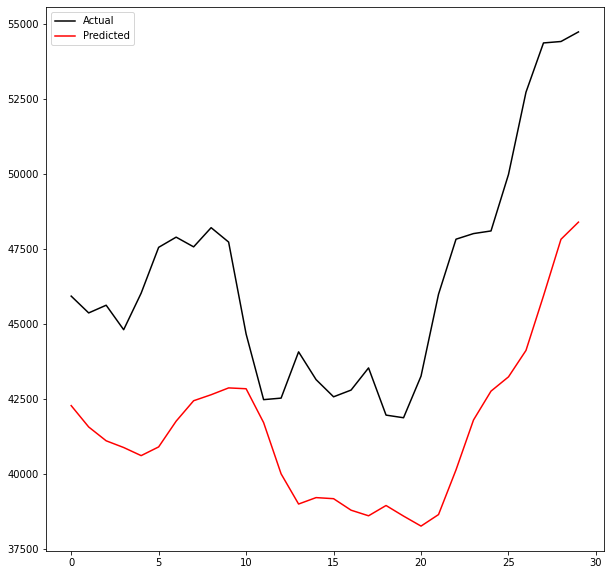

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600RMSprop0-0001elu64Int3.hdf5
Number of Neurons: 600
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 





In [48]:
opt_list = ['Adam', 'RMSprop']
activation_list = ['relu', 'elu']
neuron_list = [200, 300, 400, 500, 600]
lr_list = [0.01, 0.001, 0.0001]

for op in opt_list:
    for neuron in neuron_list:
        for l in lr_list:
            for act in activation_list:
                interval3_ann_model_nextday(X, y, lr=l, activation=act,
                                            neurons=neuron, opt=op, batch_size=64, epochs=5000)


## Interval 4 (April 1, 2013 - September 1, 2021)

In [56]:
# create a 3 hidden layer model function for testing hyperparameters

def interval4_ann_model_nextday(X, y, lr=0.01, neurons=300, activation='relu', opt='Adam', batch_size=64, epochs=5000):
    ''' 
        X is a dataframe of the dates and features using non-standardized values
        The Date column must be the first column in the X dataframe
        y is a dataframe or 1D array of the target values
    '''
    # assign the string values to variables for file naming later in the Checkpoint
    opt_name = opt
    acti = activation
    # remove the . in the learning rate
    learn_rt = re.sub('\.', '-', str(lr))
    
    # create a holdout series of the last 30 days of data
    X_holdout = X.iloc[-30:, 1:] # exclude the first column which is the date column
    y_holdout = y[-30:]
    
    # extract the data from the dates of Interval 1
    date_bool = (X.iloc[:, 0] >= '2013/04/01') & (X.iloc[:, 0] <= '2021/09/01')
    X = X[date_bool]
    # remove the date column
    X = X.iloc[:, 1:]
    # adjust the range of y df
    y = y[X.index]
    
    # create train test split of data
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=15)
    
    # scale the data
    estimators = [] # create a list for the scalers
    estimators.append(['minmax', MinMaxScaler()])
    estimators.append(['robust', RobustScaler()])
    # add the scalers to the Pipeline
    scale = Pipeline(estimators, verbose=True)
    # fit the scaler to the training data
    scale.fit(X_train)
    # transform the training, testing, and holdout data
    X_train = scale.transform(X_train)
    X_test = scale.transform(X_test)
    X_holdout = scale.transform(X_holdout)
    
#     # select an optimizer
#     if opt == 'Adam':
#         opt = tf.keras.optimizers.Adam(learning_rate=lr)
#     elif opt == 'RMSProp':
#         opt = tf.keras.optimizers.RMSprop(learning_rate=lr)
#     elif opt == 'Adagrad':
#         opt = tf.keras.optimizers.Adagrad(learning_rate=lr)
        
    # define the shape of the input number of features
    shape = X_train.shape[1]
    
    # create call backs to save the model after each epoch if it is the best seen so far
    # and for early stopping when model has not improved after 100 epochs
    mcp_save = ModelCheckpoint('trained_models/ANN4_reg_nextday' + str(neurons)+ opt_name + str(learn_rt)+ acti +str(batch_size)+'Int4.hdf5', save_best_only=True, monitor='val_loss', mode='auto')
    earlyStopping = EarlyStopping(monitor='val_loss', patience=100, verbose=1, mode='auto')
        
    # create a special definition for the ANN model to adjust hyperparameters
    def seq_model(initializer='normal', activation=activation, neurons=neurons, NUM_FEATURES=shape, opt=opt, lr=lr):
        # create model
        model = Sequential()
        model.add(Dense(neurons, input_shape=(NUM_FEATURES,), kernel_initializer=initializer, activation=activation))
        model.add(Dense(neurons, activation=activation))
        model.add(Dense(neurons, activation=activation))
        model.add(Dense(neurons, activation=activation))
        model.add(Dense(neurons, activation=activation))
        model.add(Dense(1, activation=activation, kernel_initializer=initializer))
        # Compile model
        # select an optimizer
        if opt == 'Adam':
            opt = tf.keras.optimizers.Adam(learning_rate=lr)
        elif opt == 'RMSprop':
            opt = tf.keras.optimizers.RMSprop(learning_rate=lr)
        elif opt == 'Adagrad':
            opt = tf.keras.optimizers.Adagrad(learning_rate=lr)
        
        model.compile(loss='logcosh', optimizer=opt, metrics=['mae'])
        return model
        
    # define the 4 Dense layer model
    ann_model = seq_model(activation=activation, neurons=neurons, NUM_FEATURES=shape)
    

    # create the regressor
    regressor=KerasRegressor(build_fn=seq_model, batch_size=batch_size, epochs=epochs, verbose=0, shuffle=True,
                         validation_split=0.1, validation_freq=1,
                        use_multiprocessing=True, callbacks=[mcp_save,earlyStopping])
    
    # fit the model on training data
    regressor.fit(X_train, y_train)
    
    # use training data for predictions
    y_train_pred = regressor.predict(X_train)
    # calculate R-squared score for train data
    r2 = r2_score(y_train, y_train_pred)
    print('Training R-Squared:', r2)
    
    # use testing data for predictions
    y_test_pred = regressor.predict(X_test)
    # calculate R-squared score for test data
    r2 = r2_score(y_test, y_test_pred)
    print('\nTesting R-Squared:', r2)
    
    # use holdout data for predictions
    y_holdout_pred = regressor.predict(X_holdout)
    # calculate R-squared score for holdout data
    r2 = r2_score(y_holdout, y_holdout_pred)
    print('\n30day Holdout R-Squared:', r2)
    # calculate mean absolute error for holdout data
    mae = mean_absolute_error(y_holdout, y_holdout_pred)
    print('\n30day Holdout MAE:', mae)
    # calculate mean absolute percentage error for holdout data
    mape = mean_absolute_percentage_error(y_holdout, y_holdout_pred)
    print('\n30day Holdout MAPE:', mape)
    # calculate root mean squared error 
    rmse = np.sqrt(mean_squared_error(y_holdout, y_holdout_pred))
    print('\n30day Holdout RMSE:', rmse)
    
    # create a df of the holdout predicted and actual
    holdout_df = pd.DataFrame(zip(y_holdout, y_holdout_pred), columns=['actual', 'predicted'])
    
    plt.plot(holdout_df.index, holdout_df['actual'], color='black', label='Actual')
    plt.plot(holdout_df.index, holdout_df['predicted'], color='red', label='Predicted')
    plt.legend()
    plt.show()
    
    print('---------Model Summary For Above Results----------')
    print('trained_models/ANN4_reg_nextday' + str(neurons)+ opt_name + str(learn_rt)+ acti +str(batch_size)+'Int4.hdf5')
    print('Number of Neurons:', neurons)
    print('Activation:', activation)
    print('Optimizer:', opt_name)
    print('Learning Rate:', lr)
    
    # to be used as the comparison metric
    return r2

[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00304: early stopping
Training R-Squared: 0.9966164806833175

Testing R-Squared: 0.9956894226830846

30day Holdout R-Squared: 0.362927864621877

30day Holdout MAE: 2547.9489583333334

30day Holdout MAPE: 5.355536890782777

30day Holdout RMSE: 2942.736832636586


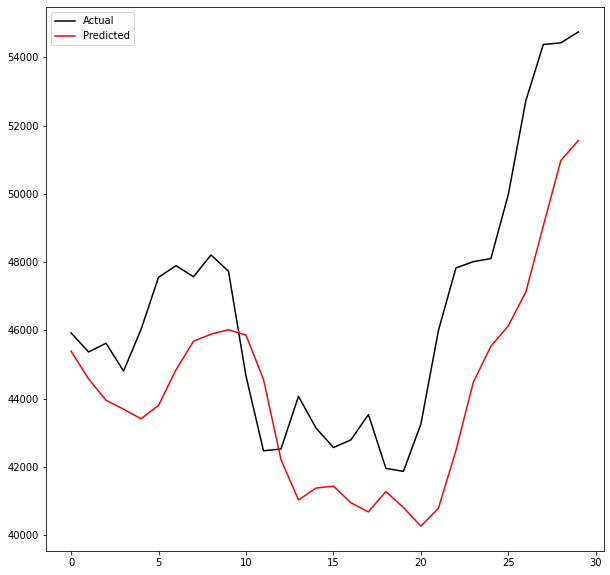

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200Adam0-01relu64Int4.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00445: early stopping
Training R-Squared: 0.9969141018159035

Testing R-Squared: 0.9968275179425401

30day Holdout R-Squared: 0.7492477710471721

30day Holdout MAE: 1429.4466145833333

30day Holdout MAPE: 3.1597758512653553

30day Holdout RMSE: 1846.2032925783278


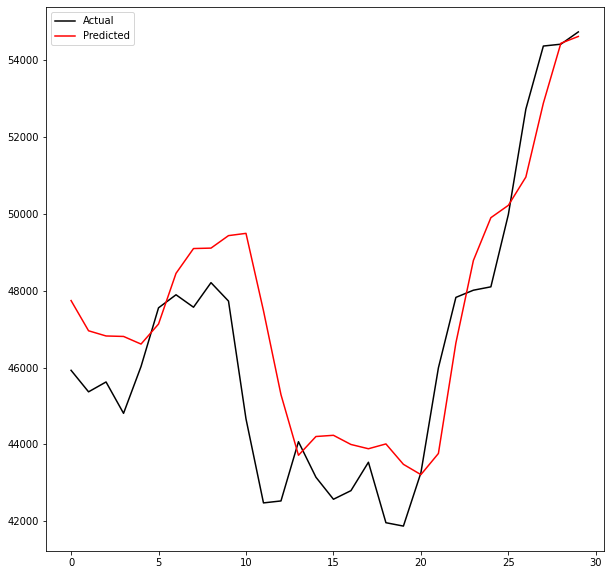

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200Adam0-001relu64Int4.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 01262: early stopping
Training R-Squared: 0.9977376521797758

Testing R-Squared: 0.9973885402614392

30day Holdout R-Squared: 0.7461810645125868

30day Holdout MAE: 1397.55078125

30day Holdout MAPE: 2.9664643276019143

30day Holdout RMSE: 1857.4585422292096


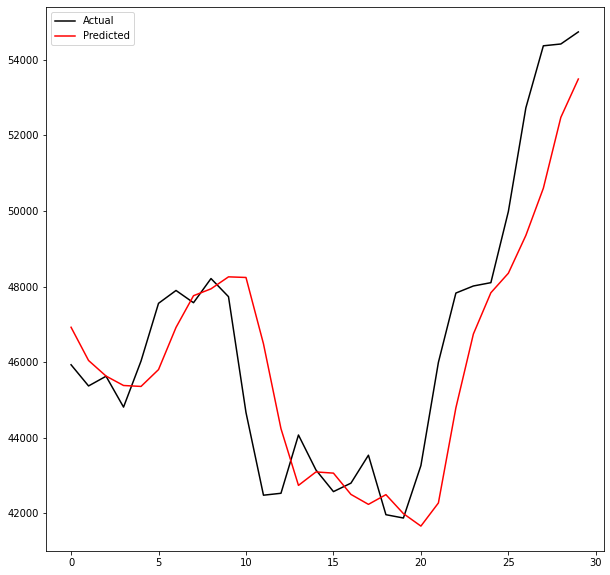

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200Adam0-0001relu64Int4.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00236: early stopping
Training R-Squared: 0.9959869014495676

Testing R-Squared: 0.9947913721555646

30day Holdout R-Squared: 0.4685001416411091

30day Holdout MAE: 2306.620572916667

30day Holdout MAPE: 4.860438560024157

30day Holdout RMSE: 2687.8727020706583


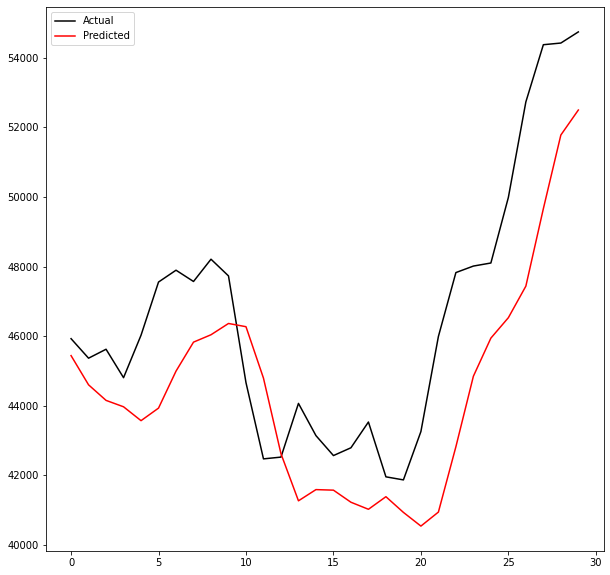

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00231: early stopping
Training R-Squared: 0.9977188572530276

Testing R-Squared: 0.9974921600096277

30day Holdout R-Squared: 0.7534919284408987

30day Holdout MAE: 1409.2970052083333

30day Holdout MAPE: 2.983681072015559

30day Holdout RMSE: 1830.5124717157635


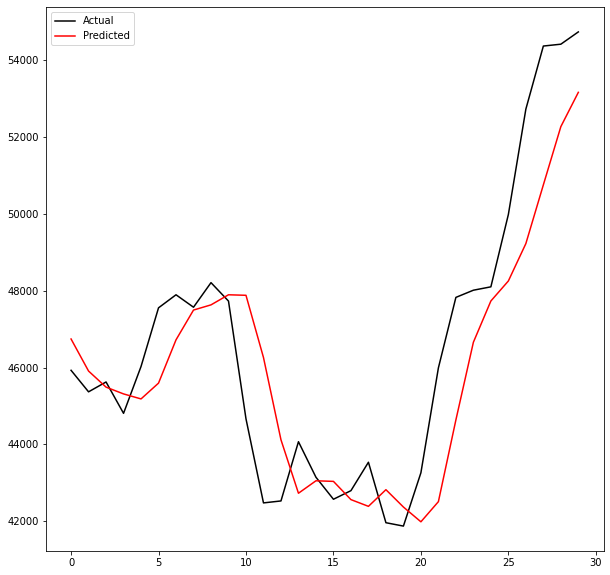

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 01439: early stopping
Training R-Squared: 0.997910079138373

Testing R-Squared: 0.9973905846804396

30day Holdout R-Squared: 0.725422999118174

30day Holdout MAE: 1485.7309895833334

30day Holdout MAPE: 3.1434061805174487

30day Holdout RMSE: 1931.9202673600807


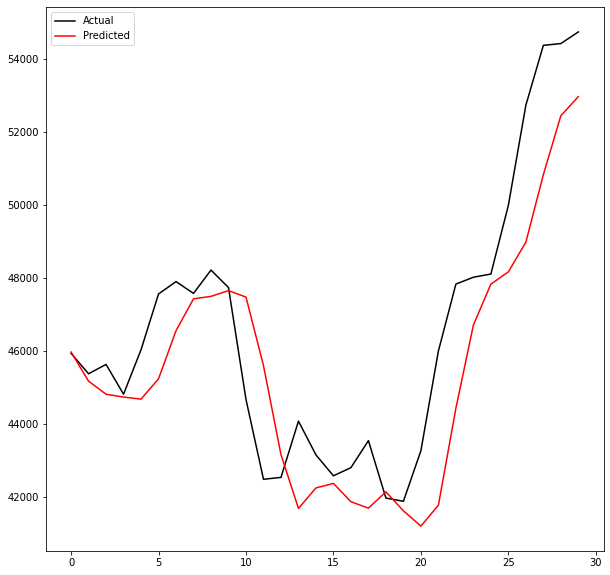

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00243: early stopping
Training R-Squared: 0.9966621383693748

Testing R-Squared: 0.9966626366722442

30day Holdout R-Squared: 0.7555738647003318

30day Holdout MAE: 1414.49140625

30day Holdout MAPE: 3.0770424043139797

30day Holdout RMSE: 1822.7660902310106


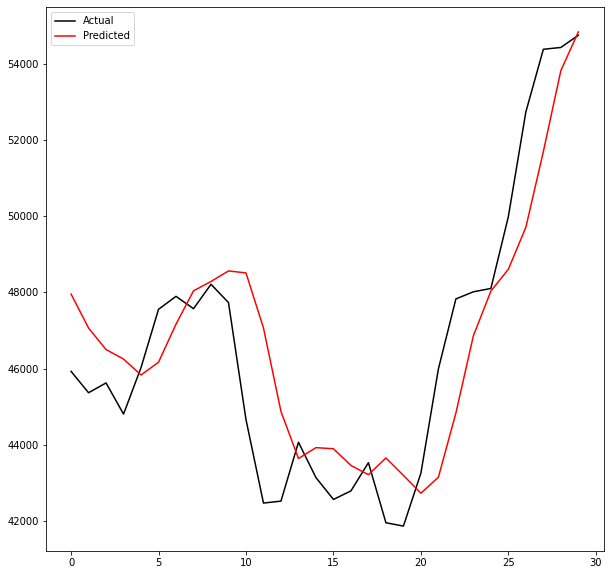

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400Adam0-01relu64Int4.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00349: early stopping
Training R-Squared: 0.9980368018614514

Testing R-Squared: 0.9974504965079486

30day Holdout R-Squared: 0.750069527380679

30day Holdout MAE: 1416.3979166666666

30day Holdout MAPE: 2.9859717073719474

30day Holdout RMSE: 1843.1756539678472


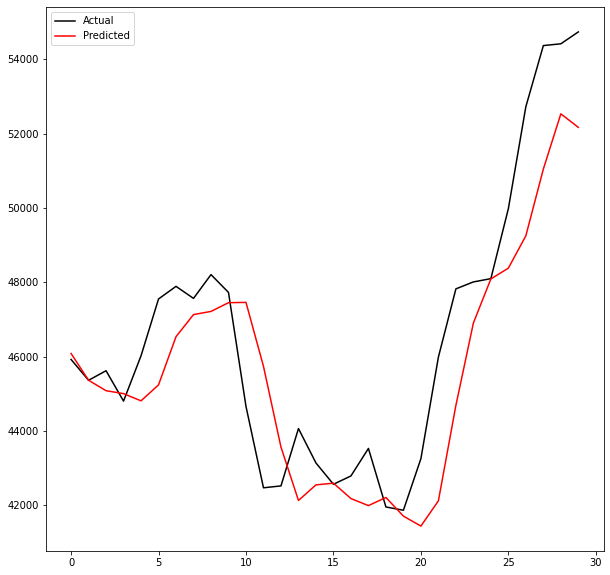

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400Adam0-001relu64Int4.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 01155: early stopping
Training R-Squared: 0.9981230767276613

Testing R-Squared: 0.997777025367788

30day Holdout R-Squared: 0.7705000259804555

30day Holdout MAE: 1314.6438802083333

30day Holdout MAPE: 2.7974610078551296

30day Holdout RMSE: 1766.2348123744878


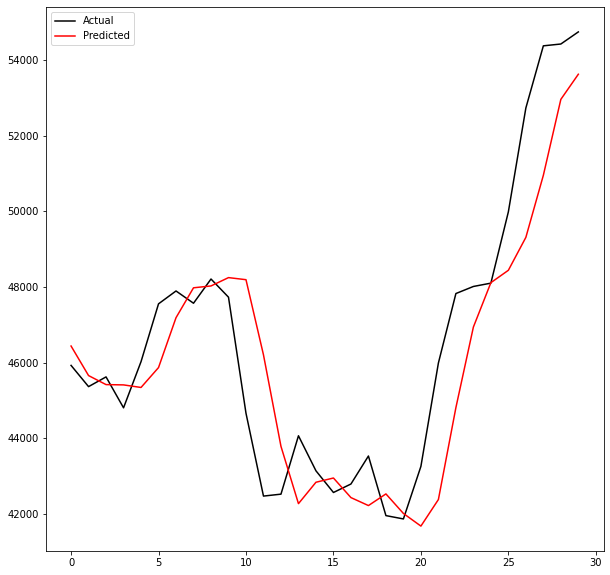

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400Adam0-0001relu64Int4.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00563: early stopping
Training R-Squared: 0.9974687514595106

Testing R-Squared: 0.997422063461798

30day Holdout R-Squared: 0.7821788277552405

30day Holdout MAE: 1330.3364583333334

30day Holdout MAPE: 2.8616151942944907

30day Holdout RMSE: 1720.7079512536366


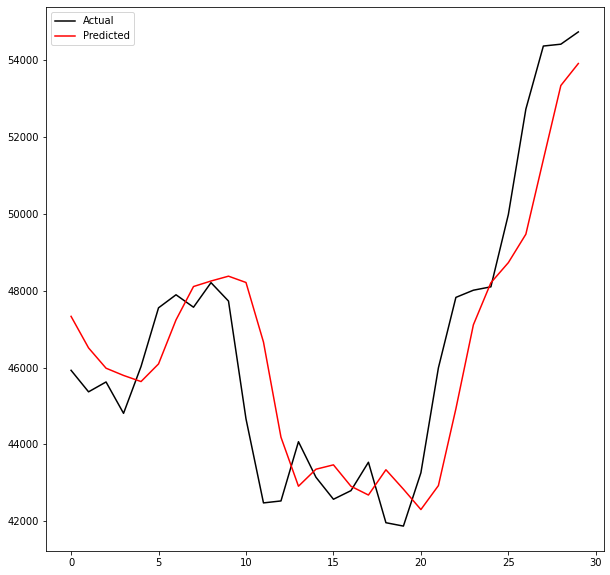

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500Adam0-01relu64Int4.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00281: early stopping
Training R-Squared: 0.9938849516823713

Testing R-Squared: 0.9940671329302547

30day Holdout R-Squared: 0.46238880782829683

30day Holdout MAE: 2280.916015625

30day Holdout MAPE: 5.039427205498367

30day Holdout RMSE: 2703.281490539866


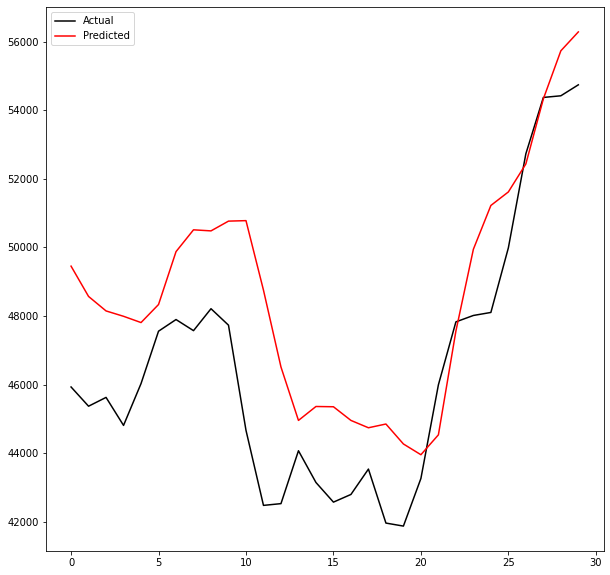

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500Adam0-001relu64Int4.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 01045: early stopping
Training R-Squared: 0.9981657875078799

Testing R-Squared: 0.9977610222954681

30day Holdout R-Squared: 0.7718033157355189

30day Holdout MAE: 1320.1529947916667

30day Holdout MAPE: 2.799930376941851

30day Holdout RMSE: 1761.2126046350227


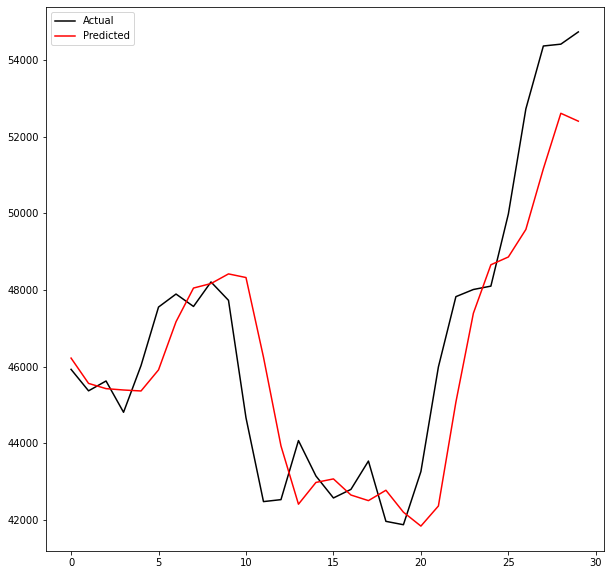

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500Adam0-0001relu64Int4.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00379: early stopping
Training R-Squared: 0.9976055353259883

Testing R-Squared: 0.997307993705513

30day Holdout R-Squared: 0.7691245207805537

30day Holdout MAE: 1381.0748697916667

30day Holdout MAPE: 2.9593572247986644

30day Holdout RMSE: 1771.519858276998


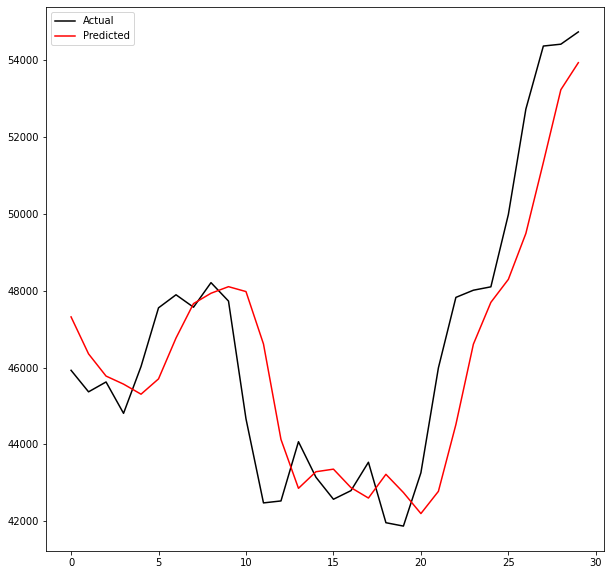

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600Adam0-01relu64Int4.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00298: early stopping
Training R-Squared: 0.9979781929188465

Testing R-Squared: 0.9976011403909752

30day Holdout R-Squared: 0.7689723988272263

30day Holdout MAE: 1370.8046875

30day Holdout MAPE: 2.941180112802997

30day Holdout RMSE: 1772.1033821012404


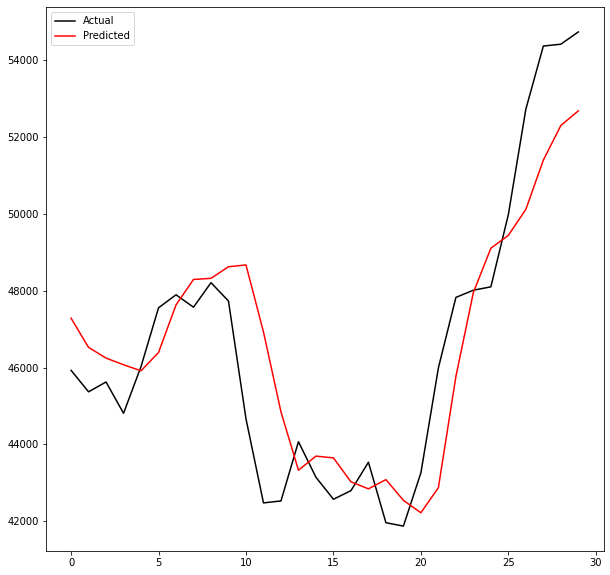

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600Adam0-001relu64Int4.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00777: early stopping
Training R-Squared: 0.9981516430459187

Testing R-Squared: 0.9977188681716345

30day Holdout R-Squared: 0.7872340445347721

30day Holdout MAE: 1288.4416666666666

30day Holdout MAPE: 2.7319724761858235

30day Holdout RMSE: 1700.623550992323


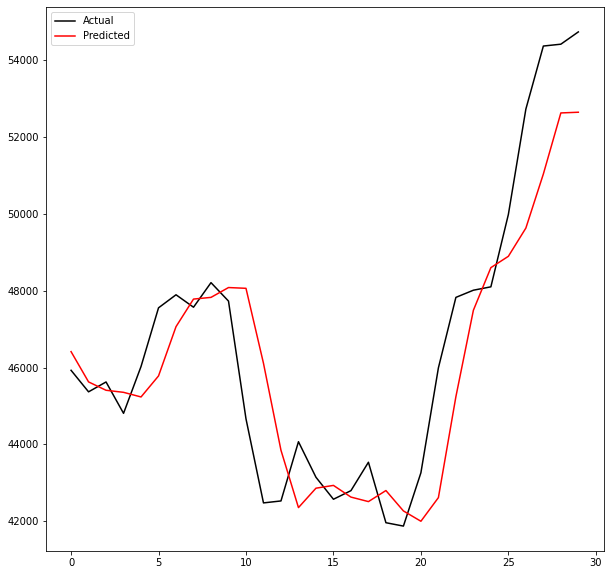

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600Adam0-0001relu64Int4.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00442: early stopping
Training R-Squared: 0.9767906778123661

Testing R-Squared: 0.9743301897821623

30day Holdout R-Squared: -2.248659275471736

30day Holdout MAE: 6353.928645833334

30day Holdout MAPE: 13.497826588991357

30day Holdout RMSE: 6645.217532034606


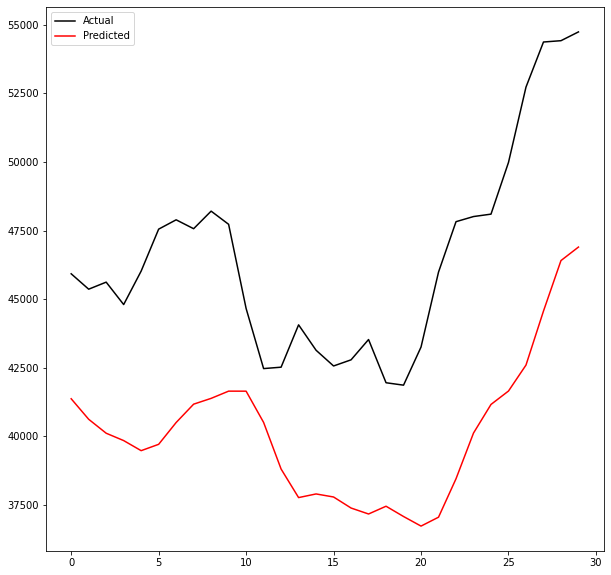

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200RMSprop0-01relu64Int4.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00333: early stopping
Training R-Squared: 0.9974251311570617

Testing R-Squared: 0.9969124315930218

30day Holdout R-Squared: 0.6271310631632986

30day Holdout MAE: 1790.5486979166667

30day Holdout MAPE: 3.75182249306419

30day Holdout RMSE: 2251.309594952194


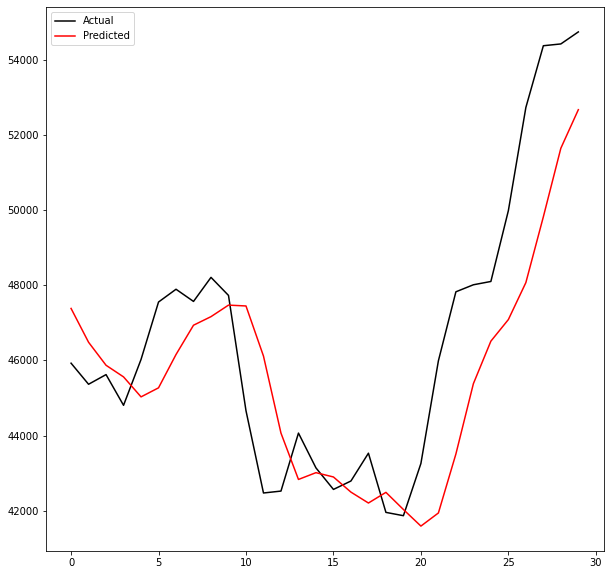

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200RMSprop0-001relu64Int4.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 01181: early stopping
Training R-Squared: 0.9976646670868582

Testing R-Squared: 0.9973450430204178

30day Holdout R-Squared: 0.7327220240085752

30day Holdout MAE: 1452.3109375

30day Holdout MAPE: 3.0767138814252197

30day Holdout RMSE: 1906.069390155214


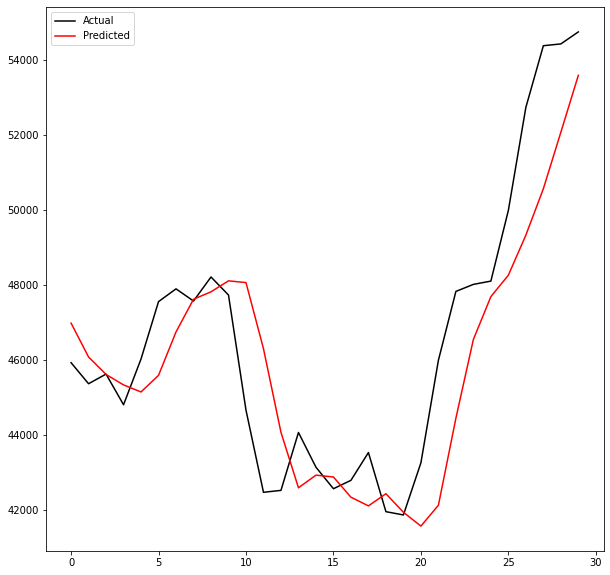

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00302: early stopping
Training R-Squared: 0.9960097850526028

Testing R-Squared: 0.9959761818626279

30day Holdout R-Squared: 0.7004740424682532

30day Holdout MAE: 1575.1346354166667

30day Holdout MAPE: 3.4524165653765126

30day Holdout RMSE: 2017.7825072022654


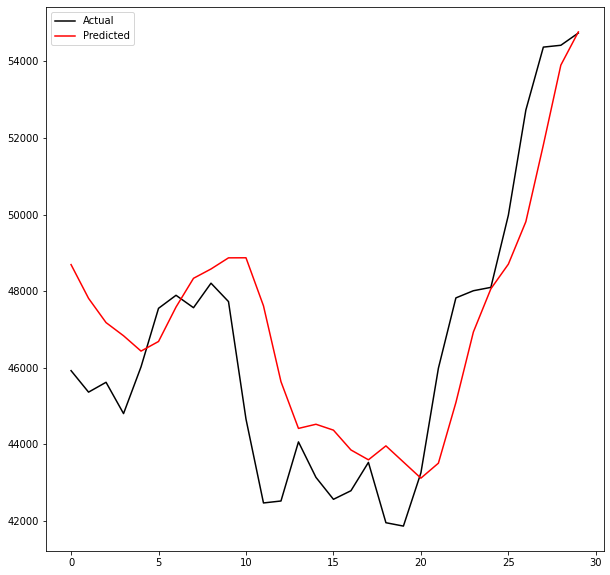

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-01relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00396: early stopping
Training R-Squared: 0.9937171724824694

Testing R-Squared: 0.9922437339438264

30day Holdout R-Squared: -0.04207145972564308

30day Holdout MAE: 3301.6563802083333

30day Holdout MAPE: 6.926541891967094

30day Holdout RMSE: 3763.620893911157


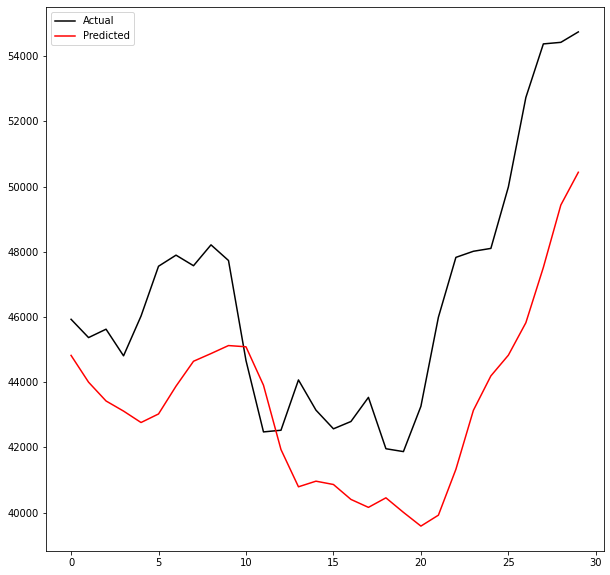

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00975: early stopping
Training R-Squared: 0.997165134696217

Testing R-Squared: 0.9970824281312397

30day Holdout R-Squared: 0.7879773582650155

30day Holdout MAE: 1300.4653645833334

30day Holdout MAPE: 2.8217992760861303

30day Holdout RMSE: 1697.6503243321451


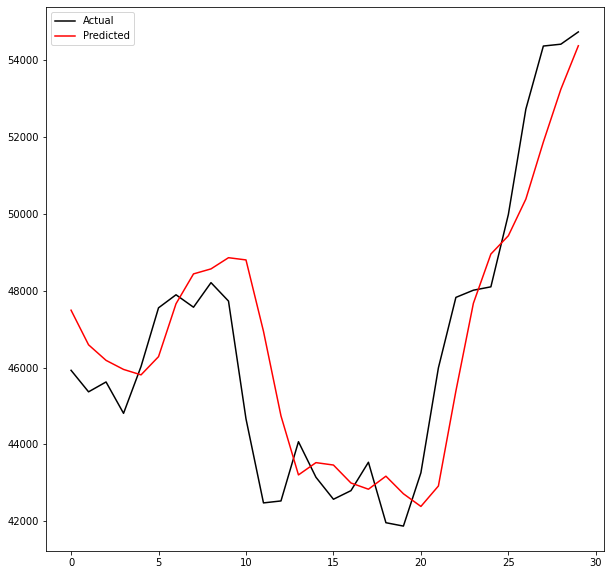

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00478: early stopping
Training R-Squared: 0.9971595122816777

Testing R-Squared: 0.9963809725475421

30day Holdout R-Squared: 0.64322025264726

30day Holdout MAE: 1758.0002604166666

30day Holdout MAPE: 3.6921176734598062

30day Holdout RMSE: 2202.2023253760963


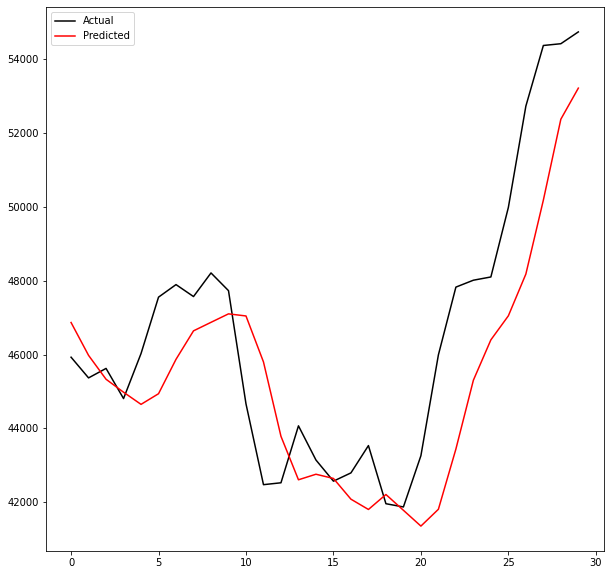

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400RMSprop0-01relu64Int4.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00361: early stopping
Training R-Squared: 0.9972608843468388

Testing R-Squared: 0.9965137925094282

30day Holdout R-Squared: 0.5451520015334732

30day Holdout MAE: 1988.8623697916667

30day Holdout MAPE: 4.153237309850932

30day Holdout RMSE: 2486.5103084991547


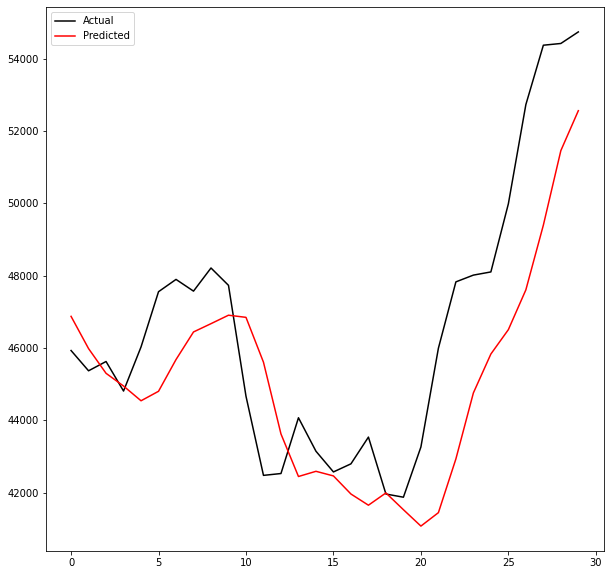

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400RMSprop0-001relu64Int4.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00612: early stopping
Training R-Squared: 0.9974633016765587

Testing R-Squared: 0.9967859107049064

30day Holdout R-Squared: 0.616687748257031

30day Holdout MAE: 1903.3174479166667

30day Holdout MAPE: 4.012953592978492

30day Holdout RMSE: 2282.61922358798


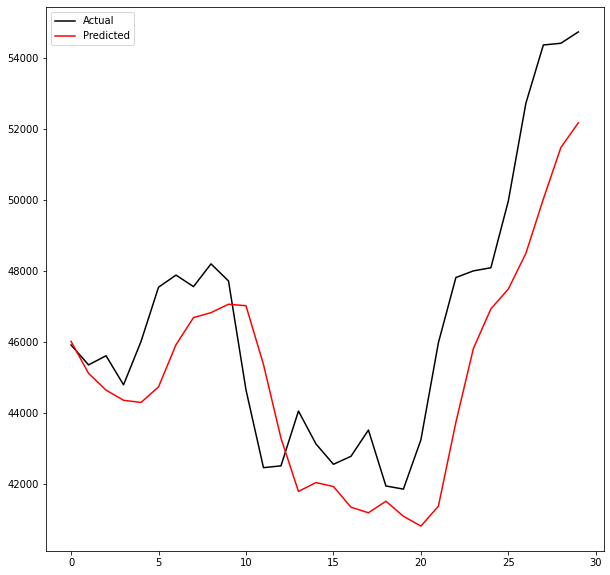

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00386: early stopping
Training R-Squared: 0.9941694580688317

Testing R-Squared: 0.9943907261295553

30day Holdout R-Squared: 0.4831826897103296

30day Holdout MAE: 2209.0201822916665

30day Holdout MAPE: 4.903696809096886

30day Holdout RMSE: 2650.4868008443073


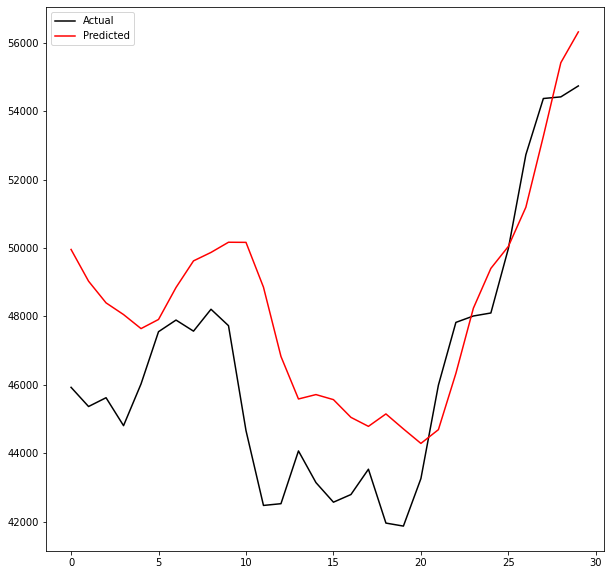

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500RMSprop0-01relu64Int4.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00180: early stopping
Training R-Squared: 0.9884740339773024

Testing R-Squared: 0.9897715303914376

30day Holdout R-Squared: -0.000602914694908474

30day Holdout MAE: 3158.599609375

30day Holdout MAPE: 7.022676930927816

30day Holdout RMSE: 3687.9752843556157


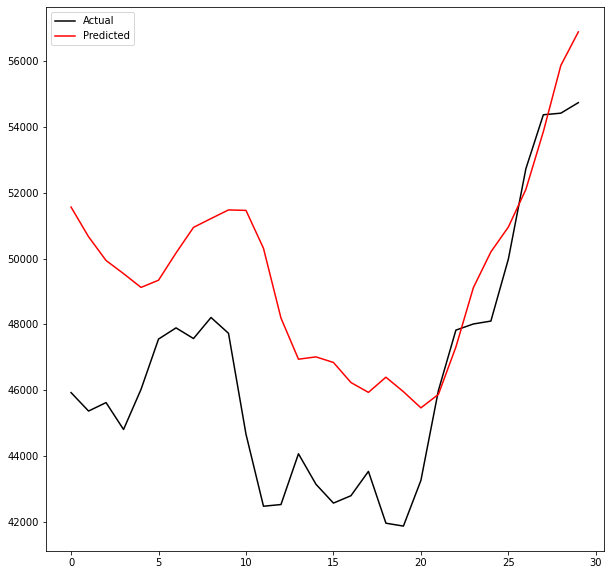

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500RMSprop0-001relu64Int4.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 01118: early stopping
Training R-Squared: 0.9974755739335456

Testing R-Squared: 0.9967297972654491

30day Holdout R-Squared: 0.6026015376144779

30day Holdout MAE: 1925.1897135416666

30day Holdout MAPE: 4.044656134016914

30day Holdout RMSE: 2324.1824167729746


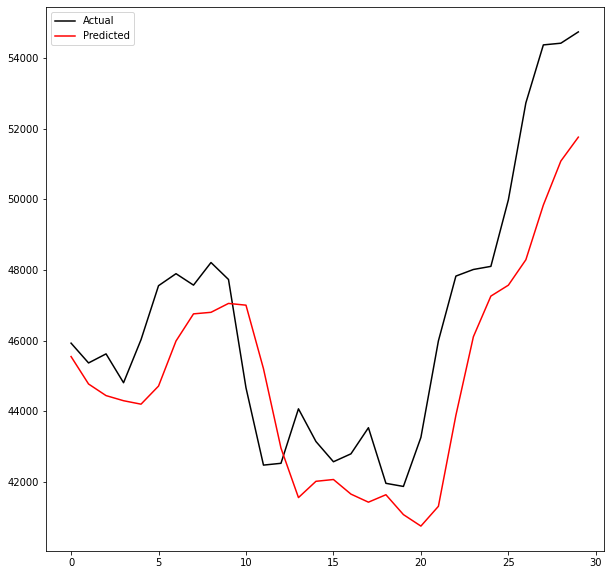

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00696: early stopping
Training R-Squared: 0.9863734159955324

Testing R-Squared: 0.987738218465752

30day Holdout R-Squared: -0.2658211978724492

30day Holdout MAE: 3748.7916666666665

30day Holdout MAPE: 8.229664471290283

30day Holdout RMSE: 4148.043500627659


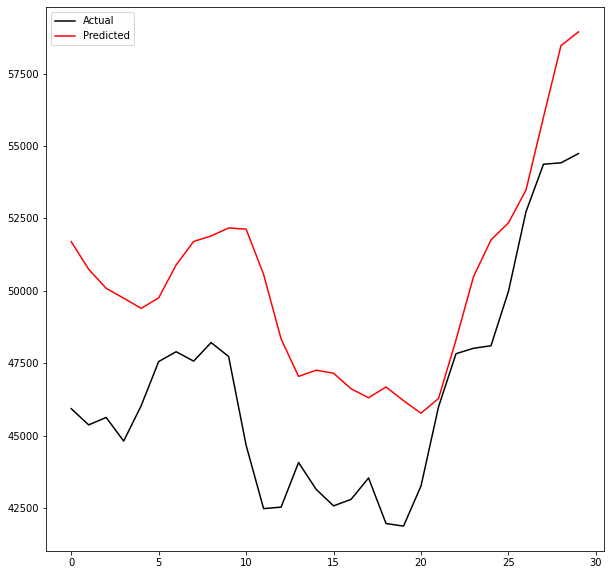

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600RMSprop0-01relu64Int4.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00476: early stopping
Training R-Squared: 0.9963478559101849

Testing R-Squared: 0.9965896985433993

30day Holdout R-Squared: 0.7410241167982505

30day Holdout MAE: 1429.528515625

30day Holdout MAPE: 3.139148644391878

30day Holdout RMSE: 1876.2330485806833


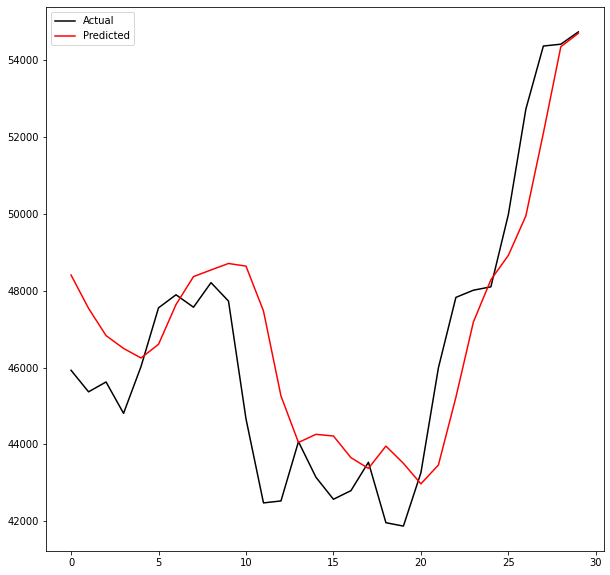

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600RMSprop0-001relu64Int4.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00454: early stopping
Training R-Squared: 0.9968826136817397

Testing R-Squared: 0.9968593898410936

30day Holdout R-Squared: 0.7544144301263184

30day Holdout MAE: 1426.2674479166667

30day Holdout MAPE: 3.0986175994402694

30day Holdout RMSE: 1827.0841181473766


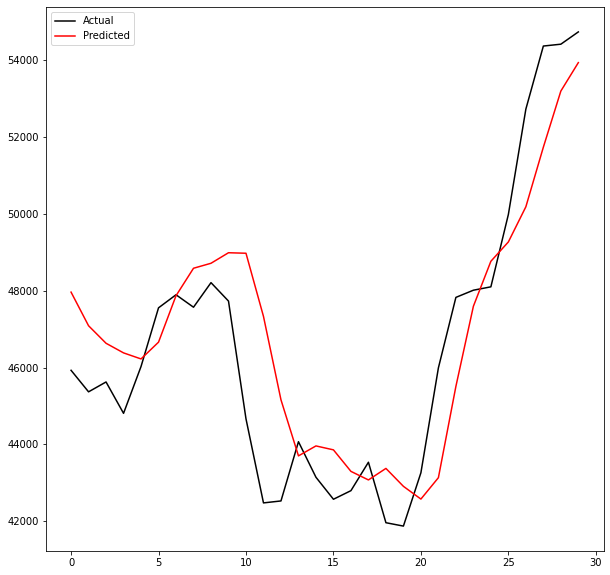

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001


In [51]:
opt_list = ['Adam', 'RMSprop']
activation_list = ['relu']
neuron_list = [200, 300, 400, 500, 600]
lr_list = [0.01, 0.001, 0.0001]

for op in opt_list:
    for neuron in neuron_list:
        for l in lr_list:
            for act in activation_list:
                interval4_ann_model_nextday(X, y, lr=l, activation=act,
                                            neurons=neuron, opt=op, batch_size=64, epochs=5000)


## Interval 5 (April 1, 2015 - September 1, 2021)

In [52]:
# create a 3 hidden layer model function for testing hyperparameters

def interval5_ann_model_nextday(X, y, lr=0.01, neurons=300, activation='relu', opt='Adam', batch_size=64, epochs=5000):
    ''' 
        X is a dataframe of the dates and features using non-standardized values
        The Date column must be the first column in the X dataframe
        y is a dataframe or 1D array of the target values
    '''
    # assign the string values to variables for file naming later in the Checkpoint
    opt_name = opt
    acti = activation
    # remove the . in the learning rate
    learn_rt = re.sub('\.', '-', str(lr))
    
    # create a holdout series of the last 30 days of data
    X_holdout = X.iloc[-30:, 1:] # exclude the first column which is the date column
    y_holdout = y[-30:]
    
    # extract the data from the dates of Interval 1
    date_bool = (X.iloc[:, 0] >= '2015/04/01') & (X.iloc[:, 0] <= '2021/09/01')
    X = X[date_bool]
    # remove the date column
    X = X.iloc[:, 1:]
    # adjust the range of y df
    y = y[X.index]
    
    # create train test split of data
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=15)
    
    # scale the data
    estimators = [] # create a list for the scalers
    estimators.append(['minmax', MinMaxScaler()])
    estimators.append(['robust', RobustScaler()])
    # add the scalers to the Pipeline
    scale = Pipeline(estimators, verbose=True)
    # fit the scaler to the training data
    scale.fit(X_train)
    # transform the training, testing, and holdout data
    X_train = scale.transform(X_train)
    X_test = scale.transform(X_test)
    X_holdout = scale.transform(X_holdout)
    
#     # select an optimizer
#     if opt == 'Adam':
#         opt = tf.keras.optimizers.Adam(learning_rate=lr)
#     elif opt == 'RMSProp':
#         opt = tf.keras.optimizers.RMSprop(learning_rate=lr)
#     elif opt == 'Adagrad':
#         opt = tf.keras.optimizers.Adagrad(learning_rate=lr)
        
    # define the shape of the input number of features
    shape = X_train.shape[1]
    
    # create call backs to save the model after each epoch if it is the best seen so far
    # and for early stopping when model has not improved after 100 epochs
    mcp_save = ModelCheckpoint('trained_models/ANN5_reg_nextday' + str(neurons)+ opt_name + str(learn_rt)+ acti +str(batch_size)+'Int5.hdf5', save_best_only=True, monitor='val_loss', mode='auto')
    earlyStopping = EarlyStopping(monitor='val_loss', patience=100, verbose=1, mode='auto')
        
    # create a special definition for the ANN model to adjust hyperparameters
    def seq_model(initializer='normal', activation=activation, neurons=neurons, NUM_FEATURES=shape, opt=opt, lr=lr):
        # create model
        model = Sequential()
        model.add(Dense(neurons, input_shape=(NUM_FEATURES,), kernel_initializer=initializer, activation=activation))
        model.add(Dense(neurons, activation=activation))
        model.add(Dense(neurons, activation=activation))
        model.add(Dense(neurons, activation=activation))
        model.add(Dense(neurons, activation=activation))
        model.add(Dense(1, activation=activation, kernel_initializer=initializer))
        # Compile model
        # select an optimizer
        if opt == 'Adam':
            opt = tf.keras.optimizers.Adam(learning_rate=lr)
        elif opt == 'RMSprop':
            opt = tf.keras.optimizers.RMSprop(learning_rate=lr)
        elif opt == 'Adagrad':
            opt = tf.keras.optimizers.Adagrad(learning_rate=lr)
        
        model.compile(loss='logcosh', optimizer=opt, metrics=['mae'])
        return model
        
    # define the 4 Dense layer model
    ann_model = seq_model(activation=activation, neurons=neurons, NUM_FEATURES=shape)
    

    # create the regressor
    regressor=KerasRegressor(build_fn=seq_model, batch_size=batch_size, epochs=epochs, verbose=0, shuffle=True,
                         validation_split=0.1, validation_freq=1,
                        use_multiprocessing=True, callbacks=[mcp_save,earlyStopping])
    
    # fit the model on training data
    regressor.fit(X_train, y_train)
    
    # use training data for predictions
    y_train_pred = regressor.predict(X_train)
    # calculate R-squared score for train data
    r2 = r2_score(y_train, y_train_pred)
    print('Training R-Squared:', r2)
    
    # use testing data for predictions
    y_test_pred = regressor.predict(X_test)
    # calculate R-squared score for test data
    r2 = r2_score(y_test, y_test_pred)
    print('\nTesting R-Squared:', r2)
    
    # use holdout data for predictions
    y_holdout_pred = regressor.predict(X_holdout)
    # calculate R-squared score for holdout data
    r2 = r2_score(y_holdout, y_holdout_pred)
    print('\n30day Holdout R-Squared:', r2)
    # calculate mean absolute error for holdout data
    mae = mean_absolute_error(y_holdout, y_holdout_pred)
    print('\n30day Holdout MAE:', mae)
    # calculate mean absolute percentage error for holdout data
    mape = mean_absolute_percentage_error(y_holdout, y_holdout_pred)
    print('\n30day Holdout MAPE:', mape)
    # calculate root mean squared error 
    rmse = np.sqrt(mean_squared_error(y_holdout, y_holdout_pred))
    print('\n30day Holdout RMSE:', rmse)
    
    # create a df of the holdout predicted and actual
    holdout_df = pd.DataFrame(zip(y_holdout, y_holdout_pred), columns=['actual', 'predicted'])
    
    plt.plot(holdout_df.index, holdout_df['actual'], color='black', label='Actual')
    plt.plot(holdout_df.index, holdout_df['predicted'], color='red', label='Predicted')
    plt.legend()
    plt.show()
    
    print('---------Model Summary For Above Results----------')
    print('trained_models/ANN4_reg_nextday' + str(neurons)+ opt_name + str(learn_rt)+ acti +str(batch_size)+'Int5.hdf5')
    print('Number of Neurons:', neurons)
    print('Activation:', activation)
    print('Optimizer:', opt_name)
    print('Learning Rate:', lr)

[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00268: early stopping
Training R-Squared: 0.9942502278347917

Testing R-Squared: 0.994310818789281

30day Holdout R-Squared: 0.6374721159726736

30day Holdout MAE: 1814.1493489583333

30day Holdout MAPE: 3.99297324534442

30day Holdout RMSE: 2219.8714624930303


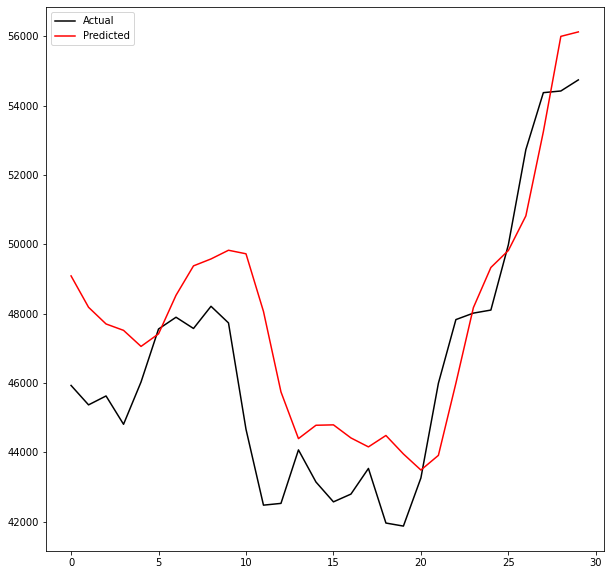

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200Adam0-01relu64Int5.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00535: early stopping
Training R-Squared: 0.9979026236416745

Testing R-Squared: 0.997422754204582

30day Holdout R-Squared: 0.7099497848525125

30day Holdout MAE: 1566.4893229166667

30day Holdout MAPE: 3.3134081866537235

30day Holdout RMSE: 1985.6089241049635


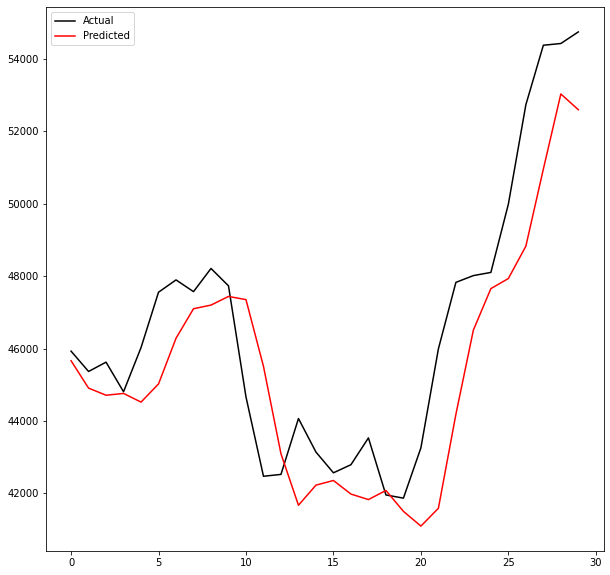

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200Adam0-001relu64Int5.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00852: early stopping
Training R-Squared: 0.9974416386862341

Testing R-Squared: 0.9971826887177625

30day Holdout R-Squared: 0.6840800588543074

30day Holdout MAE: 1641.3024739583334

30day Holdout MAPE: 3.4400496230396302

30day Holdout RMSE: 2072.266660722109


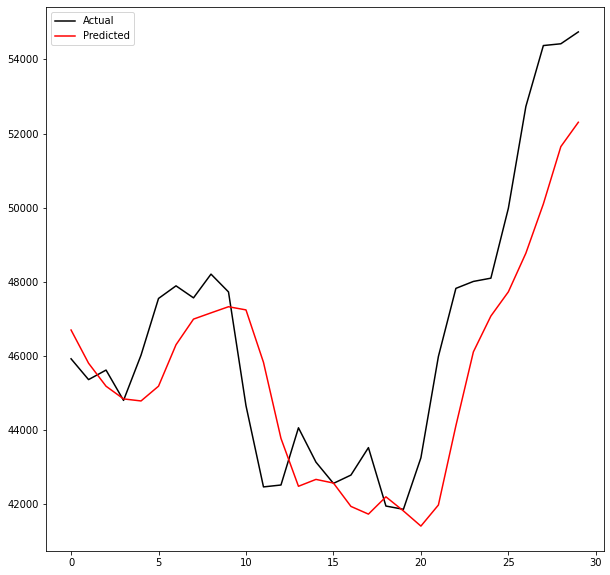

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200Adam0-0001relu64Int5.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00343: early stopping
Training R-Squared: 0.9973436894402117

Testing R-Squared: 0.996926557171682

30day Holdout R-Squared: 0.6345118842136422

30day Holdout MAE: 1805.5359375

30day Holdout MAPE: 3.800442717983627

30day Holdout RMSE: 2228.9162479842894


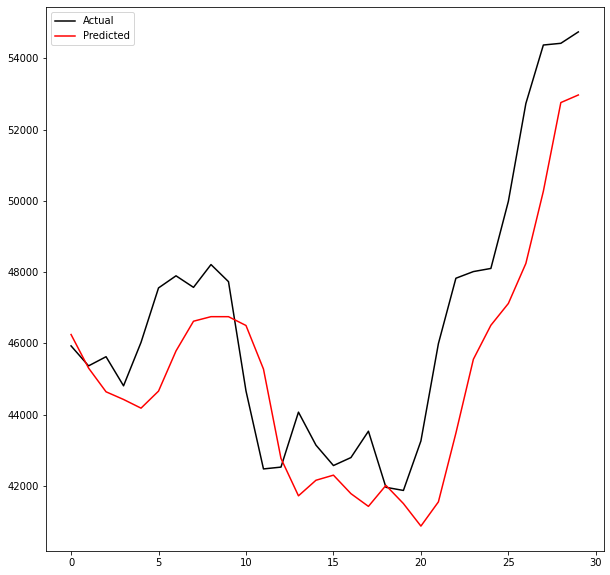

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int5.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00400: early stopping
Training R-Squared: 0.9980332844591512

Testing R-Squared: 0.9974450484472542

30day Holdout R-Squared: 0.6860239362040181

30day Holdout MAE: 1679.6454427083333

30day Holdout MAPE: 3.5617247511075445

30day Holdout RMSE: 2065.881422985494


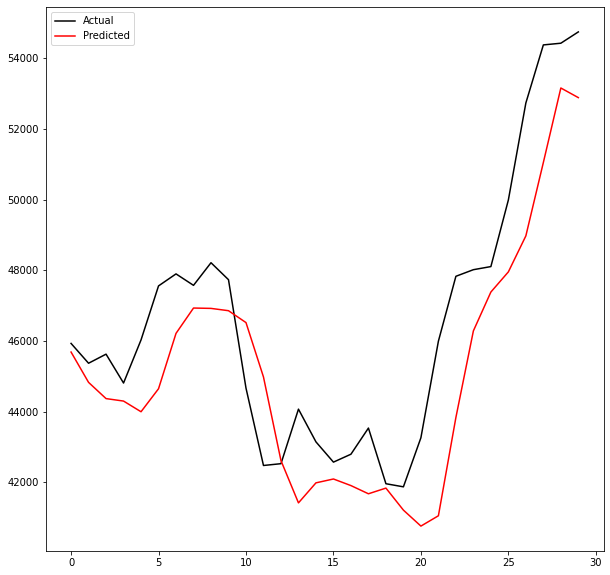

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-001relu64Int5.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00554: early stopping
Training R-Squared: 0.997409347576731

Testing R-Squared: 0.9969167768206456

30day Holdout R-Squared: 0.6761840794907319

30day Holdout MAE: 1650.08203125

30day Holdout MAPE: 3.451566561367299

30day Holdout RMSE: 2098.003549693414


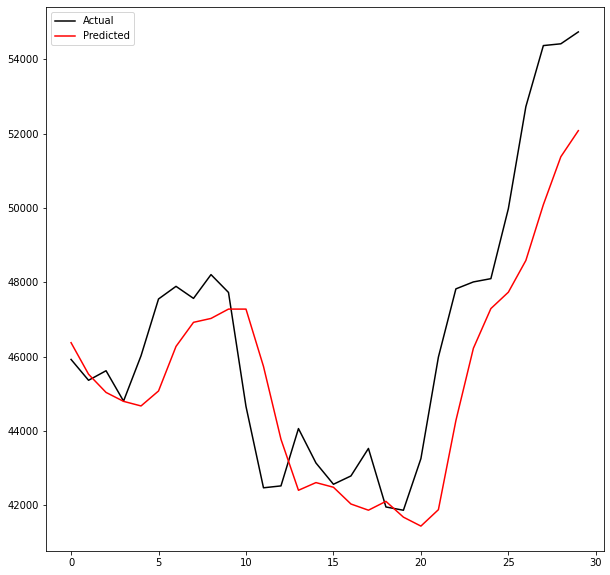

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-0001relu64Int5.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00195: early stopping
Training R-Squared: 0.9963736189542611

Testing R-Squared: 0.9958647715898085

30day Holdout R-Squared: 0.5619894121986067

30day Holdout MAE: 2048.565625

30day Holdout MAPE: 4.314977133928552

30day Holdout RMSE: 2440.053925334613


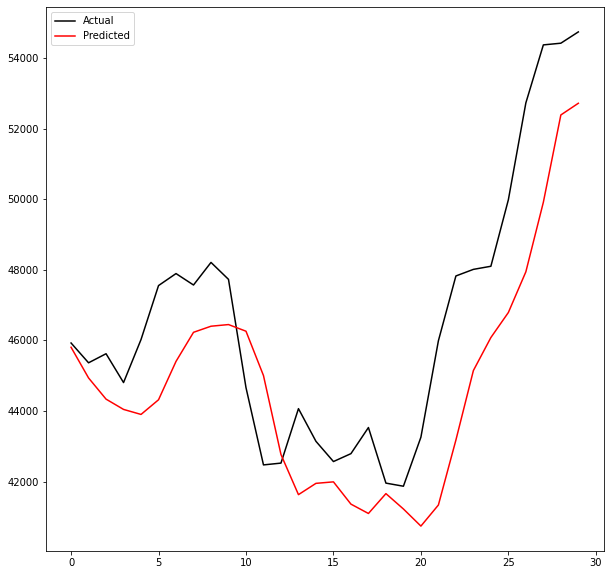

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400Adam0-01relu64Int5.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00101: early stopping
Training R-Squared: -0.5074790013052708

Testing R-Squared: -0.54685551936133

30day Holdout R-Squared: -159.24484000557823

30day Holdout MAE: 46525.36666666667

30day Holdout MAPE: 100.0

30day Holdout RMSE: 46671.21928733667


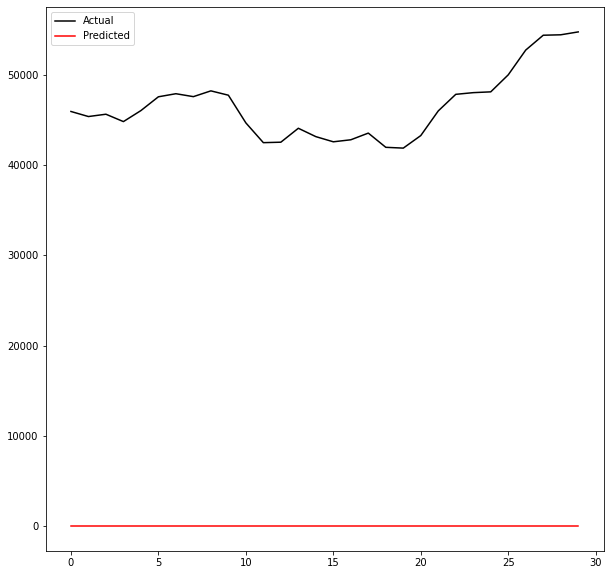

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400Adam0-001relu64Int5.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00490: early stopping
Training R-Squared: 0.99757721254388

Testing R-Squared: 0.9971830682790513

30day Holdout R-Squared: 0.6785844602202888

30day Holdout MAE: 1667.7434895833333

30day Holdout MAPE: 3.501999831030274

30day Holdout RMSE: 2090.2130513813167


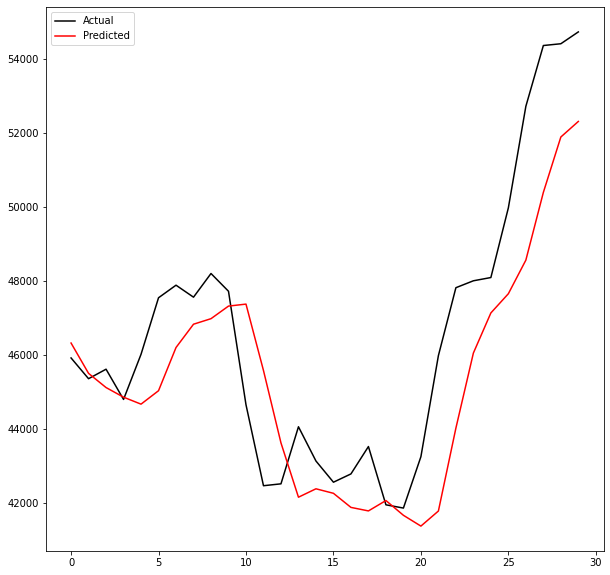

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400Adam0-0001relu64Int5.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00496: early stopping
Training R-Squared: 0.9968527167326859

Testing R-Squared: 0.995712828748967

30day Holdout R-Squared: 0.4975806224477909

30day Holdout MAE: 2279.66875

30day Holdout MAPE: 4.850833740368679

30day Holdout RMSE: 2613.30627117755


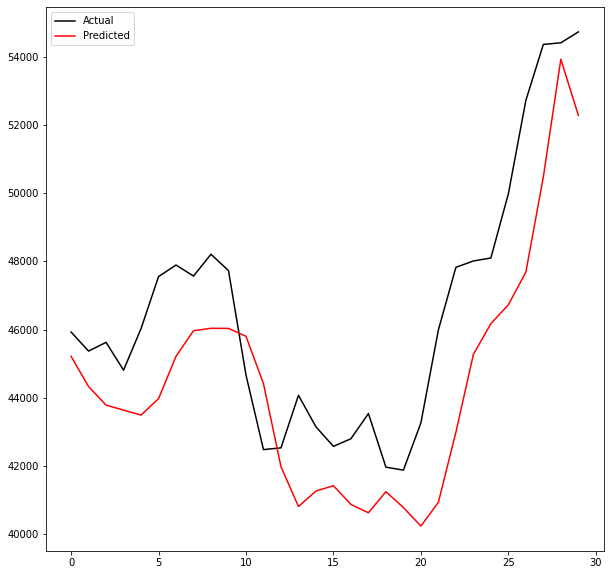

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500Adam0-01relu64Int5.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00343: early stopping
Training R-Squared: 0.9981126356118073

Testing R-Squared: 0.9975337967776987

30day Holdout R-Squared: 0.7530631602619374

30day Holdout MAE: 1386.2475260416666

30day Holdout MAPE: 2.9537687004755684

30day Holdout RMSE: 1832.1037472025462


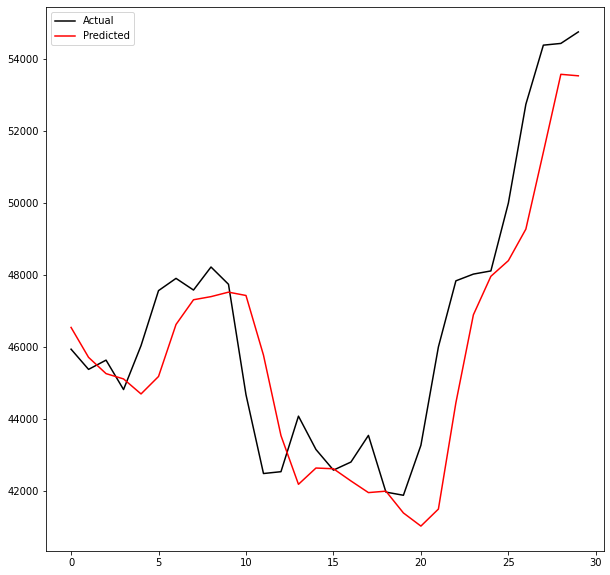

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500Adam0-001relu64Int5.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00638: early stopping
Training R-Squared: 0.997759579775654

Testing R-Squared: 0.9973139976856925

30day Holdout R-Squared: 0.6647473791996704

30day Holdout MAE: 1683.6287760416667

30day Holdout MAPE: 3.533820173142441

30day Holdout RMSE: 2134.731265558514


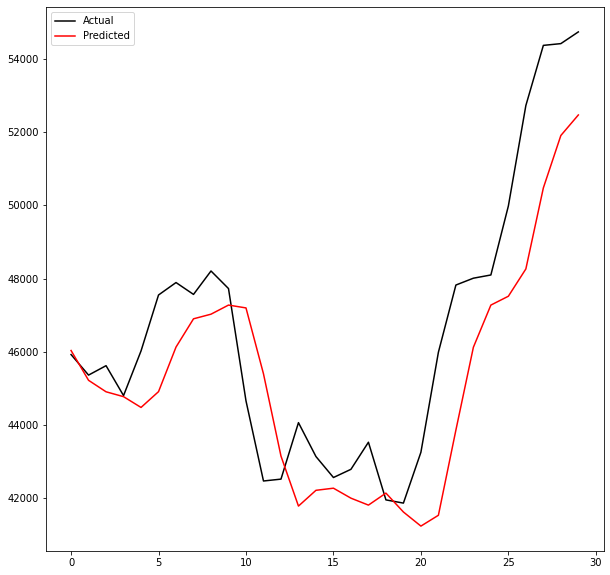

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500Adam0-0001relu64Int5.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00460: early stopping
Training R-Squared: 0.9977956066220023

Testing R-Squared: 0.9971368802339008

30day Holdout R-Squared: 0.598002131804259

30day Holdout MAE: 1882.4009114583334

30day Holdout MAPE: 3.948521443956612

30day Holdout RMSE: 2337.5935221098393


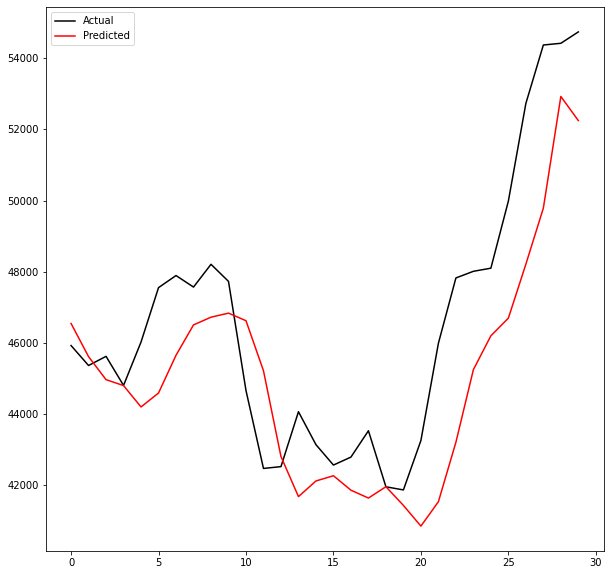

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600Adam0-01relu64Int5.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00188: early stopping
Training R-Squared: 0.9970345369381701

Testing R-Squared: 0.9964723188697749

30day Holdout R-Squared: 0.5098487991542217

30day Holdout MAE: 2190.00078125

30day Holdout MAPE: 4.603809525147073

30day Holdout RMSE: 2581.2029665364525


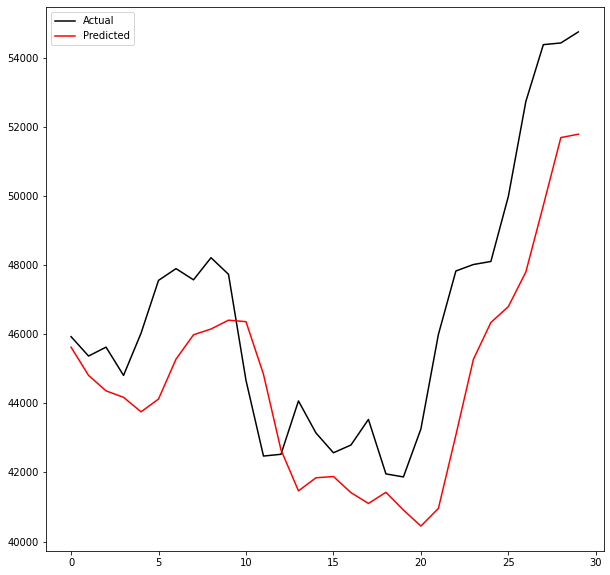

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600Adam0-001relu64Int5.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00433: early stopping
Training R-Squared: 0.9975656956876117

Testing R-Squared: 0.9971436753699903

30day Holdout R-Squared: 0.6181136255046165

30day Holdout MAE: 1847.8623697916667

30day Holdout MAPE: 3.868764800579092

30day Holdout RMSE: 2278.369728231265


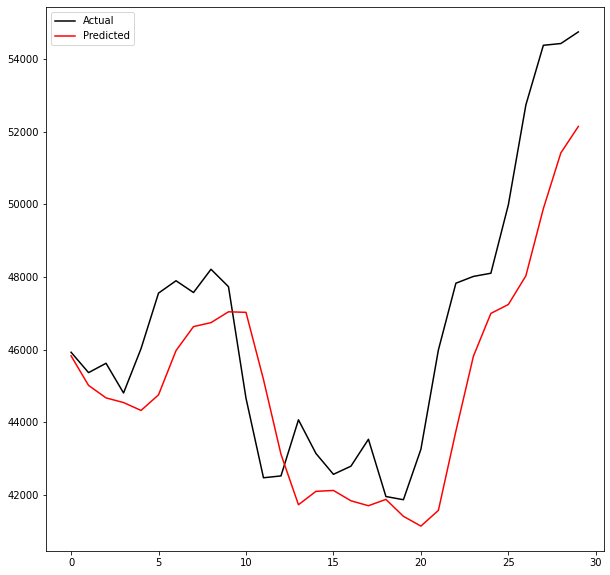

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600Adam0-0001relu64Int5.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00514: early stopping
Training R-Squared: 0.9932250260957565

Testing R-Squared: 0.9922232646311462

30day Holdout R-Squared: 0.09534893194261518

30day Holdout MAE: 3122.3828125

30day Holdout MAPE: 6.597050354108191

30day Holdout RMSE: 3506.6923846208506


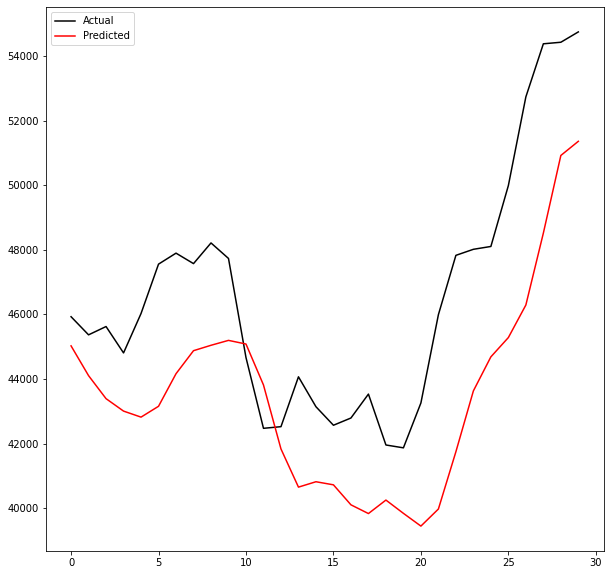

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200RMSprop0-01relu64Int5.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00475: early stopping
Training R-Squared: 0.994290207980773

Testing R-Squared: 0.9935375091168825

30day Holdout R-Squared: 0.03672924705931768

30day Holdout MAE: 3237.4705729166667

30day Holdout MAPE: 6.838170832553289

30day Holdout RMSE: 3618.522748502214


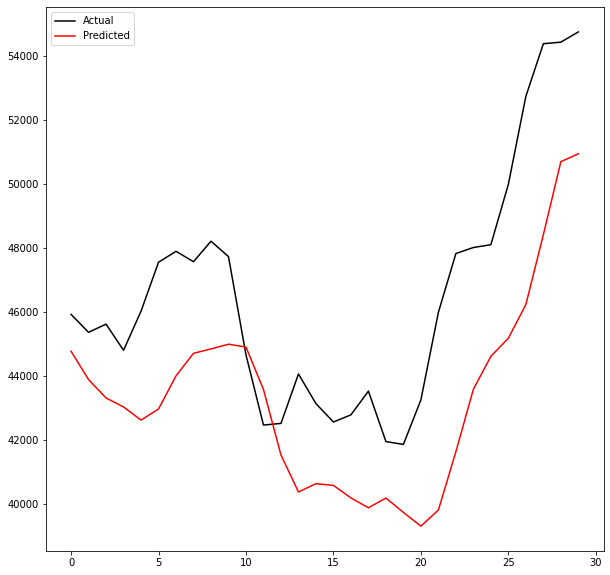

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200RMSprop0-001relu64Int5.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00694: early stopping
Training R-Squared: 0.9973062755240503

Testing R-Squared: 0.9970965847672629

30day Holdout R-Squared: 0.6555963606471908

30day Holdout MAE: 1718.0989583333333

30day Holdout MAPE: 3.5933793669942338

30day Holdout RMSE: 2163.6698137510307


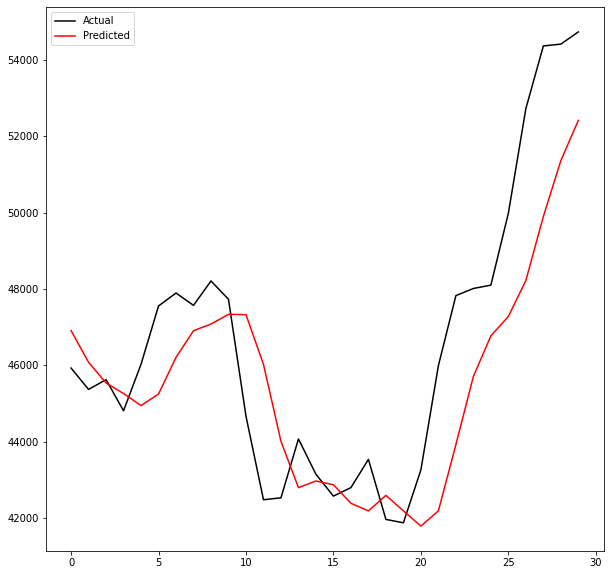

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200RMSprop0-0001relu64Int5.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00379: early stopping
Training R-Squared: 0.9788730345297542

Testing R-Squared: 0.976826733928635

30day Holdout R-Squared: -2.0431418591973265

30day Holdout MAE: 6105.13515625

30day Holdout MAPE: 12.95382748370089

30day Holdout RMSE: 6431.588041441036


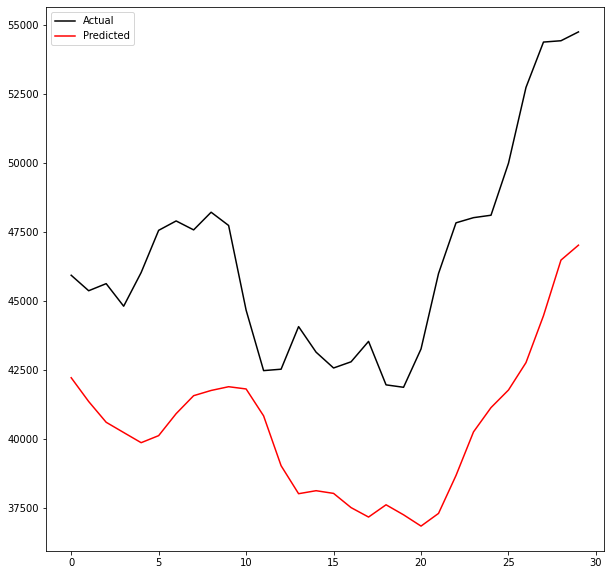

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-01relu64Int5.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00285: early stopping
Training R-Squared: 0.979438881993306

Testing R-Squared: 0.9797474324723078

30day Holdout R-Squared: -0.5704000899372399

30day Holdout MAE: 4243.505729166666

30day Holdout MAPE: 9.27531775833979

30day Holdout RMSE: 4620.215957970902


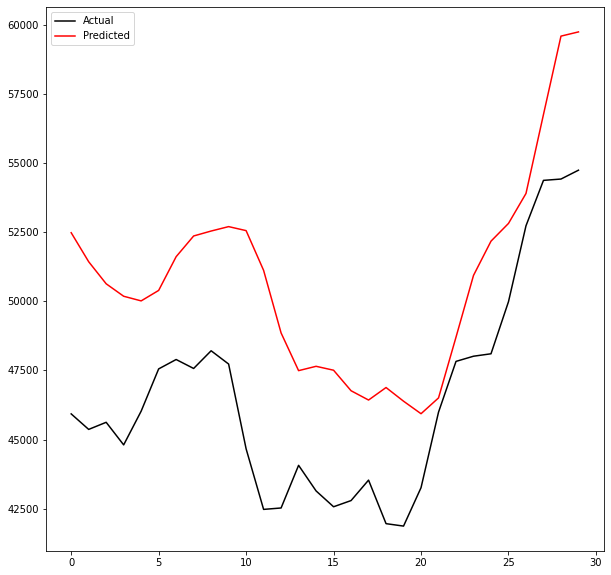

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-001relu64Int5.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00712: early stopping
Training R-Squared: 0.9975199290206384

Testing R-Squared: 0.9971532546572188

30day Holdout R-Squared: 0.6930022054569447

30day Holdout MAE: 1609.02578125

30day Holdout MAPE: 3.37719795986269

30day Holdout RMSE: 2042.7948196177133


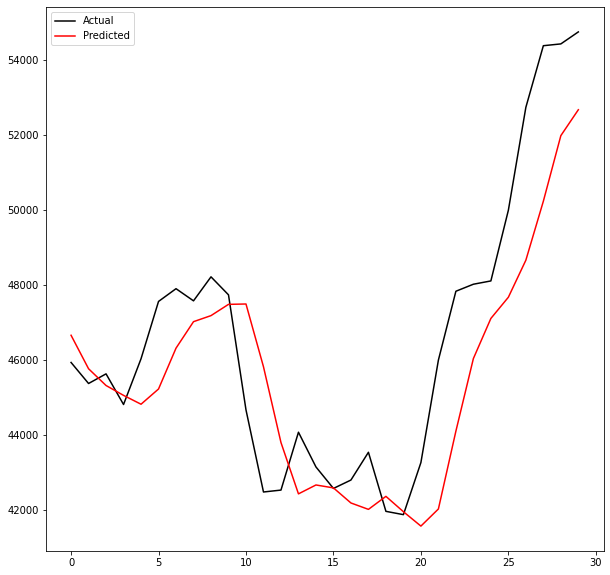

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int5.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00300: early stopping
Training R-Squared: 0.9868234072890686

Testing R-Squared: 0.9872351174401454

30day Holdout R-Squared: 0.014354005036604556

30day Holdout MAE: 3165.745572916667

30day Holdout MAPE: 7.009018337992319

30day Holdout RMSE: 3660.307745555316


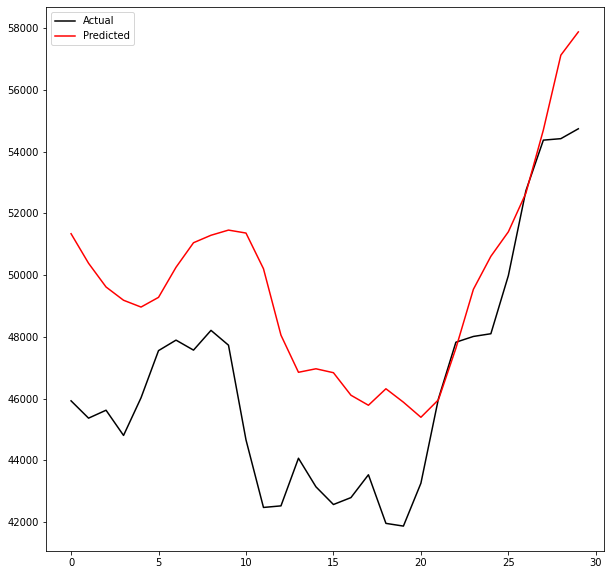

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400RMSprop0-01relu64Int5.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00528: early stopping
Training R-Squared: 0.9973564911852104

Testing R-Squared: 0.9966104933017224

30day Holdout R-Squared: 0.7162601340851251

30day Holdout MAE: 1527.90859375

30day Holdout MAPE: 3.2550687721919367

30day Holdout RMSE: 1963.8906372382717


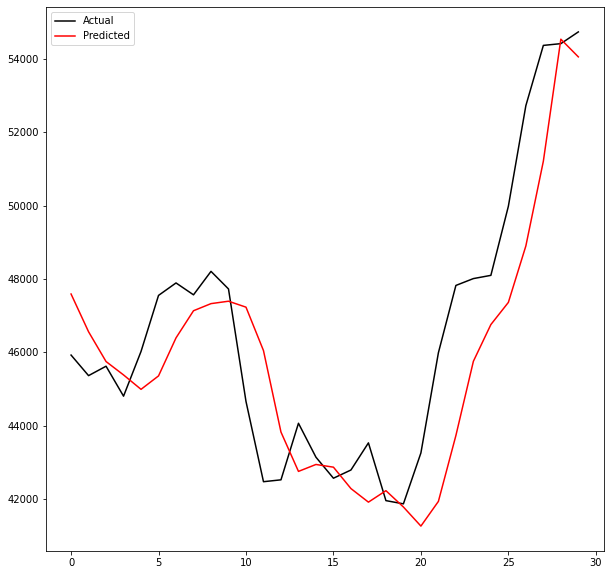

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400RMSprop0-001relu64Int5.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00497: early stopping
Training R-Squared: 0.997373945365223

Testing R-Squared: 0.9970981011025415

30day Holdout R-Squared: 0.7428294259311963

30day Holdout MAE: 1468.1040364583334

30day Holdout MAPE: 3.1233759462540527

30day Holdout RMSE: 1869.6820441944556


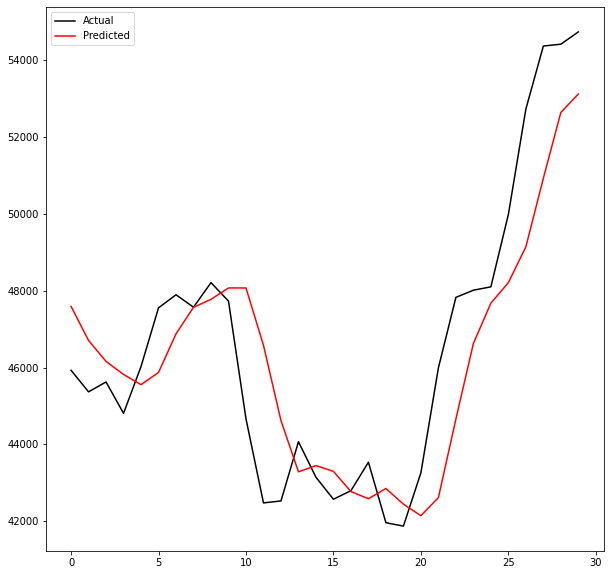

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400RMSprop0-0001relu64Int5.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00331: early stopping
Training R-Squared: 0.9961515722907608

Testing R-Squared: 0.9957459923395591

30day Holdout R-Squared: 0.5836690730222512

30day Holdout MAE: 1902.5291666666667

30day Holdout MAPE: 3.973328708967981

30day Holdout RMSE: 2378.901481691436


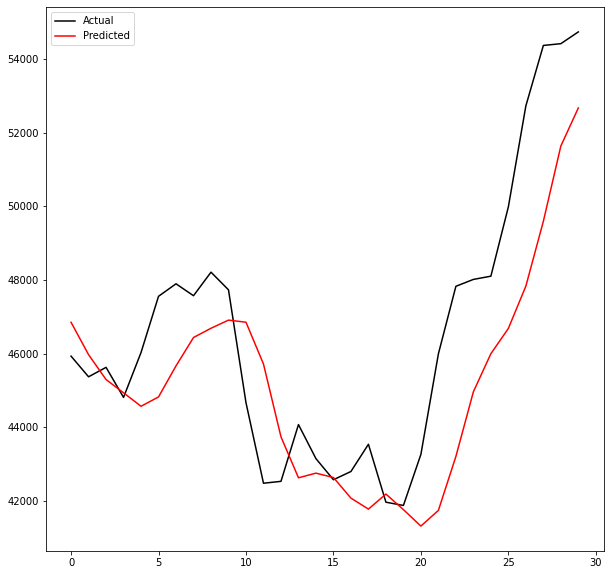

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500RMSprop0-01relu64Int5.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00204: early stopping
Training R-Squared: 0.9945329527240222

Testing R-Squared: 0.9935822050979468

30day Holdout R-Squared: 0.10248522269131122

30day Holdout MAE: 3029.0162760416665

30day Holdout MAPE: 6.35491035227396

30day Holdout RMSE: 3492.833823804358


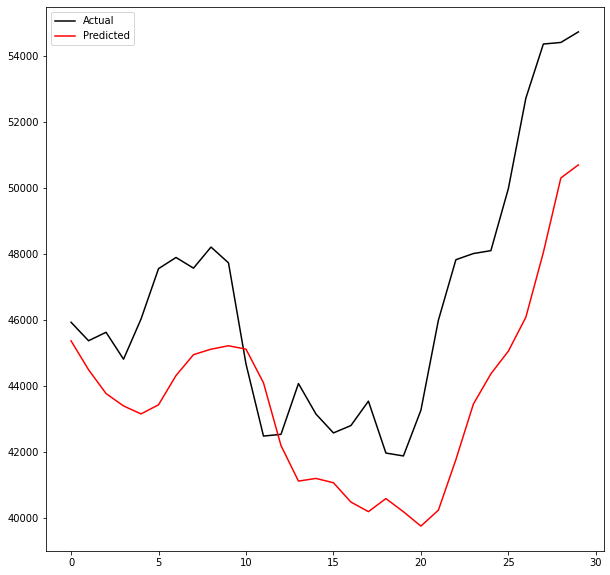

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500RMSprop0-001relu64Int5.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00101: early stopping
Training R-Squared: -0.5074790013052708

Testing R-Squared: -0.54685551936133

30day Holdout R-Squared: -159.24484000557823

30day Holdout MAE: 46525.36666666667

30day Holdout MAPE: 100.0

30day Holdout RMSE: 46671.21928733667


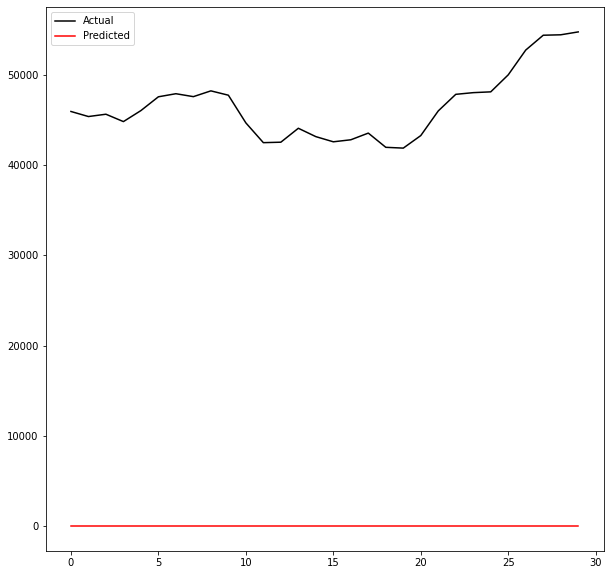

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500RMSprop0-0001relu64Int5.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00613: early stopping
Training R-Squared: 0.9960216241463663

Testing R-Squared: 0.9953409608478201

30day Holdout R-Squared: 0.40957980153996343

30day Holdout MAE: 2420.9397135416666

30day Holdout MAPE: 5.096881867453225

30day Holdout RMSE: 2832.942262004393


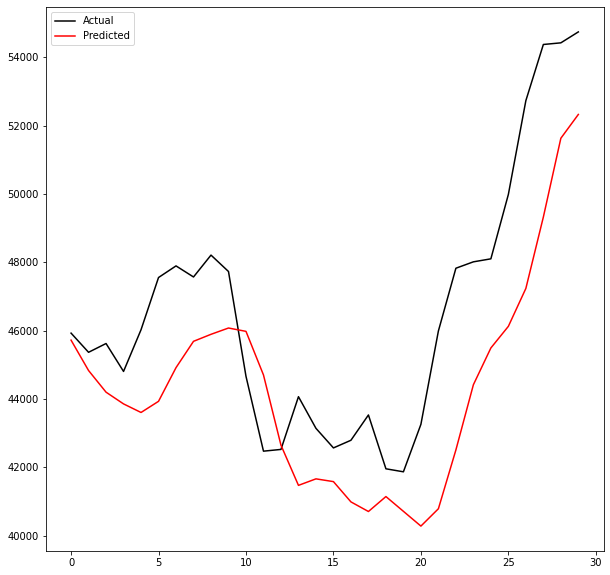

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600RMSprop0-01relu64Int5.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00350: early stopping
Training R-Squared: 0.990031410328559

Testing R-Squared: 0.988698841403017

30day Holdout R-Squared: -0.5780796567488222

30day Holdout MAE: 4189.65859375

30day Holdout MAPE: 8.833600599730701

30day Holdout RMSE: 4631.499065221636


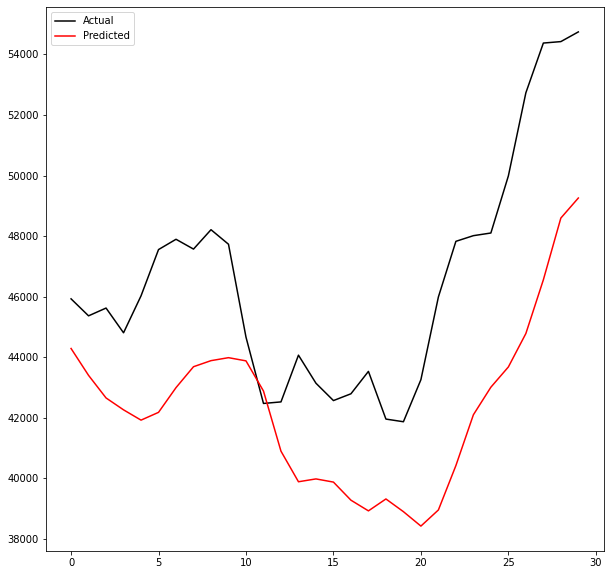

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600RMSprop0-001relu64Int5.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00525: early stopping
Training R-Squared: 0.9976552055084046

Testing R-Squared: 0.9972960945082541

30day Holdout R-Squared: 0.7301702382070736

30day Holdout MAE: 1500.594140625

30day Holdout MAPE: 3.1675777840025634

30day Holdout RMSE: 1915.1466937256957


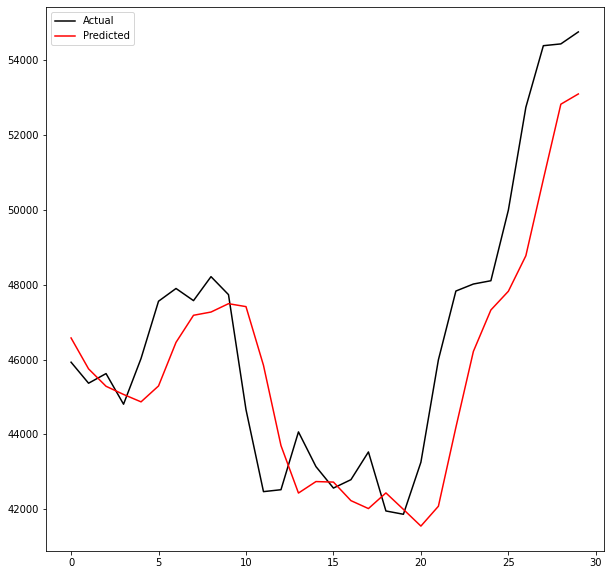

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600RMSprop0-0001relu64Int5.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001


In [53]:
opt_list = ['Adam', 'RMSprop']
activation_list = ['relu']
neuron_list = [200, 300, 400, 500, 600]
lr_list = [0.01, 0.001, 0.0001]

for op in opt_list:
    for neuron in neuron_list:
        for l in lr_list:
            for act in activation_list:
                interval5_ann_model_nextday(X, y, lr=l, activation=act,
                                            neurons=neuron, opt=op, batch_size=64, epochs=5000)


## Interval 6 - (April 1, 2014 - September 1, 2021)

In [117]:
# create a 3 hidden layer model function for testing hyperparameters

def interval6_ann_model_nextday(X, y, lr=0.01, neurons=300, activation='relu', opt='Adam', batch_size=64, epochs=5000):
    ''' 
        X is a dataframe of the dates and features using non-standardized values
        The Date column must be the first column in the X dataframe
        y is a dataframe or 1D array of the target values
    '''
    # assign the string values to variables for file naming later in the Checkpoint
    opt_name = opt
    acti = activation
    # remove the . in the learning rate
    learn_rt = re.sub('\.', '-', str(lr))
    
    # create a holdout series of the last 30 days of data
    X_holdout = X.iloc[-30:, 1:] # exclude the first column which is the date column
    y_holdout = y[-30:]
    
    # extract the data from the dates of Interval 1
    date_bool = (X.iloc[:, 0] >= '2014/04/01') & (X.iloc[:, 0] <= '2021/09/01')
    X = X[date_bool]
    # remove the date column
    X = X.iloc[:, 1:]
    # adjust the range of y df
    y = y[X.index]
    
    # create train test split of data
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=15)
    
    # scale the data
    estimators = [] # create a list for the scalers
    estimators.append(['minmax', MinMaxScaler()])
    estimators.append(['robust', RobustScaler()])
    # add the scalers to the Pipeline
    scale = Pipeline(estimators, verbose=True)
    # fit the scaler to the training data
    scale.fit(X_train)
    # transform the training, testing, and holdout data
    X_train = scale.transform(X_train)
    X_test = scale.transform(X_test)
    X_holdout = scale.transform(X_holdout)
    
#     # select an optimizer
#     if opt == 'Adam':
#         opt = tf.keras.optimizers.Adam(learning_rate=lr)
#     elif opt == 'RMSProp':
#         opt = tf.keras.optimizers.RMSprop(learning_rate=lr)
#     elif opt == 'Adagrad':
#         opt = tf.keras.optimizers.Adagrad(learning_rate=lr)
        
    # define the shape of the input number of features
    shape = X_train.shape[1]
    
    # create call backs to save the model after each epoch if it is the best seen so far
    # and for early stopping when model has not improved after 100 epochs
    mcp_save = ModelCheckpoint('trained_models/ANN4_reg_nextday' + str(neurons)+ opt_name + str(learn_rt)+ acti +str(batch_size)+'Int6.hdf5', save_best_only=True, monitor='val_loss', mode='auto')
    earlyStopping = EarlyStopping(monitor='val_loss', patience=100, verbose=1, mode='auto')
        
    # create a special definition for the ANN model to adjust hyperparameters
    def seq_model(initializer='normal', activation=activation, neurons=neurons, NUM_FEATURES=shape, opt=opt, lr=lr):
        # create model
        model = Sequential()
        model.add(Dense(neurons, input_shape=(NUM_FEATURES,), kernel_initializer=initializer, activation=activation))
        model.add(Dense(neurons, activation=activation))
        model.add(Dense(neurons, activation=activation))
        model.add(Dense(neurons, activation=activation))
        model.add(Dense(neurons, activation=activation))
        model.add(Dense(1, activation=activation, kernel_initializer=initializer))
        # Compile model
        # select an optimizer
        if opt == 'Adam':
            opt = tf.keras.optimizers.Adam(learning_rate=lr)
        elif opt == 'RMSprop':
            opt = tf.keras.optimizers.RMSprop(learning_rate=lr)
        elif opt == 'Adagrad':
            opt = tf.keras.optimizers.Adagrad(learning_rate=lr)
        
        model.compile(loss='logcosh', optimizer=opt, metrics=['mae'])
        return model
        
    # define the 4 Dense layer model
    ann_model = seq_model(activation=activation, neurons=neurons, NUM_FEATURES=shape)
    

    # create the regressor
    regressor=KerasRegressor(build_fn=seq_model, batch_size=batch_size, epochs=epochs, verbose=0, shuffle=True,
                         validation_split=0.1, validation_freq=1,
                        use_multiprocessing=True, callbacks=[mcp_save,earlyStopping])
    
    # fit the model on training data
    regressor.fit(X_train, y_train)
    
    # use training data for predictions
    y_train_pred = regressor.predict(X_train)
    # calculate R-squared score for train data
    r2 = r2_score(y_train, y_train_pred)
    print('Training R-Squared:', r2)
    
    # use testing data for predictions
    y_test_pred = regressor.predict(X_test)
    # calculate R-squared score for test data
    r2 = r2_score(y_test, y_test_pred)
    print('\nTesting R-Squared:', r2)
    
    # use holdout data for predictions
    y_holdout_pred = regressor.predict(X_holdout)
    # calculate R-squared score for holdout data
    r2 = r2_score(y_holdout, y_holdout_pred)
    print('\n30day Holdout R-Squared:', r2)
    # calculate mean absolute error for holdout data
    mae = mean_absolute_error(y_holdout, y_holdout_pred)
    print('\n30day Holdout MAE:', mae)
    # calculate mean absolute percentage error for holdout data
    mape = mean_absolute_percentage_error(y_holdout, y_holdout_pred)
    print('\n30day Holdout MAPE:', mape)
    # calculate root mean squared error 
    rmse = np.sqrt(mean_squared_error(y_holdout, y_holdout_pred))
    print('\n30day Holdout RMSE:', rmse)
    
    # create a df of the holdout predicted and actual
    holdout_df = pd.DataFrame(zip(y_holdout, y_holdout_pred), columns=['actual', 'predicted'])
    
    plt.plot(holdout_df.index, holdout_df['actual'], color='black', label='Actual')
    plt.plot(holdout_df.index, holdout_df['predicted'], color='red', label='Predicted')
    plt.legend()
    plt.show()
    
    print('---------Model Summary For Above Results----------')
    print('trained_models/ANN4_reg_nextday' + str(neurons)+ opt_name + str(learn_rt)+ acti +str(batch_size)+'Int6.hdf5')
    print('Number of Neurons:', neurons)
    print('Activation:', activation)
    print('Optimizer:', opt_name)
    print('Learning Rate:', lr)

[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00458: early stopping
Training R-Squared: 0.9979276526784256

Testing R-Squared: 0.9961391975107736

30day Holdout R-Squared: 0.7628924249171296

30day Holdout MAE: 1428.8639322916667

30day Holdout MAPE: 3.035542008363091

30day Holdout RMSE: 1795.2702518876438


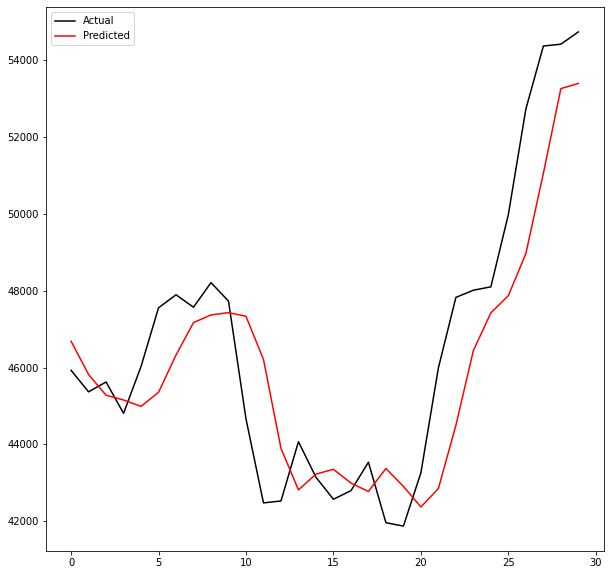

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200Adam0-01relu64Int6.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00675: early stopping
Training R-Squared: 0.9983271095833822

Testing R-Squared: 0.9968029041595065

30day Holdout R-Squared: 0.7915453402792698

30day Holdout MAE: 1260.6048177083333

30day Holdout MAPE: 2.6788964239953406

30day Holdout RMSE: 1683.3054281473214


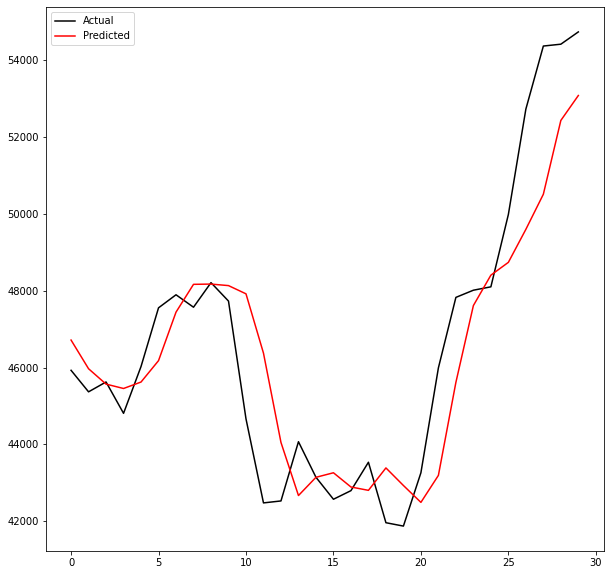

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200Adam0-001relu64Int6.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 01675: early stopping
Training R-Squared: 0.9980605926342788

Testing R-Squared: 0.9965967647503363

30day Holdout R-Squared: 0.692046467224908

30day Holdout MAE: 1598.604296875

30day Holdout MAPE: 3.3547226912164727

30day Holdout RMSE: 2045.9721387730576


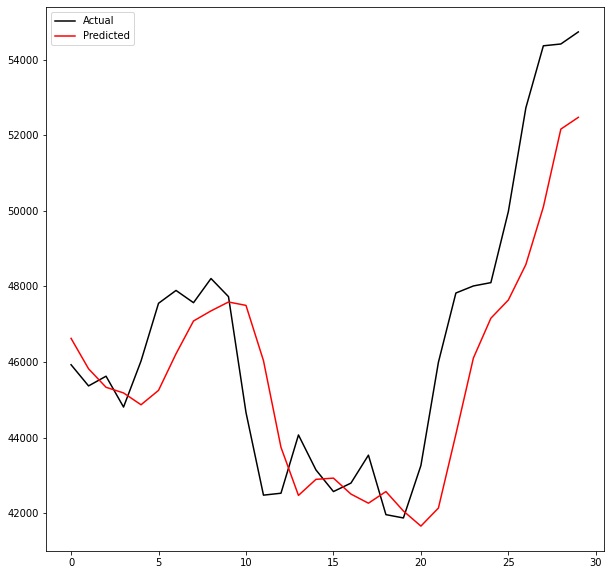

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200Adam0-0001relu64Int6.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00433: early stopping
Training R-Squared: 0.9970613420324063

Testing R-Squared: 0.9957212726894188

30day Holdout R-Squared: 0.7732064718643179

30day Holdout MAE: 1373.1690104166667

30day Holdout MAPE: 2.97015542789429

30day Holdout RMSE: 1755.7895046828464


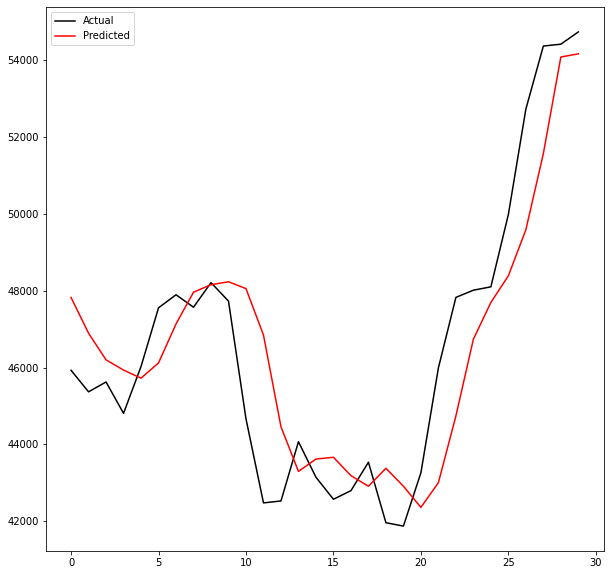

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int6.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00751: early stopping
Training R-Squared: 0.9985488247970201

Testing R-Squared: 0.9965706267361654

30day Holdout R-Squared: 0.7772529688680967

30day Holdout MAE: 1346.5768229166667

30day Holdout MAPE: 2.909726772433031

30day Holdout RMSE: 1740.0554265176486


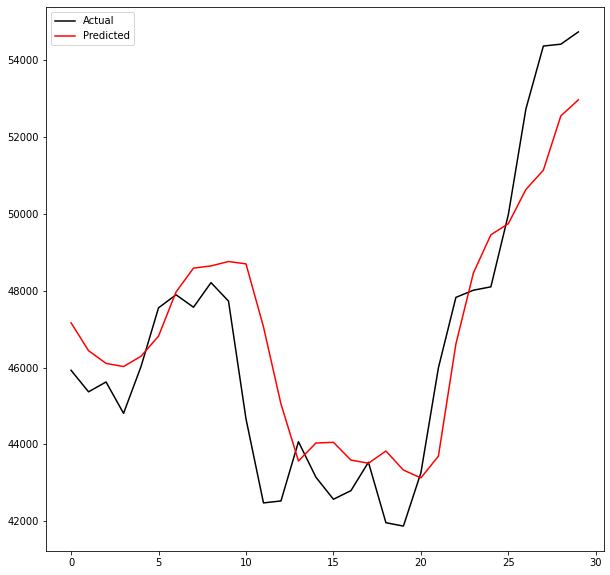

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-001relu64Int6.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 01207: early stopping
Training R-Squared: 0.9980882136498331

Testing R-Squared: 0.9966739666038299

30day Holdout R-Squared: 0.7226227535806622

30day Holdout MAE: 1498.9940104166667

30day Holdout MAPE: 3.1537748686259874

30day Holdout RMSE: 1941.7465237915728


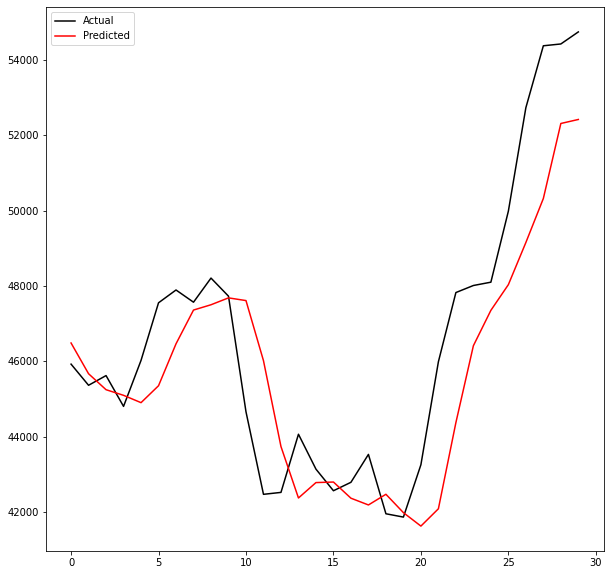

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-0001relu64Int6.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00475: early stopping
Training R-Squared: 0.9974752384955122

Testing R-Squared: 0.9959893107007961

30day Holdout R-Squared: 0.7644123022784667

30day Holdout MAE: 1397.6162760416667

30day Holdout MAPE: 3.038076416829387

30day Holdout RMSE: 1789.5070929062072


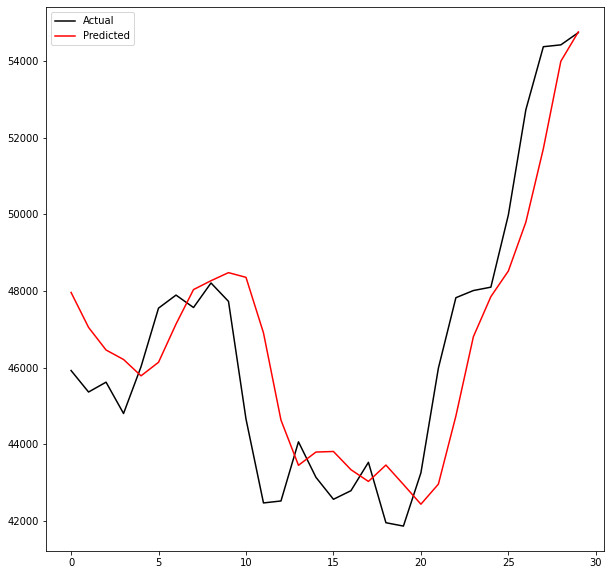

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400Adam0-01relu64Int6.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00546: early stopping
Training R-Squared: 0.9981896592613848

Testing R-Squared: 0.9960903813848404

30day Holdout R-Squared: 0.66922365392251

30day Holdout MAE: 1657.5489583333333

30day Holdout MAPE: 3.444651827713572

30day Holdout RMSE: 2120.4319665343965


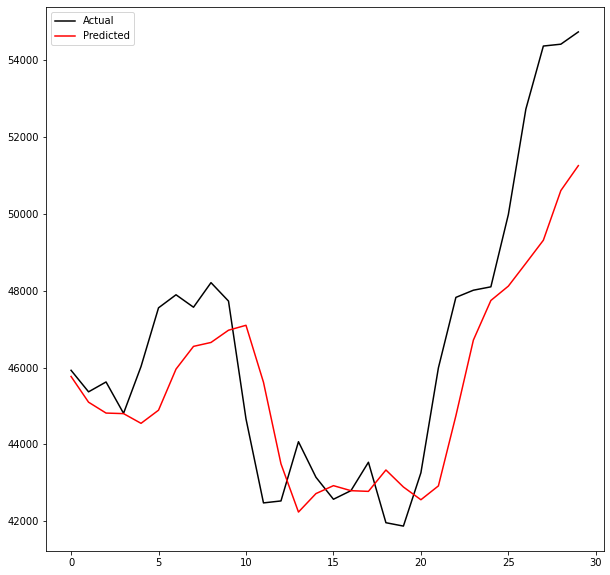

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400Adam0-001relu64Int6.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 01176: early stopping
Training R-Squared: 0.9983033377849747

Testing R-Squared: 0.9967529110188107

30day Holdout R-Squared: 0.7623370485174816

30day Holdout MAE: 1362.3083333333334

30day Holdout MAPE: 2.8983866790443336

30day Holdout RMSE: 1797.3715503468775


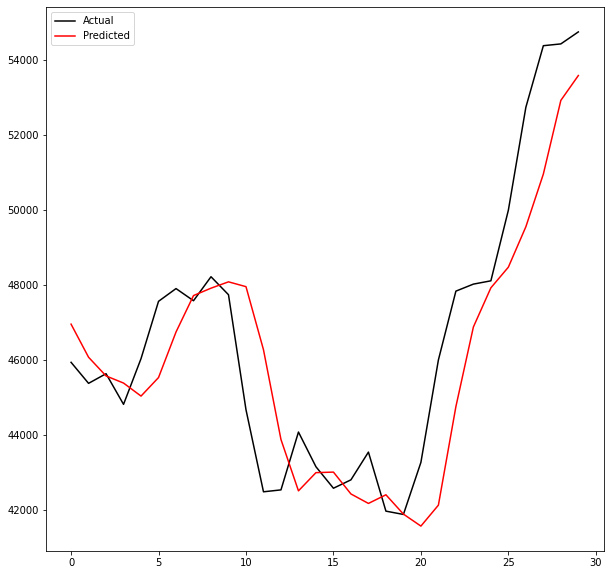

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400Adam0-0001relu64Int6.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00579: early stopping
Training R-Squared: 0.9950885462633622

Testing R-Squared: 0.9936533898260065

30day Holdout R-Squared: 0.6309635986297203

30day Holdout MAE: 1834.1684895833334

30day Holdout MAPE: 4.038285568545352

30day Holdout RMSE: 2239.7096612930536


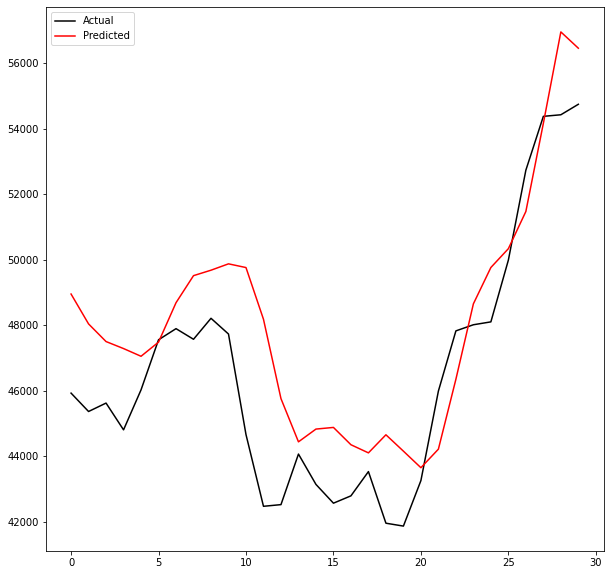

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500Adam0-01relu64Int6.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00451: early stopping
Training R-Squared: 0.9982914073159287

Testing R-Squared: 0.9961602046775285

30day Holdout R-Squared: 0.7942458347429235

30day Holdout MAE: 1285.7576822916667

30day Holdout MAPE: 2.74253171045916

30day Holdout RMSE: 1672.3664174442915


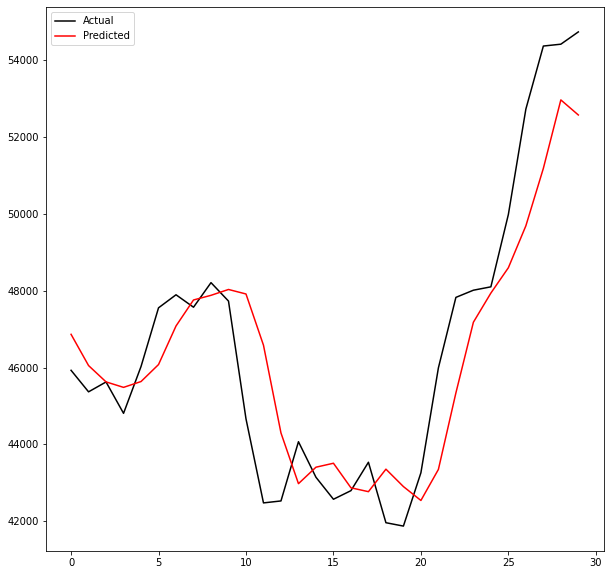

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500Adam0-001relu64Int6.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 01078: early stopping
Training R-Squared: 0.9983147713748749

Testing R-Squared: 0.9966977803143972

30day Holdout R-Squared: 0.7771455443891289

30day Holdout MAE: 1315.6014322916667

30day Holdout MAPE: 2.7825249593042773

30day Holdout RMSE: 1740.474965253968


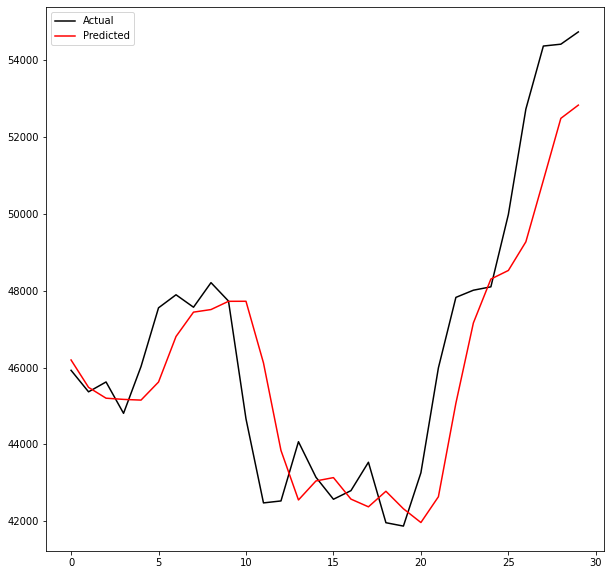

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500Adam0-0001relu64Int6.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00391: early stopping
Training R-Squared: 0.9980613961349863

Testing R-Squared: 0.9963241437022111

30day Holdout R-Squared: 0.7801999426805623

30day Holdout MAE: 1307.8268229166667

30day Holdout MAPE: 2.795882518846063

30day Holdout RMSE: 1728.5065147800176


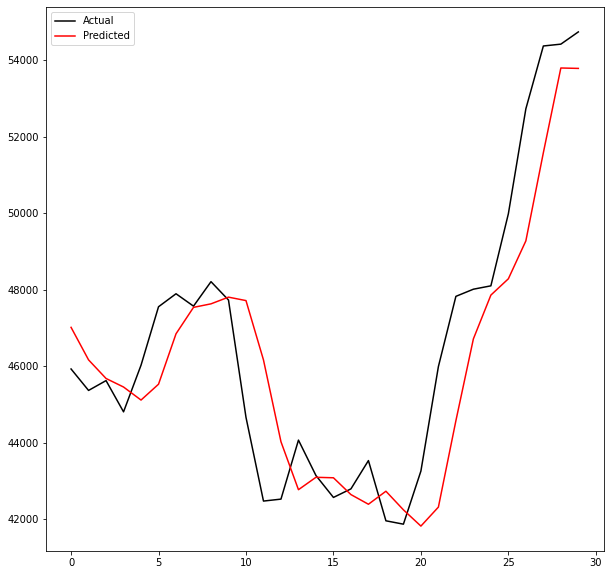

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600Adam0-01relu64Int6.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00555: early stopping
Training R-Squared: 0.9984560970071966

Testing R-Squared: 0.9966233035028781

30day Holdout R-Squared: 0.7579766072825956

30day Holdout MAE: 1428.466796875

30day Holdout MAPE: 3.042879995893876

30day Holdout RMSE: 1813.7849433575159


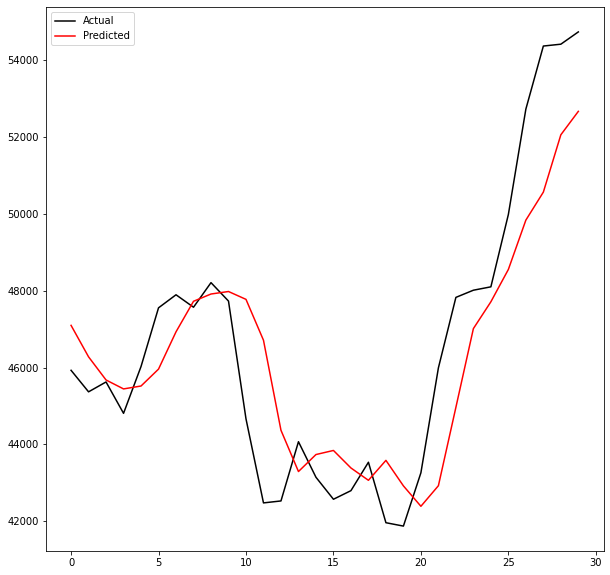

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600Adam0-001relu64Int6.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00875: early stopping
Training R-Squared: 0.998343522299897

Testing R-Squared: 0.9967736044372909

30day Holdout R-Squared: 0.7510931238444738

30day Holdout MAE: 1421.6485677083333

30day Holdout MAPE: 3.0091470271408842

30day Holdout RMSE: 1839.3973956553757


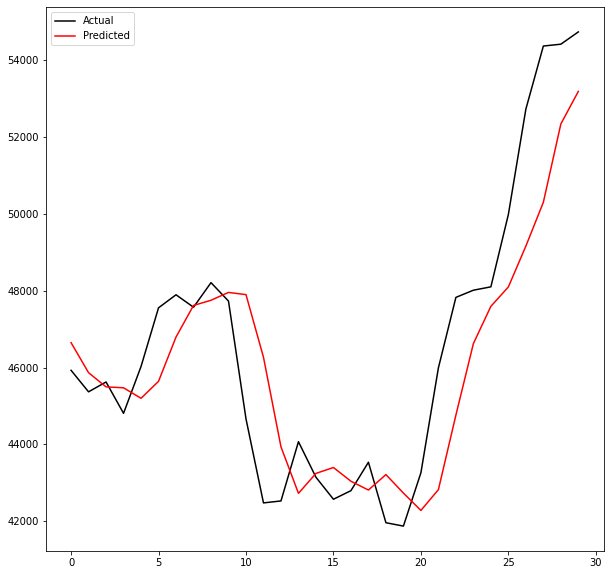

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600Adam0-0001relu64Int6.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00611: early stopping
Training R-Squared: 0.9975713138938459

Testing R-Squared: 0.9956363801460625

30day Holdout R-Squared: 0.6651344126001452

30day Holdout MAE: 1701.855859375

30day Holdout MAPE: 3.5755622791249873

30day Holdout RMSE: 2133.4986862390747


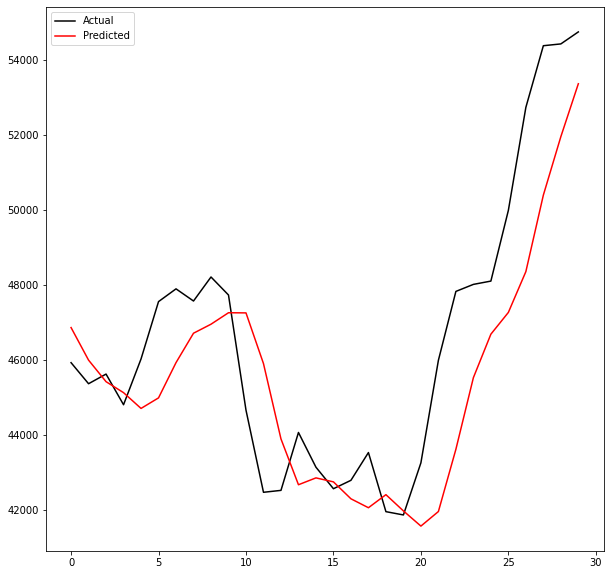

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200RMSprop0-01relu64Int6.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00396: early stopping
Training R-Squared: 0.9841478723807175

Testing R-Squared: 0.9811850518629779

30day Holdout R-Squared: -1.3530692960092683

30day Holdout MAE: 5242.489192708334

30day Holdout MAPE: 11.05933730316666

30day Holdout RMSE: 5655.545211525074


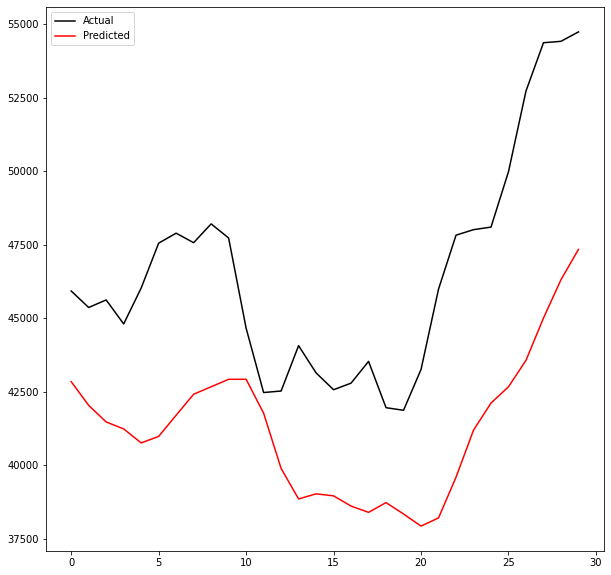

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200RMSprop0-001relu64Int6.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 01569: early stopping
Training R-Squared: 0.9977095091039506

Testing R-Squared: 0.9959026319748299

30day Holdout R-Squared: 0.6469801765858955

30day Holdout MAE: 1769.8264322916666

30day Holdout MAPE: 3.71393701117321

30day Holdout RMSE: 2190.5676347713234


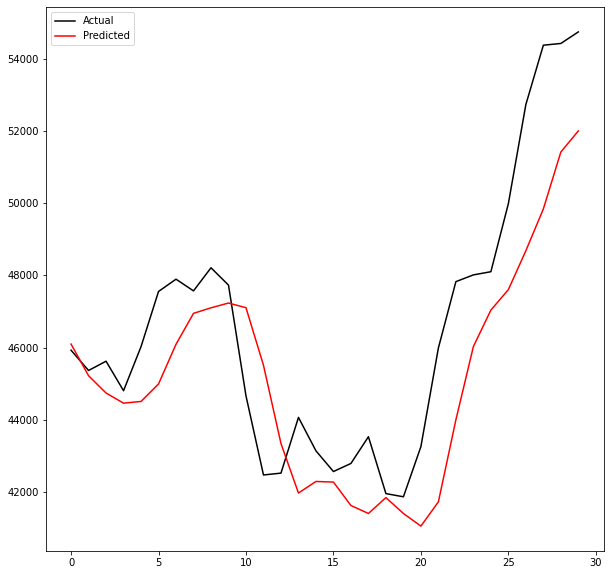

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200RMSprop0-0001relu64Int6.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00507: early stopping
Training R-Squared: 0.9955586567999217

Testing R-Squared: 0.9932326146908037

30day Holdout R-Squared: 0.31937310234563465

30day Holdout MAE: 2614.9733072916665

30day Holdout MAPE: 5.496728326906302

30day Holdout RMSE: 3041.667056390802


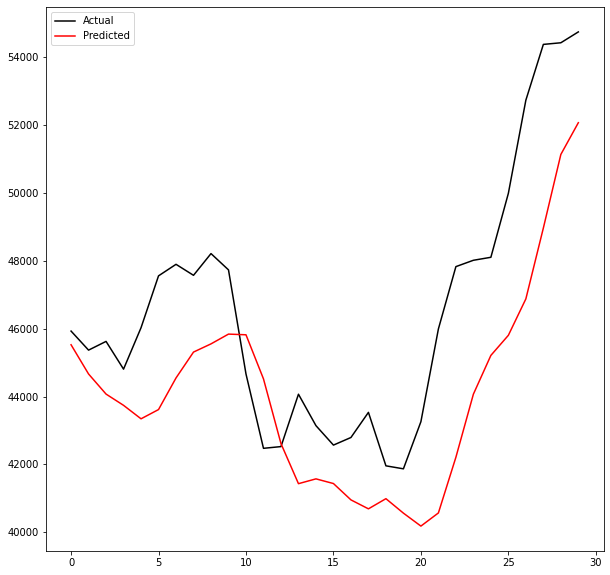

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-01relu64Int6.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00554: early stopping
Training R-Squared: 0.9928601550884344

Testing R-Squared: 0.9921226334993304

30day Holdout R-Squared: 0.5034374860557664

30day Holdout MAE: 2182.914453125

30day Holdout MAPE: 4.835128111387377

30day Holdout RMSE: 2598.029545123671


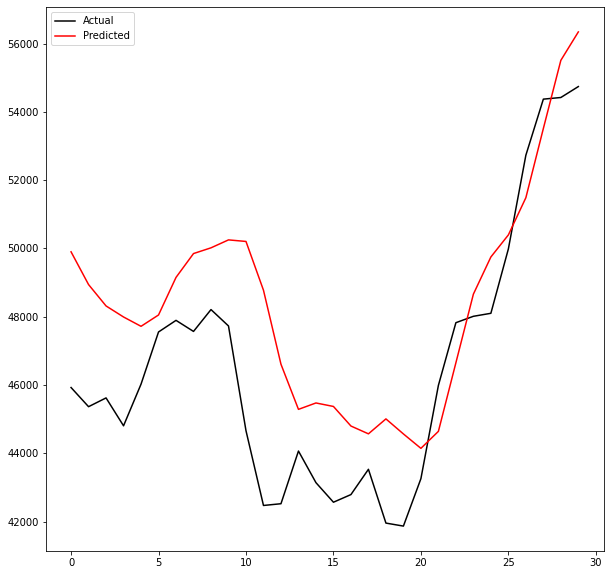

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-001relu64Int6.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00949: early stopping
Training R-Squared: 0.9978984717667868

Testing R-Squared: 0.9961454612620251

30day Holdout R-Squared: 0.6431596742713352

30day Holdout MAE: 1737.3705729166666

30day Holdout MAPE: 3.630158930484985

30day Holdout RMSE: 2202.38927569907


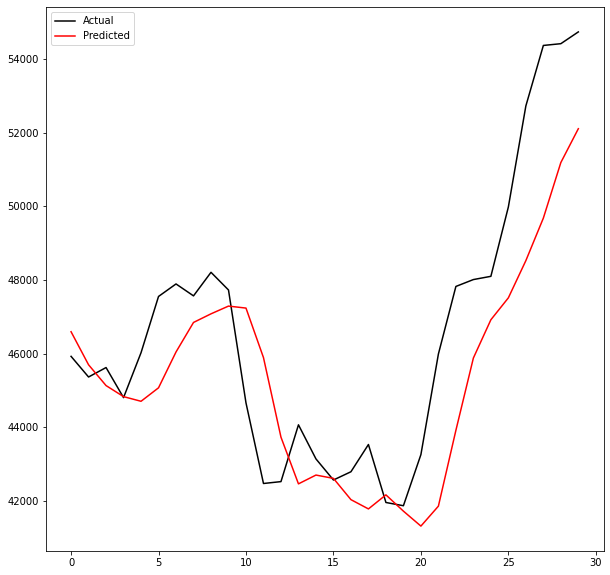

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int6.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00536: early stopping
Training R-Squared: 0.9939986362218038

Testing R-Squared: 0.9914492490341098

30day Holdout R-Squared: 0.031708024910584776

30day Holdout MAE: 3212.911588541667

30day Holdout MAPE: 6.752521787674098

30day Holdout RMSE: 3627.941590609609


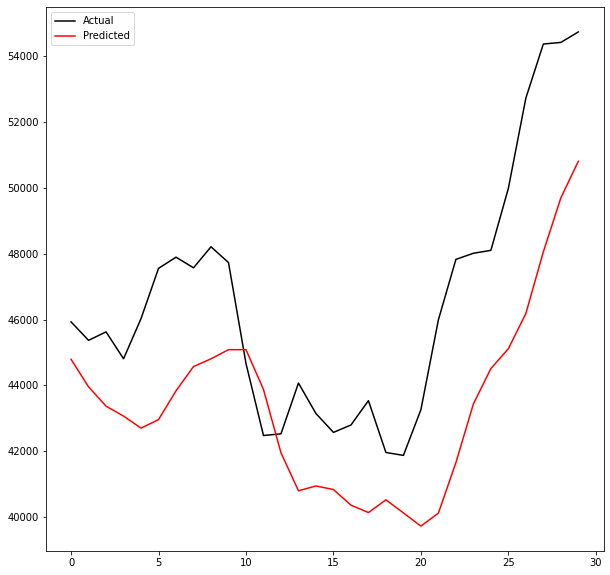

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400RMSprop0-01relu64Int6.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00780: early stopping
Training R-Squared: 0.9982665995910451

Testing R-Squared: 0.99616919317109

30day Holdout R-Squared: 0.6181671999175744

30day Holdout MAE: 1806.3444010416667

30day Holdout MAPE: 3.7880149666284564

30day Holdout RMSE: 2278.2099076535487


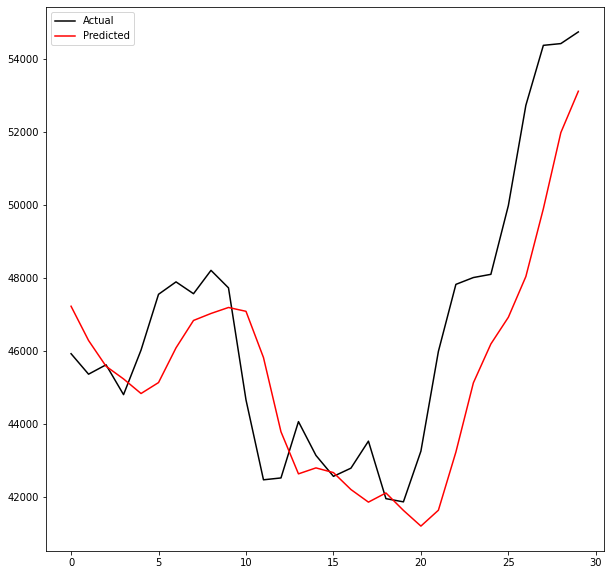

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400RMSprop0-001relu64Int6.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00674: early stopping
Training R-Squared: 0.9974339908221479

Testing R-Squared: 0.9954197353993077

30day Holdout R-Squared: 0.5144500510855993

30day Holdout MAE: 2125.1734375

30day Holdout MAPE: 4.432276973594966

30day Holdout RMSE: 2569.058989595348


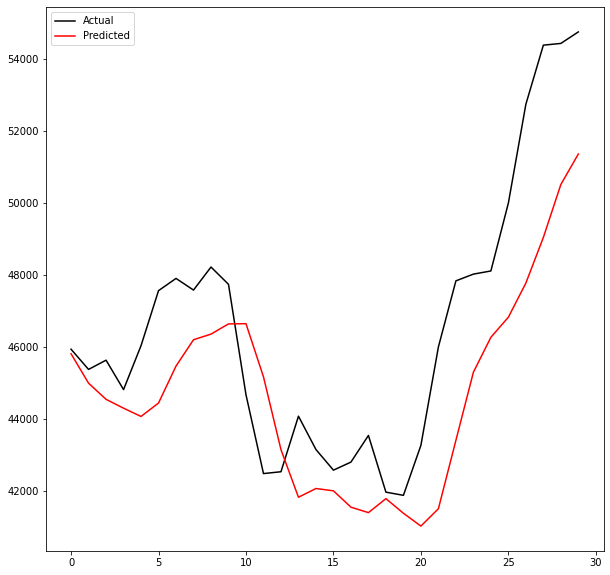

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400RMSprop0-0001relu64Int6.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00217: early stopping
Training R-Squared: 0.9893012575082362

Testing R-Squared: 0.9863272663031668

30day Holdout R-Squared: -0.3002017711689027

30day Holdout MAE: 3701.419921875

30day Holdout MAPE: 7.746886860576277

30day Holdout RMSE: 4203.997961138247


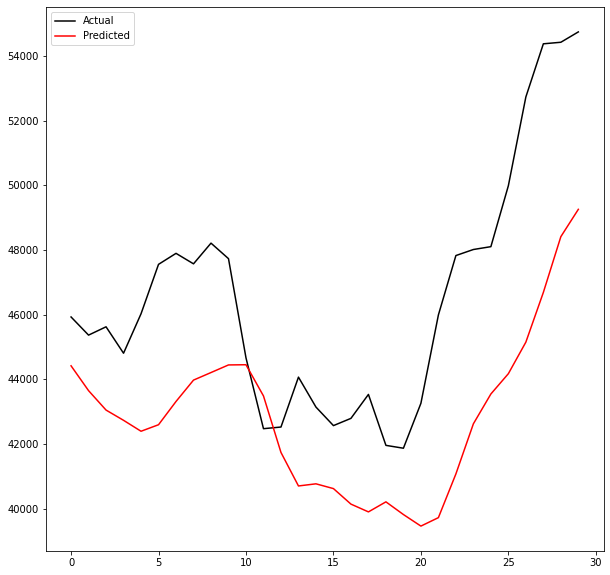

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500RMSprop0-01relu64Int6.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00734: early stopping
Training R-Squared: 0.9944124617417449

Testing R-Squared: 0.9916845832310163

30day Holdout R-Squared: 0.13588518646796943

30day Holdout MAE: 3066.3572916666667

30day Holdout MAPE: 6.467008907924273

30day Holdout RMSE: 3427.226800010695


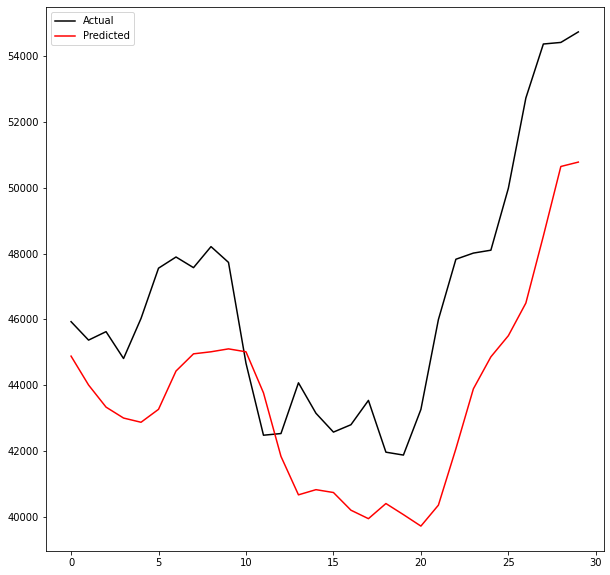

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500RMSprop0-001relu64Int6.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00855: early stopping
Training R-Squared: 0.9973386973004162

Testing R-Squared: 0.995385540052358

30day Holdout R-Squared: 0.5385498347204495

30day Holdout MAE: 2095.325

30day Holdout MAPE: 4.381954056040118

30day Holdout RMSE: 2504.4912747425647


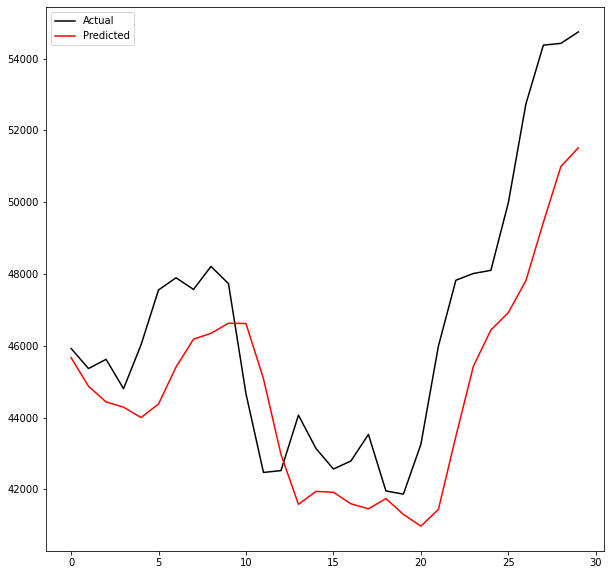

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500RMSprop0-0001relu64Int6.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00101: early stopping
Training R-Squared: -0.4271429550883794

Testing R-Squared: -0.4169732108755153

30day Holdout R-Squared: -159.24484000557823

30day Holdout MAE: 46525.36666666667

30day Holdout MAPE: 100.0

30day Holdout RMSE: 46671.21928733667


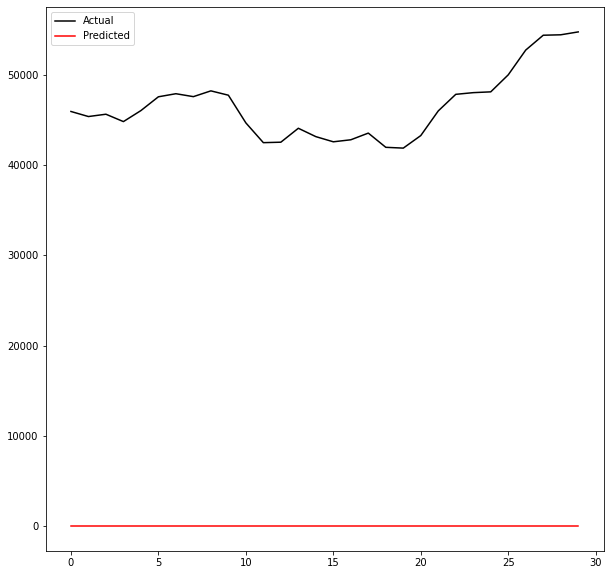

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600RMSprop0-01relu64Int6.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00649: early stopping
Training R-Squared: 0.995449798846431

Testing R-Squared: 0.9941491475759927

30day Holdout R-Squared: 0.5639322298525933

30day Holdout MAE: 1997.4884114583333

30day Holdout MAPE: 4.42400134764158

30day Holdout RMSE: 2434.6364212434933


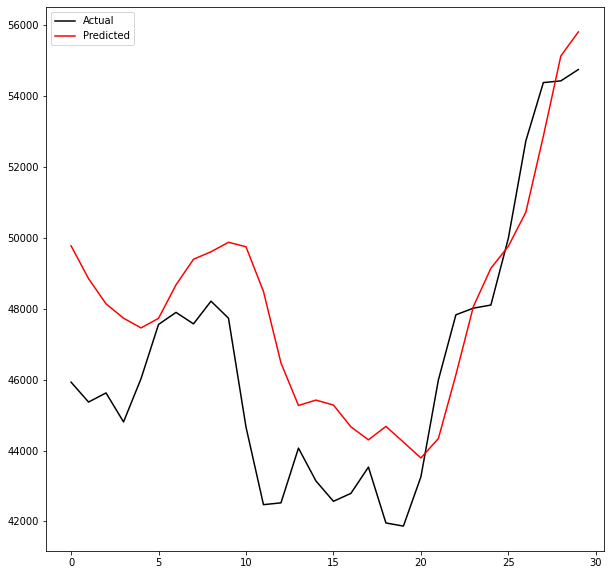

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600RMSprop0-001relu64Int6.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 01273: early stopping
Training R-Squared: 0.9979511077470663

Testing R-Squared: 0.9961223896023735

30day Holdout R-Squared: 0.6565918689146018

30day Holdout MAE: 1711.6200520833333

30day Holdout MAPE: 3.570548044106233

30day Holdout RMSE: 2160.5404769659453


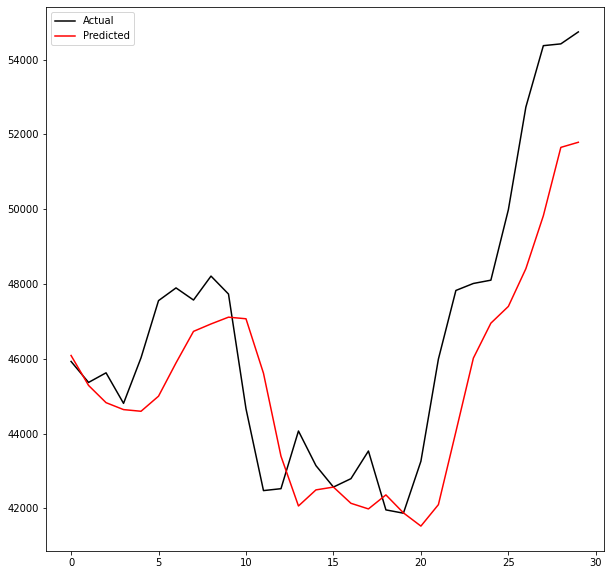

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600RMSprop0-0001relu64Int6.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001


In [118]:
opt_list = ['Adam', 'RMSprop']
activation_list = ['relu']
neuron_list = [200, 300, 400, 500, 600]
lr_list = [0.01, 0.001, 0.0001]

for op in opt_list:
    for neuron in neuron_list:
        for l in lr_list:
            for act in activation_list:
                interval6_ann_model_nextday(X, y, lr=l, activation=act,
                                            neurons=neuron, opt=op, batch_size=64, epochs=5000)


## Feature Adjustment Using Best Interval

In [119]:
# create a list of features
features = X.columns[1:]

# start with 4 features
features_4 = features[:4]
features_4


Index(['median_transaction_fee30trxUSD', 'median_transaction_fee7trxUSD',
       'price90emaUSD', 'size90trx'],
      dtype='object')

In [120]:
# add the date column to the beginning of the features list
cols = ['Date'] + list(features_4)
cols

['Date',
 'median_transaction_fee30trxUSD',
 'median_transaction_fee7trxUSD',
 'price90emaUSD',
 'size90trx']

['Date', 'median_transaction_fee30trxUSD', 'median_transaction_fee7trxUSD', 'price90emaUSD', 'size90trx', 'price30wmaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 01494: early stopping
Training R-Squared: 0.9934782948753226

Testing R-Squared: 0.989539936468894

30day Holdout R-Squared: -0.6965363444400792

30day Holdout MAE: 4381.075911458333

30day Holdout MAPE: 9.341657325500568

30day Holdout RMSE: 4802.182978064679


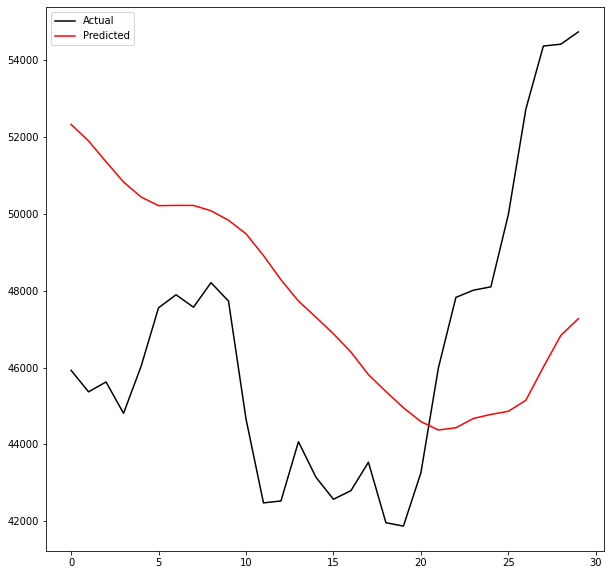

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['Date', 'median_transaction_fee30trxUSD', 'median_transaction_fee7trxUSD', 'price90emaUSD', 'size90trx', 'price3wmaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00591: early stopping
Training R-Squared: 0.996087855302278

Testing R-Squared: 0.995056783530428

30day Holdout R-Squared: 0.44252829582956765

30day Holdout MAE: 2338.717708333333

30day Holdout MAPE: 4.905227086746938

30day Holdout RMSE: 2752.761175142668


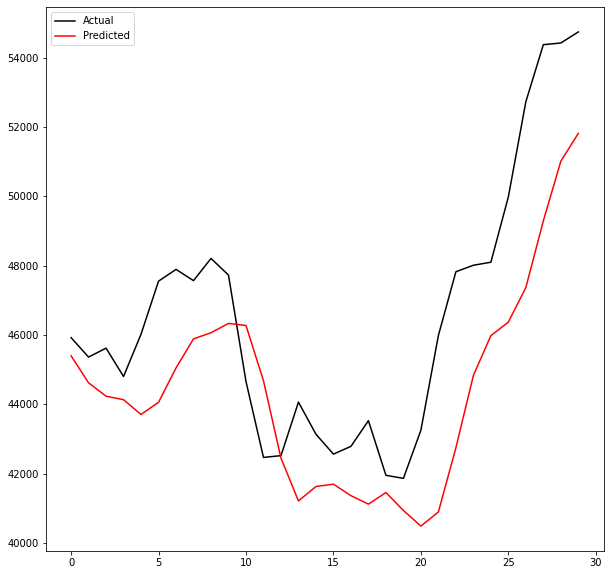

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['Date', 'median_transaction_fee30trxUSD', 'median_transaction_fee7trxUSD', 'price90emaUSD', 'size90trx', 'price3wmaUSD', 'price7wmaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 01493: early stopping
Training R-Squared: 0.9973614240464971

Testing R-Squared: 0.9968620661948394

30day Holdout R-Squared: 0.7067440664510038

30day Holdout MAE: 1575.1486979166666

30day Holdout MAPE: 3.321533266051556

30day Holdout RMSE: 1996.5515324380447


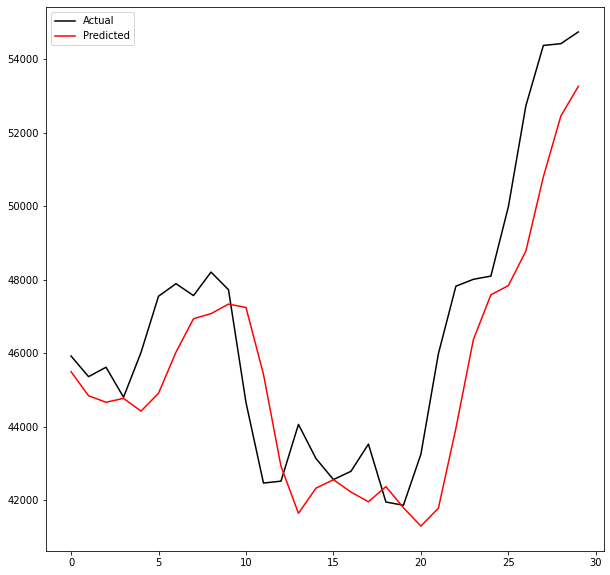

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['Date', 'median_transaction_fee30trxUSD', 'median_transaction_fee7trxUSD', 'price90emaUSD', 'size90trx', 'price3wmaUSD', 'price7wmaUSD', 'median_transaction_fee7rocUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 01242: early stopping
Training R-Squared: 0.9975105462179654

Testing R-Squared: 0.9968416561417935

30day Holdout R-Squared: 0.6713340461840067

30day Holdout MAE: 1731.3727864583334

30day Holdout MAPE: 3.672253922305637

30day Holdout RMSE: 2113.656839180137


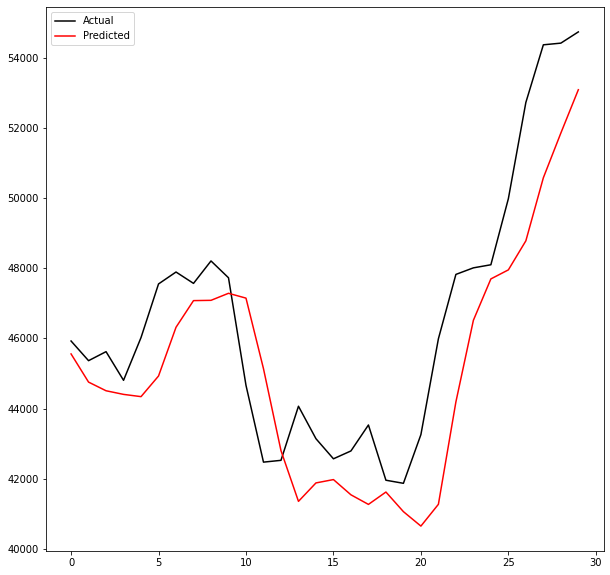

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['Date', 'median_transaction_fee30trxUSD', 'median_transaction_fee7trxUSD', 'price90emaUSD', 'size90trx', 'price3wmaUSD', 'price7wmaUSD', 'median_transaction_fee7rocUSD', 'difficulty30rsi']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 01254: early stopping
Training R-Squared: 0.9979132783135557

Testing R-Squared: 0.9975042631154032

30day Holdout R-Squared: 0.7369510967894224

30day Holdout MAE: 1424.3828125

30day Holdout MAPE: 3.0095730698840764

30day Holdout RMSE: 1890.9296328264218


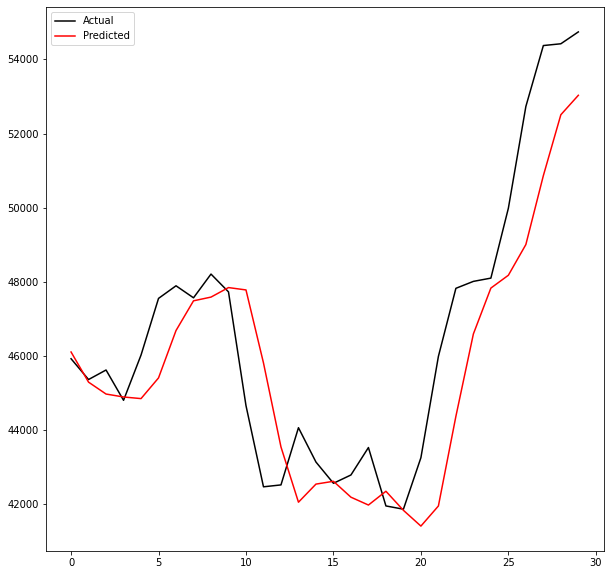

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001


In [121]:
# set the parameters from the best parameters so far from interval 4
act = 'relu'
neuron = 300
op = 'RMSprop'
l = 0.0001

# set a variable for the max R squared
r_sq_max = 0

# iterate through the features to add to the columns list
for feat in features[5:]:
    cols.append(feat)
    print(cols)

    # update X with the new features
    new_X = X[cols]
    r_sq = interval4_ann_model_nextday(new_X, y, lr=l, activation=act, neurons=neuron, opt=op, batch_size=64, epochs=5000)

    if r_sq < r_sq_max:
        cols = cols[:-1]
    else: continue

### The above model was not as intended. Because I never updated the r_sq_max with r_sq, it simply continued adding on features to the list and running the model.

### Below is the proper code and the results show only adding and keeping features that improve the model.

In [182]:
X_100

,price3wmaUSD,price90wmaUSD,price30smaUSD,transactionvalue90emaUSD,transactionvalue90wmaUSD,price3emaUSD,transactionvalue90smaUSD,price7smaUSD,price14emaUSD,price90emaUSD,...,fee_to_reward7momUSD,difficulty90mom,difficulty30trx,top100cap90ema,transactionfees90trxUSD,size90var,median_transaction_fee3momUSD,top100cap7std,transactionvalue90stdUSD,price3rocUSD
0,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,-0.017617,0.312189,-0.397326,0.065666,-0.679925,-0.999998,-0.027404,-0.954131,-1.000000,-0.255509
1,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,-0.017617,0.312189,-0.266771,0.071800,-0.679925,-0.999998,-0.027404,-0.976727,-1.000000,-0.255509
2,-0.999998,-1.000000,-1.000000,-1.000000,-1.000000,-0.999998,-1.000000,-1.000000,-1.000000,-1.000000,...,-0.017617,0.312189,-0.109238,0.077606,-0.679925,-0.999998,-0.027404,-0.982039,-1.000000,-0.255509
3,-0.999997,-1.000000,-1.000000,-1.000000,-1.000000,-0.999998,-1.000000,-1.000000,-1.000000,-1.000000,...,-0.017617,0.312189,0.061303,0.083082,-0.679925,-0.999998,-0.027404,-0.982135,-1.000000,0.565440
4,-0.999997,-1.000000,-1.000000,-1.000000,-1.000000,-0.999998,-1.000000,-1.000000,-1.000000,-1.000000,...,-0.017617,0.312189,0.232326,0.088559,-0.679925,-0.999998,-0.027404,-0.988122,-1.000000,-0.175645
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4098,0.557645,0.614204,0.573571,0.962914,0.955311,0.560008,0.945293,0.506880,0.526855,0.692749,...,-0.015602,1.000000,-0.739130,-0.827373,-0.917954,-0.461563,-0.024578,-0.995461,0.916286,-0.191683
4099,0.621660,0.621925,0.574705,0.983699,0.976840,0.623133,0.963352,0.557211,0.556362,0.699860,...,0.012105,1.000000,-0.738649,-0.828140,-0.919201,-0.457372,0.009278,-0.994496,0.925096,-0.116694
4100,0.686787,0.630784,0.579721,0.989633,0.985090,0.680950,0.972362,0.608742,0.589218,0.708196,...,0.043348,1.000000,-0.738167,-0.829125,-0.920137,-0.423407,0.036068,-0.993337,0.925559,-0.071266
4101,0.719478,0.639501,0.589033,0.997117,0.994687,0.710658,0.988164,0.647813,0.617897,0.716378,...,0.015032,1.000000,-0.737685,-0.829783,-0.921073,-0.403939,0.029800,-0.993433,0.921065,-0.130132


In [183]:
features_cols = list(X_100.columns)
len(features_cols)

100

In [184]:
# take the first 5 features from the VIF list
cols = top_20_feat[:5]

# remove them from the features_col
for feat in first_5:
    features_cols.remove(feat)
    
# check they are removed
'top100cap30trx' in features_cols

False

In [185]:
# add Date to the beginning of the cols list
cols = ['Date'] + cols
cols

['Date',
 'median_transaction_fee3momUSD',
 'fee_to_reward7momUSD',
 'top100cap30trx',
 'mining_profitability7rsi',
 'top100cap14mom']

In [189]:
# add the Date values to the beginning of the X df
X = pd.concat([full_df['Date'], X], axis=1)
X.head()               

,Date,transactions,size,sentbyaddress,difficulty,hashrate,mining_profitability,sentinusdUSD,transactionfeesUSD,median_transaction_feeUSD,...,price7rsiUSD,price14rsiUSD,price30rsiUSD,price90rsiUSD,price3rocUSD,price7rocUSD,price14rocUSD,price30rocUSD,price90rocUSD,random
0,2010/07/17,-0.999417,-0.999345,-0.999551,-1.0,-1.0,-0.359059,-1.0,-1.000000,-1.0,...,-1.0,-1.0,-1.0,-1.0,-0.255509,-0.515601,-0.668476,-0.844407,-0.949709,-0.471958
1,2010/07/18,-0.999364,-0.999113,-0.999458,-1.0,-1.0,0.669186,-1.0,-0.999992,-1.0,...,-1.0,-1.0,-1.0,-1.0,-0.255509,-0.515601,-0.668476,-0.844407,-0.949709,-0.349298
2,2010/07/19,-0.998931,-0.999132,-0.999104,-1.0,-1.0,1.000000,-1.0,-0.999999,-1.0,...,-1.0,-1.0,-1.0,-1.0,-0.255509,-0.515601,-0.668476,-0.844407,-0.949709,-0.197308
3,2010/07/20,-0.998691,-0.998674,-0.998888,-1.0,-1.0,0.793791,-1.0,-1.000000,-1.0,...,-1.0,-1.0,-1.0,-1.0,0.565440,-0.515601,-0.668476,-0.844407,-0.949709,-0.799843
4,2010/07/21,-0.999331,-0.999560,-0.999414,-1.0,-1.0,0.914055,-1.0,-1.000000,-1.0,...,-1.0,-1.0,-1.0,-1.0,-0.175645,-0.515601,-0.668476,-0.844407,-0.949709,-0.554891


['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00573: early stopping
Training R-Squared: 0.9977839236635777

Testing R-Squared: 0.9971527981372645

30day Holdout R-Squared: 0.8525072601532756

30day Holdout MAE: 1143.68828125

30day Holdout MAPE: 2.4452540013123936

30day Holdout RMSE: 1534.2412609166183


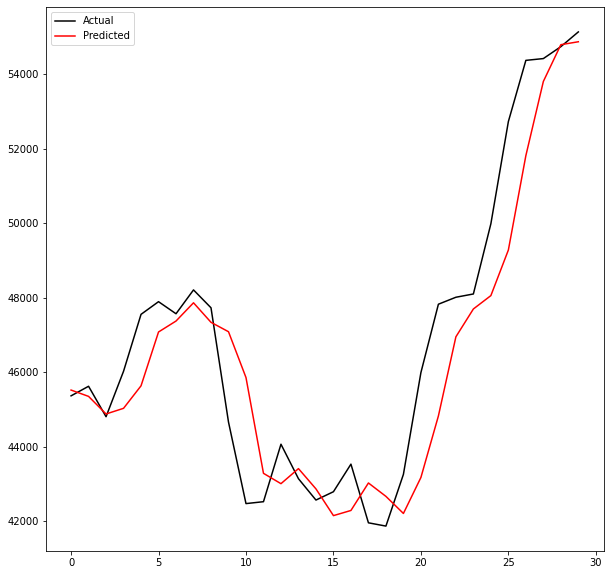

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price90wmaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00618: early stopping
Training R-Squared: 0.9978501316882995

Testing R-Squared: 0.9968807276215195

30day Holdout R-Squared: 0.7922127952494531

30day Holdout MAE: 1442.9444010416667

30day Holdout MAPE: 3.060510106397633

30day Holdout RMSE: 1821.032668857158


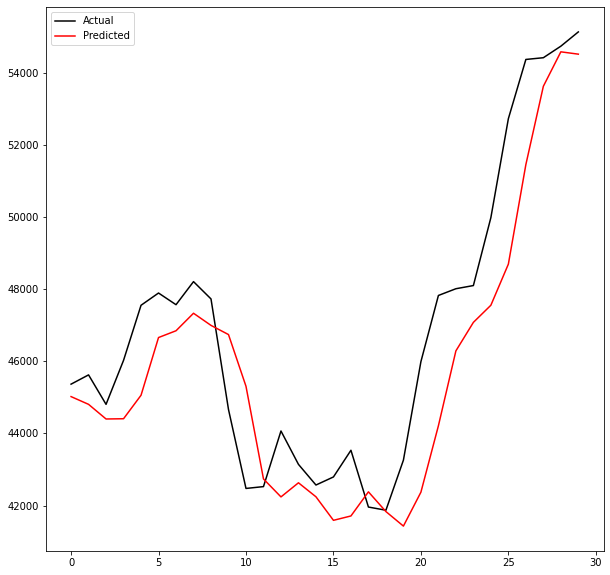

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00637: early stopping
Training R-Squared: 0.9979555746714046

Testing R-Squared: 0.9972531964619394

30day Holdout R-Squared: 0.8590032728796881

30day Holdout MAE: 1111.9970052083333

30day Holdout MAPE: 2.386879731396261

30day Holdout RMSE: 1500.0745828570011


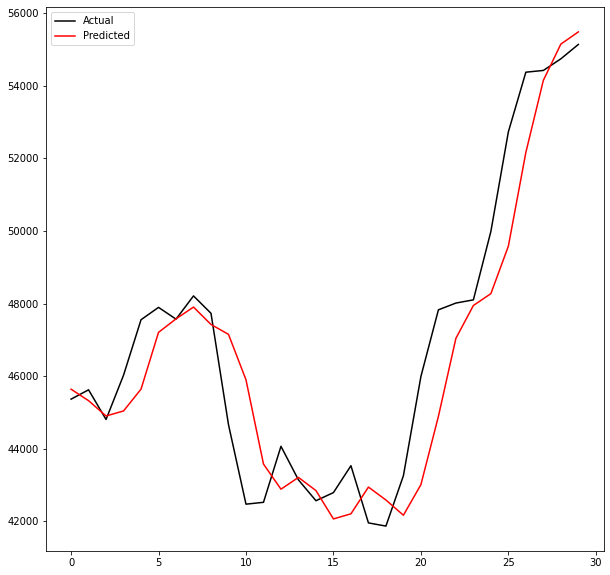

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'transactionvalue90emaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00580: early stopping
Training R-Squared: 0.997690600095039

Testing R-Squared: 0.997064090826953

30day Holdout R-Squared: 0.8258587984759176

30day Holdout MAE: 1255.3770833333333

30day Holdout MAPE: 2.664361747164766

30day Holdout RMSE: 1667.0902246124206


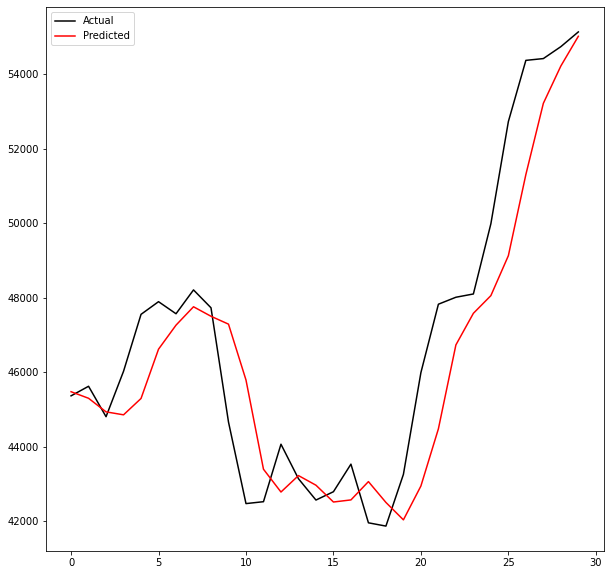

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'transactionvalue90wmaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00706: early stopping
Training R-Squared: 0.9980316304379401

Testing R-Squared: 0.9973344187595868

30day Holdout R-Squared: 0.8530821035165145

30day Holdout MAE: 1118.057421875

30day Holdout MAPE: 2.4014934081412465

30day Holdout RMSE: 1531.2485393081029


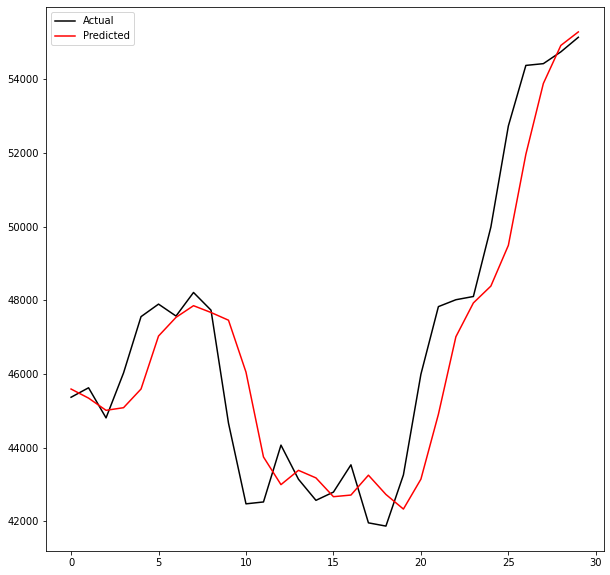

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price3emaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00487: early stopping
Training R-Squared: 0.9969804850780036

Testing R-Squared: 0.9962758836581925

30day Holdout R-Squared: 0.8421076594351087

30day Holdout MAE: 1240.290234375

30day Holdout MAPE: 2.6906765994284267

30day Holdout RMSE: 1587.409108491142


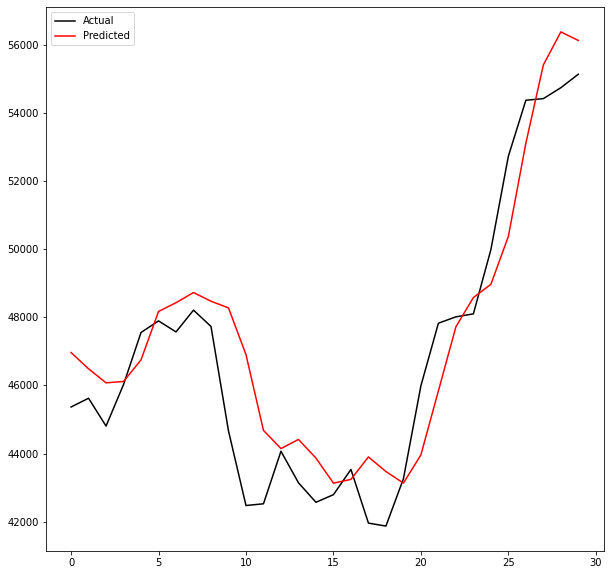

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'transactionvalue90smaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00518: early stopping
Training R-Squared: 0.996538976659484

Testing R-Squared: 0.99425047810413

30day Holdout R-Squared: 0.6270897843713148

30day Holdout MAE: 2118.0403645833335

30day Holdout MAPE: 4.45999590885836

30day Holdout RMSE: 2439.5542315518746


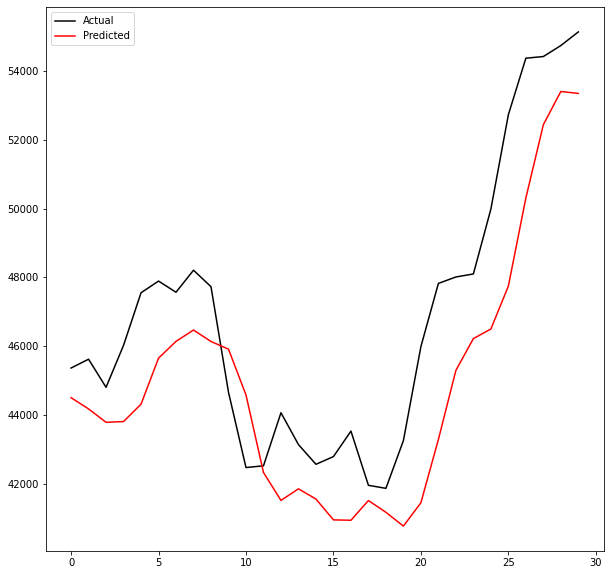

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price7smaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00470: early stopping
Training R-Squared: 0.9975446728515298

Testing R-Squared: 0.9964157921760749

30day Holdout R-Squared: 0.7636294831684809

30day Holdout MAE: 1546.7244791666667

30day Holdout MAPE: 3.245113433574906

30day Holdout RMSE: 1942.2493688853308


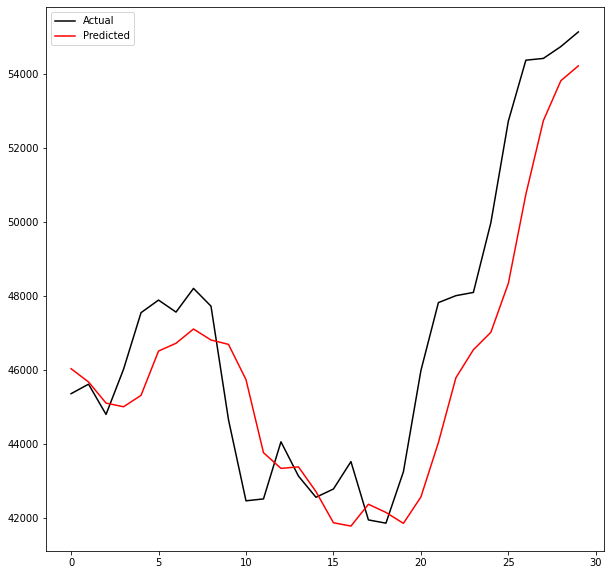

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price14emaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00101: early stopping
Training R-Squared: -0.36031726194235114

Testing R-Squared: -0.3691120377549306

30day Holdout R-Squared: -137.4280984959793

30day Holdout MAE: 46832.36666666667

30day Holdout MAPE: 100.0

30day Holdout RMSE: 47002.446444484856


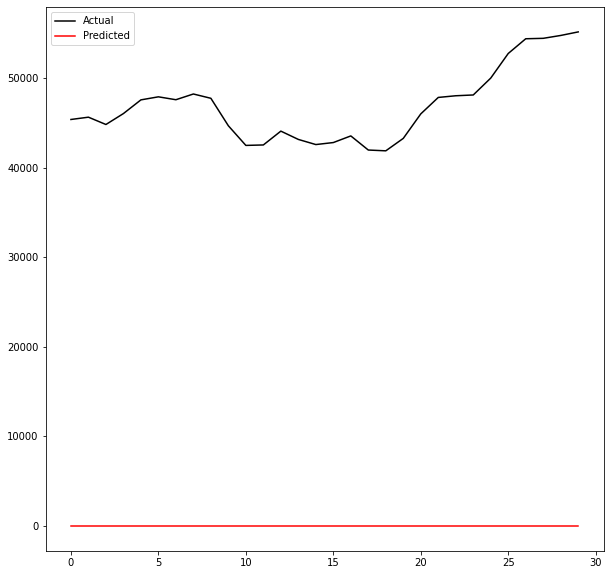

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price90emaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00982: early stopping
Training R-Squared: 0.9980177053922589

Testing R-Squared: 0.9971804087649864

30day Holdout R-Squared: 0.8251300135730297

30day Holdout MAE: 1282.7921875

30day Holdout MAPE: 2.734310495455317

30day Holdout RMSE: 1670.5749877851135


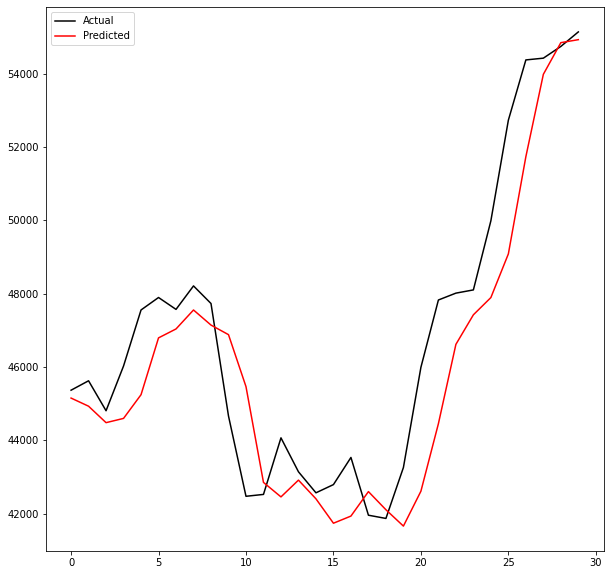

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'transactionvalue30wmaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00614: early stopping
Training R-Squared: 0.9973584586208791

Testing R-Squared: 0.9970882523307651

30day Holdout R-Squared: 0.5978317267728077

30day Holdout MAE: 2155.058072916667

30day Holdout MAPE: 4.775033915689457

30day Holdout RMSE: 2533.4494301241416


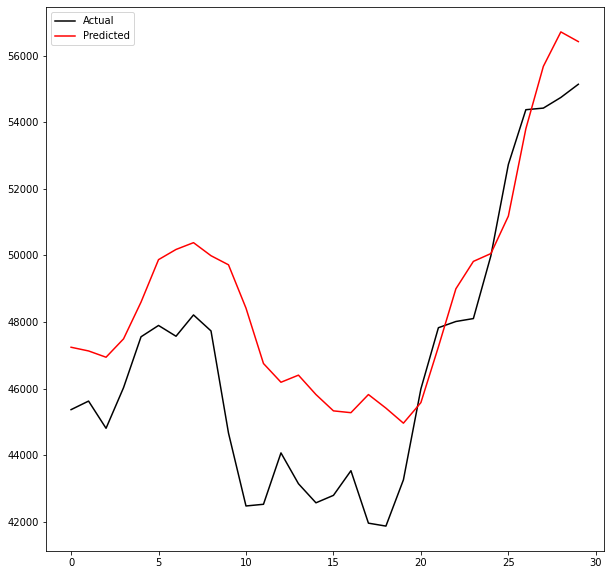

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price14wmaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00613: early stopping
Training R-Squared: 0.9966070487379932

Testing R-Squared: 0.9961529720303294

30day Holdout R-Squared: 0.8403248076904062

30day Holdout MAE: 1230.8825520833334

30day Holdout MAPE: 2.674737228761453

30day Holdout RMSE: 1596.3461182593253


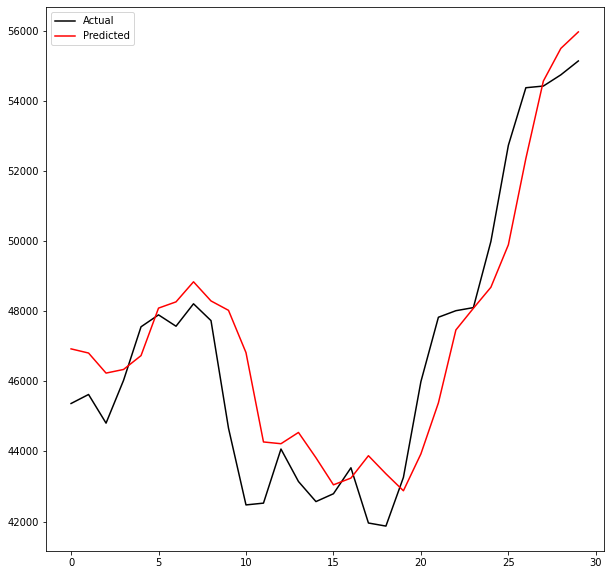

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price90smaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00597: early stopping
Training R-Squared: 0.9975677959646082

Testing R-Squared: 0.9967642016286282

30day Holdout R-Squared: 0.8032715237866359

30day Holdout MAE: 1369.6459635416666

30day Holdout MAPE: 2.89366789712193

30day Holdout RMSE: 1771.9111892989895


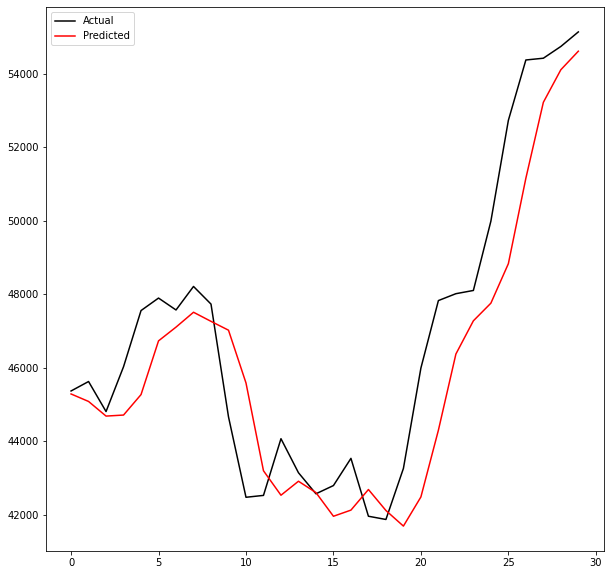

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'transactionvalue30emaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00542: early stopping
Training R-Squared: 0.9979763432369928

Testing R-Squared: 0.9972182916653658

30day Holdout R-Squared: 0.841934215248438

30day Holdout MAE: 1184.8131510416667

30day Holdout MAPE: 2.5787696425619604

30day Holdout RMSE: 1588.280750873688


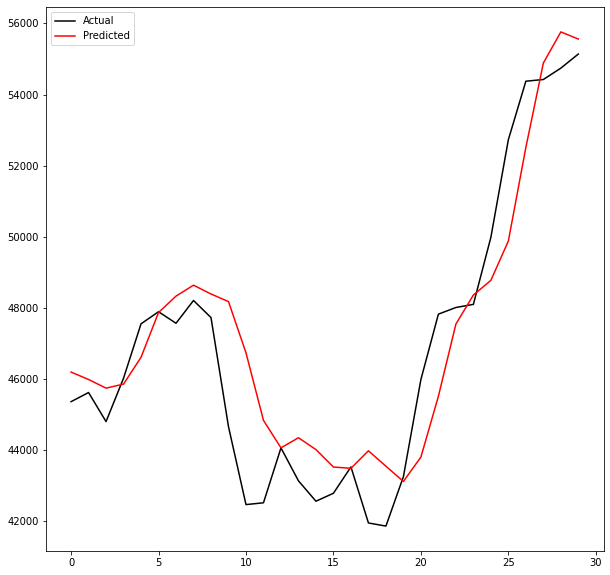

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price3smaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00917: early stopping
Training R-Squared: 0.9975834971076397

Testing R-Squared: 0.9962978924649136

30day Holdout R-Squared: 0.7290540971217561

30day Holdout MAE: 1723.3673177083333

30day Holdout MAPE: 3.644326796121381

30day Holdout RMSE: 2079.455498690765


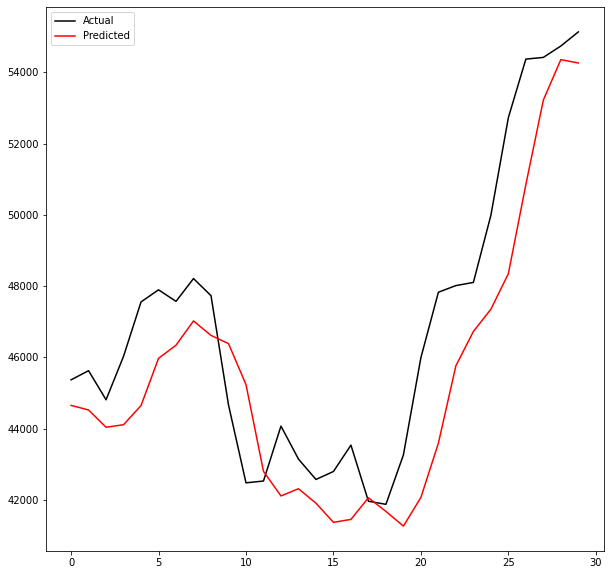

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price7wmaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00465: early stopping
Training R-Squared: 0.9974406643483488

Testing R-Squared: 0.9967253719140553

30day Holdout R-Squared: 0.8128550118503535

30day Holdout MAE: 1336.7796875

30day Holdout MAPE: 2.856744970454821

30day Holdout RMSE: 1728.213674126644


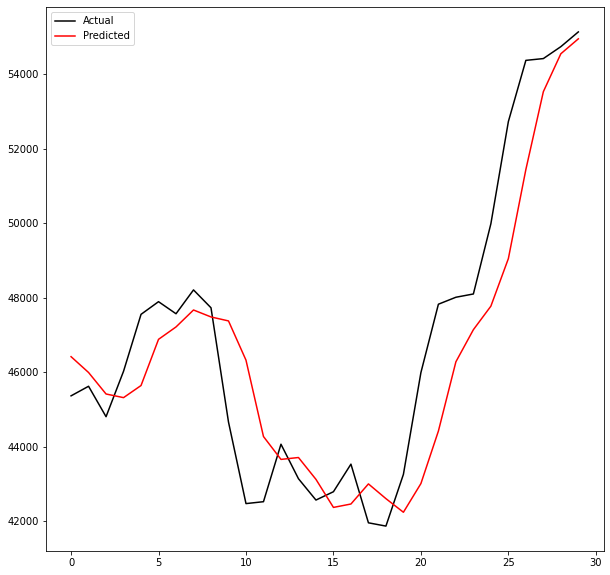

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00585: early stopping
Training R-Squared: 0.9976194763627559

Testing R-Squared: 0.9969659101714239

30day Holdout R-Squared: 0.8678589864050152

30day Holdout MAE: 1110.0865885416667

30day Holdout MAPE: 2.3918614792391124

30day Holdout RMSE: 1452.2024111013357


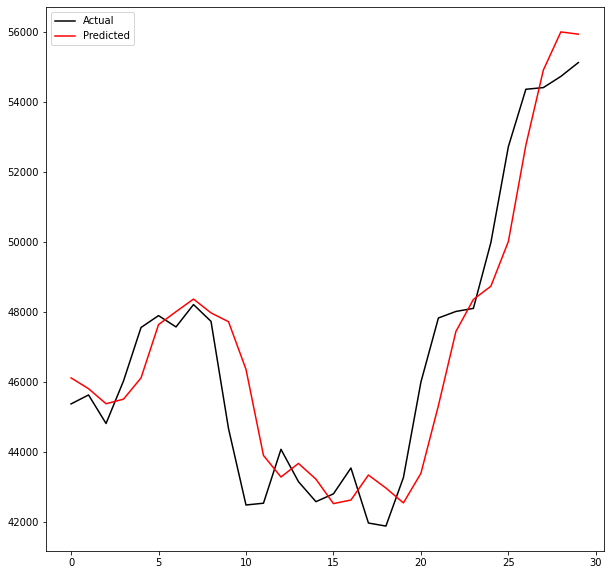

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'price30wmaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00637: early stopping
Training R-Squared: 0.9973282704381692

Testing R-Squared: 0.9966647350759741

30day Holdout R-Squared: 0.7833614851686838

30day Holdout MAE: 1479.70078125

30day Holdout MAPE: 3.1241769639005152

30day Holdout RMSE: 1859.4143206985034


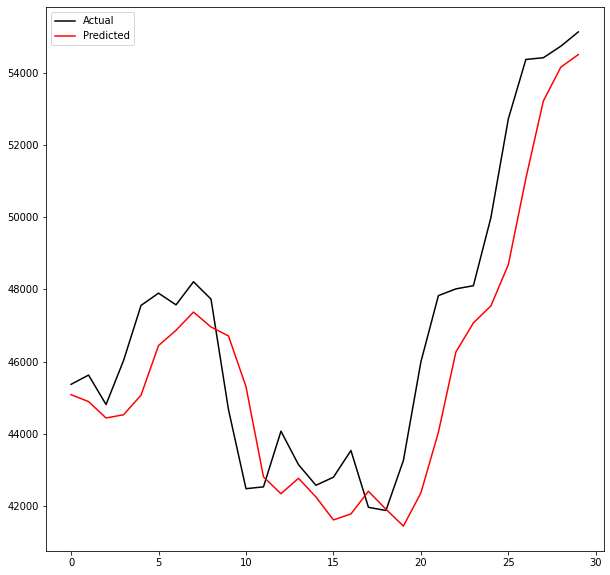

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'price14smaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00329: early stopping
Training R-Squared: 0.9963583911201663

Testing R-Squared: 0.9954489442828942

30day Holdout R-Squared: 0.8381027328773688

30day Holdout MAE: 1223.3548177083333

30day Holdout MAPE: 2.6577473326310326

30day Holdout RMSE: 1607.4152914878532


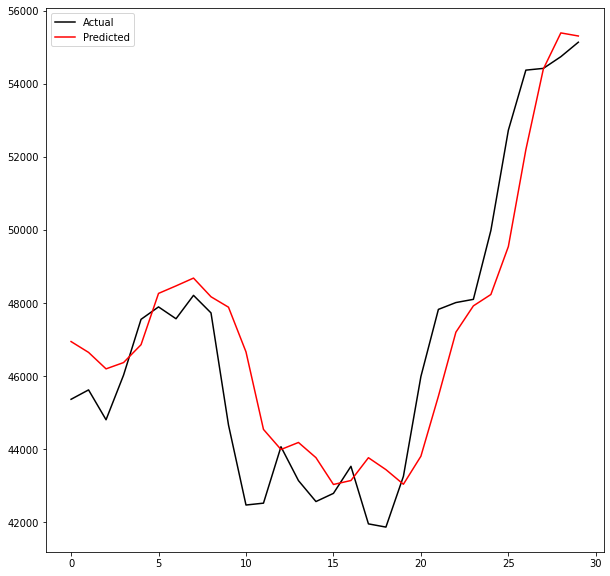

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'transactionvalue14smaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00599: early stopping
Training R-Squared: 0.9978975599986456

Testing R-Squared: 0.9968954118006819

30day Holdout R-Squared: 0.5264575846022335

30day Holdout MAE: 2262.0748697916665

30day Holdout MAPE: 5.023214189379342

30day Holdout RMSE: 2749.0825372960985


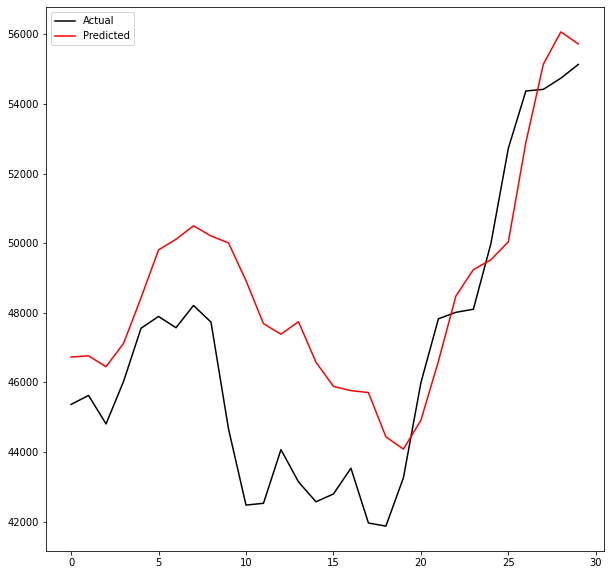

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'transactionvalue30smaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00698: early stopping
Training R-Squared: 0.9979996657617443

Testing R-Squared: 0.9969288194459491

30day Holdout R-Squared: 0.7539129732798475

30day Holdout MAE: 1564.2432291666667

30day Holdout MAPE: 3.4558318483855266

30day Holdout RMSE: 1981.7674735767519


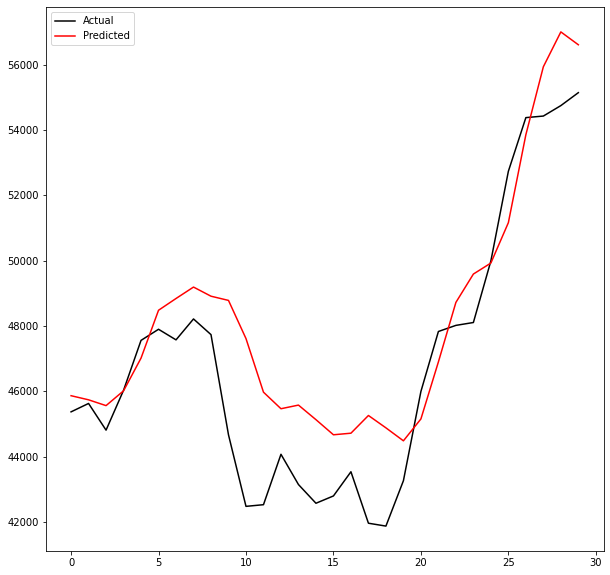

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'price7emaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00915: early stopping
Training R-Squared: 0.9974955001085865

Testing R-Squared: 0.9965502250047465

30day Holdout R-Squared: 0.850217559395125

30day Holdout MAE: 1150.7322916666667

30day Holdout MAPE: 2.4770657471342457

30day Holdout RMSE: 1546.1043000122988


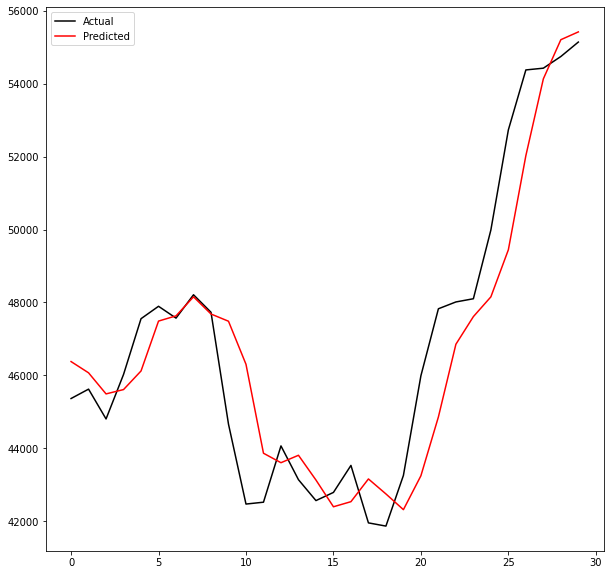

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'difficulty3ema']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00101: early stopping
Training R-Squared: -0.36031726194235114

Testing R-Squared: -0.3691120377549306

30day Holdout R-Squared: -137.4280984959793

30day Holdout MAE: 46832.36666666667

30day Holdout MAPE: 100.0

30day Holdout RMSE: 47002.446444484856


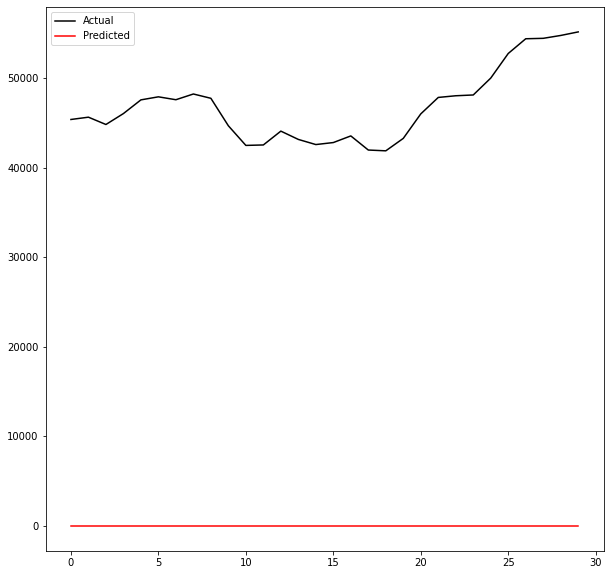

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate14sma']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00101: early stopping
Training R-Squared: -0.36031726194235114

Testing R-Squared: -0.3691120377549306

30day Holdout R-Squared: -137.4280984959793

30day Holdout MAE: 46832.36666666667

30day Holdout MAPE: 100.0

30day Holdout RMSE: 47002.446444484856


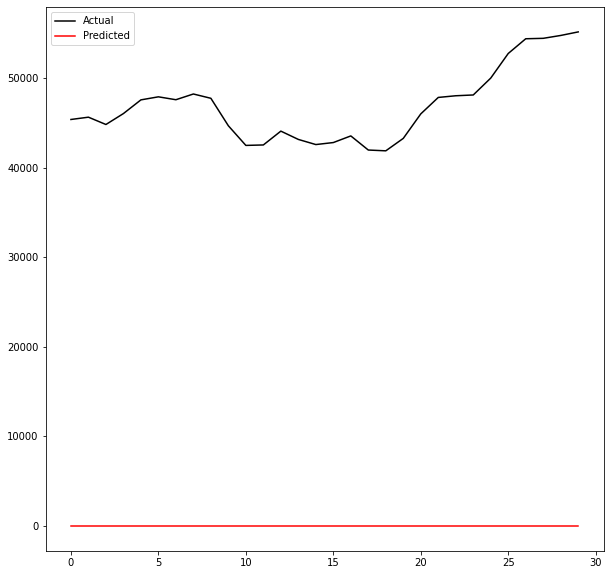

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'difficulty7ema']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00571: early stopping
Training R-Squared: 0.9979116651739078

Testing R-Squared: 0.9971724093185473

30day Holdout R-Squared: 0.8224762685753727

30day Holdout MAE: 1267.00234375

30day Holdout MAPE: 2.6994393529537883

30day Holdout RMSE: 1683.2031899872227


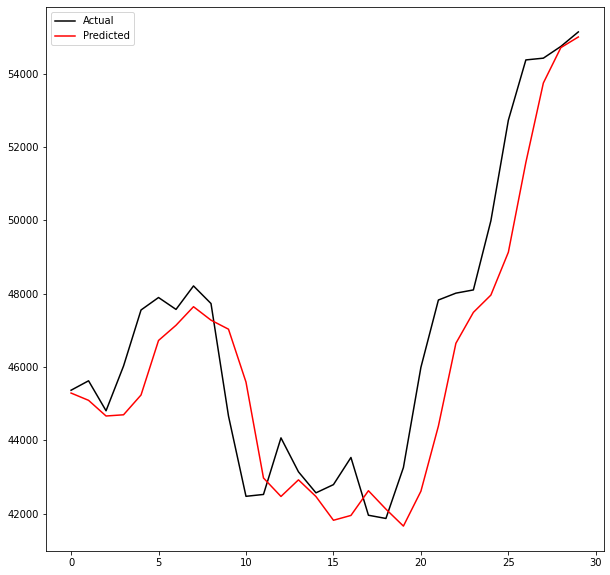

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00471: early stopping
Training R-Squared: 0.9978151284754202

Testing R-Squared: 0.9972142973011809

30day Holdout R-Squared: 0.8701170676348773

30day Holdout MAE: 1098.74296875

30day Holdout MAPE: 2.3717537775868562

30day Holdout RMSE: 1439.7410224837347


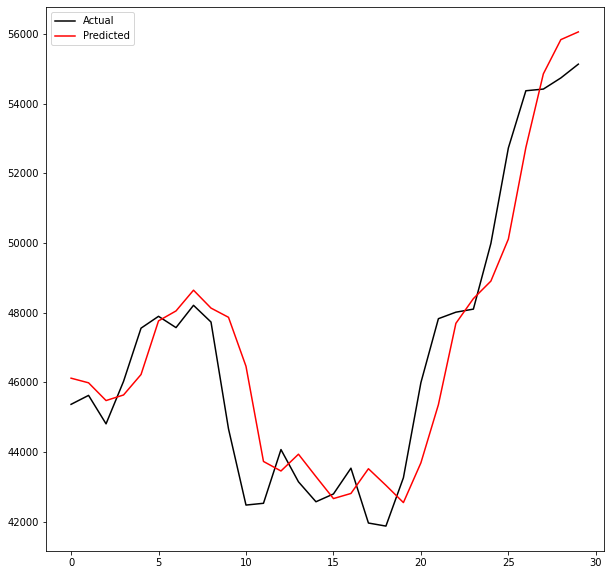

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'hashrate30ema']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00622: early stopping
Training R-Squared: 0.997144224684278

Testing R-Squared: 0.996596221926268

30day Holdout R-Squared: 0.8567243552044065

30day Holdout MAE: 1170.01875

30day Holdout MAPE: 2.5311811222653824

30day Holdout RMSE: 1512.1487765340596


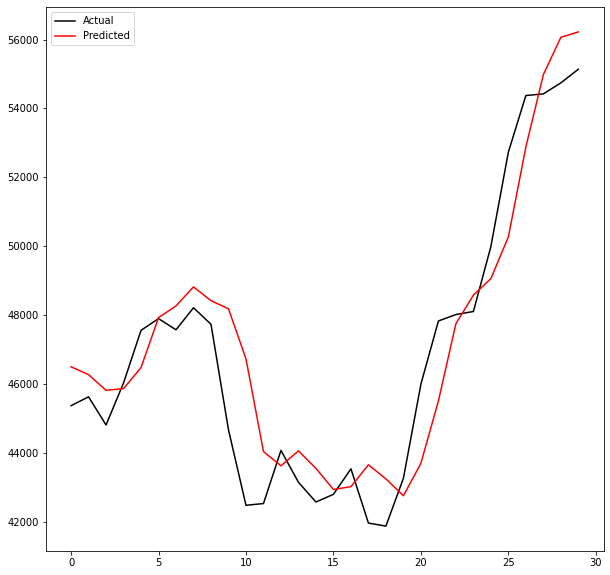

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty14sma']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00828: early stopping
Training R-Squared: 0.9977769553245768

Testing R-Squared: 0.9969700384981307

30day Holdout R-Squared: 0.8656532164082028

30day Holdout MAE: 1072.00234375

30day Holdout MAPE: 2.3043714142905727

30day Holdout RMSE: 1464.2727265383041


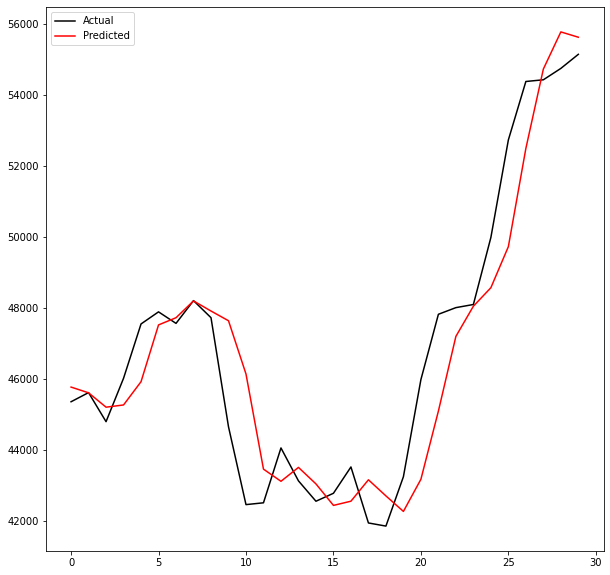

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'price90rsiUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00797: early stopping
Training R-Squared: 0.9979140351061047

Testing R-Squared: 0.9970556296839811

30day Holdout R-Squared: 0.8680172315285111

30day Holdout MAE: 1058.7162760416666

30day Holdout MAPE: 2.270884901221897

30day Holdout RMSE: 1451.3326100261909


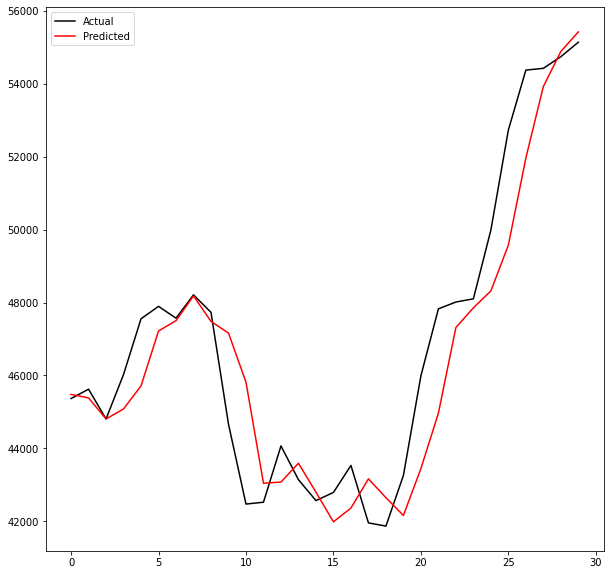

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty90sma']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00587: early stopping
Training R-Squared: 0.9977527650910563

Testing R-Squared: 0.9971082538708591

30day Holdout R-Squared: 0.8694788955299968

30day Holdout MAE: 1106.9227864583333

30day Holdout MAPE: 2.386285017791882

30day Holdout RMSE: 1443.273729536944


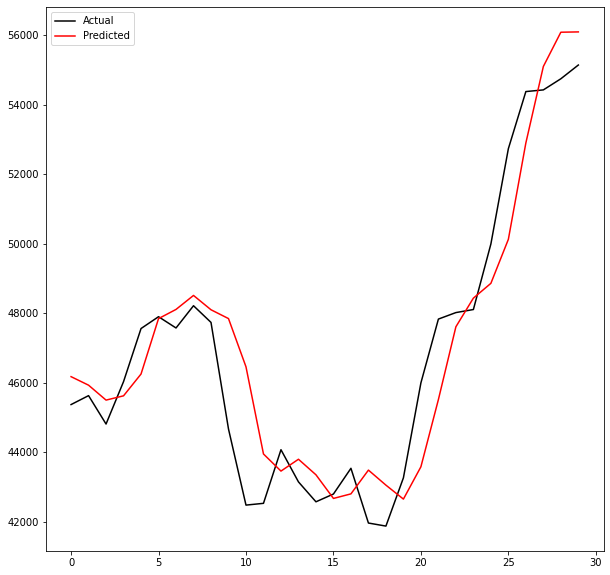

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30ema']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00667: early stopping
Training R-Squared: 0.9973834863578064

Testing R-Squared: 0.9967611913353936

30day Holdout R-Squared: 0.863845920456148

30day Holdout MAE: 1137.425

30day Holdout MAPE: 2.4581395309875673

30day Holdout RMSE: 1474.088865784398


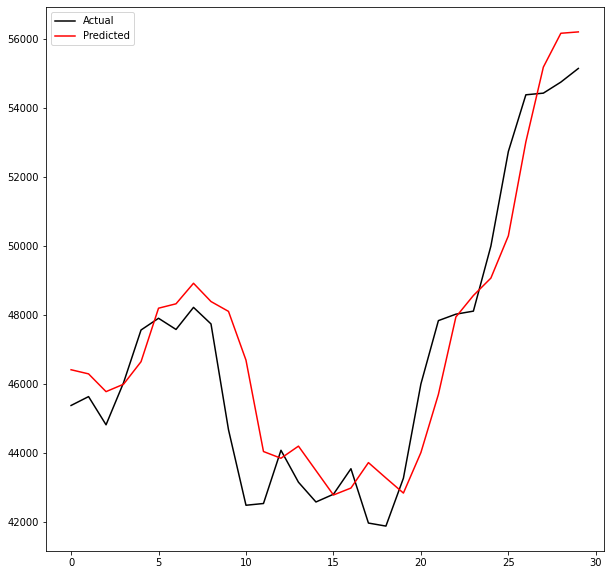

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty14ema']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00499: early stopping
Training R-Squared: 0.9963159658483968

Testing R-Squared: 0.9942966884179081

30day Holdout R-Squared: 0.6909528721408529

30day Holdout MAE: 1923.134375

30day Holdout MAPE: 4.063131853599495

30day Holdout RMSE: 2220.8574964882937


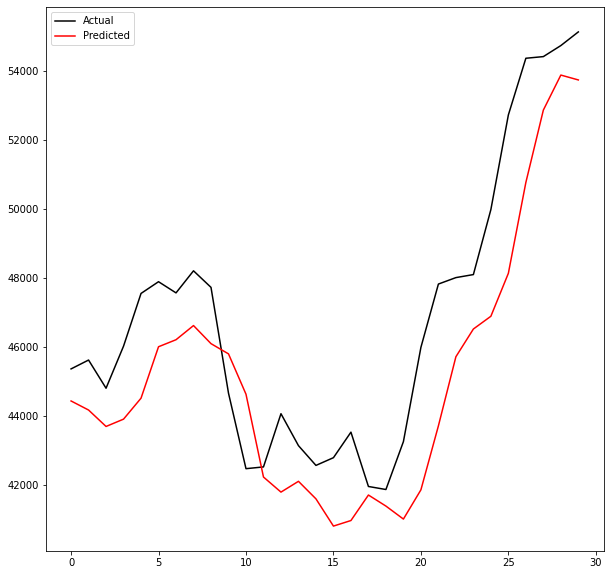

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00732: early stopping
Training R-Squared: 0.9978384006239971

Testing R-Squared: 0.9973047074973771

30day Holdout R-Squared: 0.8733501621693107

30day Holdout MAE: 1085.066015625

30day Holdout MAPE: 2.338700222886485

30day Holdout RMSE: 1421.70881316887


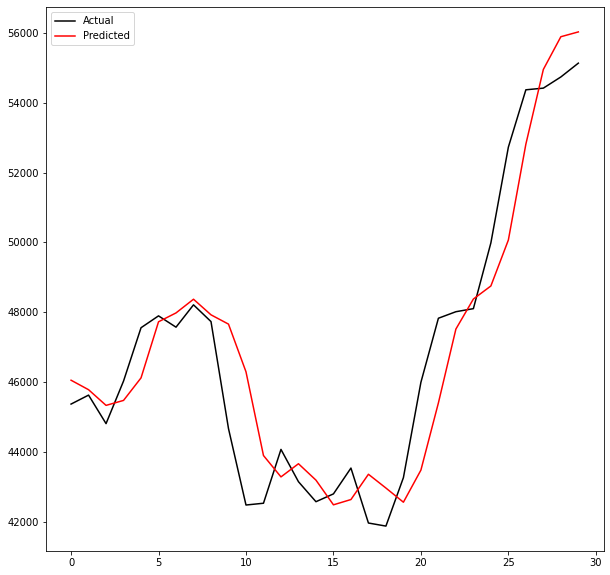

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'difficulty90wma']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00538: early stopping
Training R-Squared: 0.9978103768134333

Testing R-Squared: 0.9971772147060396

30day Holdout R-Squared: 0.8631108560190515

30day Holdout MAE: 1090.911328125

30day Holdout MAPE: 2.3503403264740466

30day Holdout RMSE: 1478.0626423358667


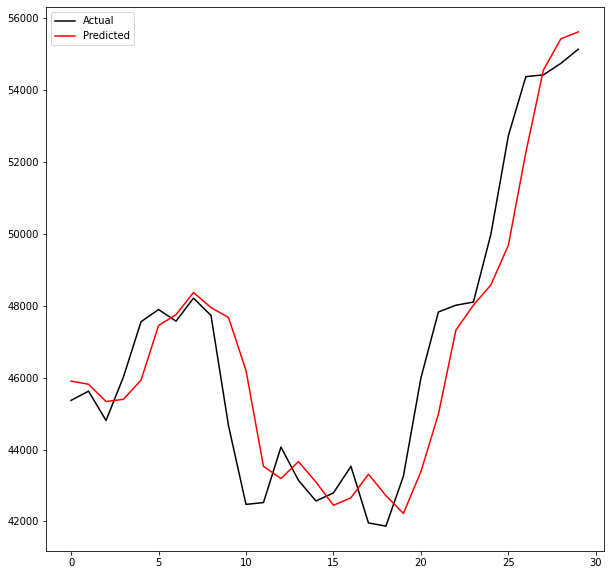

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'difficulty7sma']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00101: early stopping
Training R-Squared: -0.36031726194235114

Testing R-Squared: -0.3691120377549306

30day Holdout R-Squared: -137.4280984959793

30day Holdout MAE: 46832.36666666667

30day Holdout MAPE: 100.0

30day Holdout RMSE: 47002.446444484856


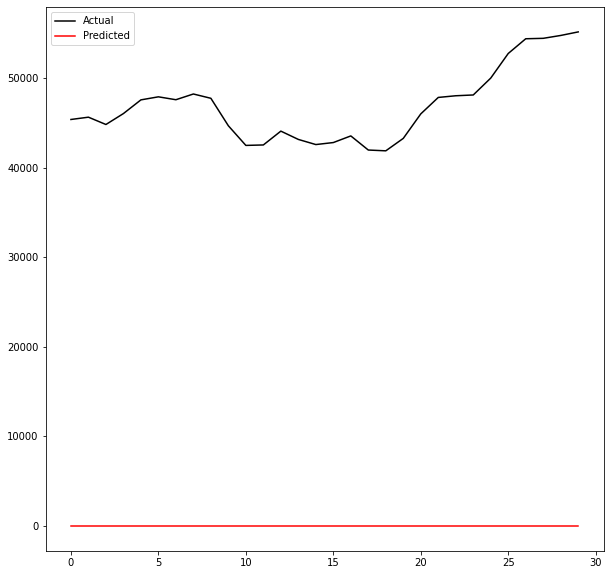

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'hashrate30wma']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00582: early stopping
Training R-Squared: 0.997373598444405

Testing R-Squared: 0.9958052503754015

30day Holdout R-Squared: 0.791134569861792

30day Holdout MAE: 1461.5766927083334

30day Holdout MAPE: 3.1046969787178065

30day Holdout RMSE: 1825.7513017353347


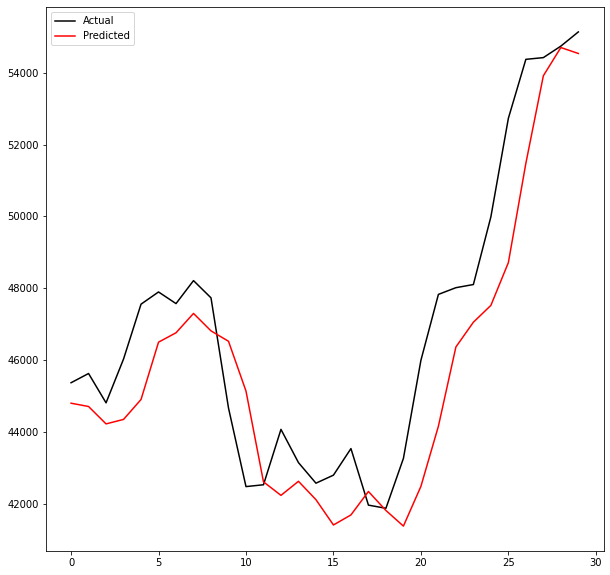

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'transactions90std']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00545: early stopping
Training R-Squared: 0.9975338693905941

Testing R-Squared: 0.997159555172489

30day Holdout R-Squared: 0.8638448519569996

30day Holdout MAE: 1107.8329427083333

30day Holdout MAPE: 2.392891896234013

30day Holdout RMSE: 1474.0946498916867


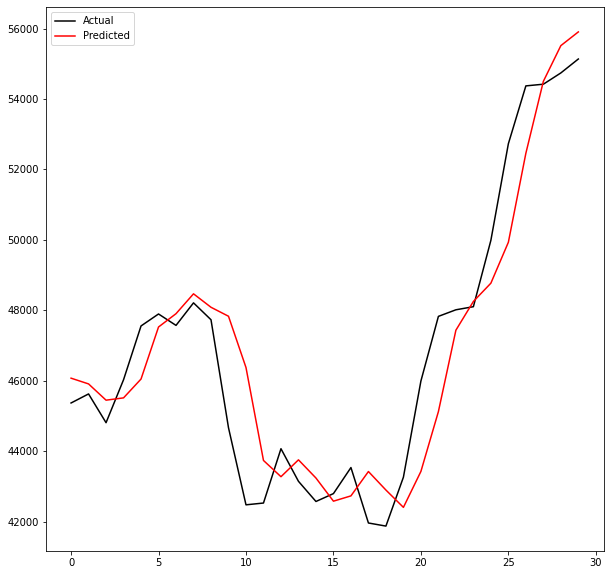

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'hashrate90sma']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00587: early stopping
Training R-Squared: 0.9975761543606126

Testing R-Squared: 0.9961794856062123

30day Holdout R-Squared: 0.7692811091064012

30day Holdout MAE: 1570.4596354166667

30day Holdout MAPE: 3.330137718508371

30day Holdout RMSE: 1918.8892694472129


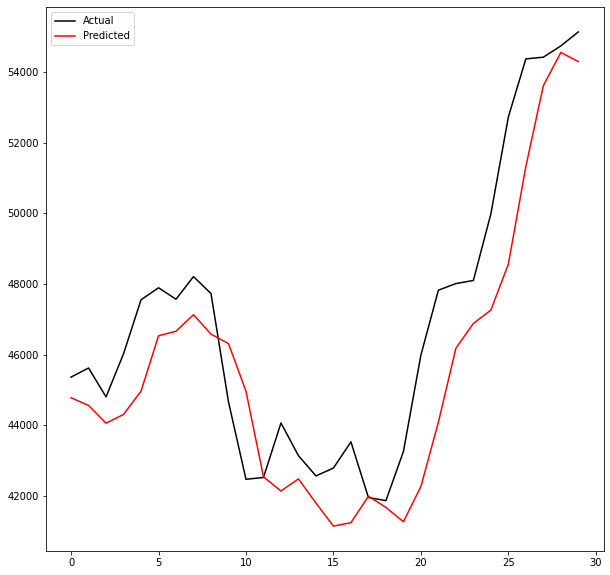

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'hashrate90wma']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00659: early stopping
Training R-Squared: 0.9980356336410421

Testing R-Squared: 0.9971338362265486

30day Holdout R-Squared: 0.8646920760926142

30day Holdout MAE: 1081.9904947916666

30day Holdout MAPE: 2.3224233911245893

30day Holdout RMSE: 1469.501223014192


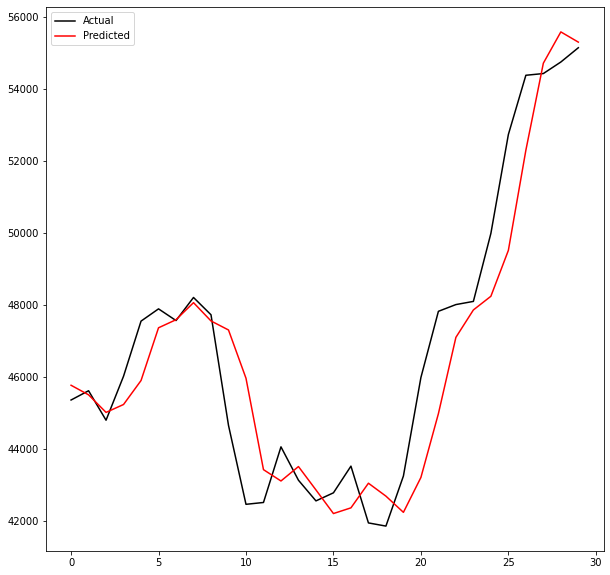

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'difficulty30wma']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00690: early stopping
Training R-Squared: 0.9977567371047594

Testing R-Squared: 0.996319086085169

30day Holdout R-Squared: 0.8668008664804988

30day Holdout MAE: 1068.06015625

30day Holdout MAPE: 2.289720924934185

30day Holdout RMSE: 1458.0050776110206


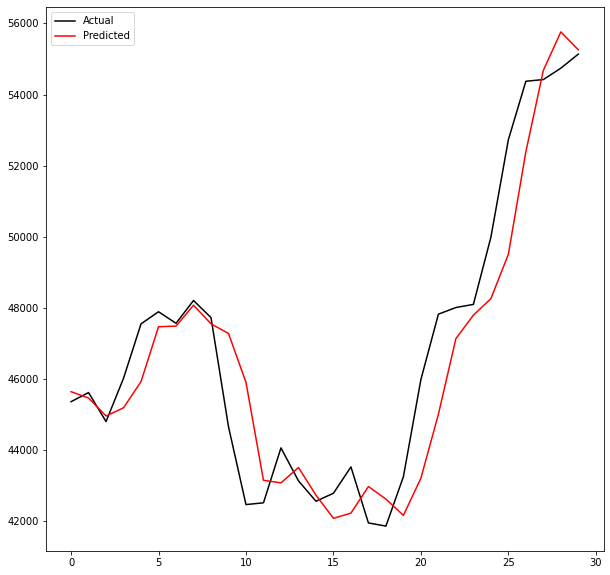

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'hashrate90ema']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00623: early stopping
Training R-Squared: 0.9979922828147213

Testing R-Squared: 0.997043279388621

30day Holdout R-Squared: 0.8538832504848612

30day Holdout MAE: 1112.75390625

30day Holdout MAPE: 2.3898261850409863

30day Holdout RMSE: 1527.067863871591


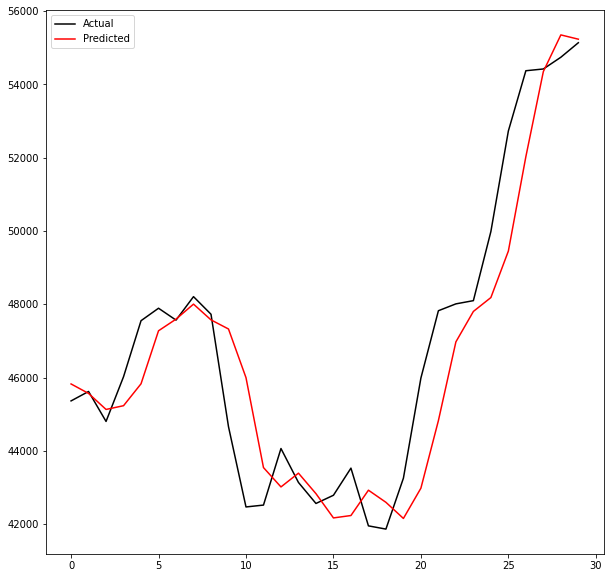

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'transactions90var']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00724: early stopping
Training R-Squared: 0.9978066714487912

Testing R-Squared: 0.9971946000084835

30day Holdout R-Squared: 0.8476960187459011

30day Holdout MAE: 1139.5704427083333

30day Holdout MAPE: 2.4423144389572387

30day Holdout RMSE: 1559.0640759306082


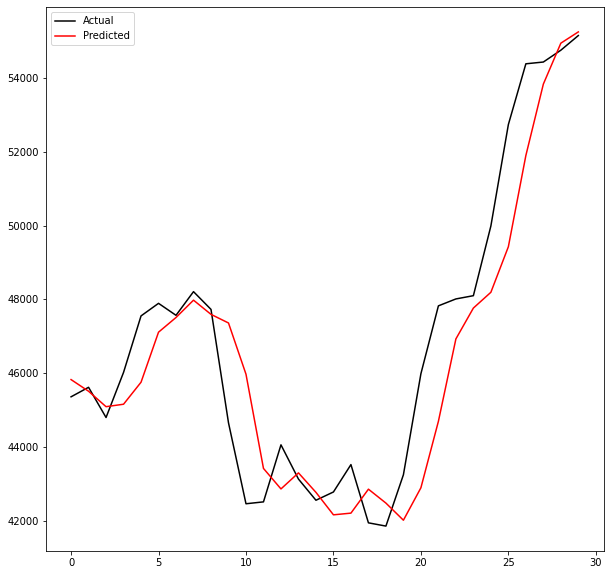

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'transactionvalue30trxUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00101: early stopping
Training R-Squared: -0.36031726194235114

Testing R-Squared: -0.3691120377549306

30day Holdout R-Squared: -137.4280984959793

30day Holdout MAE: 46832.36666666667

30day Holdout MAPE: 100.0

30day Holdout RMSE: 47002.446444484856


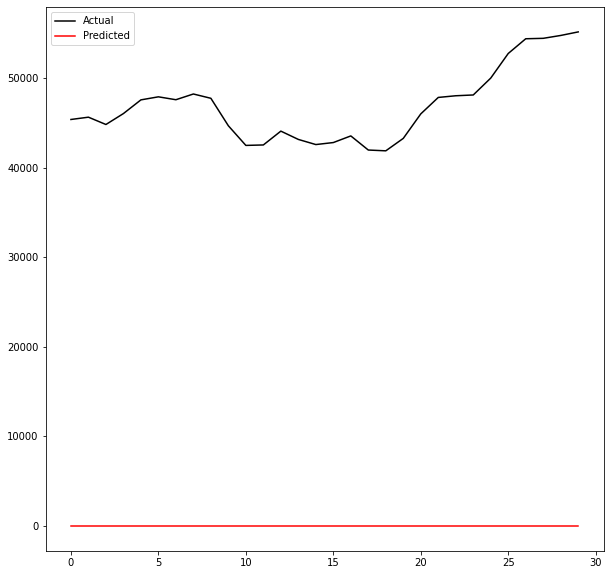

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'transactionvalue30stdUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00388: early stopping
Training R-Squared: 0.9976715802232837

Testing R-Squared: 0.9972807018990897

30day Holdout R-Squared: 0.8250142964389513

30day Holdout MAE: 1250.17109375

30day Holdout MAPE: 2.731599695616073

30day Holdout RMSE: 1671.1276331641666


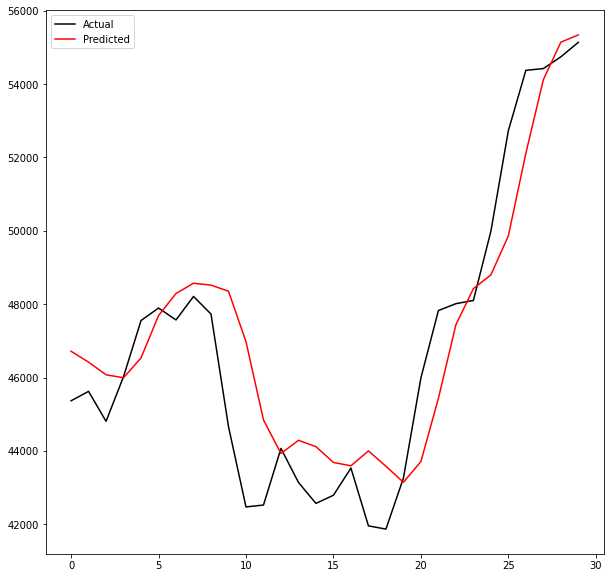

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'transactionvalue30varUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00519: early stopping
Training R-Squared: 0.9966995170022116

Testing R-Squared: 0.9957502683054578

30day Holdout R-Squared: -11.132078942672418

30day Holdout MAE: 12844.601692708333

30day Holdout MAPE: 28.18350622625668

30day Holdout RMSE: 13914.767379102499


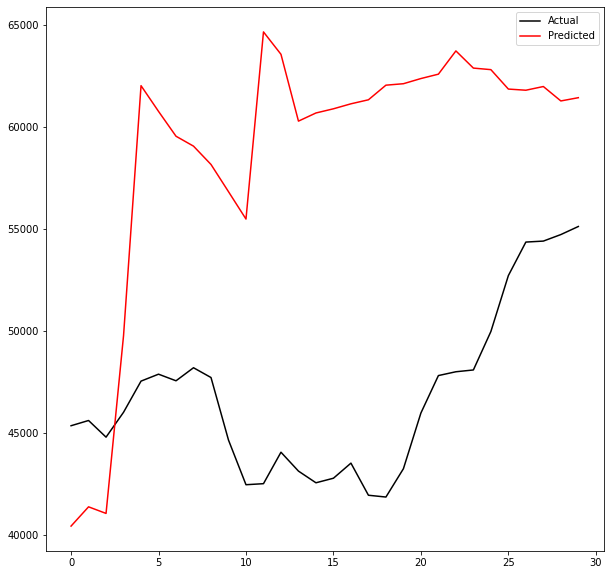

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'activeaddresses90trx']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00394: early stopping
Training R-Squared: 0.9973494636054064

Testing R-Squared: 0.9963919767411602

30day Holdout R-Squared: 0.7836356423201392

30day Holdout MAE: 1510.0893229166666

30day Holdout MAPE: 3.1860926376765035

30day Holdout RMSE: 1858.237399051511


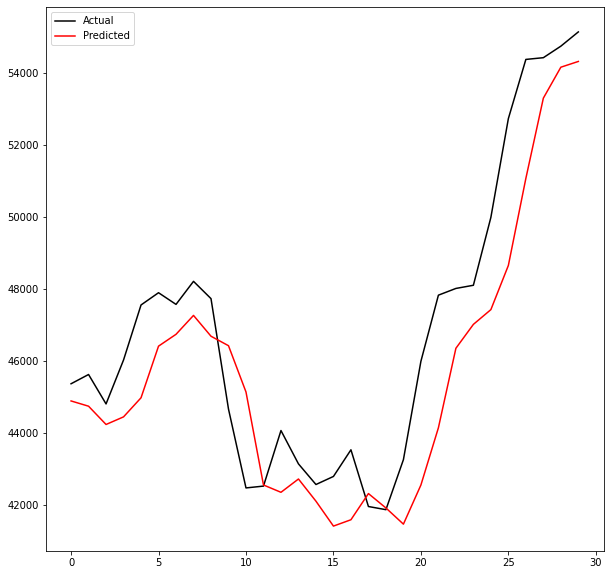

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'mediantransactionvalue14trxUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00453: early stopping
Training R-Squared: 0.9974836125182426

Testing R-Squared: 0.9961928726271511

30day Holdout R-Squared: 0.8049598692585183

30day Holdout MAE: 1397.9286458333333

30day Holdout MAPE: 2.9636728179319802

30day Holdout RMSE: 1764.2914370948195


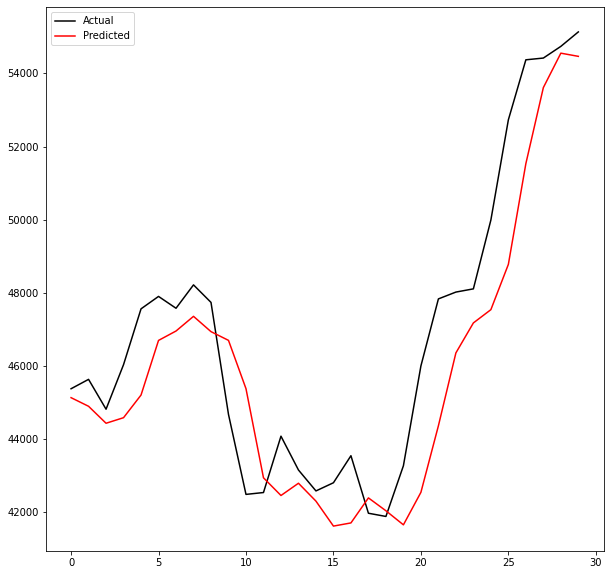

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'difficulty14wma']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00418: early stopping
Training R-Squared: 0.9973958493485003

Testing R-Squared: 0.997140942641

30day Holdout R-Squared: 0.8338253514206793

30day Holdout MAE: 1290.5385416666666

30day Holdout MAPE: 2.7981774258508665

30day Holdout RMSE: 1628.5110926077664


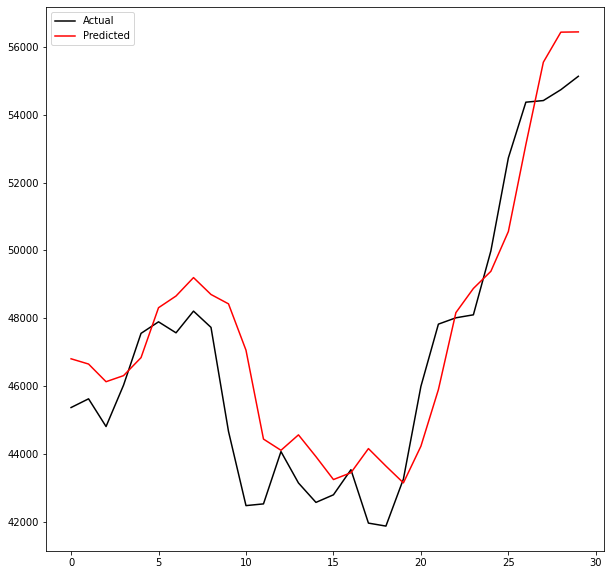

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'transactionvalue7smaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00570: early stopping
Training R-Squared: 0.9966652231119058

Testing R-Squared: 0.9960916963341676

30day Holdout R-Squared: 0.6866036191688121

30day Holdout MAE: 1931.2368489583334

30day Holdout MAPE: 4.2139011738841585

30day Holdout RMSE: 2236.4300806659026


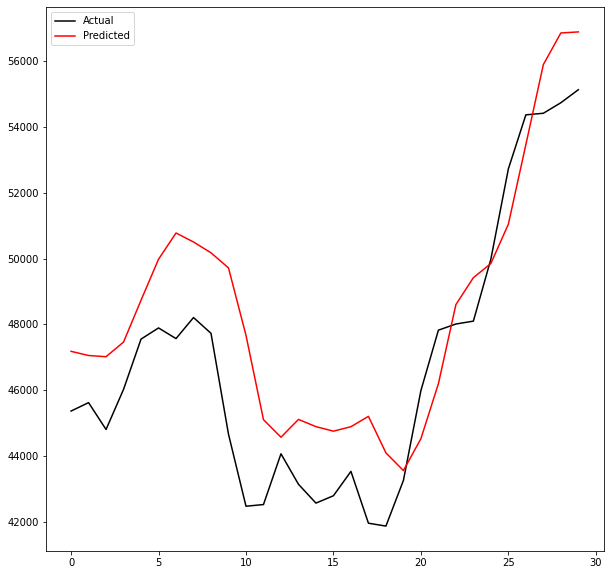

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'hashrate14wma']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00447: early stopping
Training R-Squared: 0.9979467970732908

Testing R-Squared: 0.9970458441811517

30day Holdout R-Squared: 0.8534406984983725

30day Holdout MAE: 1126.0921875

30day Holdout MAPE: 2.4098682291520275

30day Holdout RMSE: 1529.3786734769078


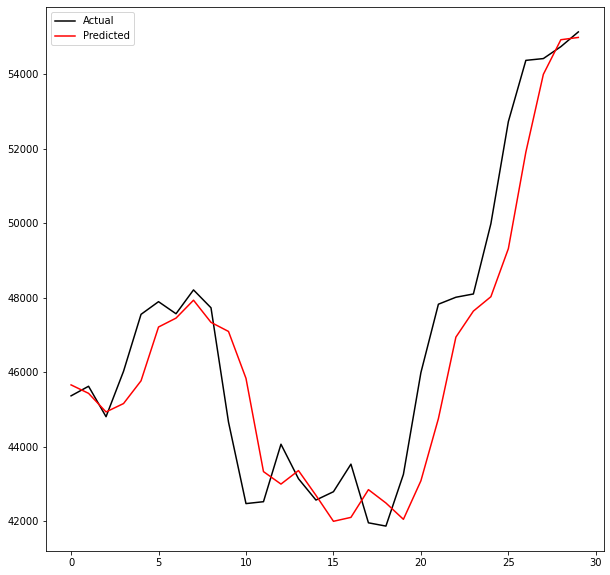

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'fee_to_reward90smaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00710: early stopping
Training R-Squared: 0.9977415984114855

Testing R-Squared: 0.9972067260699022

30day Holdout R-Squared: 0.8608428118698588

30day Holdout MAE: 1143.33984375

30day Holdout MAPE: 2.4704010714964553

30day Holdout RMSE: 1490.25696036327


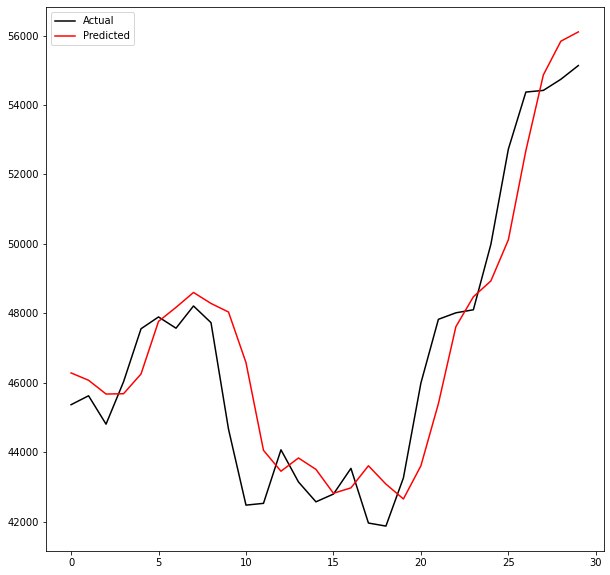

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'difficulty90ema']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00965: early stopping
Training R-Squared: 0.9979134033449479

Testing R-Squared: 0.9973816475869329

30day Holdout R-Squared: 0.86693944567307

30day Holdout MAE: 1057.7239583333333

30day Holdout MAPE: 2.2756237686345564

30day Holdout RMSE: 1457.2464324870855


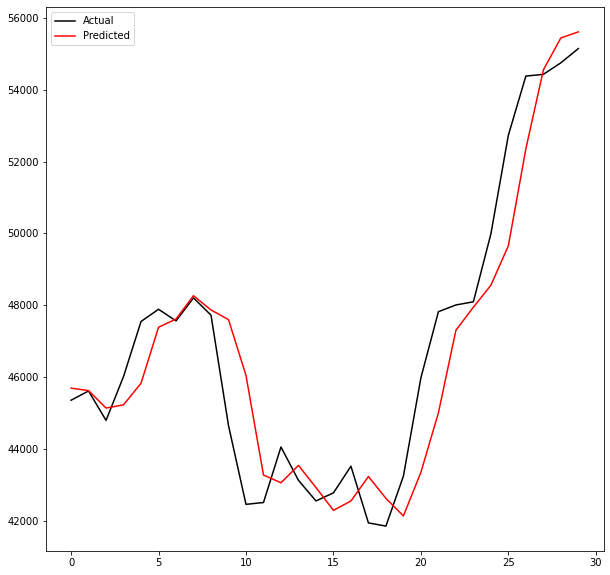

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'sentinusd90smaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00455: early stopping
Training R-Squared: 0.9975923401877282

Testing R-Squared: 0.9968448056792811

30day Holdout R-Squared: 0.8620561830868533

30day Holdout MAE: 1097.61796875

30day Holdout MAPE: 2.3721835983671813

30day Holdout RMSE: 1483.7456406865388


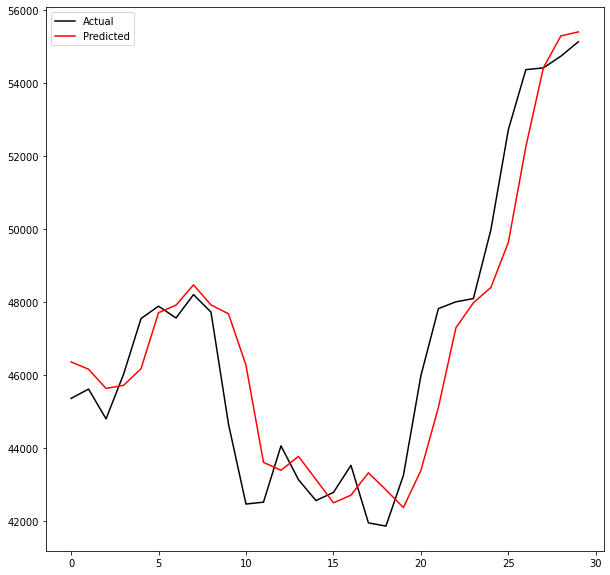

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'price3rsiUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00357: early stopping
Training R-Squared: 0.9980788346806273

Testing R-Squared: 0.99742255053172

30day Holdout R-Squared: 0.8928909004672476

30day Holdout MAE: 1017.6375

30day Holdout MAPE: 2.1952257090724085

30day Holdout RMSE: 1307.4392564291131


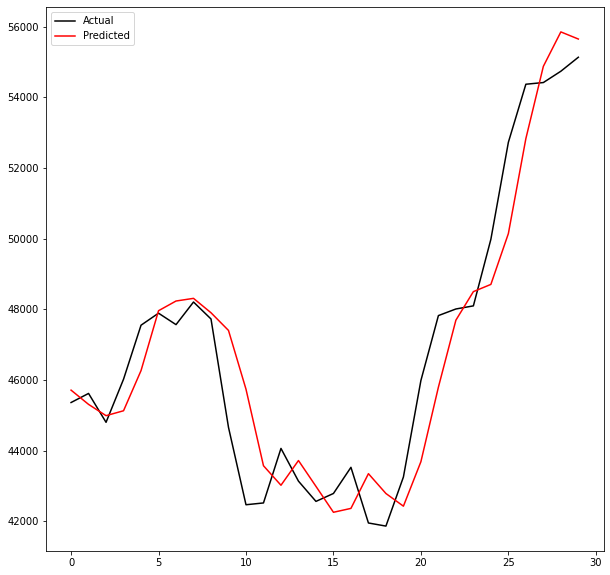

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'price3rsiUSD', 'sentinusd30emaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00361: early stopping
Training R-Squared: 0.9976056755256474

Testing R-Squared: 0.9973677450678267

30day Holdout R-Squared: 0.8829559372829981

30day Holdout MAE: 1063.5158854166666

30day Holdout MAPE: 2.306737942881195

30day Holdout RMSE: 1366.7309545332118


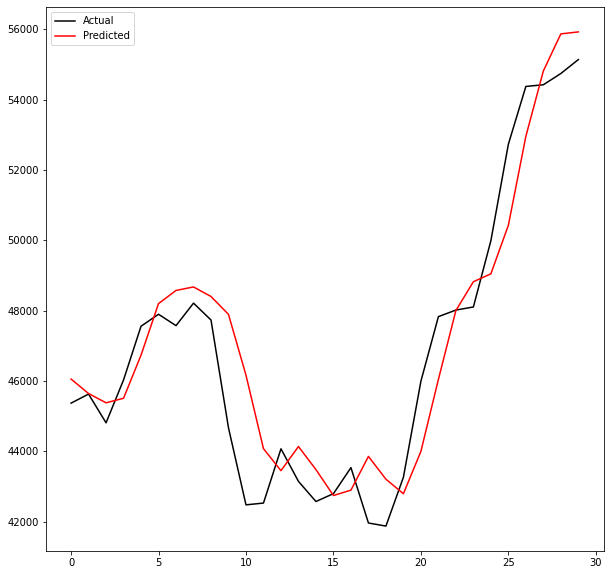

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'price3rsiUSD', 'mediantransactionvalue30wmaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00585: early stopping
Training R-Squared: 0.9976069214709022

Testing R-Squared: 0.9971290994901334

30day Holdout R-Squared: 0.8779839283004851

30day Holdout MAE: 1041.3067708333333

30day Holdout MAPE: 2.244191370724933

30day Holdout RMSE: 1395.4582770351694


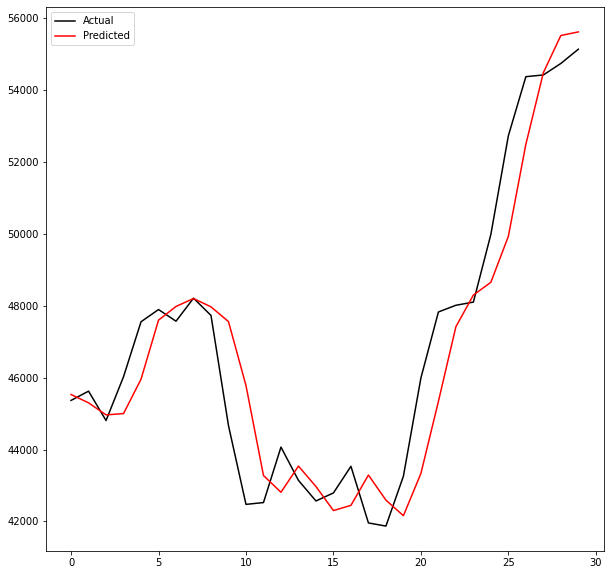

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'price3rsiUSD', 'mediantransactionvalue90smaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00773: early stopping
Training R-Squared: 0.9982580965361927

Testing R-Squared: 0.9976198701180509

30day Holdout R-Squared: 0.8839154502611825

30day Holdout MAE: 1075.0705729166666

30day Holdout MAPE: 2.312035003419894

30day Holdout RMSE: 1361.1172788038234


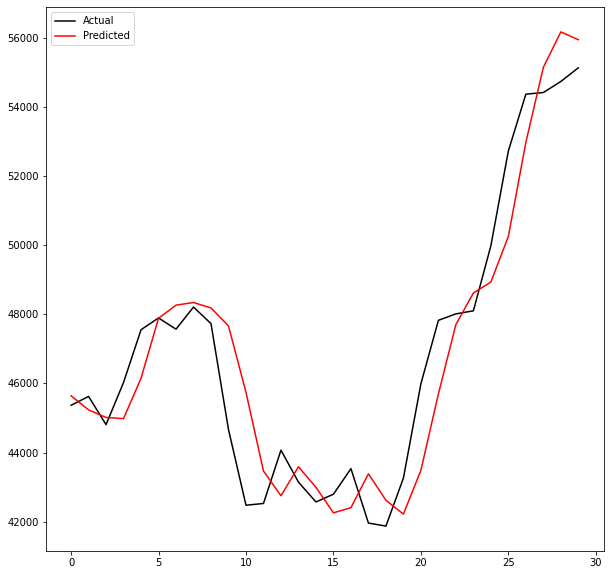

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'price3rsiUSD', 'activeaddresses30sma']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00562: early stopping
Training R-Squared: 0.997981863941095

Testing R-Squared: 0.9972221253047522

30day Holdout R-Squared: 0.8685353354530602

30day Holdout MAE: 1090.1029947916666

30day Holdout MAPE: 2.339451337485041

30day Holdout RMSE: 1448.4811752293485


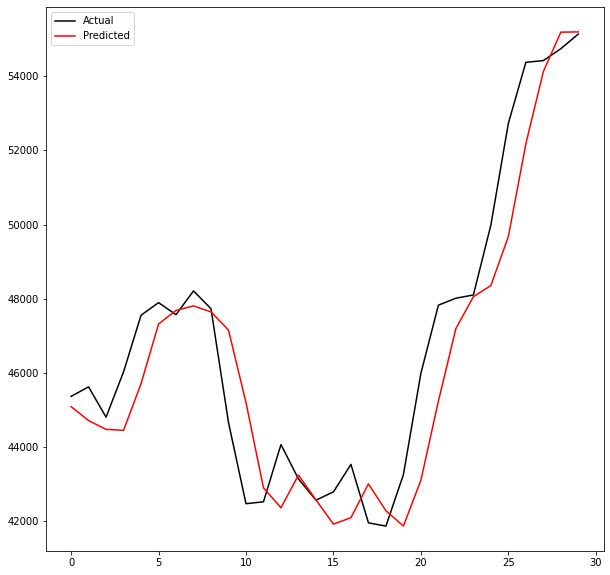

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'price3rsiUSD', 'price7rsiUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00603: early stopping
Training R-Squared: 0.9981438628868052

Testing R-Squared: 0.9972212157756039

30day Holdout R-Squared: 0.8907721428425073

30day Holdout MAE: 1050.6424479166667

30day Holdout MAPE: 2.2545075316840792

30day Holdout RMSE: 1320.3073575929195


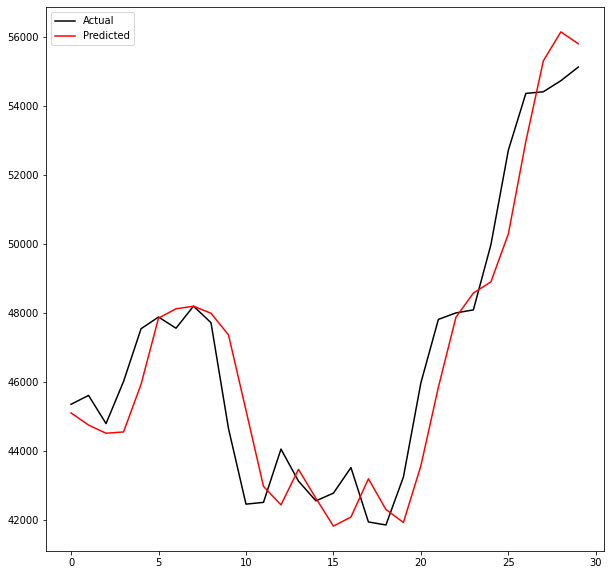

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'price3rsiUSD', 'mediantransactionvalue30smaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00419: early stopping
Training R-Squared: 0.9976544494483089

Testing R-Squared: 0.9966552441797978

30day Holdout R-Squared: 0.8727314788438565

30day Holdout MAE: 1150.1923177083333

30day Holdout MAPE: 2.4800019687697645

30day Holdout RMSE: 1425.1771001119305


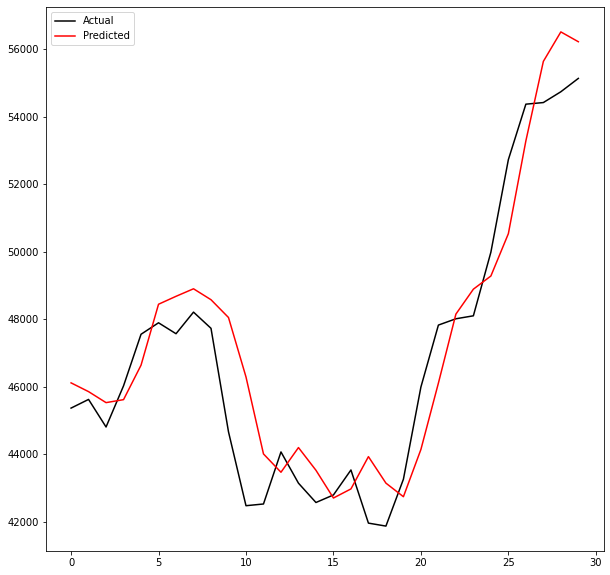

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'price3rsiUSD', 'top100cap30var']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00101: early stopping
Training R-Squared: -0.36031726194235114

Testing R-Squared: -0.3691120377146

30day Holdout R-Squared: -137.4280984959793

30day Holdout MAE: 46832.36666666667

30day Holdout MAPE: 100.0

30day Holdout RMSE: 47002.446444484856


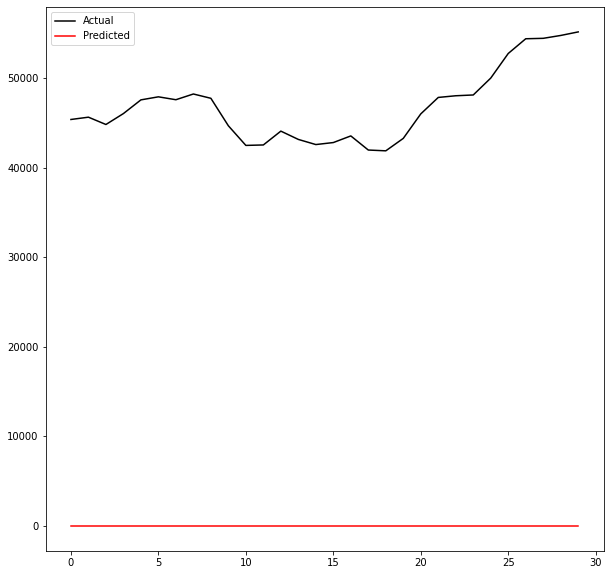

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'price3rsiUSD', 'sentinusd14rocUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00898: early stopping
Training R-Squared: 0.997906350632245

Testing R-Squared: 0.9971162288602626

30day Holdout R-Squared: 0.8275127739406546

30day Holdout MAE: 1337.8938802083333

30day Holdout MAPE: 2.8624121124830655

30day Holdout RMSE: 1659.1544093533428


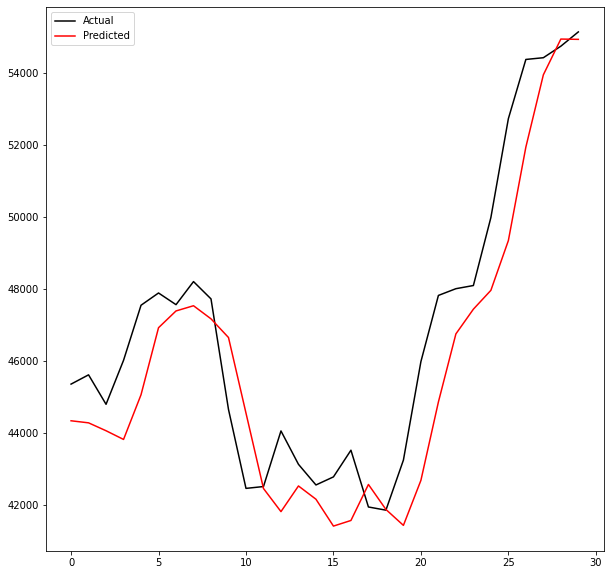

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'price3rsiUSD', 'price90varUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00480: early stopping
Training R-Squared: 0.9978236353403318

Testing R-Squared: 0.9969954317418155

30day Holdout R-Squared: 0.804876220435855

30day Holdout MAE: 1425.68984375

30day Holdout MAPE: 3.1019955261204193

30day Holdout RMSE: 1764.6697312457534


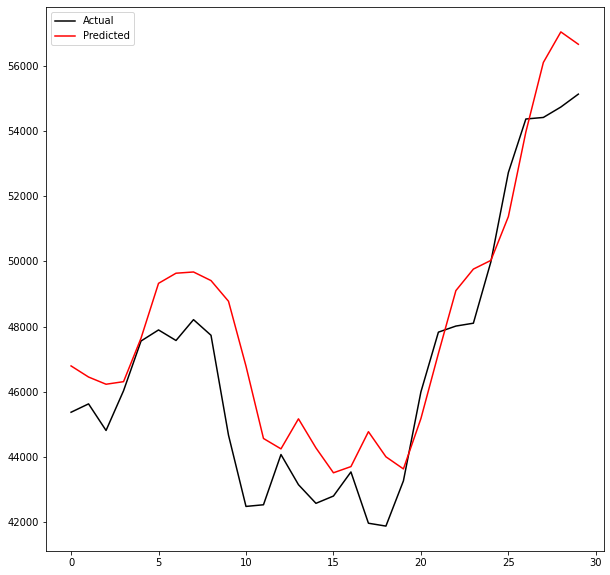

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'price3rsiUSD', 'transactionvalue90varUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00409: early stopping
Training R-Squared: 0.9978323984175612

Testing R-Squared: 0.9970360863660939

30day Holdout R-Squared: -82.73130178051238

30day Holdout MAE: 35193.96966145833

30day Holdout MAPE: 76.20981730465357

30day Holdout RMSE: 36555.46041870214


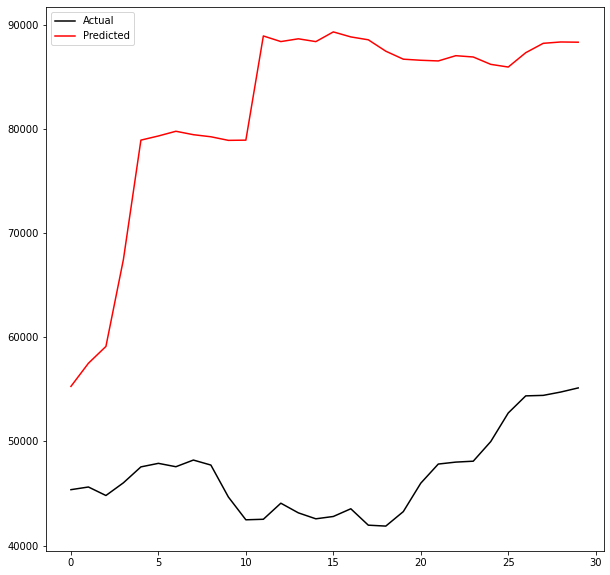

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'price3rsiUSD', 'transactionfees90smaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00538: early stopping
Training R-Squared: 0.9975079476584812

Testing R-Squared: 0.9964553565067668

30day Holdout R-Squared: 0.8881885174600591

30day Holdout MAE: 1012.7708333333334

30day Holdout MAPE: 2.1915335546603485

30day Holdout RMSE: 1335.831067240493


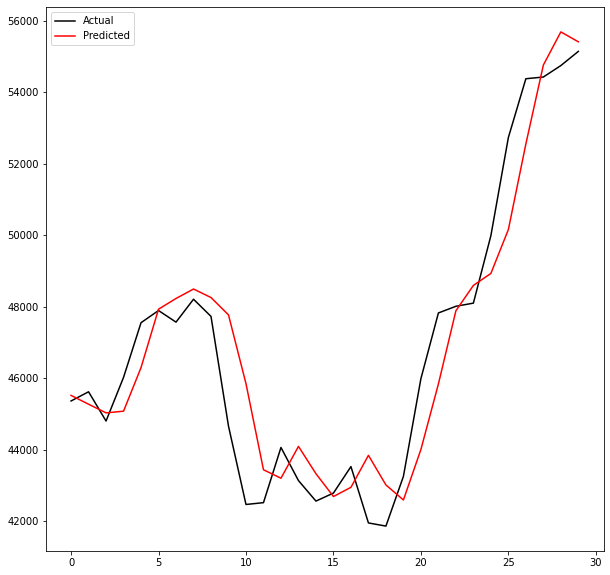

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'price3rsiUSD', 'mediantransactionvalue30emaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00462: early stopping
Training R-Squared: 0.9979706624418735

Testing R-Squared: 0.9972557003059888

30day Holdout R-Squared: 0.8760360905180448

30day Holdout MAE: 1145.8278645833334

30day Holdout MAPE: 2.47006586983128

30day Holdout RMSE: 1406.5525704234692


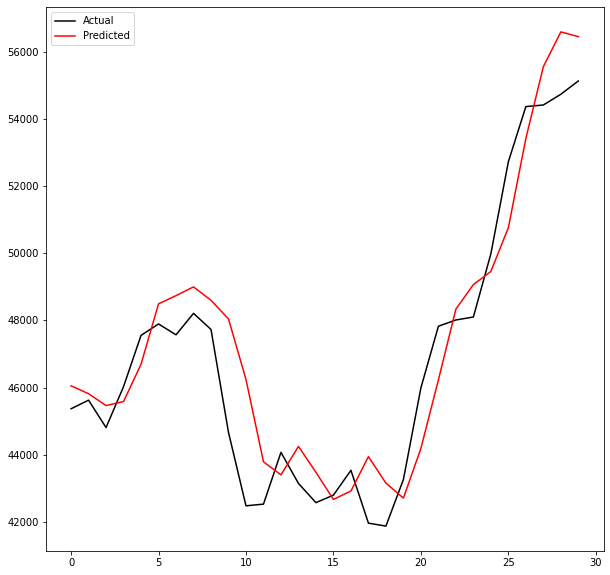

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'price3rsiUSD', 'top100cap30std']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00898: early stopping
Training R-Squared: 0.9974679522615122

Testing R-Squared: 0.9962073320921259

30day Holdout R-Squared: 0.8399504026921687

30day Holdout MAE: 1290.60859375

30day Holdout MAPE: 2.763783577379927

30day Holdout RMSE: 1598.2165716729673


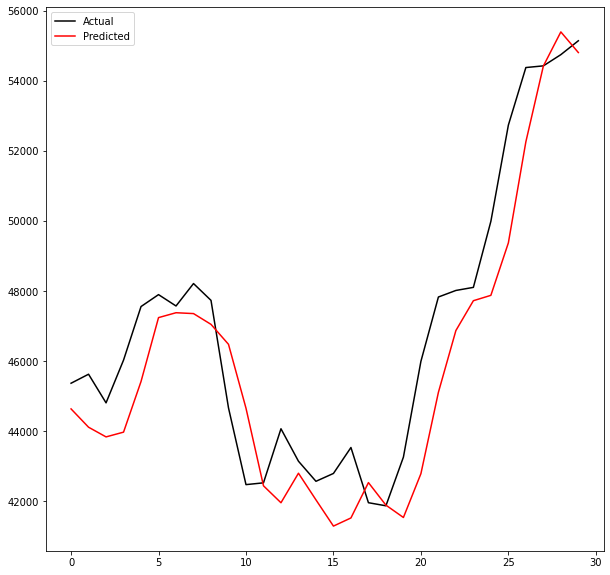

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'price3rsiUSD', 'transactionvalue14wmaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00735: early stopping
Training R-Squared: 0.9979236872129591

Testing R-Squared: 0.9969404096308111

30day Holdout R-Squared: 0.8655292162382204

30day Holdout MAE: 1092.50859375

30day Holdout MAPE: 2.356052342478149

30day Holdout RMSE: 1464.9483221306016


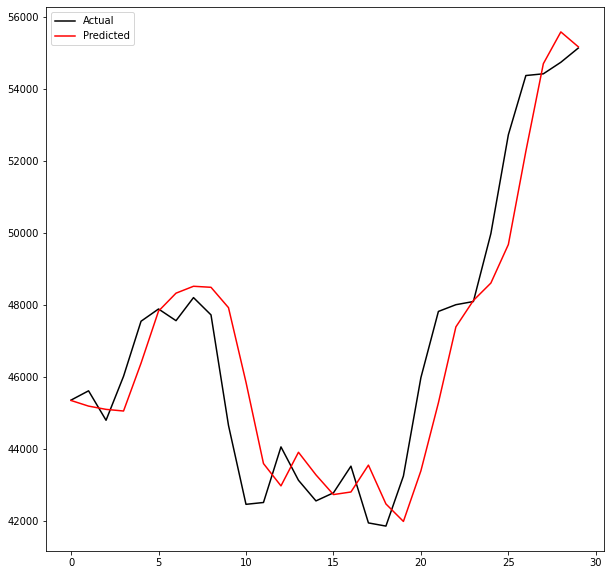

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'price3rsiUSD', 'hashrate7trx']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00569: early stopping
Training R-Squared: 0.9973869002490597

Testing R-Squared: 0.9970620247246736

30day Holdout R-Squared: 0.8502918080973264

30day Holdout MAE: 1238.65546875

30day Holdout MAPE: 2.677719950975099

30day Holdout RMSE: 1545.7210425782912


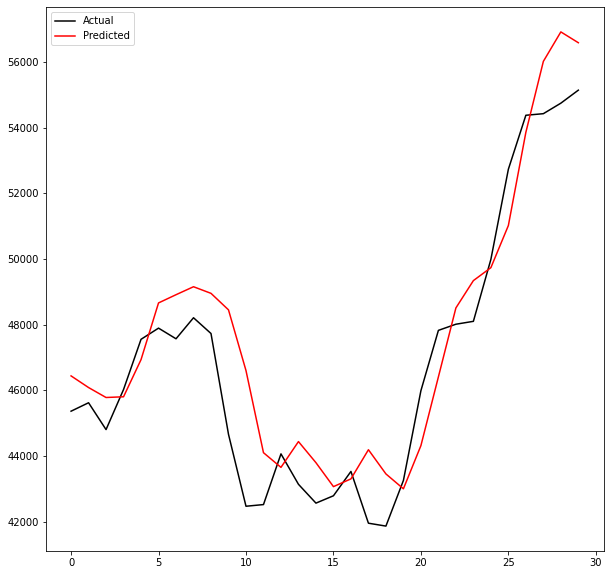

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'price3rsiUSD', 'sentbyaddress90std']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00826: early stopping
Training R-Squared: 0.9981611953481094

Testing R-Squared: 0.9970626264391457

30day Holdout R-Squared: 0.8898324338764454

30day Holdout MAE: 1045.2841145833333

30day Holdout MAPE: 2.2449363872435955

30day Holdout RMSE: 1325.9746278497848


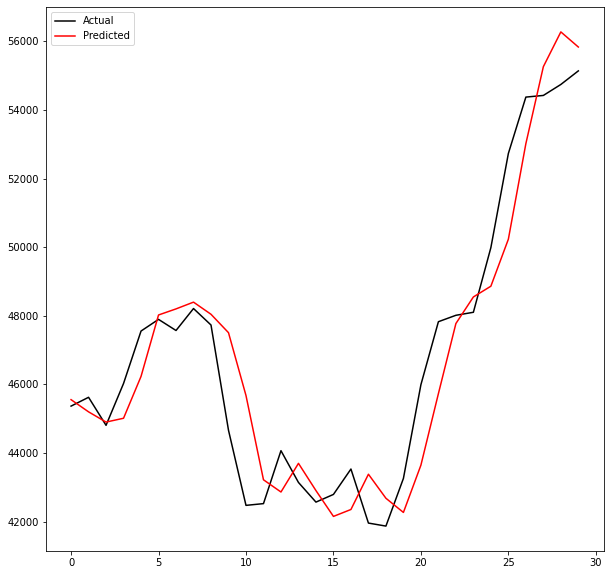

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'price3rsiUSD', 'hashrate30std']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00459: early stopping
Training R-Squared: 0.9975533072502827

Testing R-Squared: 0.9973203774887169

30day Holdout R-Squared: 0.8522228863768792

30day Holdout MAE: 1237.1569010416667

30day Holdout MAPE: 2.6859108561012923

30day Holdout RMSE: 1535.7195976904804


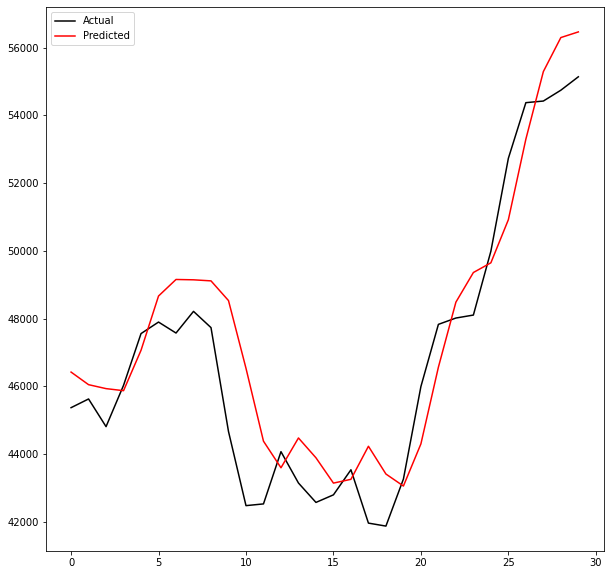

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'price3rsiUSD', 'fee_to_reward30varUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00872: early stopping
Training R-Squared: 0.997732692935928

Testing R-Squared: 0.9970187714884703

30day Holdout R-Squared: 0.8552791219778537

30day Holdout MAE: 1221.7071614583333

30day Holdout MAPE: 2.6365500318411192

30day Holdout RMSE: 1519.7562250405488


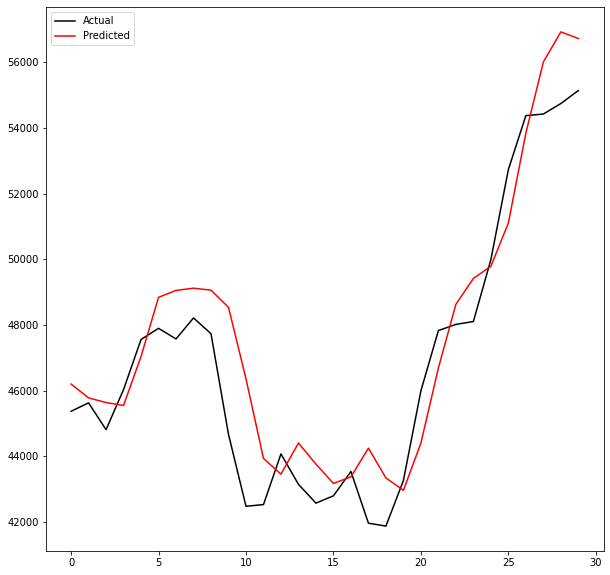

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'price3rsiUSD', 'size90std']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00563: early stopping
Training R-Squared: 0.9974592082337294

Testing R-Squared: 0.9961758142656741

30day Holdout R-Squared: 0.8663199306688387

30day Holdout MAE: 1125.7856770833334

30day Holdout MAPE: 2.4129637770856394

30day Holdout RMSE: 1460.6348809115473


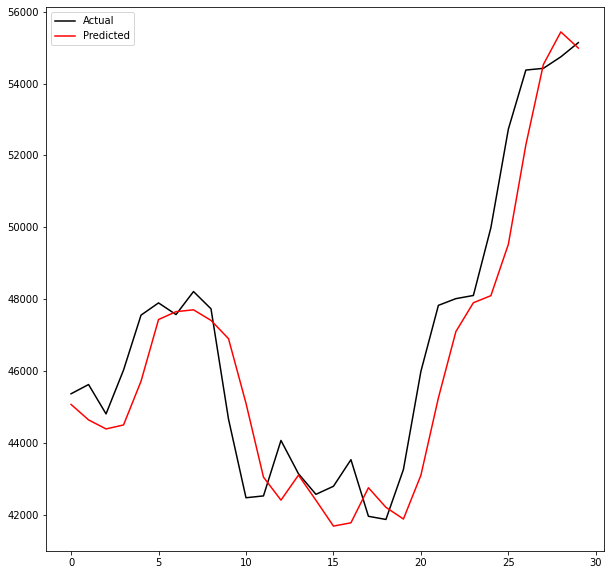

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'price3rsiUSD', 'top100cap3std']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00340: early stopping
Training R-Squared: 0.9974806857564328

Testing R-Squared: 0.9971724592405513

30day Holdout R-Squared: 0.859389119559562

30day Holdout MAE: 1188.05859375

30day Holdout MAPE: 2.5813862039922095

30day Holdout RMSE: 1498.0206510671205


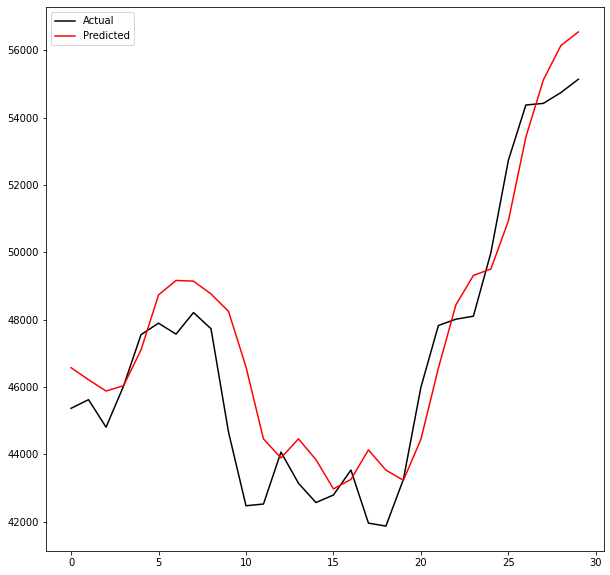

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'price3rsiUSD', 'transactionvalue14emaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00532: early stopping
Training R-Squared: 0.9978824982277037

Testing R-Squared: 0.9968357061695077

30day Holdout R-Squared: 0.8383598709417442

30day Holdout MAE: 1275.6924479166667

30day Holdout MAPE: 2.7617922203155874

30day Holdout RMSE: 1606.1382720716374


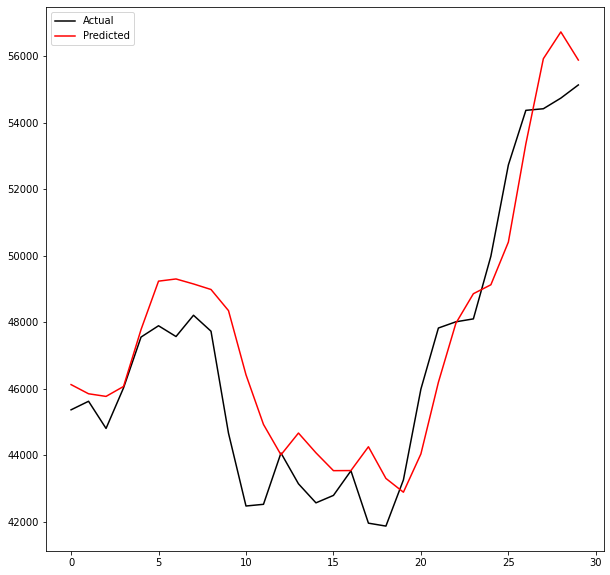

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'price3rsiUSD', 'sentinusd14momUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00544: early stopping
Training R-Squared: 0.9980573117294198

Testing R-Squared: 0.9967047110990339

30day Holdout R-Squared: 0.16401576146747643

30day Holdout MAE: 2339.463346354167

30day Holdout MAPE: 5.2346384319796835

30day Holdout RMSE: 3652.6442940388742


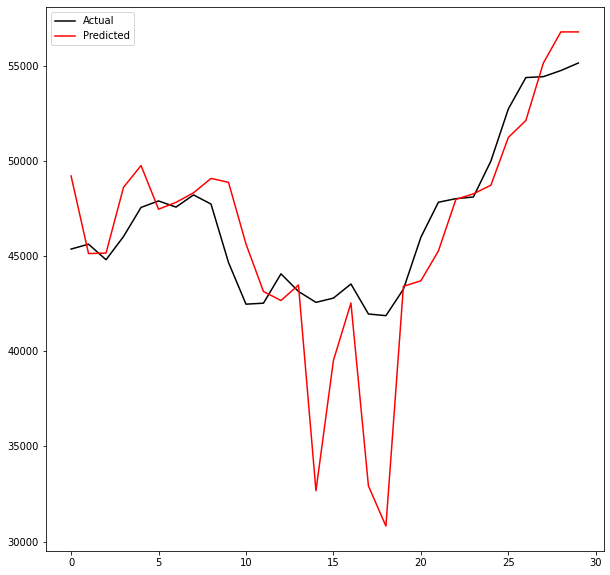

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'price3rsiUSD', 'confirmationtime7std']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00447: early stopping
Training R-Squared: 0.9981161029366658

Testing R-Squared: 0.9976162403558565

30day Holdout R-Squared: 0.8931710106312222

30day Holdout MAE: 1011.9609375

30day Holdout MAPE: 2.185809729140755

30day Holdout RMSE: 1305.728539143632


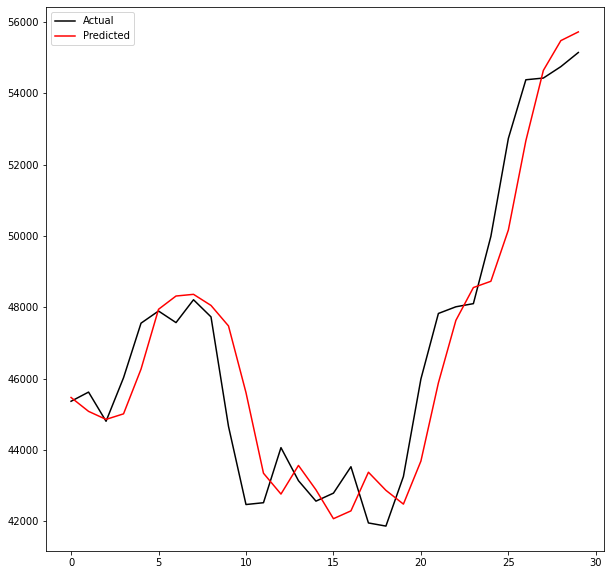

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'price3rsiUSD', 'confirmationtime7std', 'top100cap7trx']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00585: early stopping
Training R-Squared: 0.9977560919495221

Testing R-Squared: 0.9969684693454719

30day Holdout R-Squared: 0.8457949930692825

30day Holdout MAE: 1232.6352864583334

30day Holdout MAPE: 2.6404070442591645

30day Holdout RMSE: 1568.7638541092203


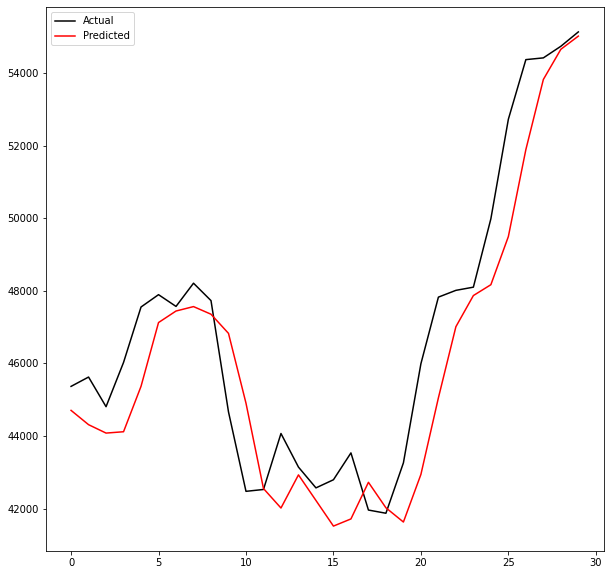

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'price3rsiUSD', 'confirmationtime7std', 'top100cap7roc']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00405: early stopping
Training R-Squared: 0.9976824189100182

Testing R-Squared: 0.9969164139189233

30day Holdout R-Squared: 0.8397138791431773

30day Holdout MAE: 1266.6873697916667

30day Holdout MAPE: 2.693274191504379

30day Holdout RMSE: 1599.3970691742302


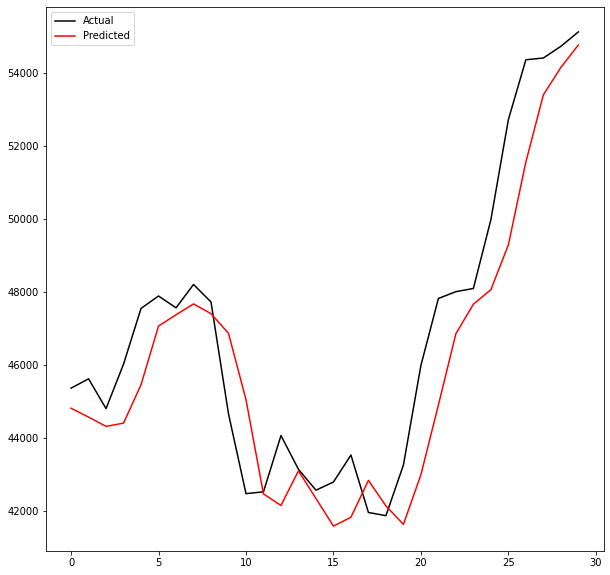

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'price3rsiUSD', 'confirmationtime7std', 'transactionfees7trxUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00485: early stopping
Training R-Squared: 0.9969402423955815

Testing R-Squared: 0.9967330872638726

30day Holdout R-Squared: 0.7961162854016284

30day Holdout MAE: 1449.866015625

30day Holdout MAPE: 3.147923073307225

30day Holdout RMSE: 1803.8466132269093


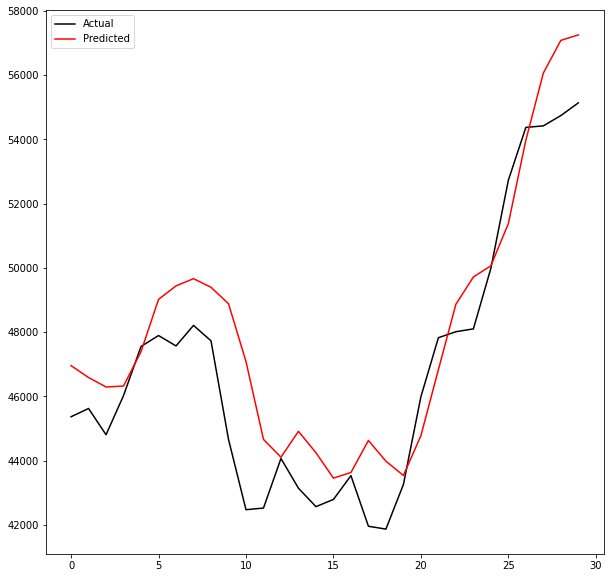

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'price3rsiUSD', 'confirmationtime7std', 'top100cap14roc']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00601: early stopping
Training R-Squared: 0.9979062959465509

Testing R-Squared: 0.9972051348602777

30day Holdout R-Squared: 0.8803367041286084

30day Holdout MAE: 1045.54921875

30day Holdout MAPE: 2.2596598758713116

30day Holdout RMSE: 1381.9388201342324


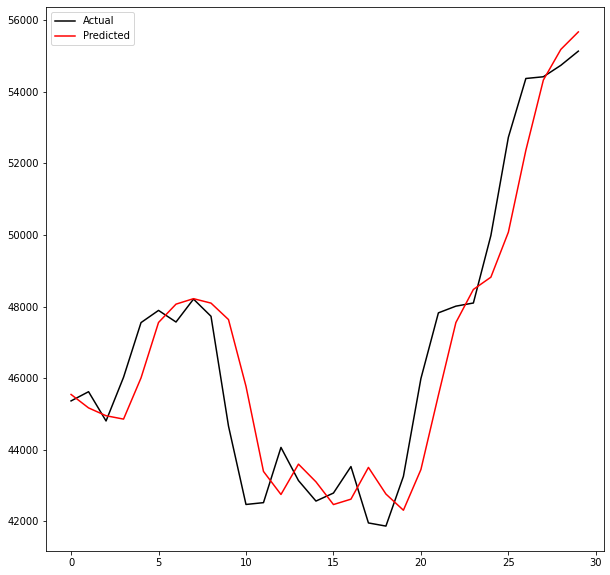

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'price3rsiUSD', 'confirmationtime7std', 'sentbyaddress90trx']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00606: early stopping
Training R-Squared: 0.9976800178654508

Testing R-Squared: 0.9973989617156583

30day Holdout R-Squared: 0.8578525956986385

30day Holdout MAE: 1222.0634114583333

30day Holdout MAPE: 2.6370300141383813

30day Holdout RMSE: 1506.1832147285593


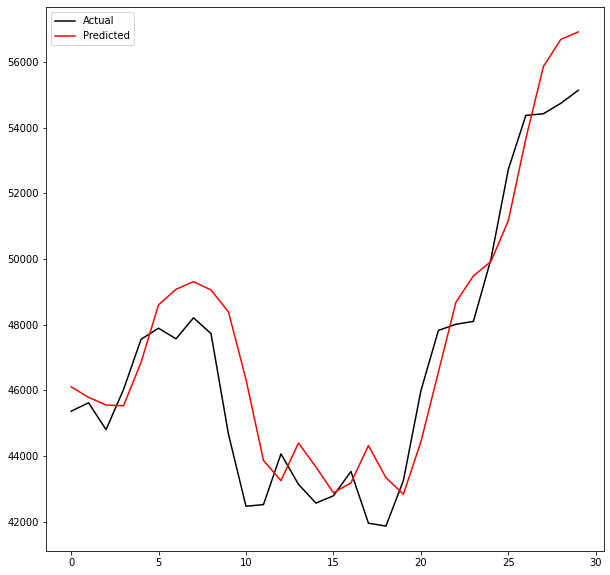

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'price3rsiUSD', 'confirmationtime7std', 'transactions30std']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00456: early stopping
Training R-Squared: 0.9970671959458826

Testing R-Squared: 0.9966405344636162

30day Holdout R-Squared: 0.879210754546667

30day Holdout MAE: 1062.03359375

30day Holdout MAPE: 2.29924090576919

30day Holdout RMSE: 1388.4251463590813


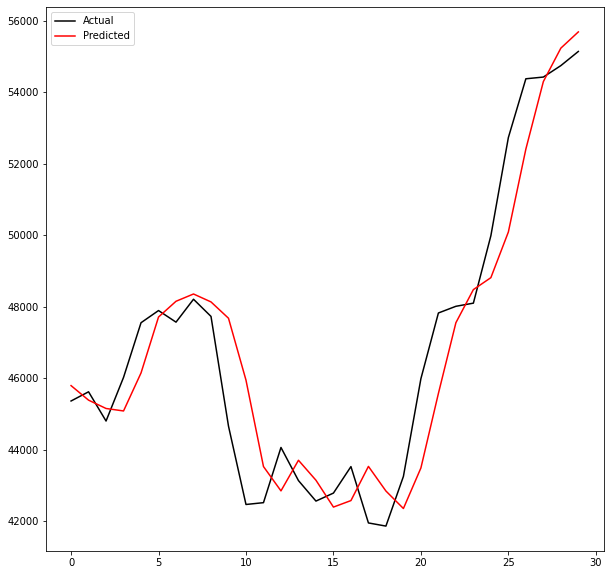

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'price3rsiUSD', 'confirmationtime7std', 'price3trxUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00620: early stopping
Training R-Squared: 0.9978813633353149

Testing R-Squared: 0.9964140457773484

30day Holdout R-Squared: 0.8431178193955361

30day Holdout MAE: 1255.4641927083333

30day Holdout MAPE: 2.6848337511950704

30day Holdout RMSE: 1582.3230158979297


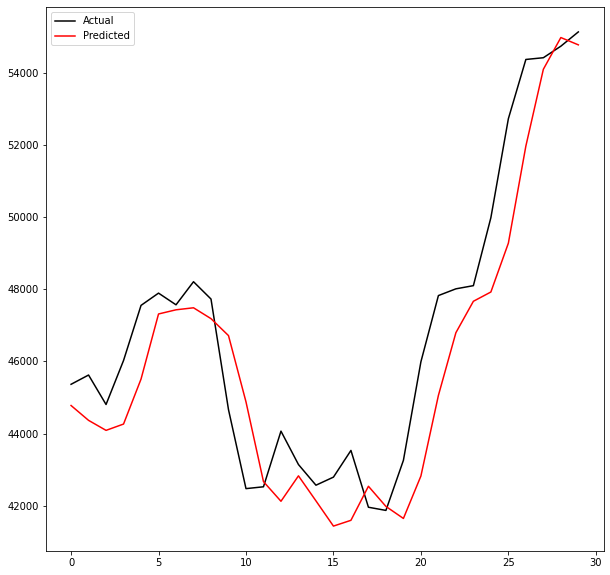

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'price3rsiUSD', 'confirmationtime7std', 'transactions30var']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00101: early stopping
Training R-Squared: -0.36031726194235114

Testing R-Squared: -0.3691120377549306

30day Holdout R-Squared: -137.4280984959793

30day Holdout MAE: 46832.36666666667

30day Holdout MAPE: 100.0

30day Holdout RMSE: 47002.446444484856


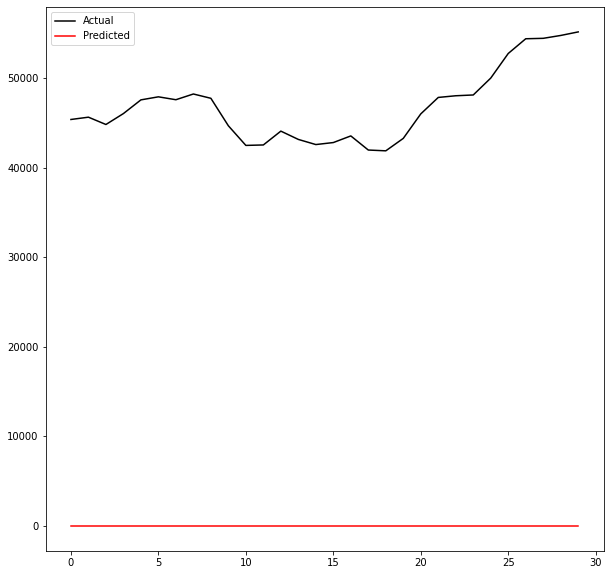

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'price3rsiUSD', 'confirmationtime7std', 'sentinusd7smaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00963: early stopping
Training R-Squared: 0.9973321846055344

Testing R-Squared: 0.9963802984095937

30day Holdout R-Squared: 0.866533617323862

30day Holdout MAE: 1183.51328125

30day Holdout MAPE: 2.545848769785332

30day Holdout RMSE: 1459.4670066990855


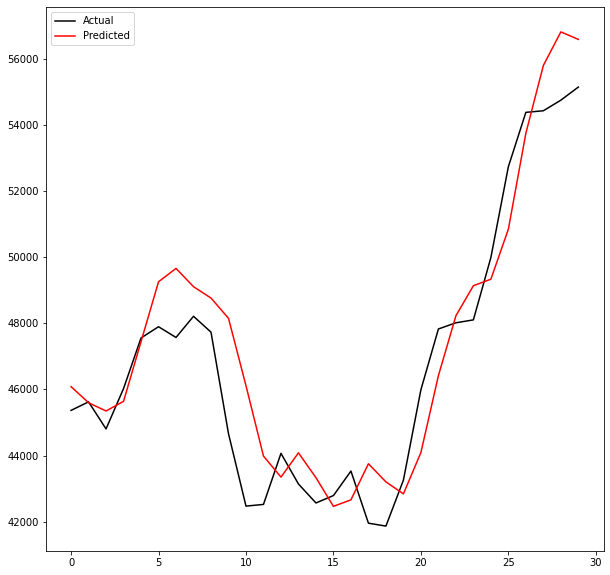

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'price3rsiUSD', 'confirmationtime7std', 'fee_to_reward90wmaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00418: early stopping
Training R-Squared: 0.9980913739121868

Testing R-Squared: 0.997289513069258

30day Holdout R-Squared: 0.8915186875238517

30day Holdout MAE: 1005.3740885416667

30day Holdout MAPE: 2.1759996859523922

30day Holdout RMSE: 1315.7876387232009


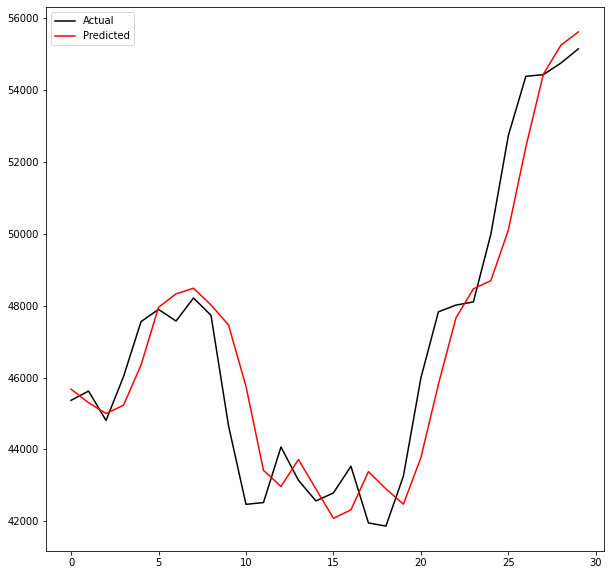

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'price3rsiUSD', 'confirmationtime7std', 'difficulty90mom']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00523: early stopping
Training R-Squared: 0.9978753177295406

Testing R-Squared: 0.9973201434103988

30day Holdout R-Squared: 0.8732760270081159

30day Holdout MAE: 1164.53671875

30day Holdout MAPE: 2.504328045969625

30day Holdout RMSE: 1422.1248547305624


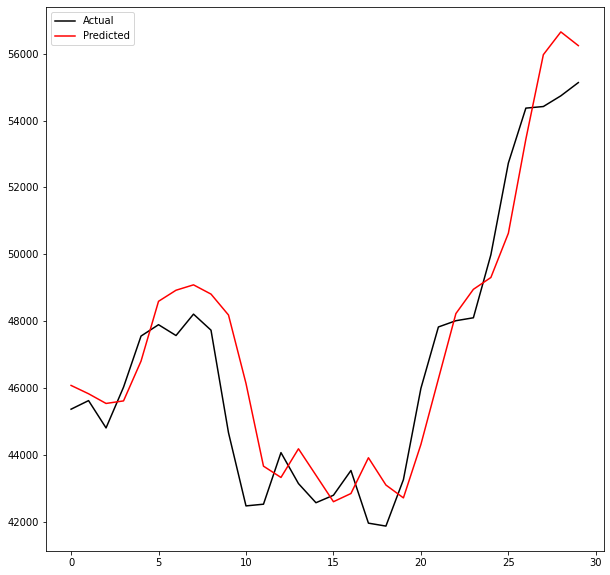

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'price3rsiUSD', 'confirmationtime7std', 'difficulty30trx']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00364: early stopping
Training R-Squared: 0.9978540679546877

Testing R-Squared: 0.9971218253464358

30day Holdout R-Squared: 0.8840113233243578

30day Holdout MAE: 1033.1032552083334

30day Holdout MAPE: 2.2369960744507296

30day Holdout RMSE: 1360.5550961627828


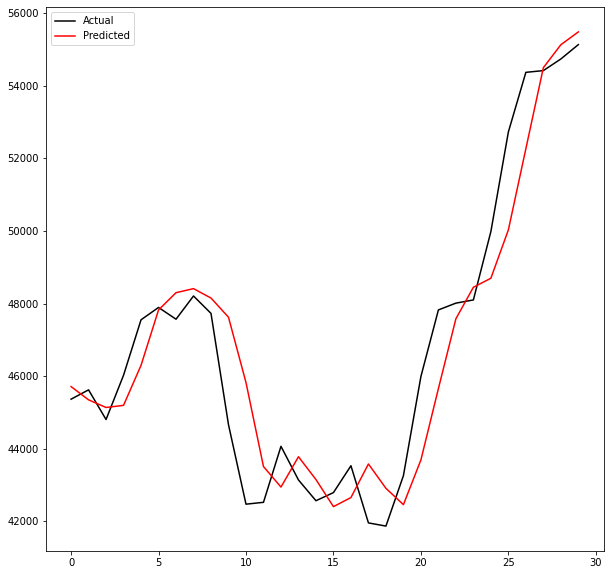

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'price3rsiUSD', 'confirmationtime7std', 'top100cap90ema']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00492: early stopping
Training R-Squared: 0.9976585812058663

Testing R-Squared: 0.9962426523711948

30day Holdout R-Squared: 0.870256238803945

30day Holdout MAE: 1090.67265625

30day Holdout MAPE: 2.340395930007723

30day Holdout RMSE: 1438.969465585412


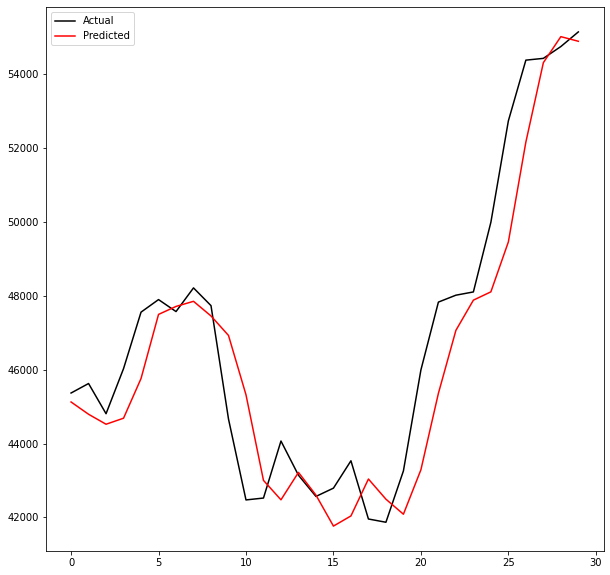

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'price3rsiUSD', 'confirmationtime7std', 'transactionfees90trxUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00728: early stopping
Training R-Squared: 0.9972478535573241

Testing R-Squared: 0.9960784556290857

30day Holdout R-Squared: 0.7821348192556247

30day Holdout MAE: 1588.6725260416667

30day Holdout MAPE: 3.3887635569250403

30day Holdout RMSE: 1864.6711434194765


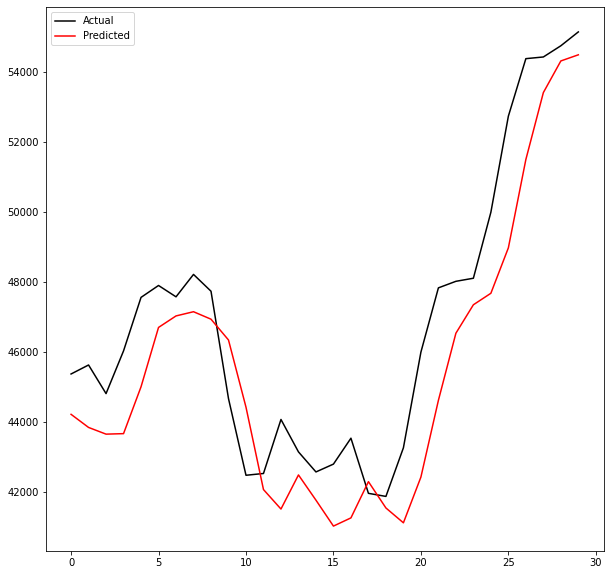

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'price3rsiUSD', 'confirmationtime7std', 'size90var']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00621: early stopping
Training R-Squared: 0.997931107362666

Testing R-Squared: 0.9975709964615194

30day Holdout R-Squared: 0.8744961427194058

30day Holdout MAE: 1132.5942708333334

30day Holdout MAPE: 2.446982622669071

30day Holdout RMSE: 1415.2620897477632


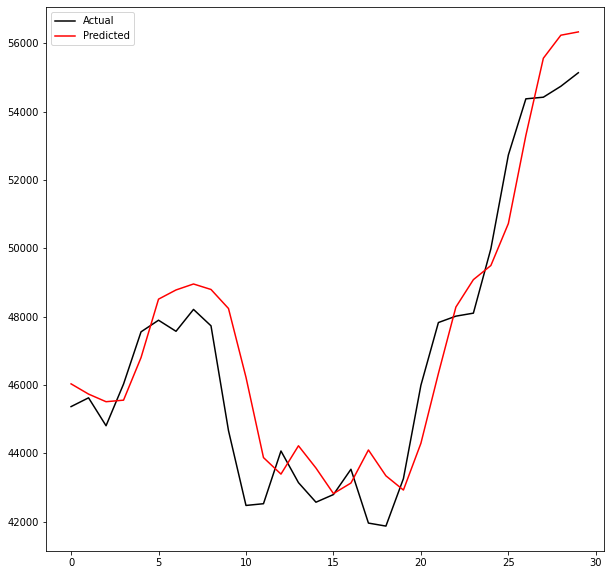

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'price3rsiUSD', 'confirmationtime7std', 'top100cap7std']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00101: early stopping
Training R-Squared: -0.36031726194235114

Testing R-Squared: -0.3691120377549306

30day Holdout R-Squared: -137.4280984959793

30day Holdout MAE: 46832.36666666667

30day Holdout MAPE: 100.0

30day Holdout RMSE: 47002.446444484856


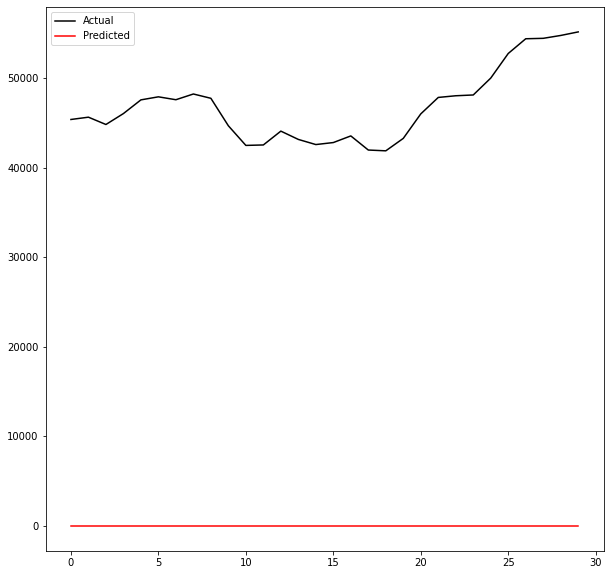

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'price3rsiUSD', 'confirmationtime7std', 'transactionvalue90stdUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00552: early stopping
Training R-Squared: 0.9981029972949502

Testing R-Squared: 0.9975028963245957

30day Holdout R-Squared: 0.7481430347891904

30day Holdout MAE: 1637.5212239583334

30day Holdout MAPE: 3.601605766108682

30day Holdout RMSE: 2004.8658557892531


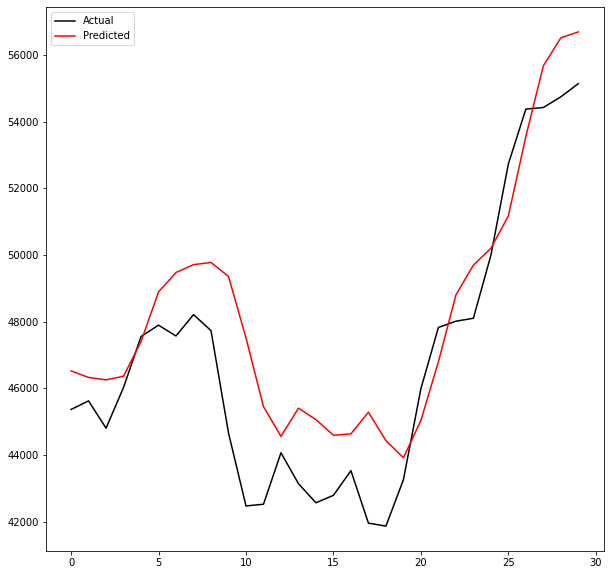

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap30trx', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD', 'price30emaUSD', 'hashrate30sma', 'difficulty30sma', 'price3rsiUSD', 'confirmationtime7std', 'price3rocUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00748: early stopping
Training R-Squared: 0.9980287707124565

Testing R-Squared: 0.9968319324022169

30day Holdout R-Squared: 0.8895762133780902

30day Holdout MAE: 1019.5209635416667

30day Holdout MAPE: 2.191821980022023

30day Holdout RMSE: 1327.5156647626138


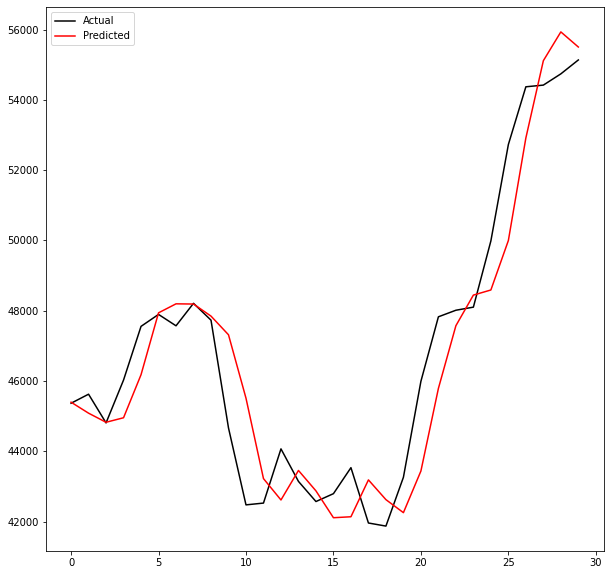

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001


In [193]:
# set a variable for the max R squared
r_sq_max = 0

# iterate through the features to add to the columns list
for feat in features_cols:
    cols.append(feat)
    print(cols[1:])

    # update X with the new features
    new_X = X[cols]
    r_sq = interval4_ann_model_nextday(new_X, y, lr=l, activation=act, neurons=neuron, opt=op, batch_size=64, epochs=5000)
    
    if r_sq > r_sq_max:
        r_sq_max = r_sq
    
    elif r_sq < r_sq_max:
        cols = cols[:-1]

## Compare to a Benchmark
For a comparison, use the current day price as the prediction for the next day price. See how that model scores for R-squared

In [12]:
# compare to the prediction of simply taking the current price values
y_df = pd.DataFrame(y)

# create a new column with the values of the current price
y_df['price'] = y_df.shift(1)
y_df = y_df.dropna()
y_df.tail()

,next_day_price,price
4098,52731.0,49987.0
4099,54374.0,52731.0
4100,54422.0,54374.0
4101,54742.0,54422.0
4102,55138.0,54742.0


In [13]:
# take the final 30 days of values
y_final = y_df.iloc[-30:, :]
y_final

,next_day_price,price
4073,45367.0,45928.0
4074,45624.0,45367.0
4075,44807.0,45624.0
4076,46027.0,44807.0
4077,47555.0,46027.0
4078,47895.0,47555.0
4079,47571.0,47895.0
4080,48211.0,47571.0
4081,47731.0,48211.0
4082,44664.0,47731.0


In [16]:
y_true = y_final['next_day_price']
y_pred = y_final['price']

# view the r2_score and the MAPE score
r2 = r2_score(y_true, y_pred)
mape = mean_absolute_percentage_error(y_true, y_pred)

print('MAPE score:', mape)
print('R-squared:', r2)

MAPE score: 2.182828694315373
R-squared: 0.8883824411704581


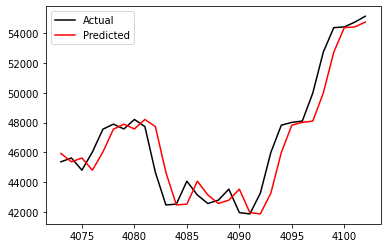

In [18]:
plt.plot(y_true.index, y_true, color='black', label='Actual')
plt.plot(y_pred.index, y_pred, color='red', label='Predicted')
plt.legend()
plt.show()

## Concluding Analysis
The best model from this notebook is using ANN with 4 hidden layers, 300 neurons per layer, learning rate of 0.0001, optimizer of RMSprop, activation function of relu, 64 batch size, and using Interval 4 date range of April 1, 2013 to September 1, 2021.

The metrics from this model are only slightly better for the R-squared than the benchmark of using the current price as the next day prediction. And slightly worse for the MAPE score.

**ANN Model R-squared: 0.893 - Benchmark R-squared: 0.888**

**ANN Model MAPE: 2.1858 - Benchmark MAPE: 2.1828**